In [1]:
from F1_library import libraryF1dataNotebook as libraryDataF1
import pandas as pd
import fastf1 as ff1

# FORMULA 1 HEINEKEN CHINESE GRAND PRIX 2025
The Chinese Grand Prix (Chinese: 中国大奖赛; pinyin: Zhōngguó Dàjiǎngsài) is a round of the Formula One World Championship. The event was held every year from 2004 until 2019 and is contracted to be held until 2025.[1] The event was contracted to take place from 2020 to 2023, but was cancelled each of those years as a consequence of the COVID-19 pandemic in China.

It is currently held at the Shanghai International Circuit, Jiading, Shanghai. Designed by Hermann Tilke and opened in 2004, the US240 million Shanghai course was the most expensive Formula One circuit facility[2] until the $6 billion Abu Dhabi course opened five years later.[3] The 5.451 km (3.387 mi) track features one of the trickiest corner combinations on the Formula One calendar: Turn 1 and 2, a demanding 270-degree, right-handed corner combination whose radius decreases as the corner progresses. Source: Wikipedia

In [2]:
session = ff1.get_session(2025, 2, 'FP1')
session.load()

lap = session.laps.pick_fastest()
pos = lap.get_pos_data()

circuit_info = session.get_circuit_info()

req         WARNING 	DEFAULT CACHE ENABLED! (3.22 GB) /home/frank/.cache/fastf1
core           INFO 	Loading data for Chinese Grand Prix - Practice 1 [v3.3.0]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
core        WARNING 	No result data for this session available on Ergast! (This is expected for recent sessions)
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '4', '5', '6', '7', '10', '

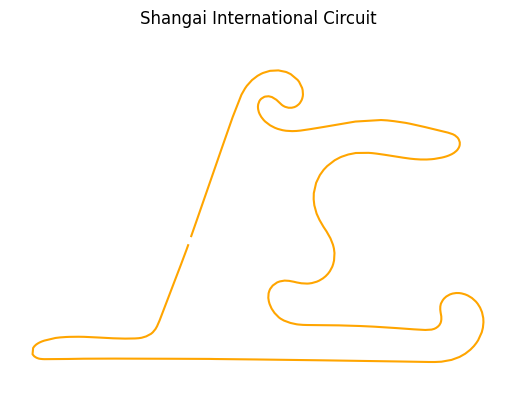

In [3]:
libraryDataF1.draw_track(circuit_info,pos,"Shangai International Circuit")

## Upgrades
In this section those upgrades brought by the teams will be shown.
<table>
<tr>
    <td>
    Team
    </td>
    <td>
    Updated component
    </td>
    <td>
    Upgrade type
    </td>
</tr>

<tr>
    <td>
    McLaren
    </td>
    <td>
    Rear corner
    </td>
    <td>
    Performance
    </td>
</tr>


<tr>
    <td>
    Racing Bulls
    </td>
    <td>
    Front wing
    </td>
    <td>
    Circuit specific
    </td>
</tr>
<tr>
    <td>
    RB
    </td>
    <td>
    Beam wing
    </td>
    <td>
    Circuit specific
    </td>
</tr>

<tr>
    <td>
    Williams
    </td>
    <td>
    Rear beam wing
    </td>
    <td>
    Circuit specific
    </td>
</tr>


<tr>
    <td>
    Kick Sauber
    </td>
    <td>
    Coke/Engine Cover
    </td>
    <td>
    Performance
    </td>
</tr>
</table>

## Obtain session information

In [4]:
libraryDataF1.obtain_information('sessions',year=2025,country_acronym='CHN')

,session_key,session_name,date_start,date_end,gmt_offset,session_type,meeting_key,location,country_key,country_code,country_name,circuit_key,circuit_short_name,year
0,9988,Practice 1,2025-03-21T03:30:00+00:00,2025-03-21T04:30:00+00:00,08:00:00,Practice,1255,Shanghai,53,CHN,China,49,Shanghai,2025
1,9989,Sprint Qualifying,2025-03-21T07:30:00+00:00,2025-03-21T08:14:00+00:00,08:00:00,Qualifying,1255,Shanghai,53,CHN,China,49,Shanghai,2025
2,9993,Sprint,2025-03-22T03:00:00+00:00,2025-03-22T04:00:00+00:00,08:00:00,Race,1255,Shanghai,53,CHN,China,49,Shanghai,2025
3,9994,Qualifying,2025-03-22T07:00:00+00:00,2025-03-22T08:00:00+00:00,08:00:00,Qualifying,1255,Shanghai,53,CHN,China,49,Shanghai,2025


## Free Practice
### Obtain setup

In [13]:
practice = libraryDataF1.obtain_information('laps',session_key=9988)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9988)
drivers = libraryDataF1.obtain_information('drivers',session_key=9988)

In [14]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap
According to the data, it looks like that Mercedes set up its car for the last sector being the fastest, Alpine did the same.
Williams and McLaren are centered on the turns.

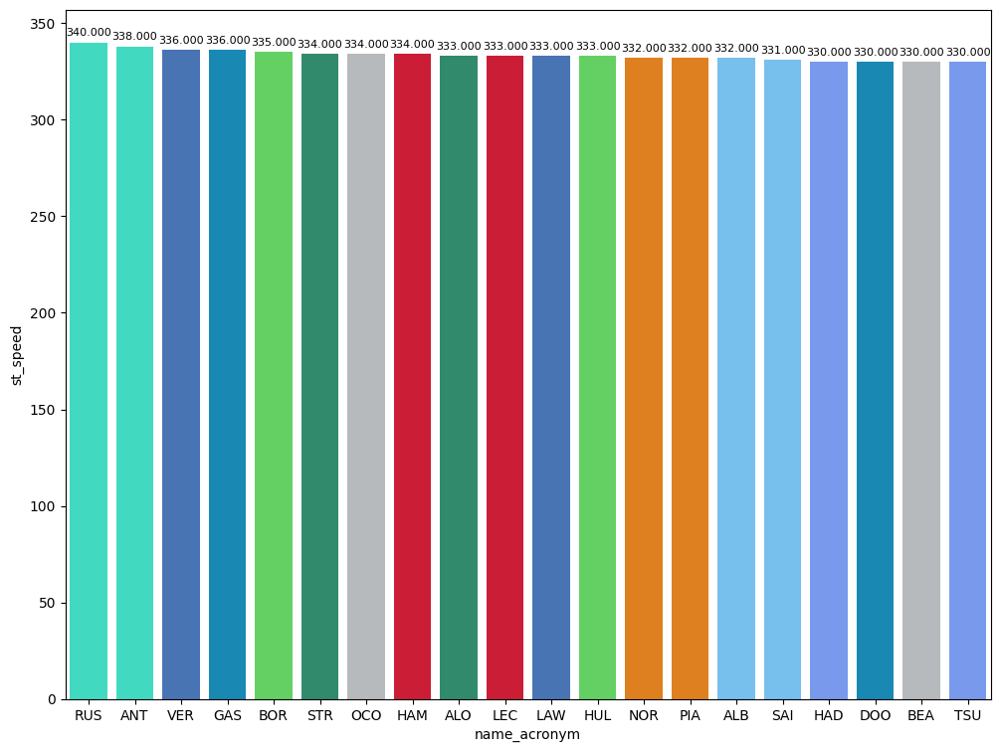

In [15]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

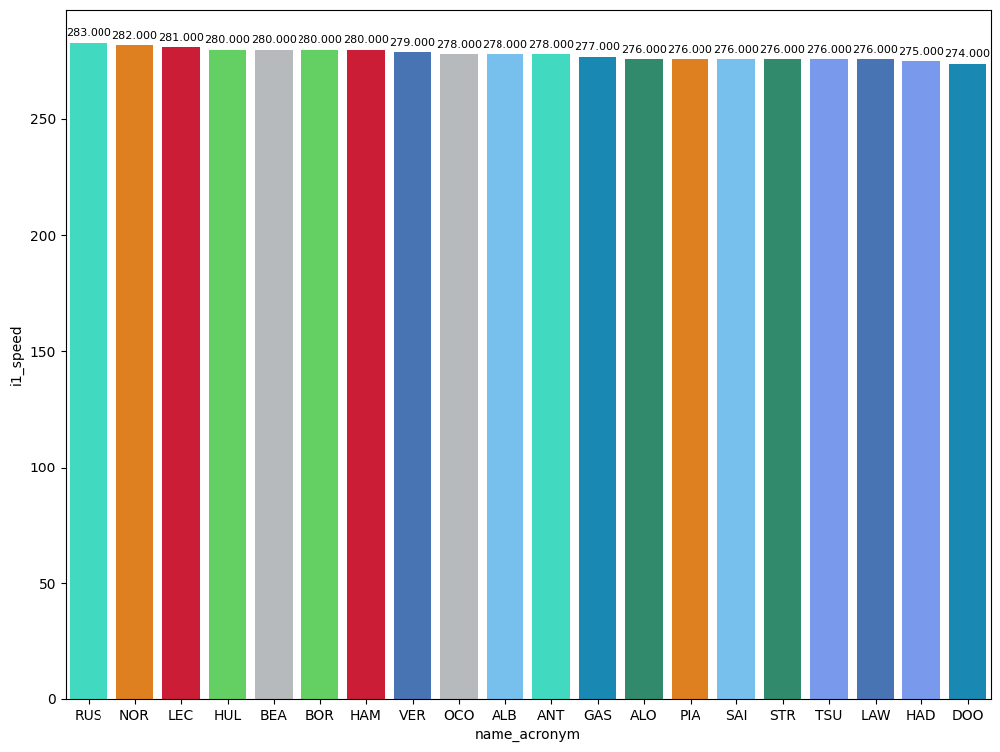

In [16]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

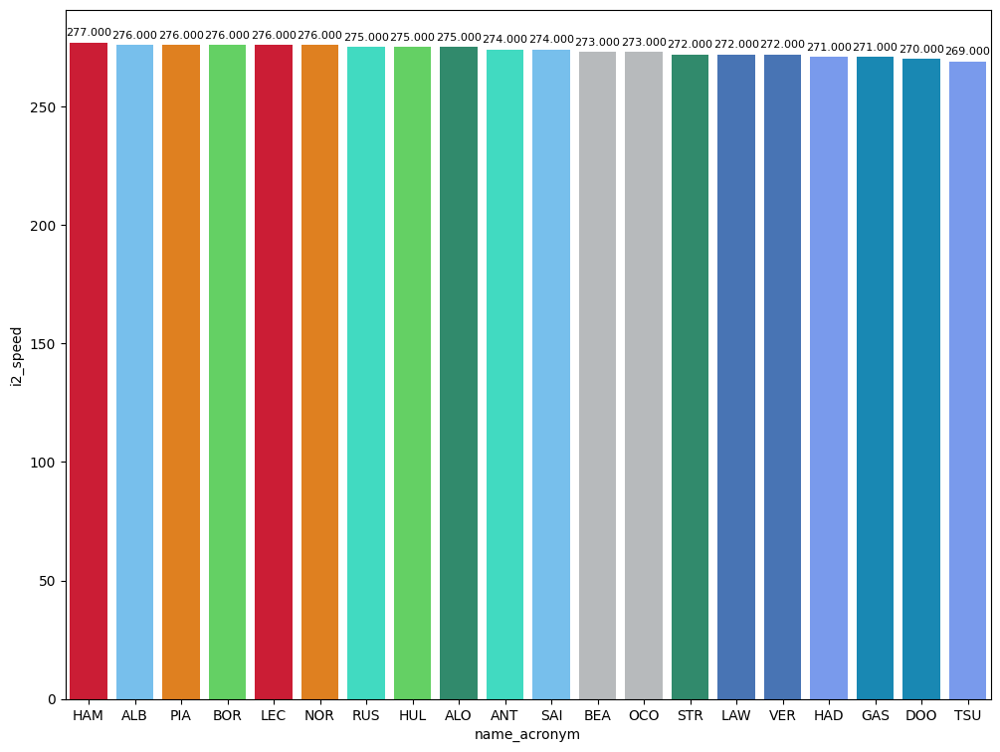

In [17]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 
Session showed that SOFT is better in general but the degradation is an important factor that indicates that this tyre should not be used.

In [18]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
378,Lando NORRIS,MEDIUM,24.281,28.240,39.64,92.161
414,Lando NORRIS,SOFT,24.513,27.601,39.39,91.504


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session

McLaren and Ferrari were the fastest with Norris leading. If Piastri can replicate the pace in sector 1 of Norris, McLaren will be unbeatable.

Verstappen would be P5-P7 if he would have finished the lap.

Haas,Williams, Aston and RB could be on the fighting for Q3 if one of the top fails.


In [19]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


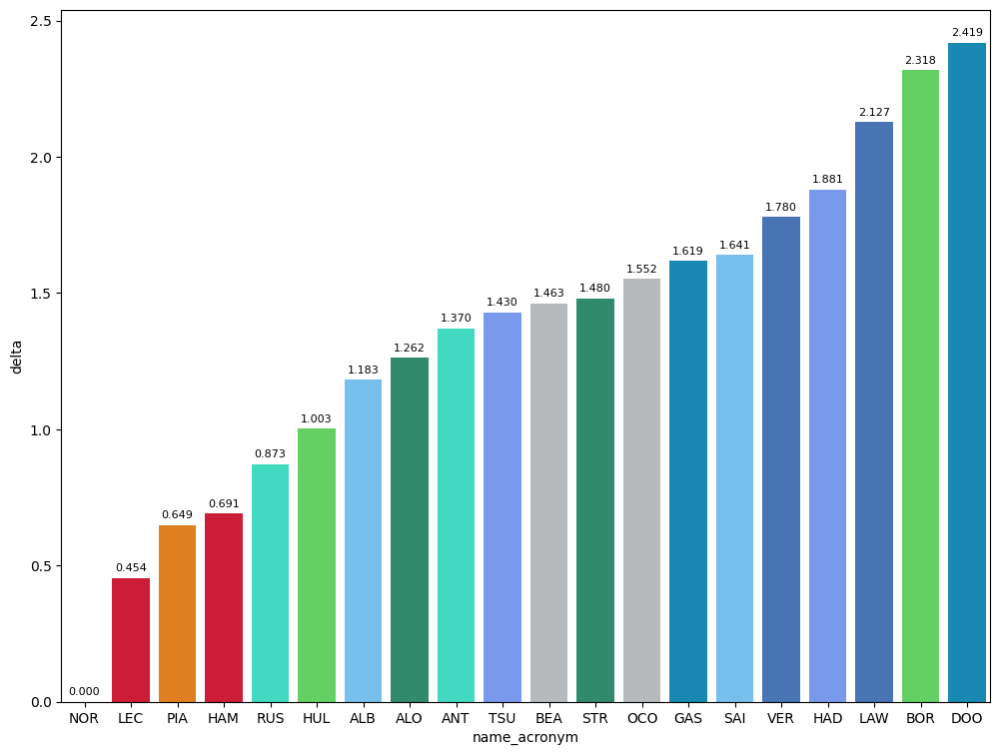

In [20]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

In Sector 1, McLaren was dominant followed by Ferrari in similar laptimes compared to Piastri. Aston and Haas are strong in this sector and this could be its opportunity to pass Q3.

In Sector 2, McLaren did not have any rival. Mercedes, Aston and Alpine will suffer there.

In Sector 3, Mercedes was competitive and Aston,Haas and Alpine should take advantage of this sector to pass.

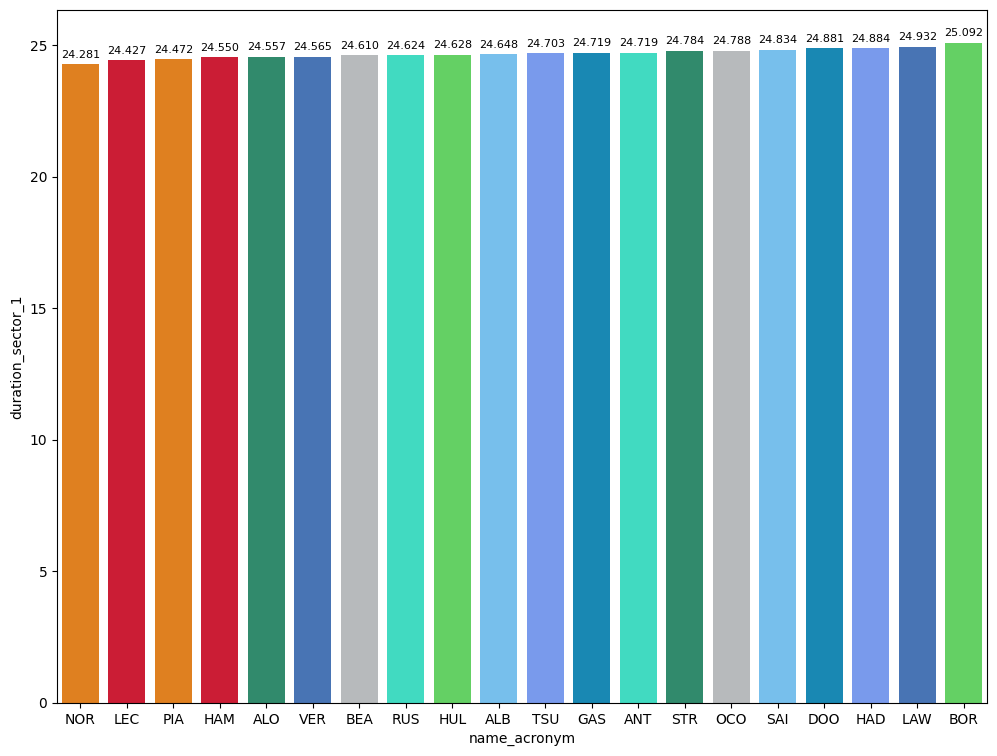

In [21]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

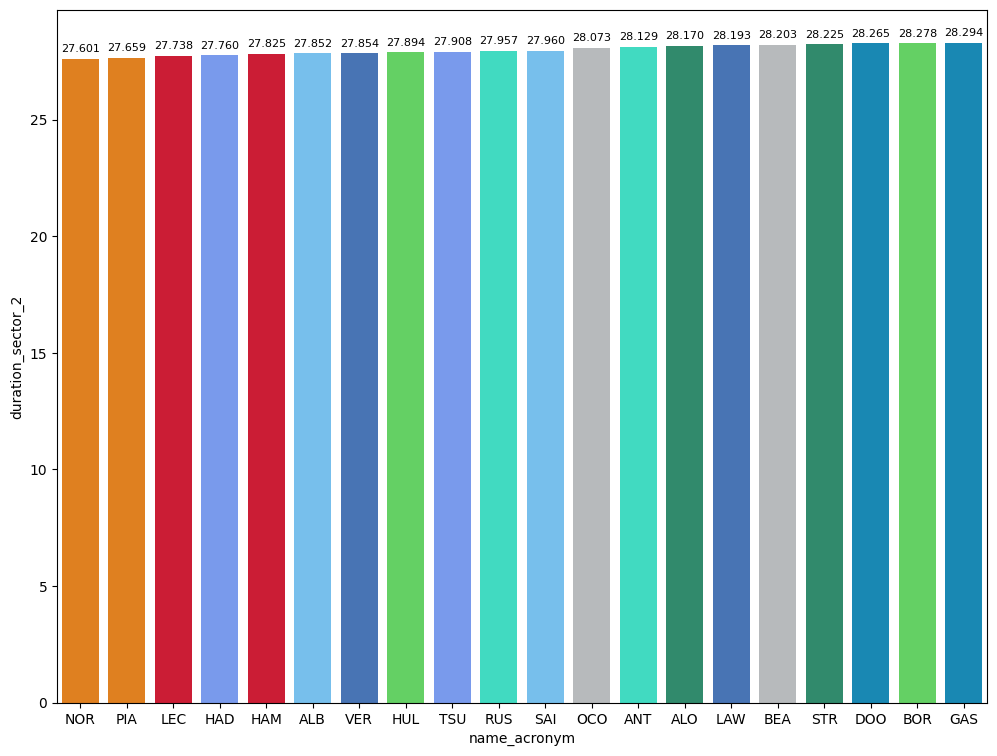

In [22]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

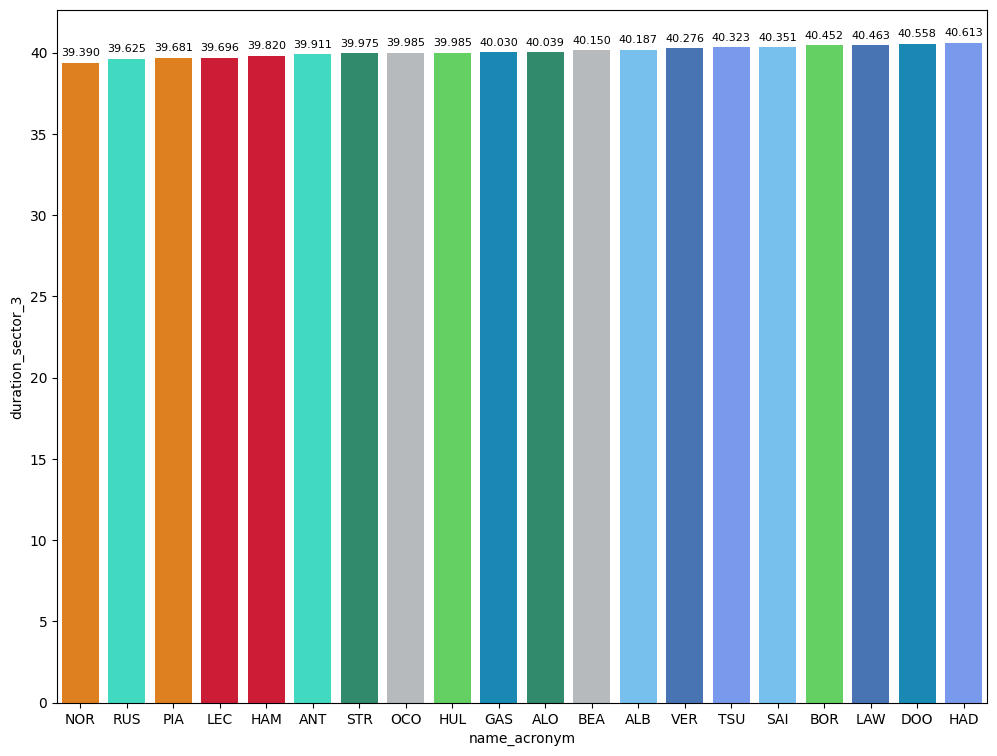

In [23]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [24]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <=105").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,93.240407
MEDIUM,96.724061


### Long runs

In [495]:
MINIMUN_SECONDS = 96
MAXIMUM_SECONDS = 99.8

#### Red Bull Racing

In [496]:
stintInformation.query('driver_number == 1 or driver_number == 30')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
7,1255,9988,1,1,1,9,MEDIUM,0
15,1255,9988,1,30,1,11,MEDIUM,0
30,1255,9988,2,1,10,20,MEDIUM,8
40,1255,9988,2,30,12,18,MEDIUM,10
54,1255,9988,3,30,19,24,SOFT,0
62,1255,9988,3,1,21,23,SOFT,0
68,1255,9988,4,1,23,25,MEDIUM,0


In [497]:
data = libraryDataF1.getinfolongruns(jointables2,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
191,Max VERSTAPPEN,MEDIUM,2025-03-21T03:58:18.275000+00:00,10,26.288,29.417,42.148,97.853
203,Max VERSTAPPEN,MEDIUM,2025-03-21T03:59:55.450000+00:00,11,26.474,29.380,41.902,97.756
216,Max VERSTAPPEN,MEDIUM,2025-03-21T04:01:33.159000+00:00,12,26.288,29.335,41.702,97.325
234,Max VERSTAPPEN,MEDIUM,2025-03-21T04:03:10.567000+00:00,13,26.326,29.636,42.408,98.370
252,Max VERSTAPPEN,MEDIUM,2025-03-21T04:04:48.860000+00:00,14,26.163,29.592,42.187,97.942
272,Max VERSTAPPEN,MEDIUM,2025-03-21T04:06:26.832000+00:00,15,26.371,29.838,42.057,98.266
290,Max VERSTAPPEN,MEDIUM,2025-03-21T04:08:05.161000+00:00,16,26.497,30.195,42.397,99.089
307,Max VERSTAPPEN,MEDIUM,2025-03-21T04:09:44.157000+00:00,17,26.726,30.574,42.446,99.746
325,Max VERSTAPPEN,MEDIUM,2025-03-21T04:11:23.933000+00:00,18,26.809,30.401,42.553,99.763
394,Max VERSTAPPEN,SOFT,2025-03-21T04:26:09.419000+00:00,21,24.565,27.854,45.401,97.820


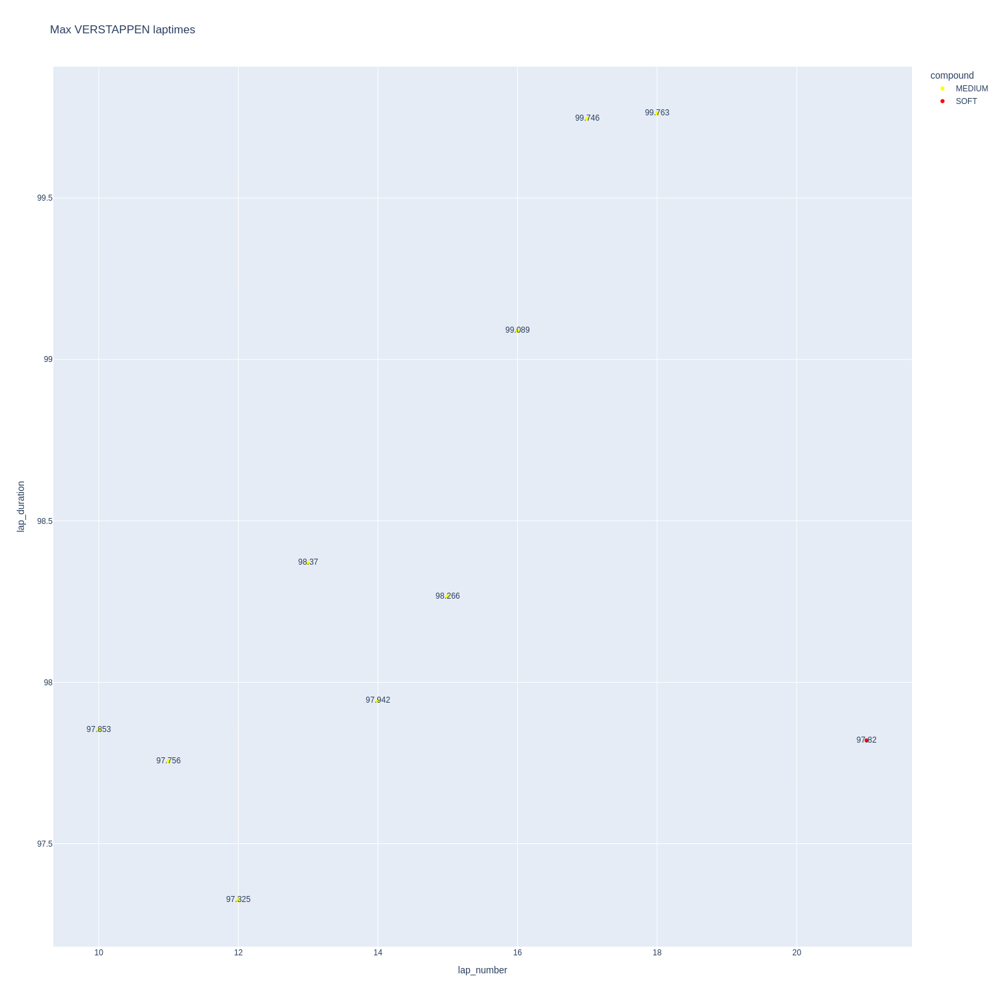

In [498]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

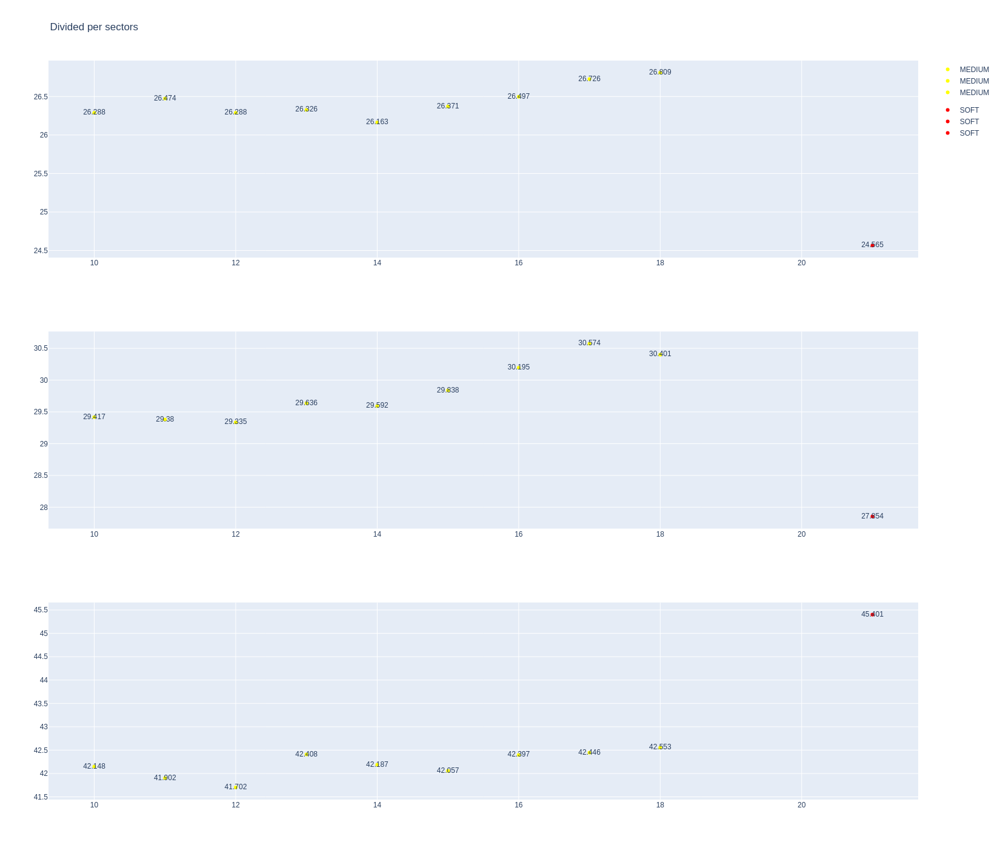

In [499]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [500]:
data = libraryDataF1.getinfolongruns(jointables2,30,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
57,Liam LAWSON,MEDIUM,2025-03-21T03:35:43.893000+00:00,3,25.875,28.988,41.966,96.829
261,Liam LAWSON,MEDIUM,2025-03-21T04:05:38.534000+00:00,12,26.581,29.818,42.734,99.133
281,Liam LAWSON,MEDIUM,2025-03-21T04:07:17.625000+00:00,13,26.111,29.584,42.313,98.008
300,Liam LAWSON,MEDIUM,2025-03-21T04:08:55.732000+00:00,14,26.350,29.422,42.318,98.090
317,Liam LAWSON,MEDIUM,2025-03-21T04:10:33.711000+00:00,15,26.483,29.493,42.298,98.274
332,Liam LAWSON,MEDIUM,2025-03-21T04:12:11.989000+00:00,16,26.295,29.419,42.260,97.974


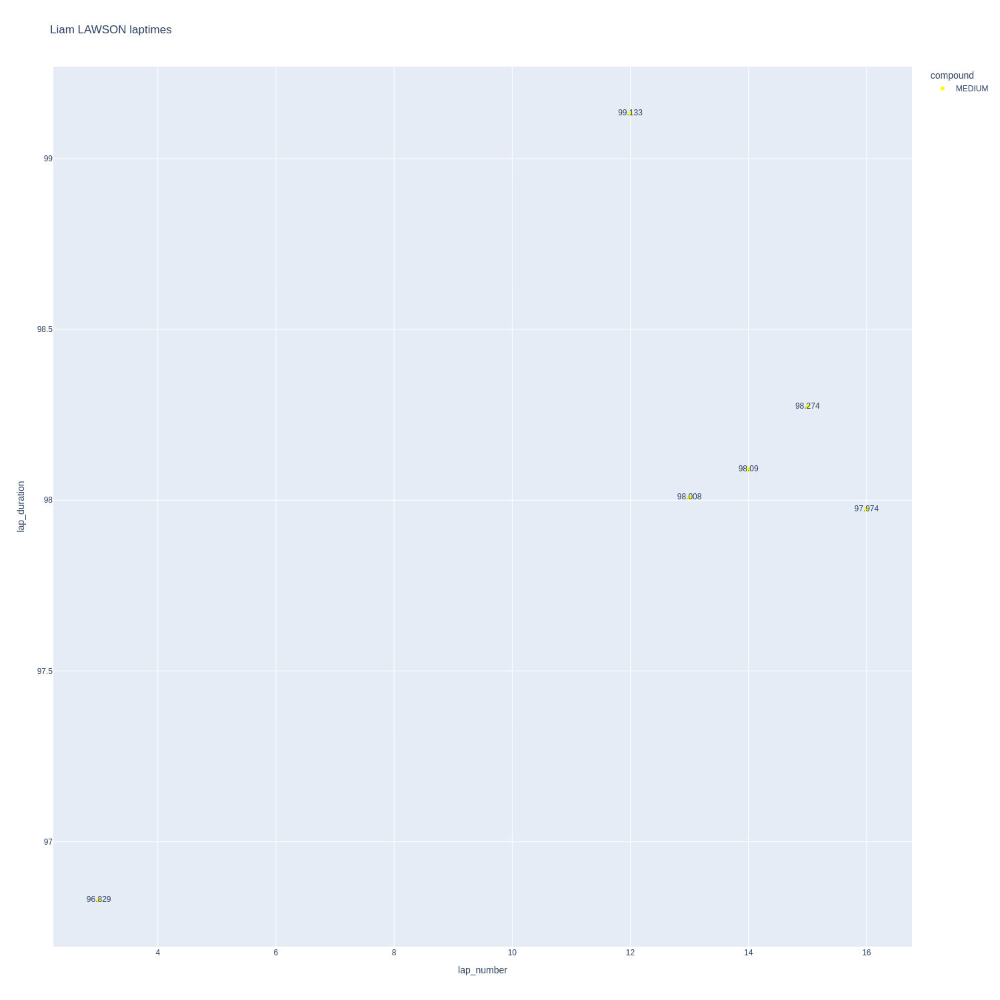

In [501]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

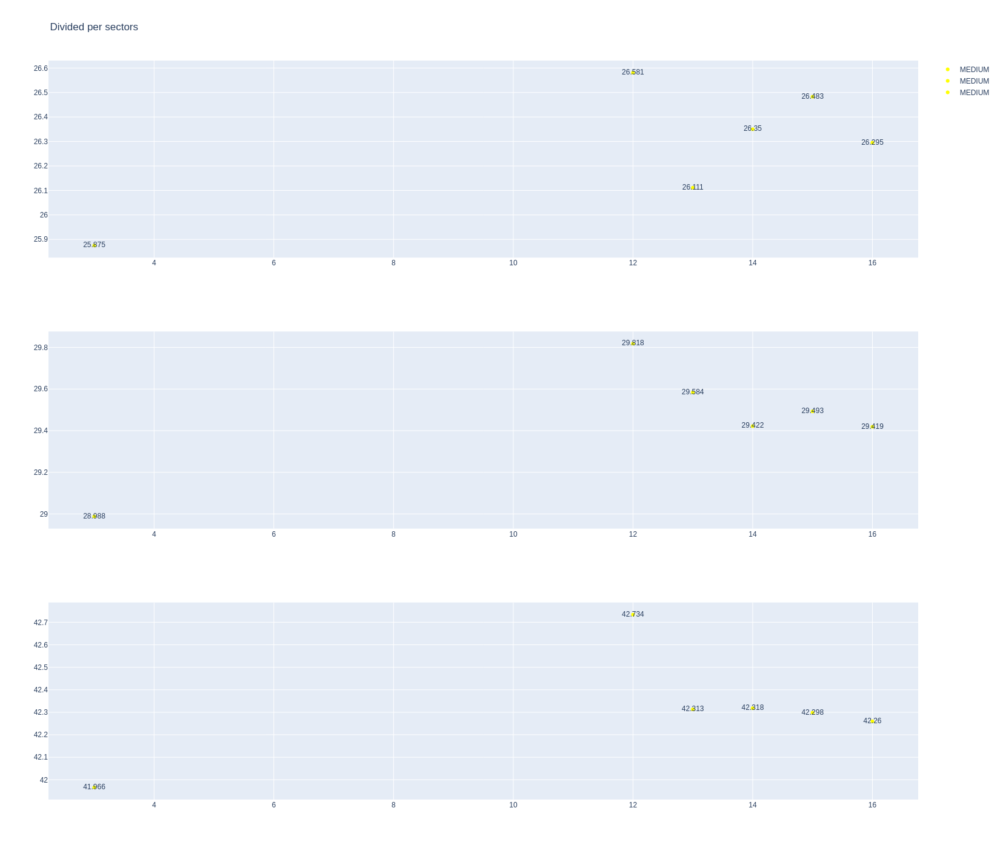

In [502]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [503]:
stintInformation.query('driver_number == 55 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
11,1255,9988,1,16,1,10,MEDIUM,0
17,1255,9988,1,55,1,11,MEDIUM,0
31,1255,9988,2,16,11,16,MEDIUM,9
37,1255,9988,2,55,12,12,MEDIUM,10
43,1255,9988,3,55,13,20,MEDIUM,11
46,1255,9988,3,16,17,22,SOFT,0
61,1255,9988,4,55,21,21,MEDIUM,19
64,1255,9988,5,55,21,25,SOFT,0
71,1255,9988,6,55,25,27,MEDIUM,20


In [504]:
data = libraryDataF1.getinfolongruns(jointables2,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
30,Charles LECLERC,MEDIUM,2025-03-21T03:33:24.548000+00:00,2,26.115,28.488,41.878,96.481


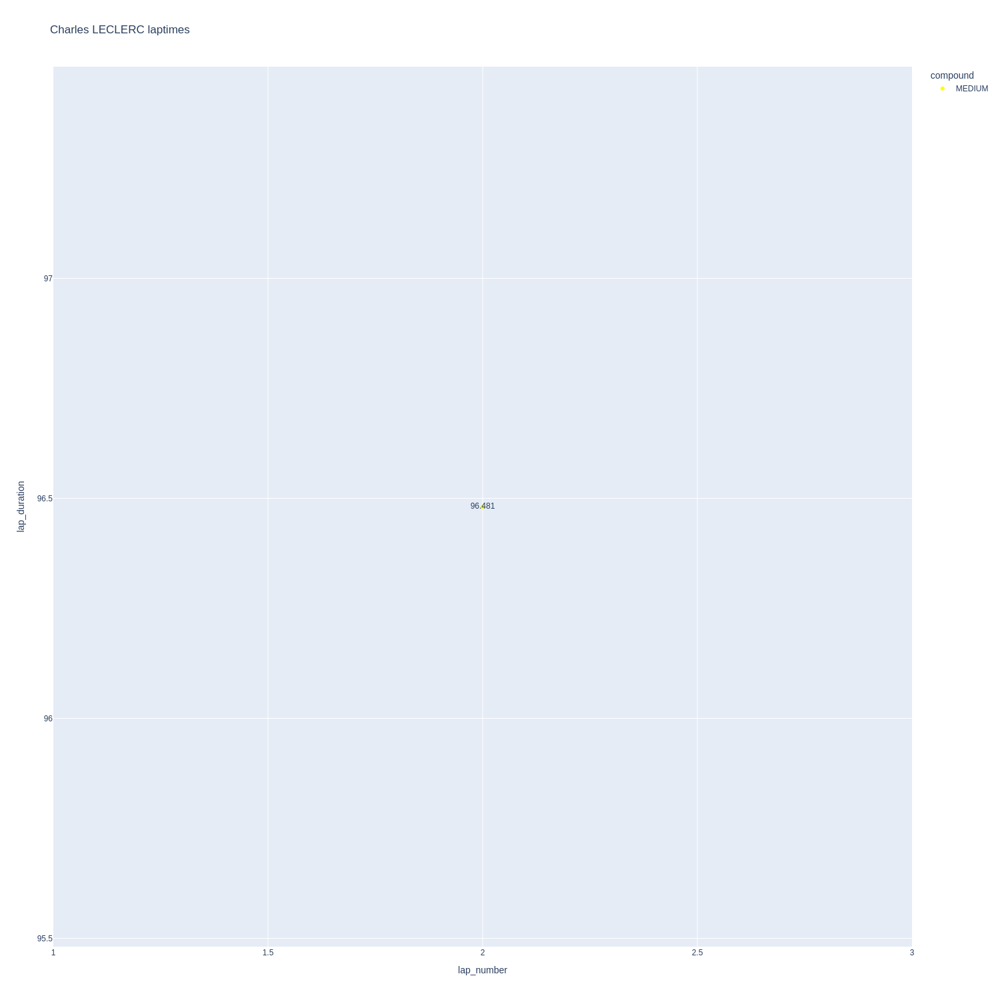

In [505]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

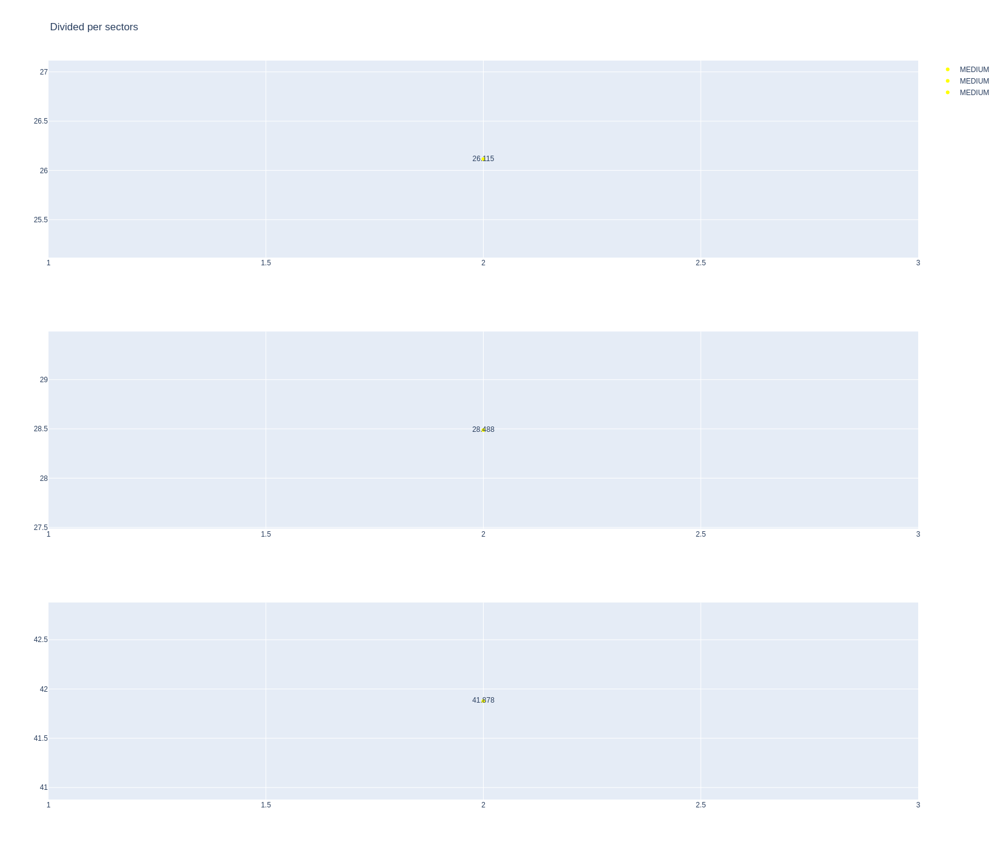

In [506]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [507]:
data = libraryDataF1.getinfolongruns(jointables2,44,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
257,Lewis HAMILTON,MEDIUM,2025-03-21T04:05:16.434000+00:00,13,24.788,28.066,43.693,96.547
296,Lewis HAMILTON,MEDIUM,2025-03-21T04:08:35.072000+00:00,15,26.743,29.957,42.515,99.215


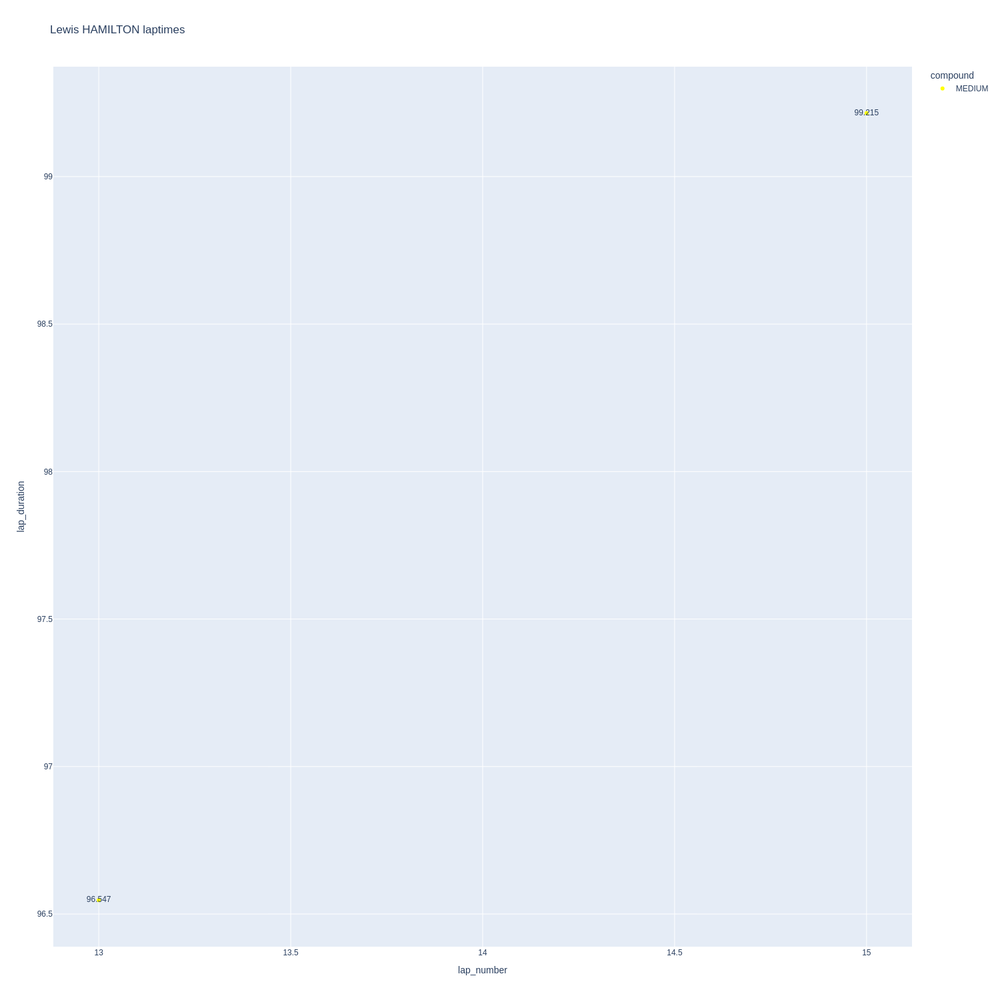

In [508]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

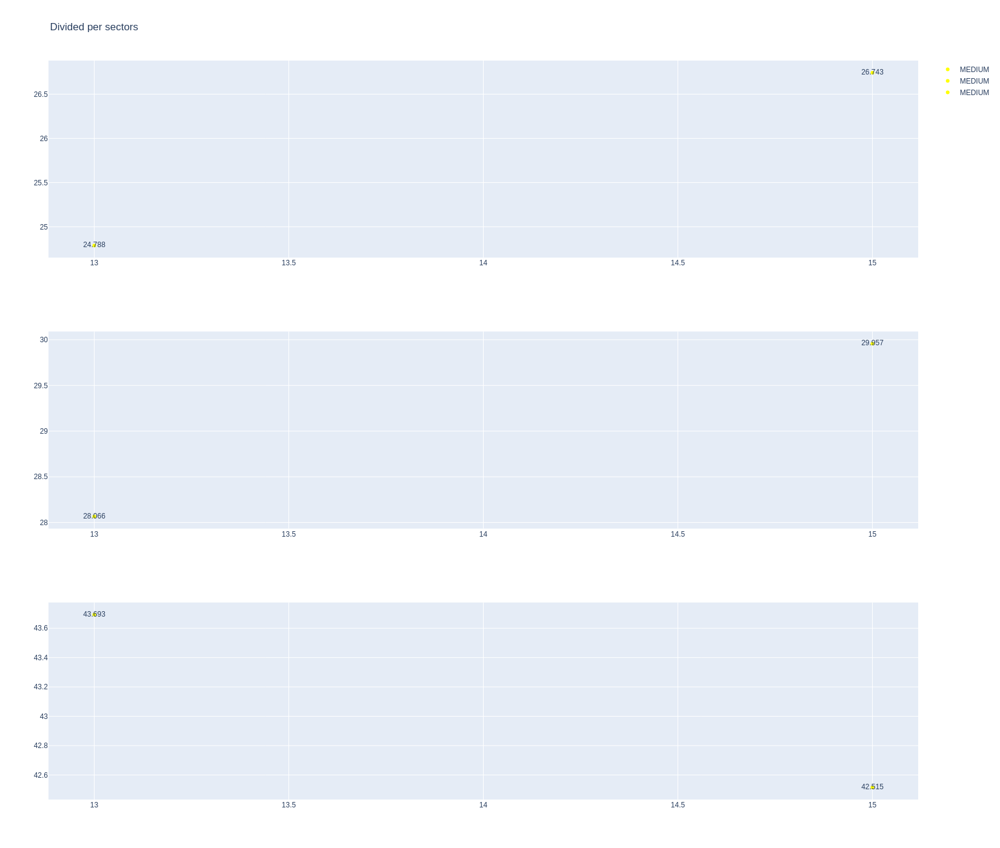

In [509]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [510]:
stintInformation.query('driver_number == 63 or driver_number == 12')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
10,1255,9988,1,12,1,10,MEDIUM,0
18,1255,9988,1,63,1,11,MEDIUM,0
36,1255,9988,2,12,11,23,MEDIUM,9
42,1255,9988,2,63,12,21,MEDIUM,10
67,1255,9988,3,63,22,24,SOFT,0
69,1255,9988,3,12,23,25,SOFT,0
72,1255,9988,4,63,25,27,MEDIUM,20
73,1255,9988,4,12,26,28,MEDIUM,21


In [511]:
data = libraryDataF1.getinfolongruns(jointables2,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
278,George RUSSELL,MEDIUM,2025-03-21T04:06:53.883000+00:00,16,25.923,30.151,41.509,97.583
295,George RUSSELL,MEDIUM,2025-03-21T04:08:31.558000+00:00,17,26.176,29.543,41.534,97.253
312,George RUSSELL,MEDIUM,2025-03-21T04:10:08.802000+00:00,18,26.351,29.677,41.790,97.818
329,George RUSSELL,MEDIUM,2025-03-21T04:11:46.634000+00:00,19,26.435,29.785,41.908,98.128


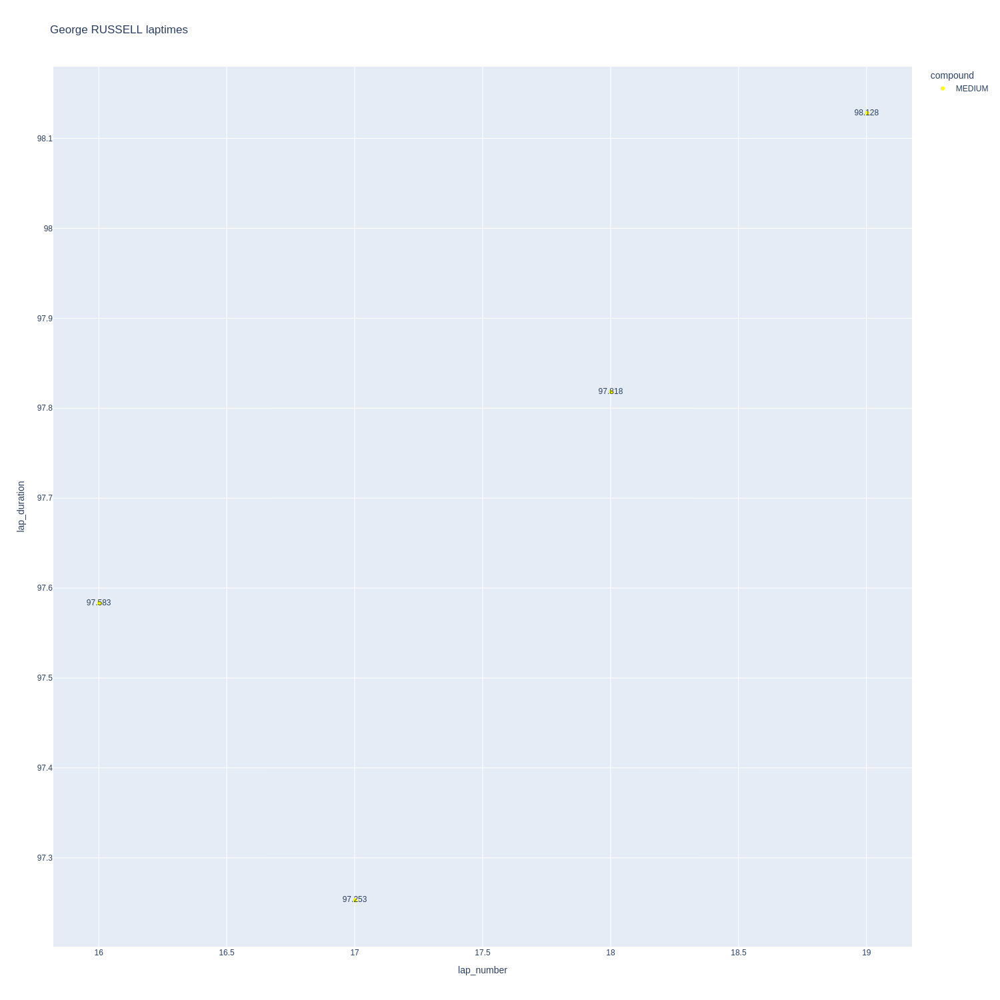

In [512]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

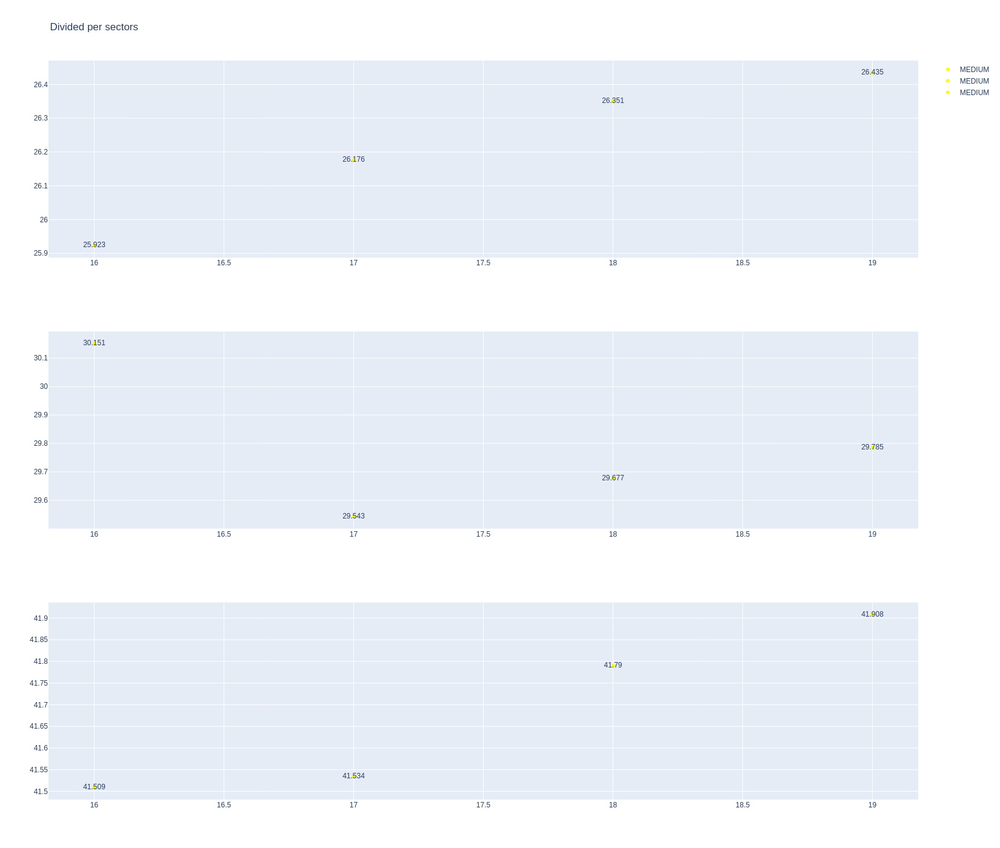

In [513]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [514]:
data = libraryDataF1.getinfolongruns(jointables2,12,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
53,Andrea Kimi ANTONELLI,MEDIUM,2025-03-21T03:35:18.893000+00:00,3,25.849,29.234,41.185,96.268
184,Andrea Kimi ANTONELLI,MEDIUM,2025-03-21T03:57:07.102000+00:00,11,25.614,29.257,41.358,96.229
195,Andrea Kimi ANTONELLI,MEDIUM,2025-03-21T03:58:43.369000+00:00,12,25.782,29.298,41.431,96.511
205,Andrea Kimi ANTONELLI,MEDIUM,2025-03-21T04:00:19.837000+00:00,13,25.870,29.421,41.507,96.798
219,Andrea Kimi ANTONELLI,MEDIUM,2025-03-21T04:01:56.629000+00:00,14,26.024,29.534,41.498,97.056
238,Andrea Kimi ANTONELLI,MEDIUM,2025-03-21T04:03:33.745000+00:00,15,26.026,29.394,41.540,96.960
256,Andrea Kimi ANTONELLI,MEDIUM,2025-03-21T04:05:10.578000+00:00,16,25.961,29.392,41.408,96.761
276,Andrea Kimi ANTONELLI,MEDIUM,2025-03-21T04:06:47.441000+00:00,17,25.980,29.556,41.638,97.174
294,Andrea Kimi ANTONELLI,MEDIUM,2025-03-21T04:08:24.589000+00:00,18,26.271,29.560,41.649,97.480
311,Andrea Kimi ANTONELLI,MEDIUM,2025-03-21T04:10:02.111000+00:00,19,26.394,30.055,42.137,98.586


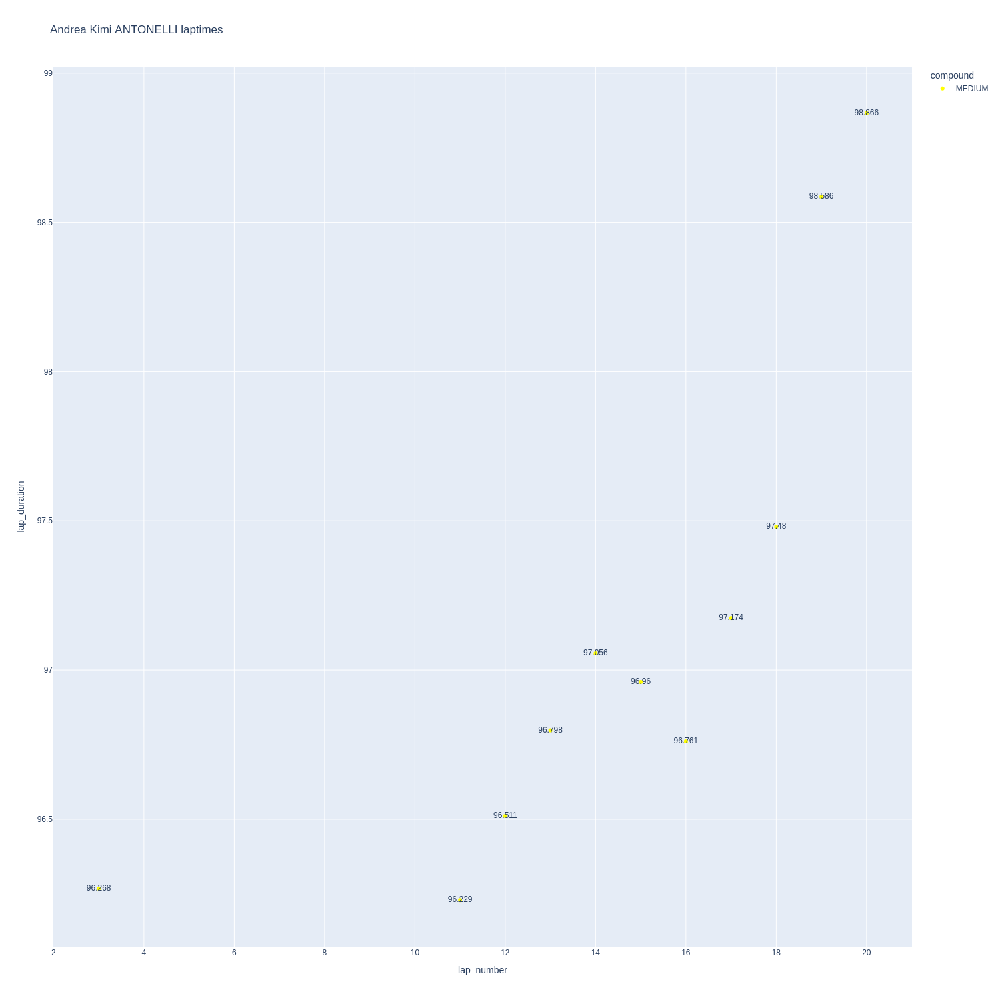

In [515]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

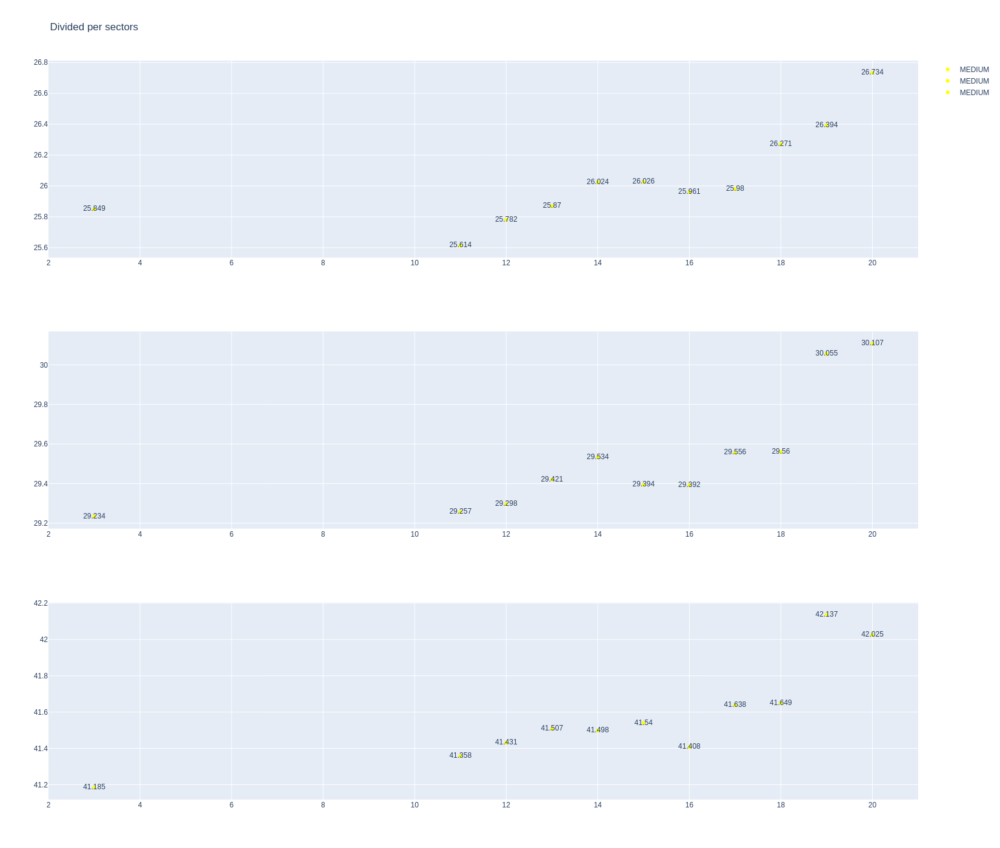

In [516]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [517]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
4,1255,9988,1,4,1,8,MEDIUM,0
8,1255,9988,1,81,1,9,MEDIUM,0
26,1255,9988,2,4,9,19,MEDIUM,7
29,1255,9988,2,81,10,19,MEDIUM,8
52,1255,9988,3,4,19,24,SOFT,0
60,1255,9988,3,81,20,25,SOFT,0


In [518]:
data = libraryDataF1.getinfolongruns(jointables2,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
31,Lando NORRIS,MEDIUM,2025-03-21T03:33:29.892000+00:00,2,25.531,28.700,41.916,96.147
274,Lando NORRIS,MEDIUM,2025-03-21T04:06:38.427000+00:00,12,25.801,29.034,41.778,96.613
293,Lando NORRIS,MEDIUM,2025-03-21T04:08:15.064000+00:00,13,26.635,28.697,41.035,96.367
310,Lando NORRIS,MEDIUM,2025-03-21T04:09:51.442000+00:00,14,26.029,29.231,41.932,97.192
327,Lando NORRIS,MEDIUM,2025-03-21T04:11:28.669000+00:00,15,26.337,29.281,41.420,97.038
339,Lando NORRIS,MEDIUM,2025-03-21T04:13:05.660000+00:00,16,26.430,29.684,41.524,97.638


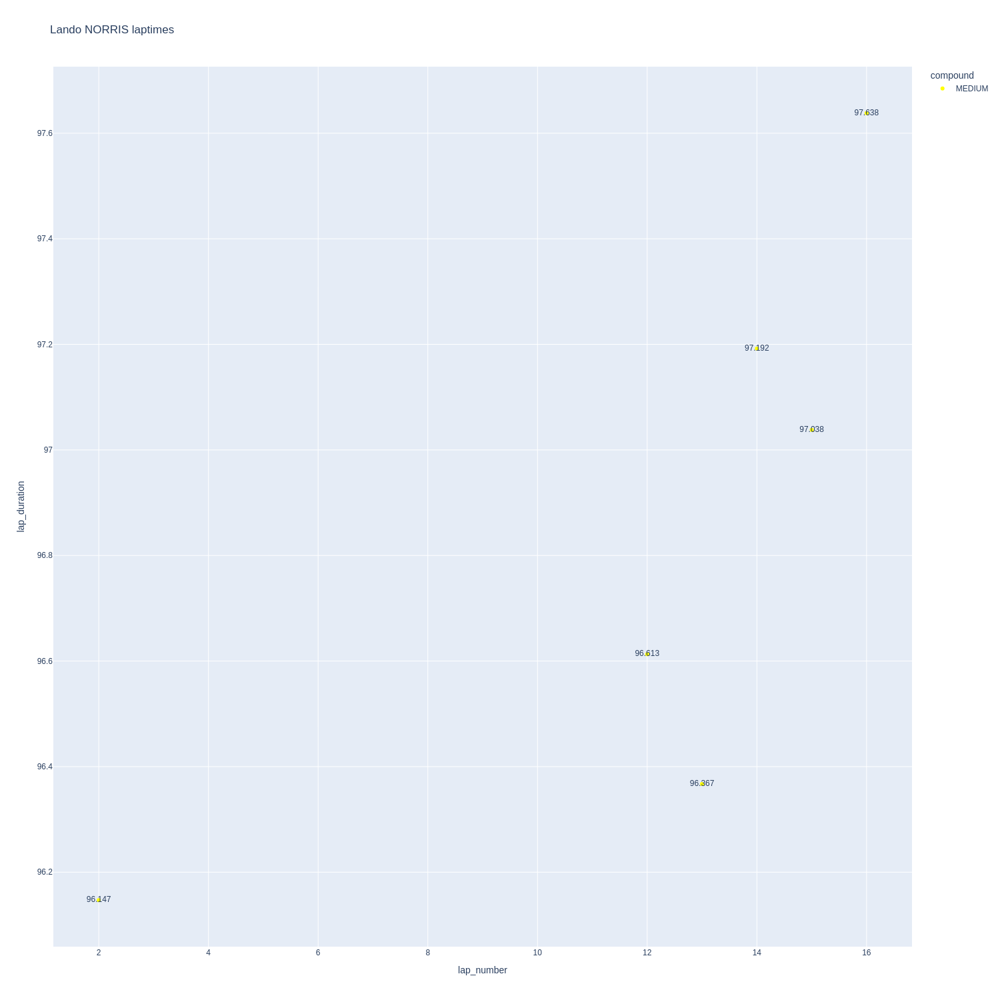

In [519]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

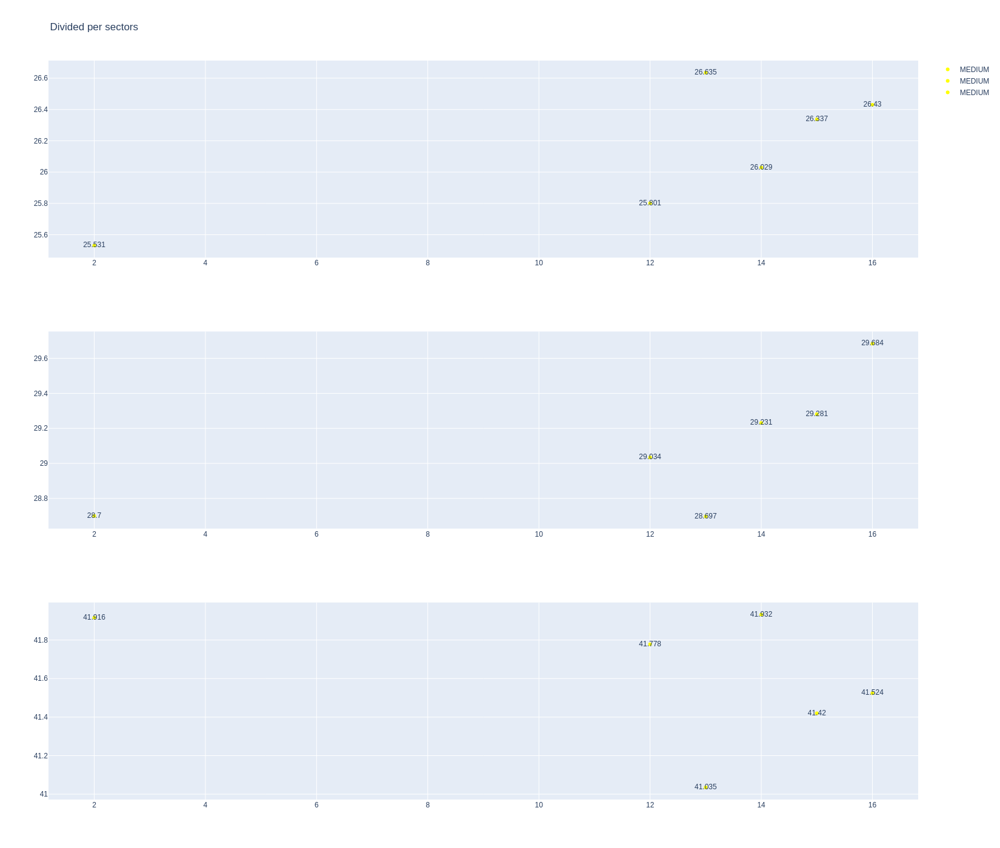

In [520]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [521]:
data = libraryDataF1.getinfolongruns(jointables2,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
285,Oscar PIASTRI,MEDIUM,2025-03-21T04:07:38.557000+00:00,13,25.495,29.349,41.641,96.485
303,Oscar PIASTRI,MEDIUM,2025-03-21T04:09:15.007000+00:00,14,25.958,29.476,41.658,97.092
320,Oscar PIASTRI,MEDIUM,2025-03-21T04:10:52.099000+00:00,15,26.261,29.652,41.450,97.363
334,Oscar PIASTRI,MEDIUM,2025-03-21T04:12:29.497000+00:00,16,26.015,29.446,41.360,96.821
345,Oscar PIASTRI,MEDIUM,2025-03-21T04:14:06.316000+00:00,17,25.816,29.382,41.636,96.834


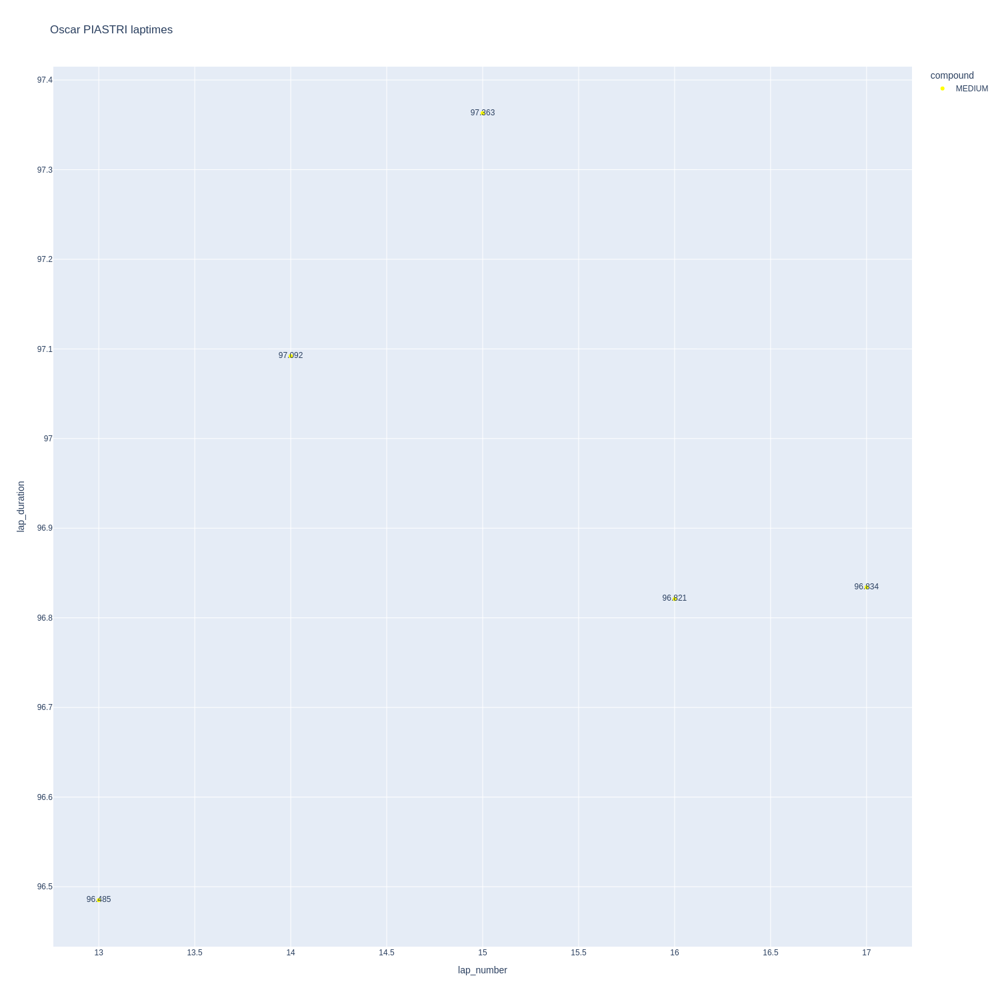

In [522]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

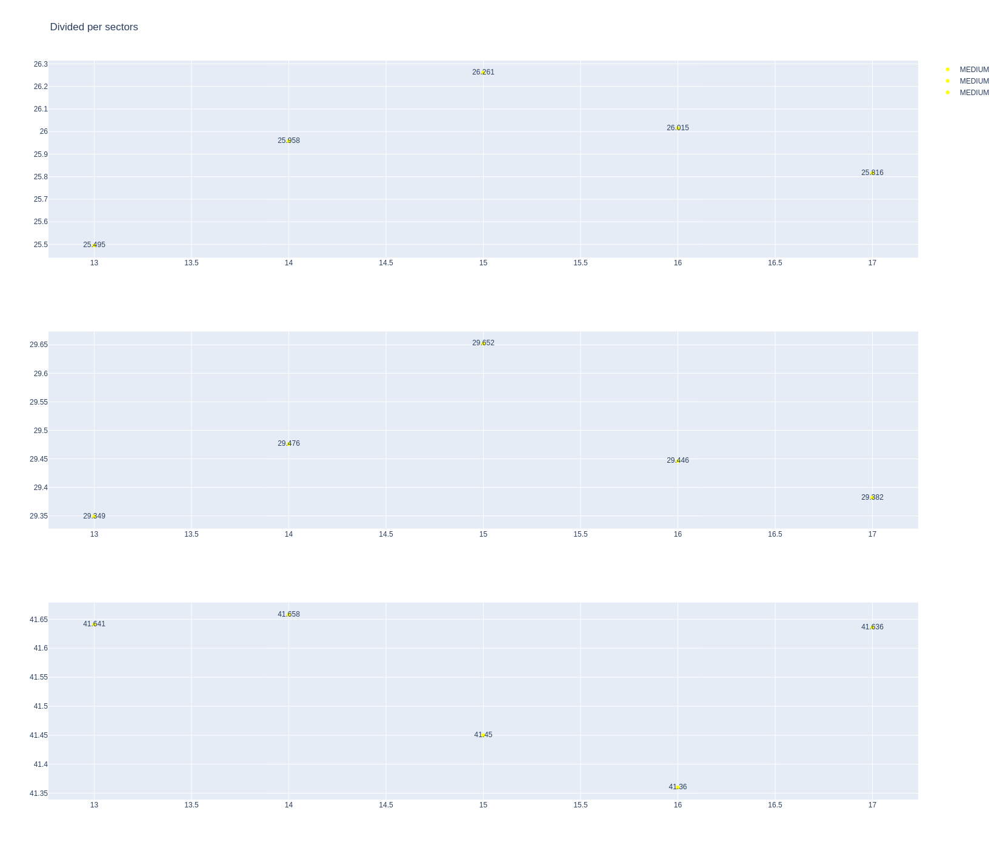

In [523]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [524]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1255,9988,1,14,1,6,MEDIUM,0
1,1255,9988,1,18,1,6,MEDIUM,0
20,1255,9988,2,14,7,9,MEDIUM,5
21,1255,9988,2,18,7,9,MEDIUM,5
27,1255,9988,3,18,10,16,MEDIUM,8
28,1255,9988,3,14,10,18,MEDIUM,8
45,1255,9988,4,18,17,20,SOFT,0
51,1255,9988,4,14,19,21,SOFT,0
66,1255,9988,5,14,22,24,MEDIUM,17


In [525]:
data = libraryDataF1.getinfolongruns(jointables2,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
279,Fernando ALONSO,MEDIUM,2025-03-21T04:06:59.821000+00:00,14,25.841,29.188,43.772,98.801
297,Fernando ALONSO,MEDIUM,2025-03-21T04:08:38.054000+00:00,15,25.672,29.154,41.692,96.518
314,Fernando ALONSO,MEDIUM,2025-03-21T04:10:14.656000+00:00,16,25.450,29.130,41.803,96.383


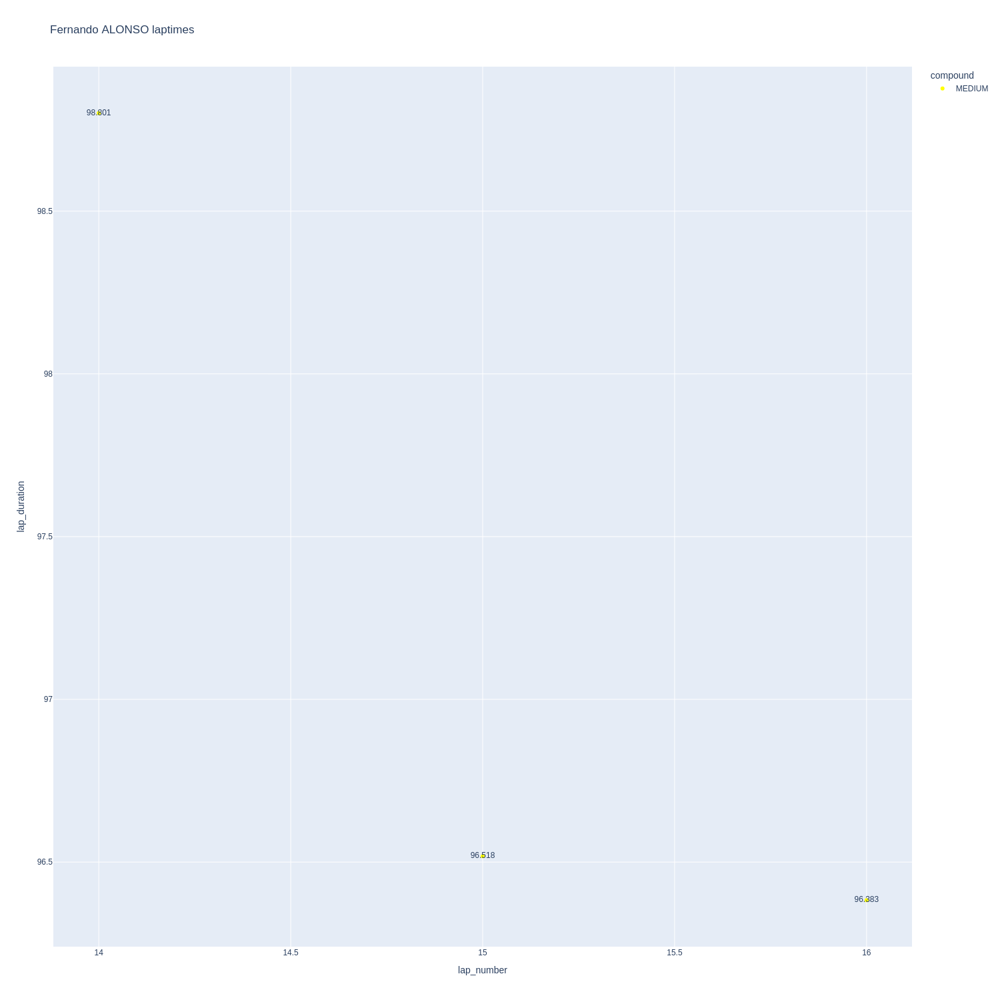

In [526]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

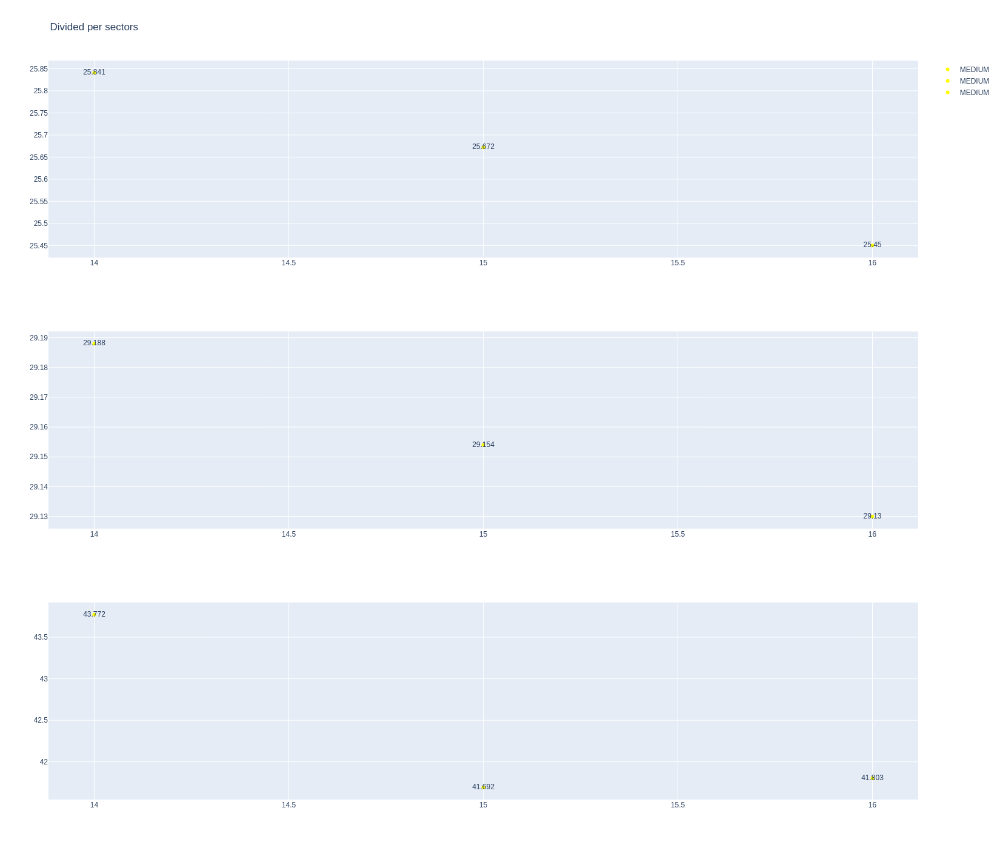

In [527]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [528]:
data = libraryDataF1.getinfolongruns(jointables2,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
56,Lance STROLL,MEDIUM,2025-03-21T03:35:37.791000+00:00,2,25.671,28.712,42.068,96.451
291,Lance STROLL,MEDIUM,2025-03-21T04:08:12.832000+00:00,12,26.027,29.169,42.269,97.465
309,Lance STROLL,MEDIUM,2025-03-21T04:09:50.166000+00:00,13,26.317,29.410,42.211,97.938
326,Lance STROLL,MEDIUM,2025-03-21T04:11:28.196000+00:00,14,26.686,30.939,42.007,99.632


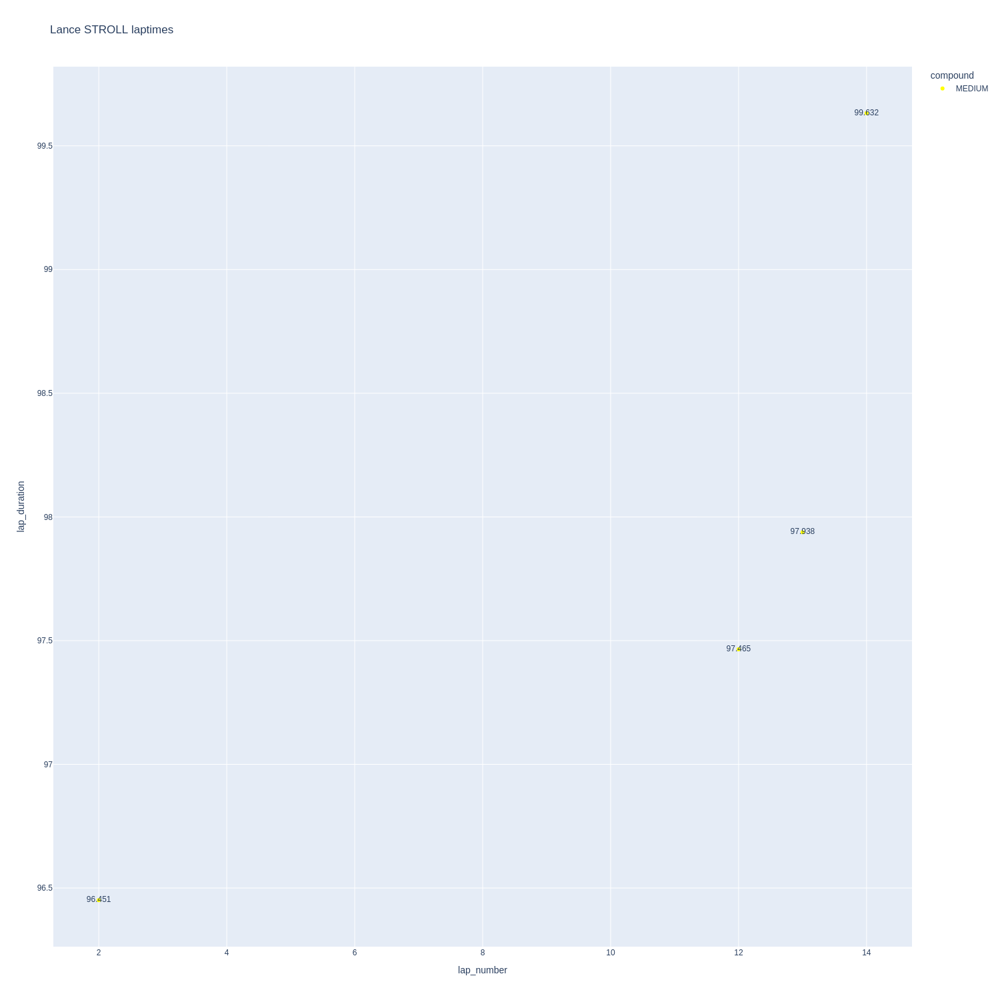

In [529]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

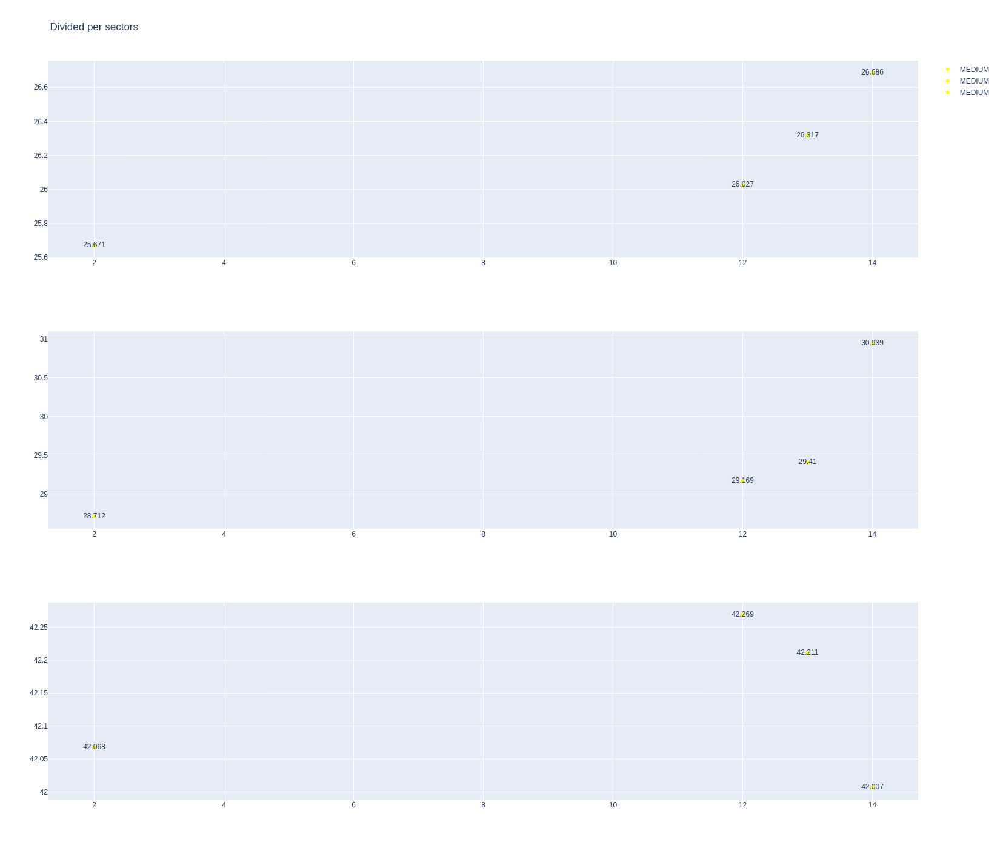

In [530]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Racing Bulls

In [531]:
stintInformation.query('driver_number == 6 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
5,1255,9988,1,6,1,8,MEDIUM,0
19,1255,9988,1,22,1,13,MEDIUM,0
24,1255,9988,2,6,9,11,MEDIUM,7
39,1255,9988,3,6,12,18,MEDIUM,10
44,1255,9988,2,22,14,19,MEDIUM,12
53,1255,9988,4,6,19,24,SOFT,0
58,1255,9988,3,22,20,24,SOFT,0


In [532]:
data = libraryDataF1.getinfolongruns(jointables2,6,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
23,Isack HADJAR,MEDIUM,2025-03-21T03:32:34.145000+00:00,2,25.834,29.568,41.820,97.222
197,Isack HADJAR,MEDIUM,2025-03-21T03:58:52.827000+00:00,12,26.628,29.547,42.907,99.082
224,Isack HADJAR,MEDIUM,2025-03-21T04:02:13.565000+00:00,14,26.240,29.236,42.146,97.622
242,Isack HADJAR,MEDIUM,2025-03-21T04:03:51.232000+00:00,15,26.379,29.213,42.108,97.700
260,Isack HADJAR,MEDIUM,2025-03-21T04:05:28.904000+00:00,16,26.145,28.978,42.016,97.139
422,Isack HADJAR,SOFT,2025-03-21T04:29:38.705000+00:00,21,25.428,27.760,44.997,98.185


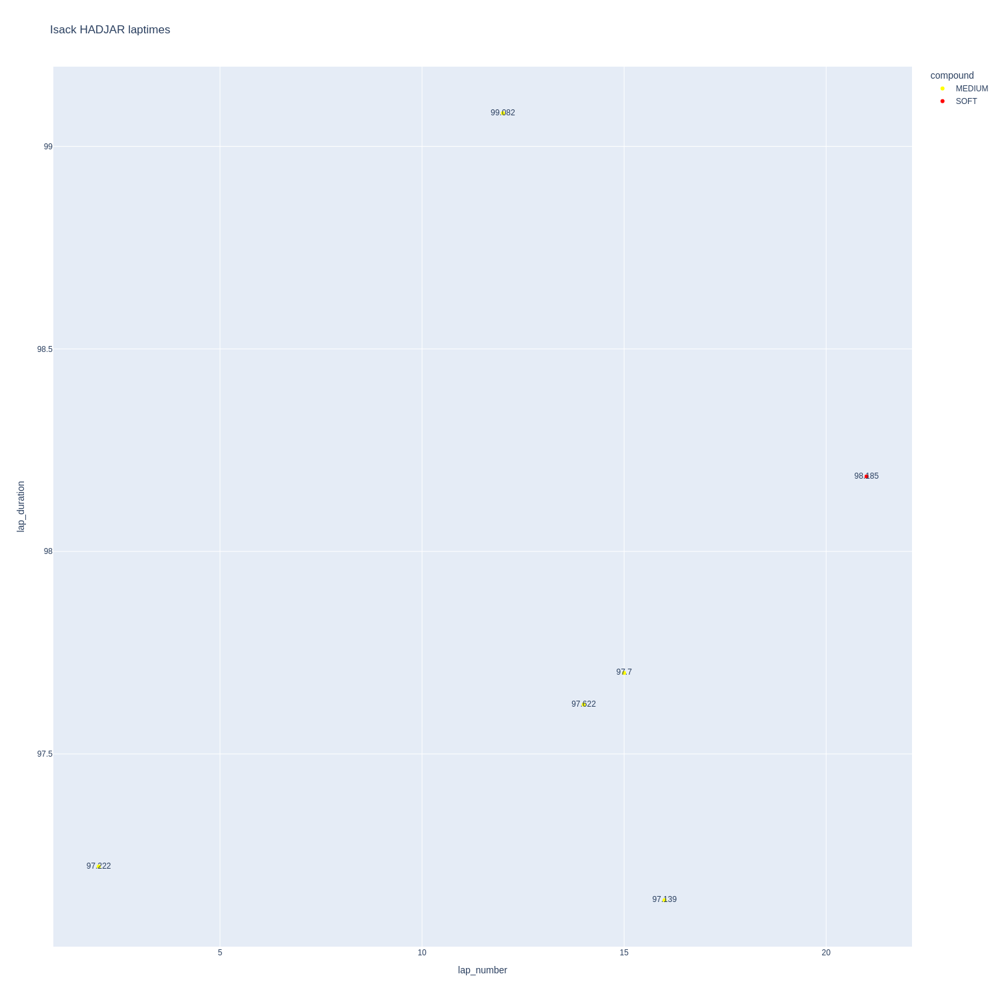

In [533]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

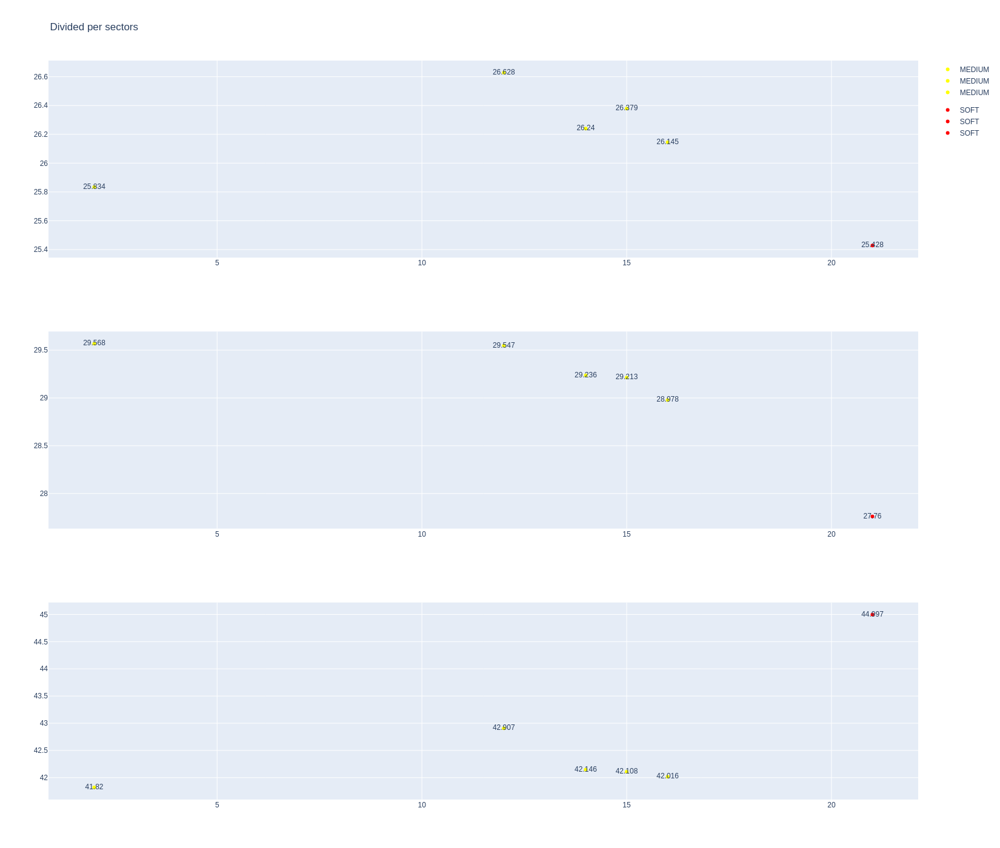

In [534]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [535]:
data = libraryDataF1.getinfolongruns(jointables2,22,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
21,Yuki TSUNODA,MEDIUM,2025-03-21T03:32:20.311000+00:00,2,25.888,28.863,41.831,96.582
245,Yuki TSUNODA,MEDIUM,2025-03-21T04:04:14.630000+00:00,14,26.197,29.163,41.931,97.291
264,Yuki TSUNODA,MEDIUM,2025-03-21T04:05:51.901000+00:00,15,26.129,29.055,41.950,97.134
284,Yuki TSUNODA,MEDIUM,2025-03-21T04:07:29.082000+00:00,16,26.301,29.234,42.067,97.602
302,Yuki TSUNODA,MEDIUM,2025-03-21T04:09:06.762000+00:00,17,26.428,29.420,42.079,97.927


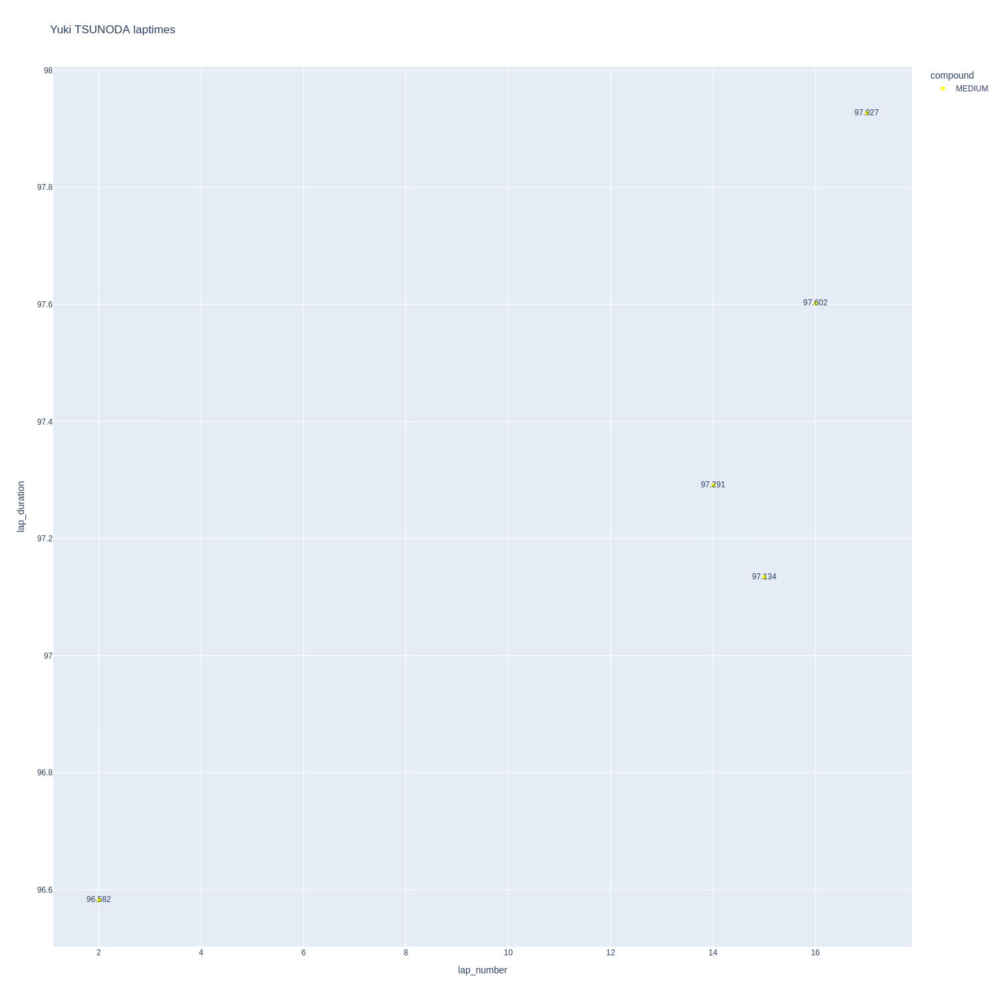

In [536]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

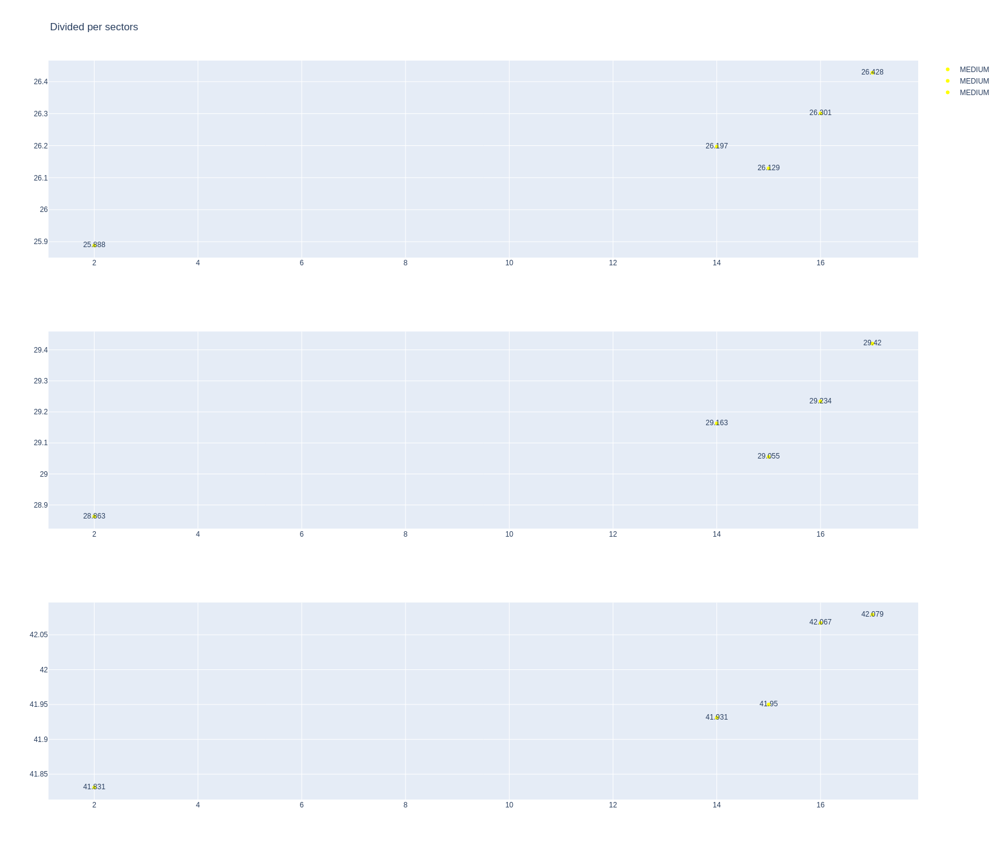

In [537]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [538]:
stintInformation.query('driver_number == 87 or driver_number == 31')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
14,1255,9988,1,87,1,10,MEDIUM,0
16,1255,9988,1,31,1,11,MEDIUM,0
35,1255,9988,2,87,11,19,MEDIUM,9
41,1255,9988,2,31,12,18,MEDIUM,10
55,1255,9988,3,31,19,24,SOFT,0
56,1255,9988,3,87,19,24,SOFT,0


In [539]:
data = libraryDataF1.getinfolongruns(jointables2,87,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
59,Oliver BEARMAN,MEDIUM,2025-03-21T03:36:03.392000+00:00,4,25.948,28.934,41.737,96.619
229,Oliver BEARMAN,MEDIUM,2025-03-21T04:02:33.303000+00:00,11,25.683,29.387,41.934,97.004
244,Oliver BEARMAN,MEDIUM,2025-03-21T04:04:10.256000+00:00,12,25.835,29.750,41.986,97.571
263,Oliver BEARMAN,MEDIUM,2025-03-21T04:05:47.853000+00:00,13,26.095,29.361,42.038,97.494
283,Oliver BEARMAN,MEDIUM,2025-03-21T04:07:25.334000+00:00,14,26.071,29.515,42.088,97.674
301,Oliver BEARMAN,MEDIUM,2025-03-21T04:09:03.132000+00:00,15,26.385,29.675,42.000,98.060
318,Oliver BEARMAN,MEDIUM,2025-03-21T04:10:41.033000+00:00,16,26.629,29.673,42.439,98.741


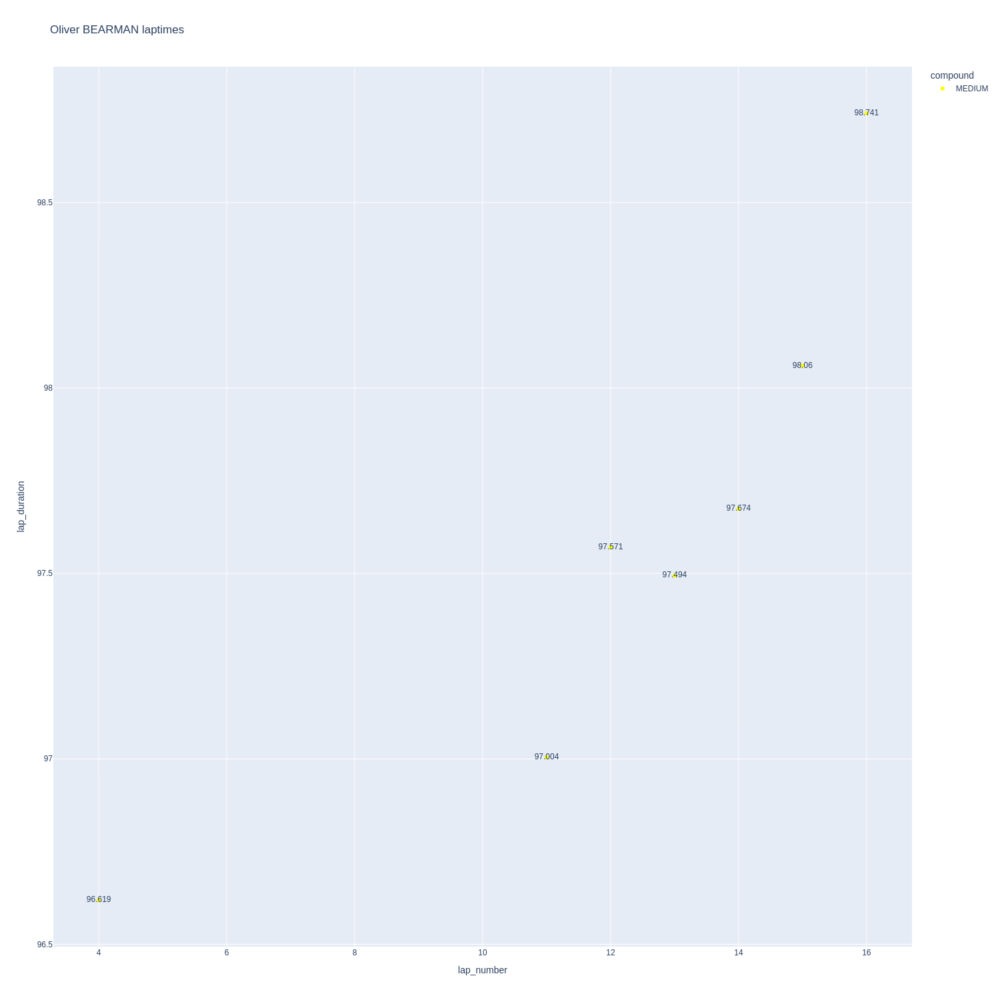

In [540]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

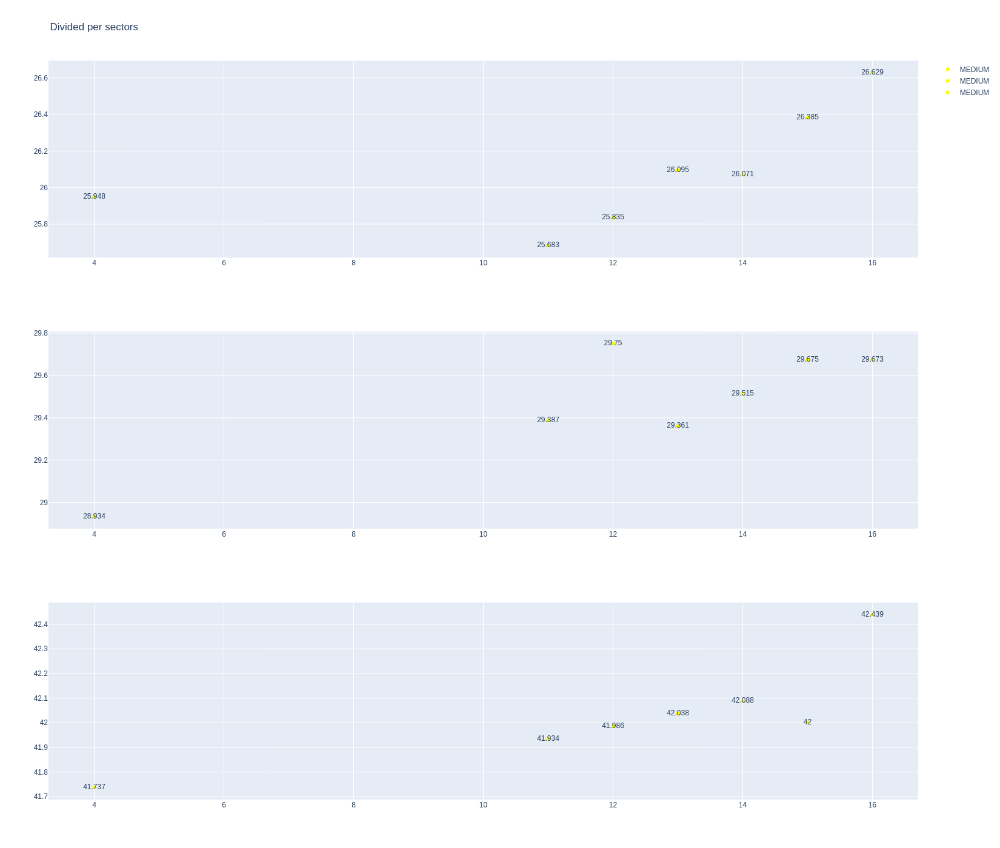

In [541]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [542]:
data = libraryDataF1.getinfolongruns(jointables2,31,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
20,Esteban OCON,MEDIUM,2025-03-21T03:32:11.616000+00:00,2,26.297,29.351,42.167,97.815
214,Esteban OCON,MEDIUM,2025-03-21T04:01:17.195000+00:00,13,25.816,29.261,41.969,97.046
232,Esteban OCON,MEDIUM,2025-03-21T04:02:54.436000+00:00,14,25.732,29.227,41.675,96.634
249,Esteban OCON,MEDIUM,2025-03-21T04:04:31.027000+00:00,15,26.057,29.238,41.919,97.214
268,Esteban OCON,MEDIUM,2025-03-21T04:06:08.257000+00:00,16,27.127,29.479,41.798,98.404


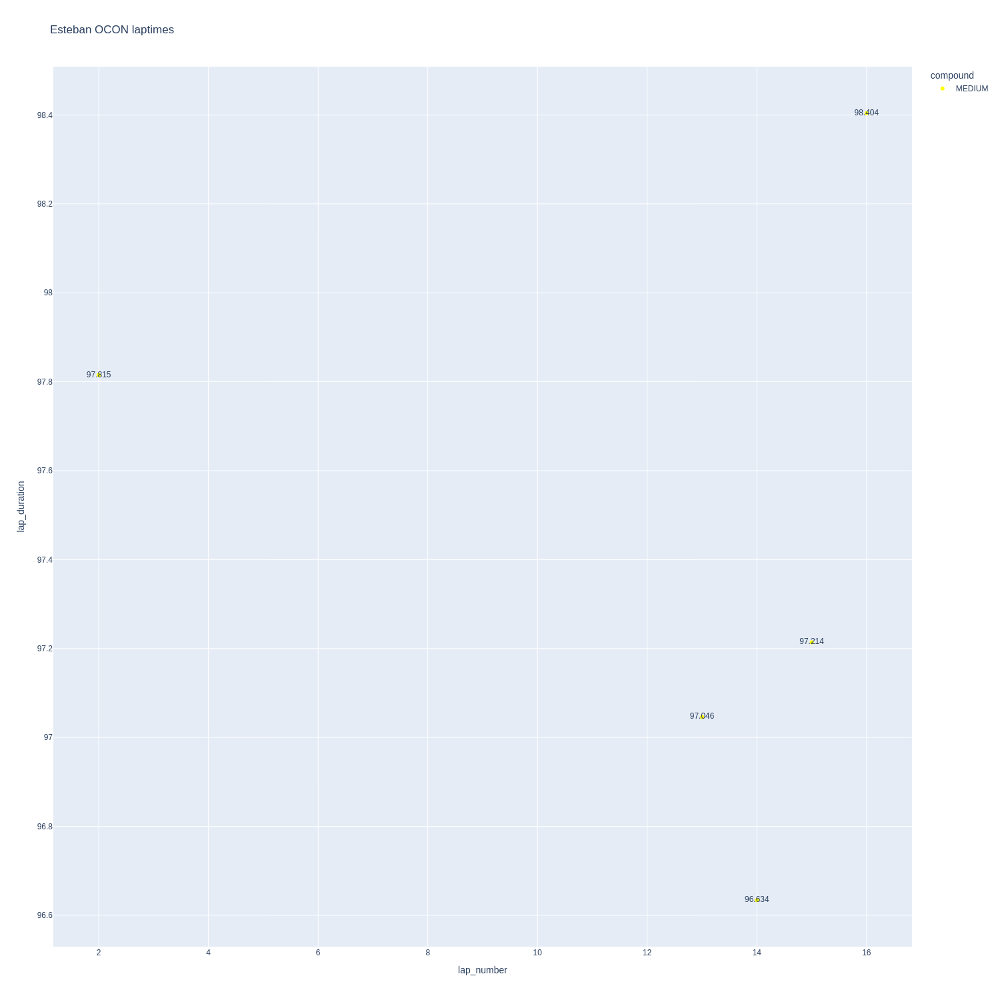

In [543]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

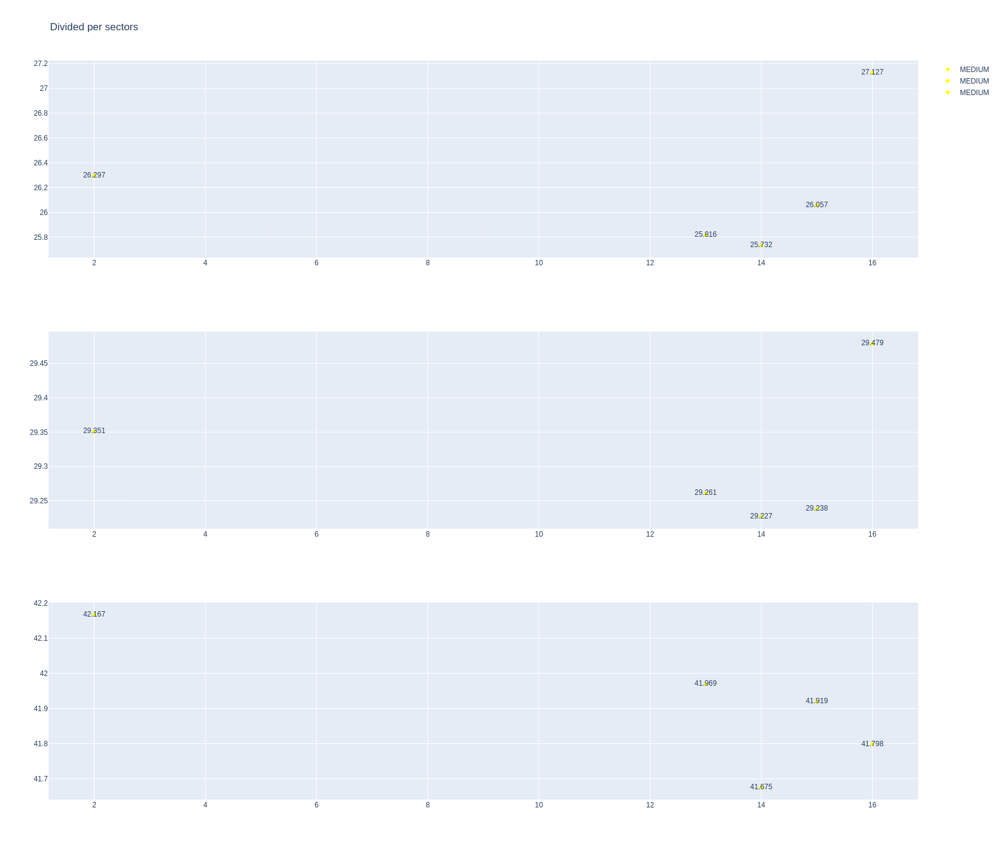

In [544]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [545]:
stintInformation.query('driver_number == 10 or driver_number == 7')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
6,1255,9988,1,10,1,8,MEDIUM,0
9,1255,9988,1,7,1,10,MEDIUM,0
25,1255,9988,2,10,9,18,MEDIUM,0
33,1255,9988,2,7,11,18,MEDIUM,9
50,1255,9988,3,10,19,21,SOFT,0
65,1255,9988,4,10,22,24,MEDIUM,17


In [546]:
data =libraryDataF1.getinfolongruns(jointables2,7,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
25,Jack DOOHAN,MEDIUM,2025-03-21T03:32:52.129000+00:00,2,25.675,29.368,42.170,97.213
298,Jack DOOHAN,MEDIUM,2025-03-21T04:08:41.707000+00:00,13,25.875,28.965,41.891,96.731
315,Jack DOOHAN,MEDIUM,2025-03-21T04:10:18.388000+00:00,14,25.697,29.207,41.951,96.855
331,Jack DOOHAN,MEDIUM,2025-03-21T04:11:55.308000+00:00,15,26.208,29.364,42.013,97.585
343,Jack DOOHAN,MEDIUM,2025-03-21T04:13:32.864000+00:00,16,26.153,29.126,41.754,97.033


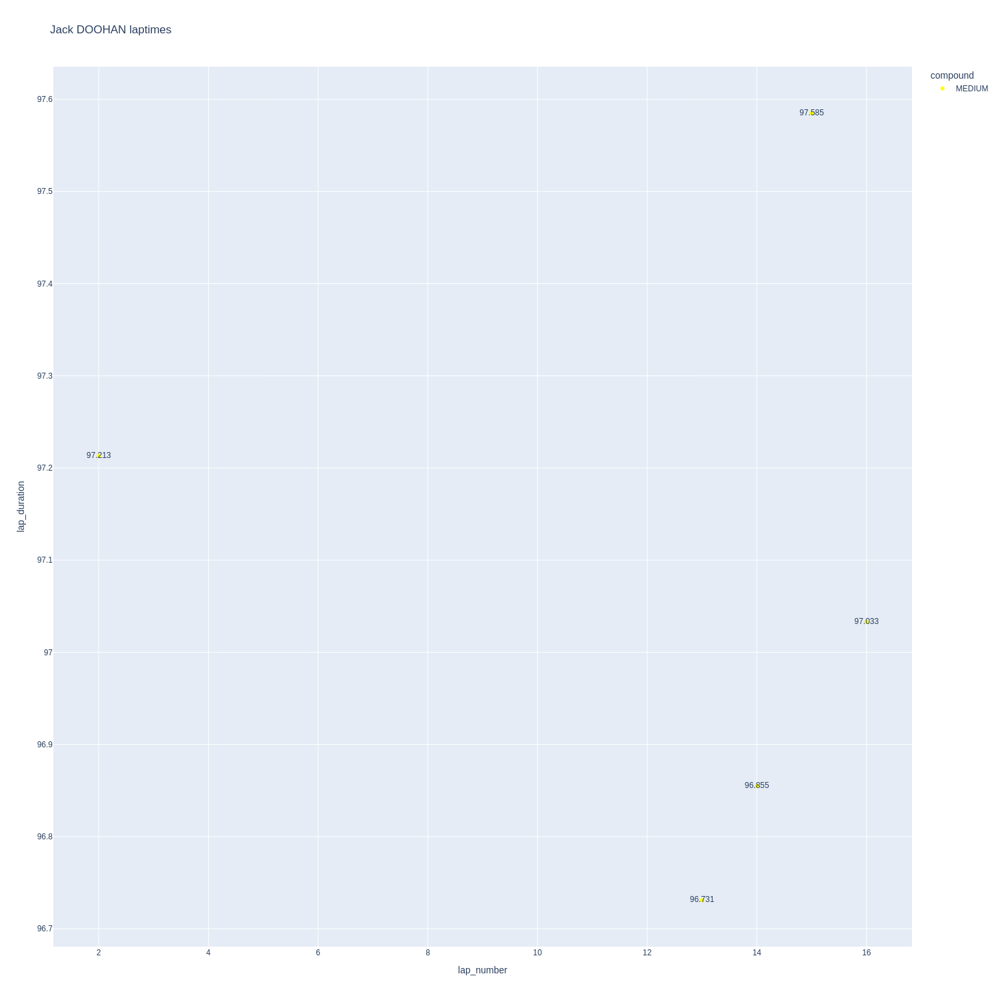

In [547]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

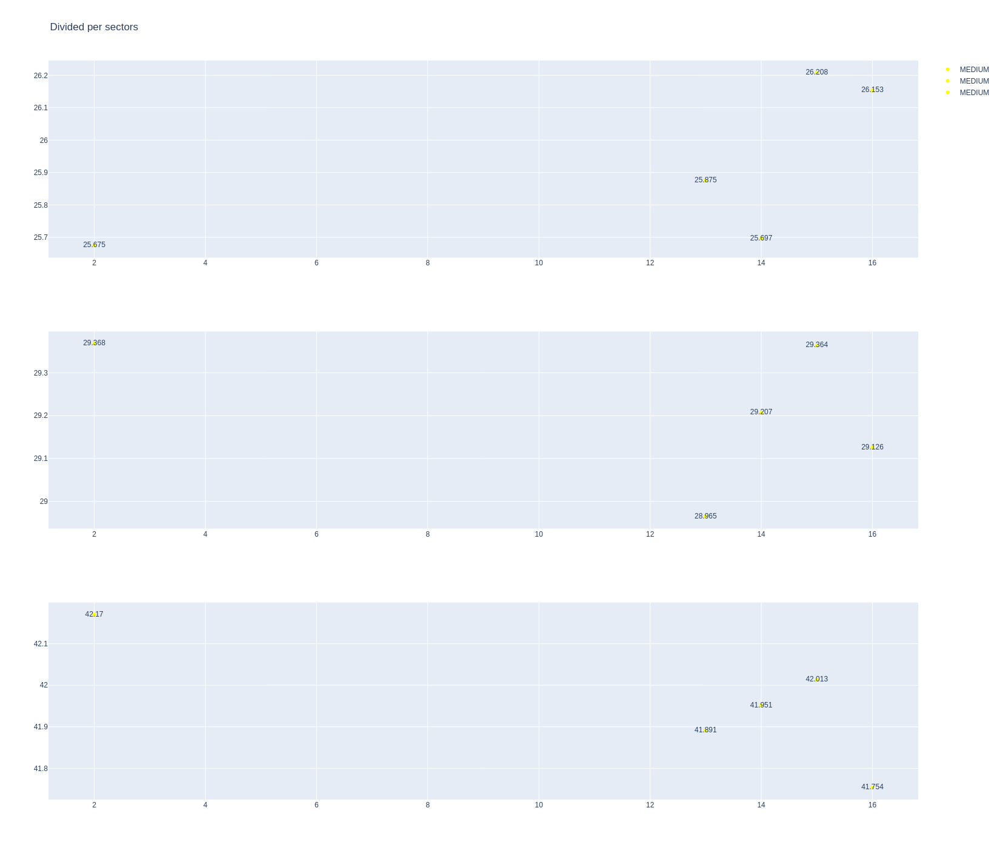

In [548]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [549]:
data = libraryDataF1.getinfolongruns(jointables2,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
250,Pierre GASLY,MEDIUM,2025-03-21T04:04:37.183000+00:00,12,25.667,28.867,41.761,96.295
270,Pierre GASLY,MEDIUM,2025-03-21T04:06:13.600000+00:00,13,25.888,29.080,41.649,96.617
289,Pierre GASLY,MEDIUM,2025-03-21T04:07:50.147000+00:00,14,26.052,29.462,41.499,97.013
305,Pierre GASLY,MEDIUM,2025-03-21T04:09:27.144000+00:00,15,26.922,29.416,41.993,98.331
323,Pierre GASLY,MEDIUM,2025-03-21T04:11:05.557000+00:00,16,26.528,29.707,41.883,98.118


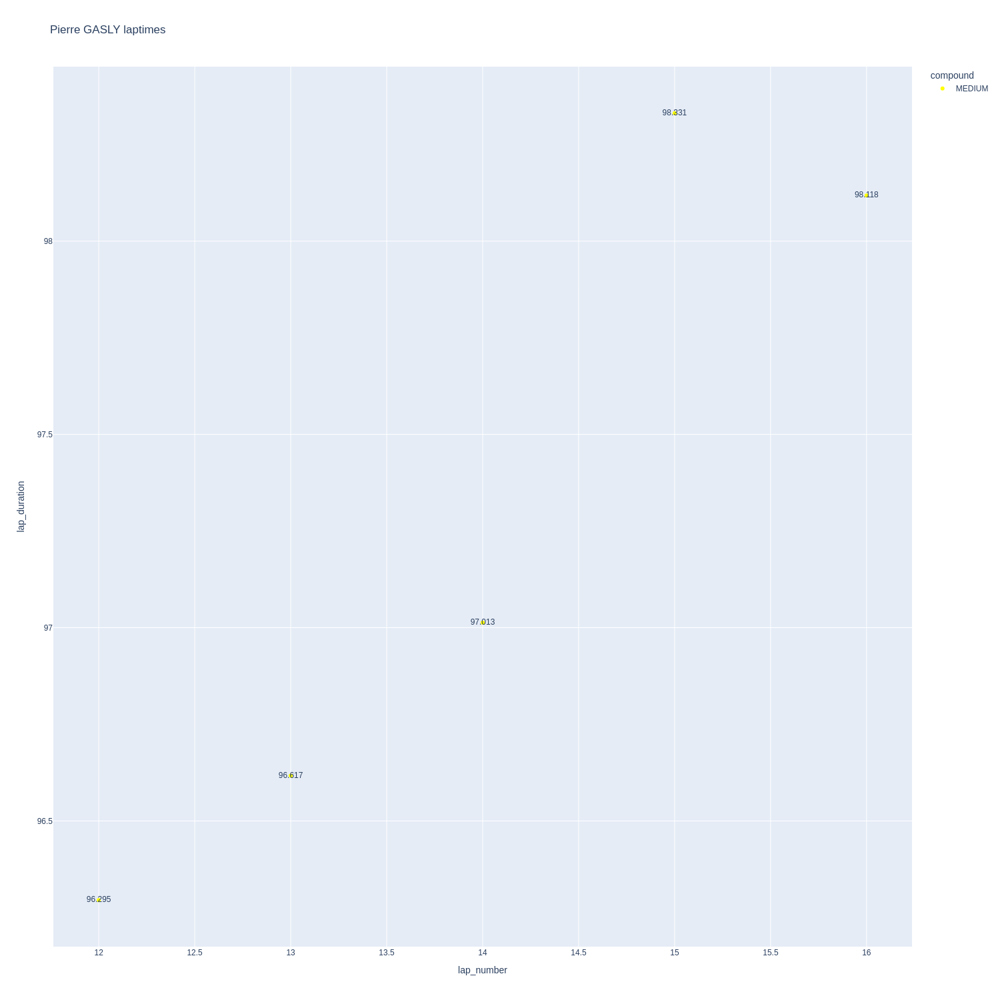

In [550]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

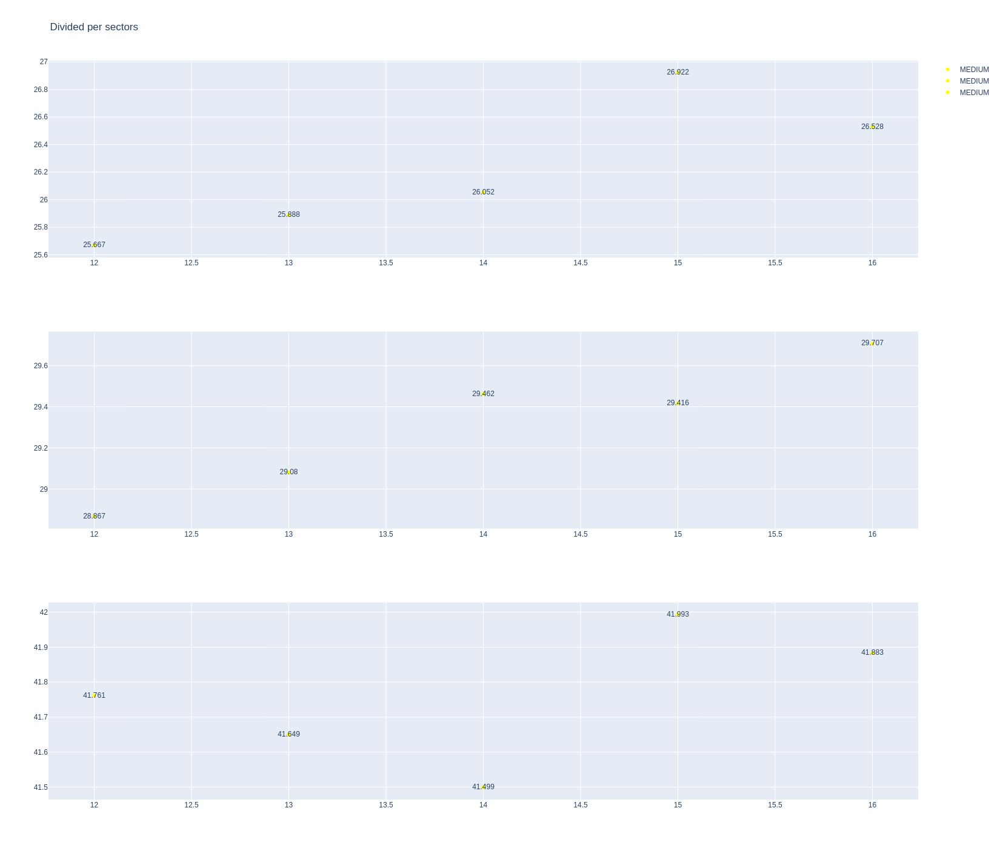

In [551]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [552]:
stintInformation.query('driver_number == 55 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
12,1255,9988,1,23,1,10,MEDIUM,0
17,1255,9988,1,55,1,11,MEDIUM,0
34,1255,9988,2,23,11,18,MEDIUM,0
37,1255,9988,2,55,12,12,MEDIUM,10
43,1255,9988,3,55,13,20,MEDIUM,11
49,1255,9988,3,23,19,19,MEDIUM,17
57,1255,9988,4,23,20,22,SOFT,0
61,1255,9988,4,55,21,21,MEDIUM,19
64,1255,9988,5,55,21,25,SOFT,0
70,1255,9988,5,23,23,25,MEDIUM,18


In [553]:
data = libraryDataF1.getinfolongruns(jointables2,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
198,Alexander ALBON,MEDIUM,2025-03-21T03:59:14.412000+00:00,12,25.789,28.987,41.663,96.439
212,Alexander ALBON,MEDIUM,2025-03-21T04:00:50.724000+00:00,13,25.890,29.125,41.687,96.702
227,Alexander ALBON,MEDIUM,2025-03-21T04:02:27.503000+00:00,14,25.897,29.132,41.706,96.735
243,Alexander ALBON,MEDIUM,2025-03-21T04:04:04.248000+00:00,15,26.109,29.416,42.152,97.677
262,Alexander ALBON,MEDIUM,2025-03-21T04:05:41.931000+00:00,16,26.219,29.582,42.294,98.095


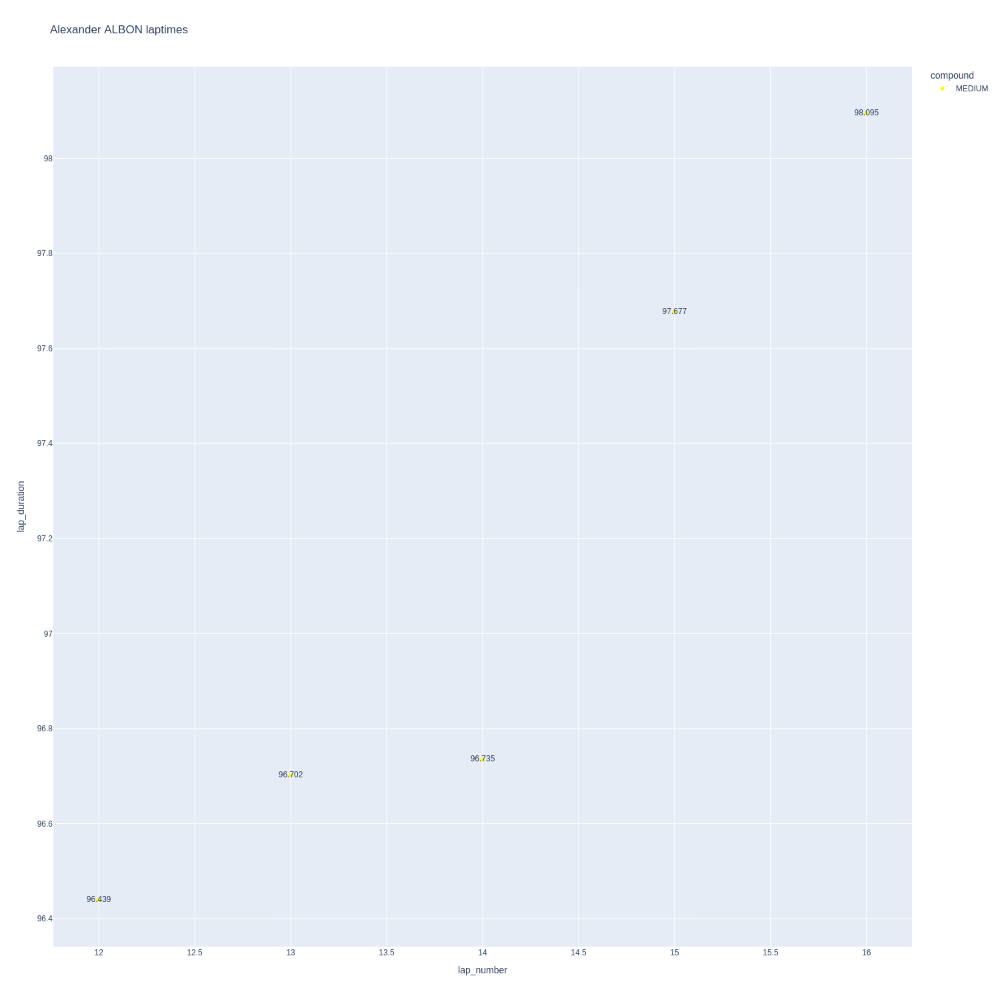

In [554]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

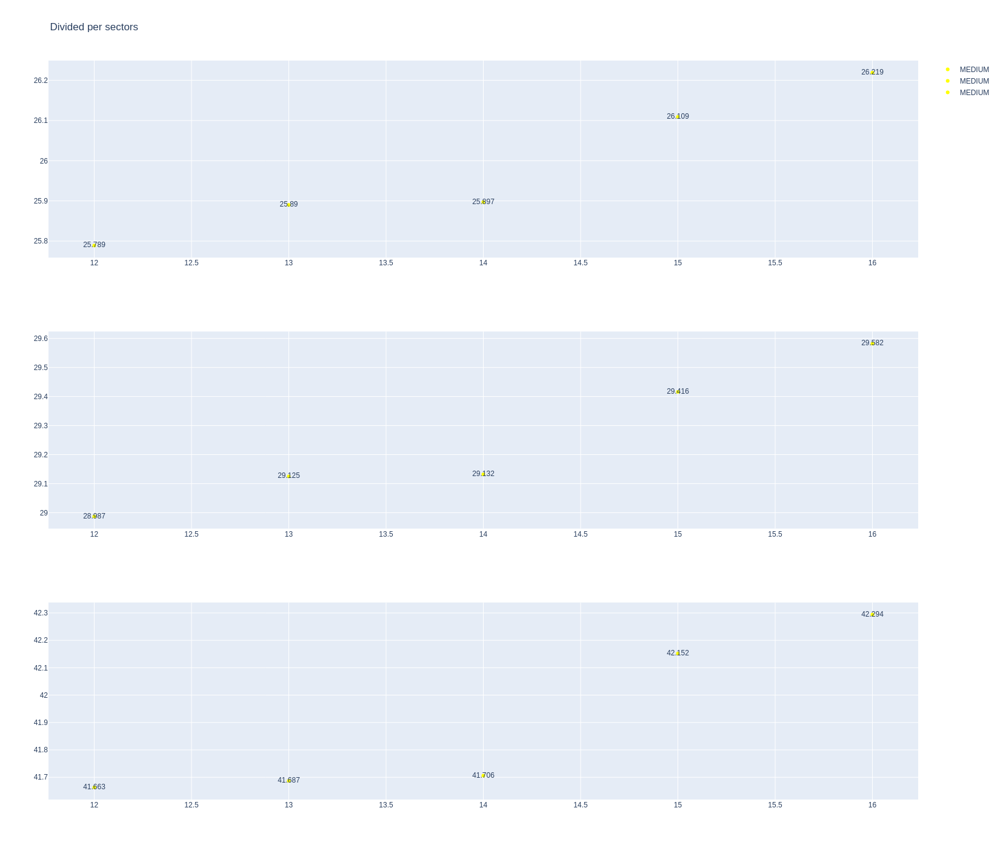

In [555]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [556]:
data= libraryDataF1.getinfolongruns(jointables2,55,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
22,Carlos SAINZ,MEDIUM,2025-03-21T03:32:26.863000+00:00,2,25.986,29.248,41.909,97.143
193,Carlos SAINZ,MEDIUM,2025-03-21T03:58:30.464000+00:00,13,25.802,28.855,41.458,96.115
204,Carlos SAINZ,MEDIUM,2025-03-21T04:00:06.630000+00:00,14,25.986,29.048,41.597,96.631
217,Carlos SAINZ,MEDIUM,2025-03-21T04:01:43.278000+00:00,15,26.069,29.273,41.866,97.208
236,Carlos SAINZ,MEDIUM,2025-03-21T04:03:20.403000+00:00,16,26.246,29.536,41.893,97.675
254,Carlos SAINZ,MEDIUM,2025-03-21T04:04:58.177000+00:00,17,26.168,29.383,42.332,97.883
273,Carlos SAINZ,MEDIUM,2025-03-21T04:06:36.063000+00:00,18,26.439,29.518,42.586,98.543


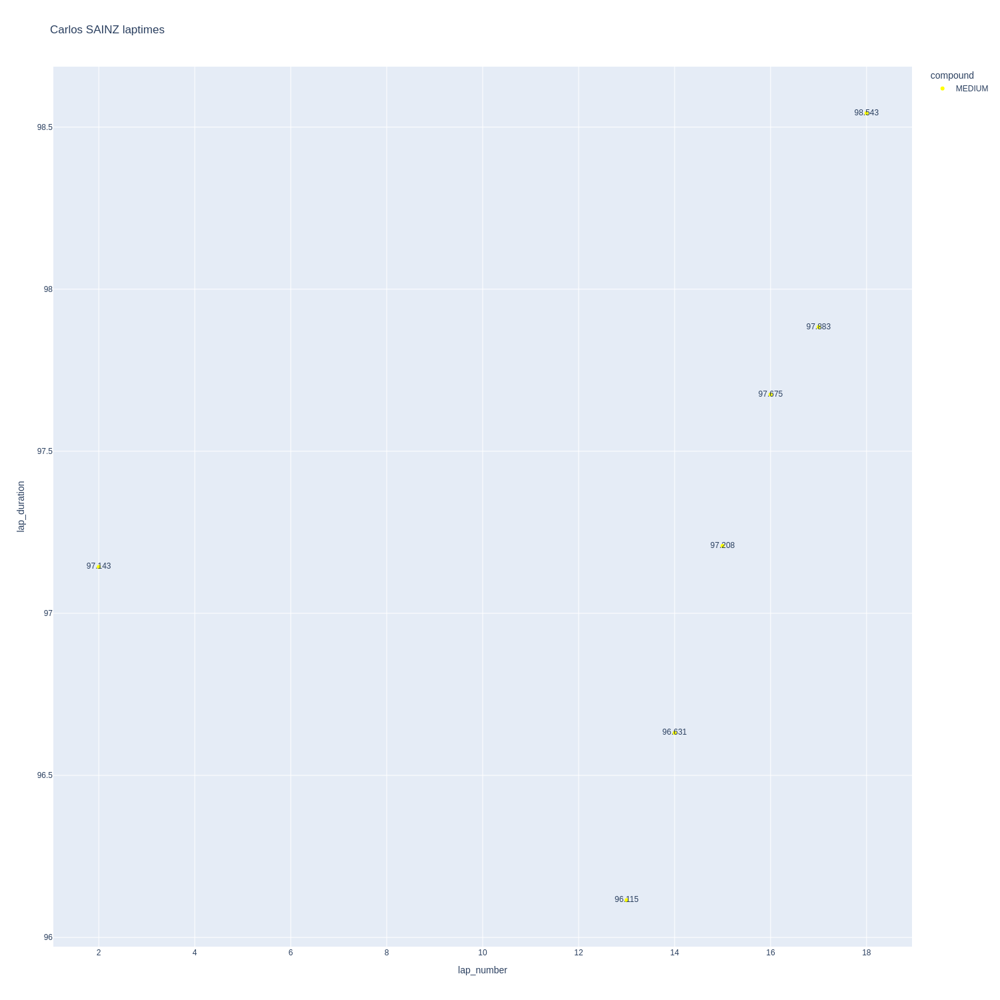

In [557]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

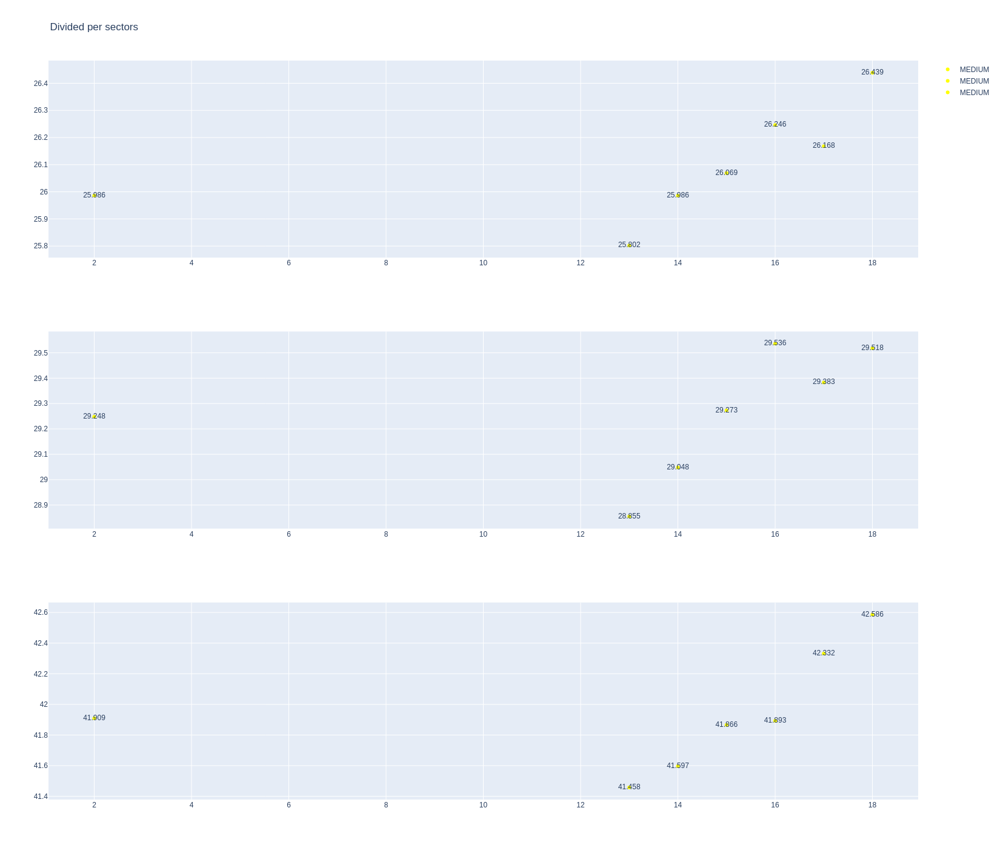

In [558]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [559]:
stintInformation.query('driver_number == 5 or driver_number == 27')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
2,1255,9988,1,27,1,6,MEDIUM,0
3,1255,9988,1,5,1,7,MEDIUM,0
22,1255,9988,2,27,7,11,MEDIUM,5
23,1255,9988,2,5,8,19,MEDIUM,6
38,1255,9988,3,27,12,16,MEDIUM,10
47,1255,9988,4,27,17,22,SOFT,0
59,1255,9988,3,5,20,25,SOFT,0


In [560]:
data = libraryDataF1.getinfolongruns(jointables2,5,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
28,Gabriel BORTOLETO,MEDIUM,2025-03-21T03:33:11.111000+00:00,2,26.422,30.071,42.261,98.754
72,Gabriel BORTOLETO,MEDIUM,2025-03-21T03:37:30.766000+00:00,4,26.342,29.248,41.573,97.163
248,Gabriel BORTOLETO,MEDIUM,2025-03-21T04:04:29.250000+00:00,13,26.254,29.466,42.781,98.501
288,Gabriel BORTOLETO,MEDIUM,2025-03-21T04:07:49.366000+00:00,15,26.259,29.385,42.811,98.455
306,Gabriel BORTOLETO,MEDIUM,2025-03-21T04:09:27.851000+00:00,16,26.745,30.080,42.585,99.410
324,Gabriel BORTOLETO,MEDIUM,2025-03-21T04:11:07.181000+00:00,17,26.897,29.716,42.453,99.066


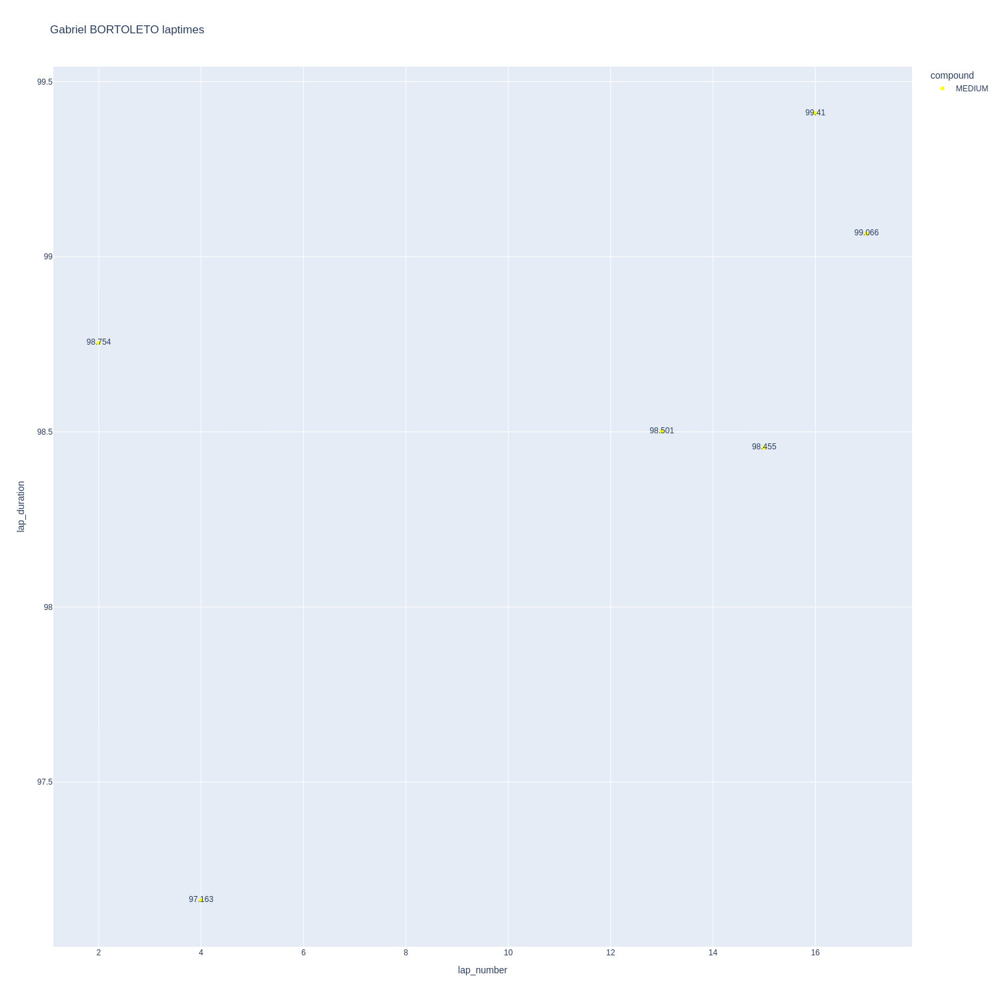

In [561]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

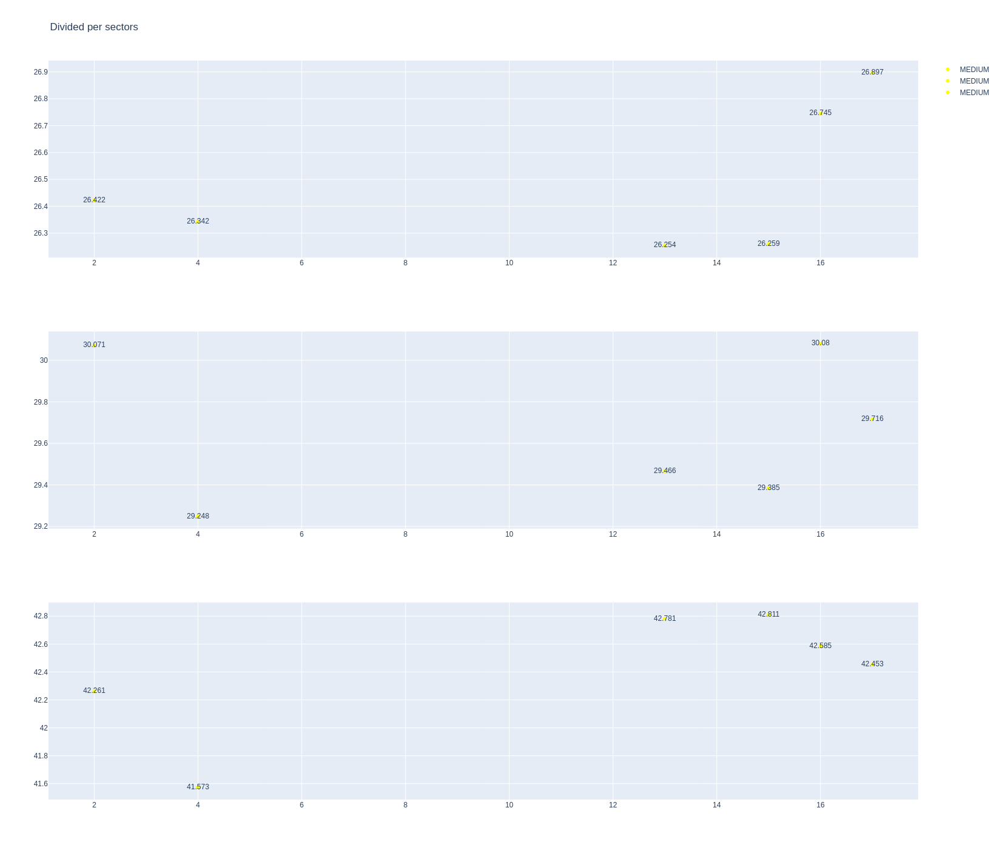

In [562]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [563]:
data = libraryDataF1.getinfolongruns(jointables2,27,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
39,Nico HULKENBERG,MEDIUM,2025-03-21T03:33:50.842000+00:00,2,26.463,29.082,41.494,97.039
269,Nico HULKENBERG,MEDIUM,2025-03-21T04:06:10.461000+00:00,12,25.597,29.587,42.550,97.734
287,Nico HULKENBERG,MEDIUM,2025-03-21T04:07:48.287000+00:00,13,25.724,29.300,41.539,96.563
304,Nico HULKENBERG,MEDIUM,2025-03-21T04:09:24.806000+00:00,14,25.938,29.086,41.593,96.617


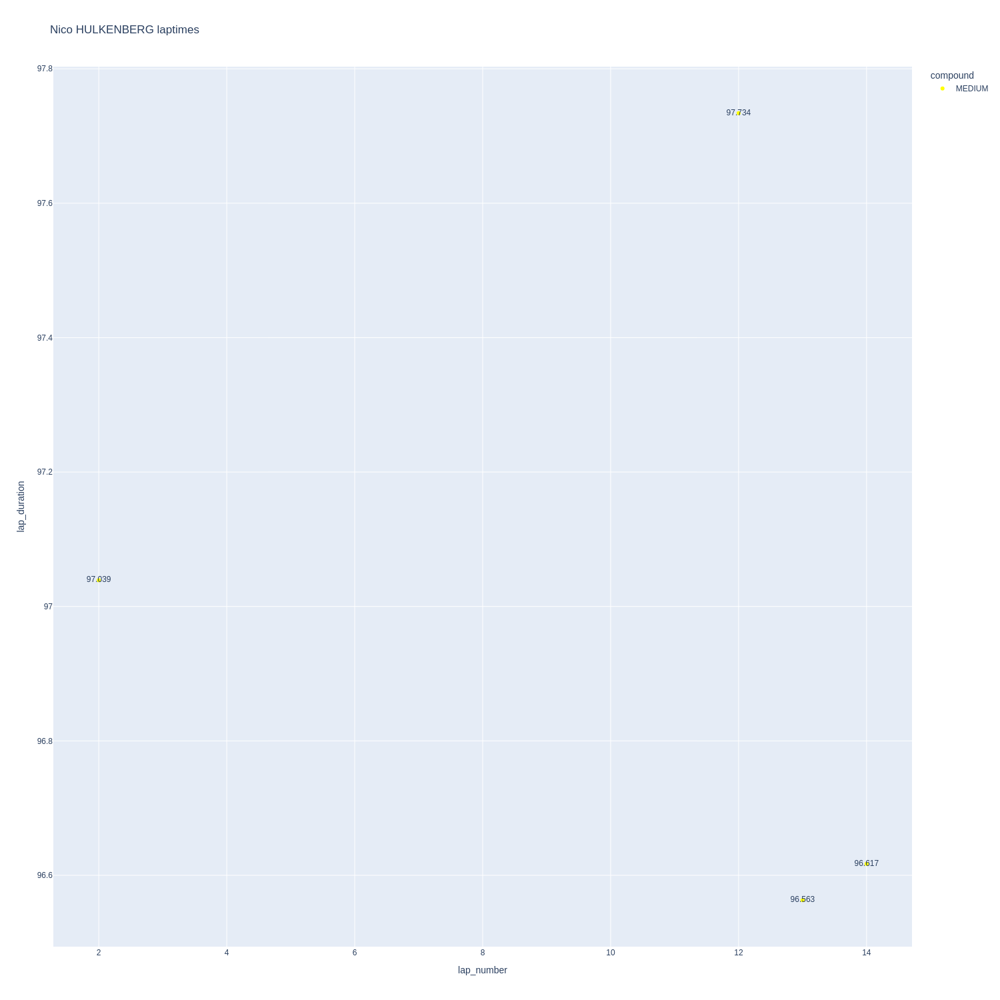

In [564]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

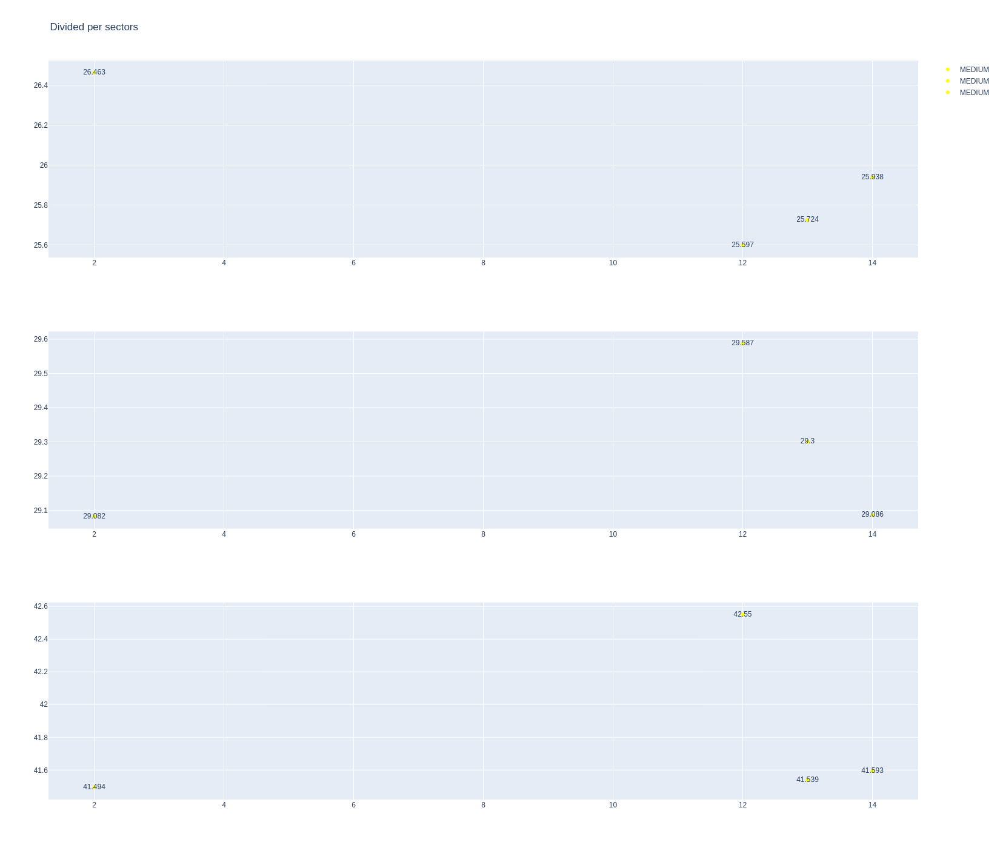

In [565]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Long runs mean for each driver

In [566]:
longrun_data = libraryDataF1.obtainLongRunData(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Sorted by lap duration
Only Mercedes and Red Bull did long stints. Red Bull had a poor pace and they had some problems in sector 2 with the degradation. On the other hand, Mercedes was faster in general but they had degradation in sector 3.
Haas suffered in the first sector.


In [576]:
sorted_laps = pd.DataFrame(longrun_data,columns=['driver','compound','lap_duration','sector1','sector2','sector3'])

In [577]:
sorted_laps.sort_values(by='lap_duration',ascending=True)

,driver,compound,lap_duration,sector1,sector2,sector3
8,Charles LECLERC,MEDIUM,96.481000,26.115000,28.488000,41.878000
1,Lando NORRIS,MEDIUM,96.832500,26.127167,29.104500,41.600833
18,Oscar PIASTRI,MEDIUM,96.919000,25.909000,29.461000,41.549000
12,Nico HULKENBERG,MEDIUM,96.988250,25.930500,29.263750,41.794000
4,Jack DOOHAN,MEDIUM,97.083400,25.921600,29.206000,41.955800
11,Alexander ALBON,MEDIUM,97.129600,25.980800,29.248400,41.900400
6,Andrea Kimi ANTONELLI,MEDIUM,97.153545,26.045909,29.528000,41.579636
7,Fernando ALONSO,MEDIUM,97.234000,25.654333,29.157333,42.422333
5,Pierre GASLY,MEDIUM,97.274800,26.211400,29.306400,41.757000
10,Yuki TSUNODA,MEDIUM,97.307200,26.188600,29.147000,41.971600


##### Sorted by sector 1
Piastri and Hamilton are strong in this sector being the  leaders of their teams. Also Alonso is strong and this could help him to win some positions. Red Bull will suffer on race.

In [569]:
sorted_laps.sort_values(by='sector1',ascending=True)[['driver','compound','sector1']]

,driver,compound,sector1
7,Fernando ALONSO,MEDIUM,25.654333
15,Lewis HAMILTON,MEDIUM,25.765500
18,Oscar PIASTRI,MEDIUM,25.909000
4,Jack DOOHAN,MEDIUM,25.921600
12,Nico HULKENBERG,MEDIUM,25.930500
11,Alexander ALBON,MEDIUM,25.980800
6,Andrea Kimi ANTONELLI,MEDIUM,26.045909
19,Oliver BEARMAN,MEDIUM,26.092286
16,Carlos SAINZ,MEDIUM,26.099429
3,Isack HADJAR,MEDIUM,26.109000


##### Sorted by sector 2
Ferrari is strong here so it could make sense to say that the car is focused on turns. Racing Bulls were fast here so it could help to make overcuts on race.

In [570]:
sorted_laps.sort_values(by='sector2',ascending=True)[['driver','compound','sector2']]

,driver,compound,sector2
8,Charles LECLERC,MEDIUM,28.488000
15,Lewis HAMILTON,MEDIUM,29.011500
3,Isack HADJAR,MEDIUM,29.050333
1,Lando NORRIS,MEDIUM,29.104500
10,Yuki TSUNODA,MEDIUM,29.147000
7,Fernando ALONSO,MEDIUM,29.157333
4,Jack DOOHAN,MEDIUM,29.206000
11,Alexander ALBON,MEDIUM,29.248400
12,Nico HULKENBERG,MEDIUM,29.263750
16,Carlos SAINZ,MEDIUM,29.265857


##### Sorted by sector 3
McLaren was the best here and if they take advantage this sector, they could extend the gap on race. Alpine could gain some positions thanks to the focus on the straight. Red Bull will suffer here.

In [571]:
sorted_laps.sort_values(by='sector3',ascending=True)[['driver','compound','sector3']]

,driver,compound,sector3
18,Oscar PIASTRI,MEDIUM,41.549000
6,Andrea Kimi ANTONELLI,MEDIUM,41.579636
1,Lando NORRIS,MEDIUM,41.600833
17,George RUSSELL,MEDIUM,41.685250
5,Pierre GASLY,MEDIUM,41.757000
12,Nico HULKENBERG,MEDIUM,41.794000
8,Charles LECLERC,MEDIUM,41.878000
11,Alexander ALBON,MEDIUM,41.900400
14,Esteban OCON,MEDIUM,41.905600
16,Carlos SAINZ,MEDIUM,41.948714


#### Long runs mean

In [572]:
longruns_summary = libraryDataF1.obtainMeanLongRuns(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Mean pace per compound

In [573]:
libraryDataF1.showDataLongRuns(longruns_summary,"MEDIUM","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
8,C LECLERC,96.481
1,L NORRIS,96.832
18,O PIASTRI,96.919
12,N HULKENBERG,96.988
4,J DOOHAN,97.083
11,A ALBON,97.130
6,A ANTONELLI,97.154
7,F ALONSO,97.234
5,P GASLY,97.275
10,Y TSUNODA,97.307


In [574]:
#libraryDataF1.showDataLongRuns(longruns_summary,"SOFT","mean_lap_time",['driver','mean_lap_time'])

In [575]:
#libraryDataF1.showDataLongRuns(longruns_summary,"HARD","mean_lap_time",['driver','mean_lap_time'])

## Sprint Qualyfing
### Race control
This section has been added in order to know which laps has been deleted and knowing what happened on track during this session as well.

In [41]:
libraryDataF1.obtain_information('race_control',session_key=9989).query('message.str.contains("GREEN")')


,session_key,meeting_key,date,category,flag,lap_number,message,driver_number,scope,sector
0,9989,1255,2025-03-21T07:30:00+00:00,Flag,GREEN,None,GREEN LIGHT - PIT EXIT OPEN,None,Track,NaN
64,9989,1255,2025-03-21T07:49:00+00:00,Flag,GREEN,None,GREEN LIGHT - PIT EXIT OPEN,None,Track,NaN
116,9989,1255,2025-03-21T08:06:00+00:00,Flag,GREEN,None,GREEN LIGHT - PIT EXIT OPEN,None,Track,NaN


### Obtain setup

In [20]:
qualyfing = libraryDataF1.obtain_information('laps',session_key=9989)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9989)
drivers = libraryDataF1.obtain_information('drivers',session_key=9989)
libraryDataF1.obtain_drivers_colours(drivers)

In race control dataset, I can see a lot of laptimes deleted, principally for track limits. Those laps deleted were deleted from dataset in order to obtain only the valid laps for the analysis.

In [14]:
# ids_deleted = [36,87,69,103,176]
# for idv in ids_deleted:
#     qualyfing = qualyfing.drop(idv)

In [21]:
bestlap = qualyfing.loc[qualyfing.groupby(['driver_number'])['lap_duration'].idxmin()].sort_values(by=['lap_duration'],ascending=True)

The fastest lap  is 90.849 seconds (1.30.849= so that to obtain the competitve laps the fastest lap will be multiplied by 1.07 (96.823 seconds) due to, according to the rules all the drivers have to do unless one lap within this gap.

In [28]:
competitiveLaps = qualyfing.query("is_pit_out_lap == False and lap_duration < 96.823")

In [76]:
drivers_list = list(competitiveLaps['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_information_qualy(driver,competitiveLaps,newdataset)
jointables = pd.merge(newdataset,drivers,on=['driver_number'])
jointables.sort_values(by=['fastest_lap'],ascending=True)
print()

In [86]:
jointables

,driver_number,fastest_lap,delta,st_speed,i1_speed,i2_speed,session_key,meeting_key,broadcast_name,country_code,first_name,full_name,headshot_url,last_name,team_colour,team_name,name_acronym
0,5,92.539,1.690,332,281.0,274,9989,1255,G BORTOLETO,None,Gabriel,Gabriel BORTOLETO,https://media.formula1.com/d_driver_fallback_i...,Bortoleto,52E252,Kick Sauber,BOR
1,22,91.773,0.924,333,279.0,274,9989,1255,Y TSUNODA,JPN,Yuki,Yuki TSUNODA,https://media.formula1.com/d_driver_fallback_i...,Tsunoda,6692FF,Racing Bulls,TSU
2,1,90.867,0.018,334,281.0,274,9989,1255,M VERSTAPPEN,NED,Max,Max VERSTAPPEN,https://media.formula1.com/d_driver_fallback_i...,Verstappen,3671C6,Red Bull Racing,VER
3,6,92.171,1.322,331,280.0,273,9989,1255,I HADJAR,None,Isack,Isack HADJAR,https://media.formula1.com/d_driver_fallback_i...,Hadjar,6692FF,Racing Bulls,HAD
4,10,92.640,1.791,330,278.0,274,9989,1255,P GASLY,FRA,Pierre,Pierre GASLY,https://media.formula1.com/d_driver_fallback_i...,Gasly,0093CC,Alpine,GAS
5,7,92.575,1.726,330,280.0,274,9989,1255,J DOOHAN,None,Jack,Jack DOOHAN,https://media.formula1.com/d_driver_fallback_i...,Doohan,0093CC,Alpine,DOO
6,87,91.978,1.129,329,280.0,273,9989,1255,O BEARMAN,None,Oliver,Oliver BEARMAN,https://media.formula1.com/d_driver_fallback_i...,Bearman,B6BABD,Haas F1 Team,BEA
7,31,92.651,1.802,325,278.0,274,9989,1255,E OCON,FRA,Esteban,Esteban OCON,https://media.formula1.com/d_driver_fallback_i...,Ocon,B6BABD,Haas F1 Team,OCO
8,44,90.849,0.000,332,280.0,276,9989,1255,L HAMILTON,GBR,Lewis,Lewis HAMILTON,https://media.formula1.com/d_driver_fallback_i...,Hamilton,E80020,Ferrari,HAM
9,12,91.475,0.626,334,281.0,274,9989,1255,A ANTONELLI,None,Andrea Kimi,Andrea Kimi ANTONELLI,https://media.formula1.com/d_driver_fallback_i...,Antonelli,27F4D2,Mercedes,ANT


#### Best lap per driver compared with the best lap of the session

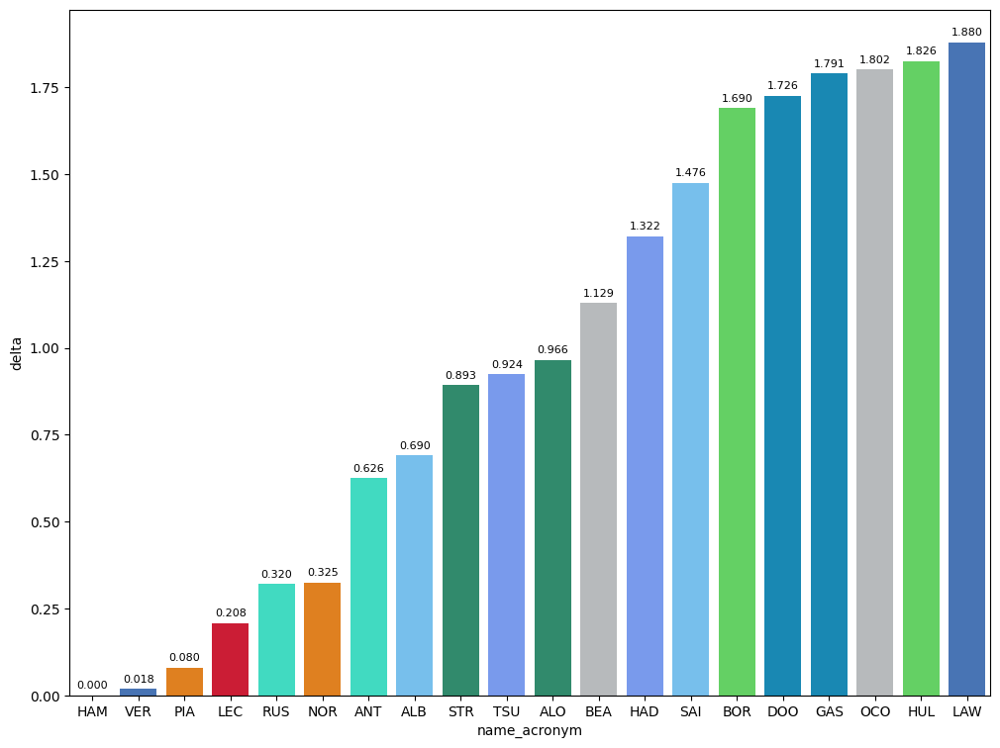

In [88]:
dt = jointables.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

In [32]:
mergequaly = pd.merge(competitiveLaps,drivers,on=['driver_number'])

In [42]:
# In order to know when each session finished, race control dataset will be consulted.
maximumDateQ1 = "date_start <'2025-03-21T07:49:00+00:00	'"
maximumDateQ2 = "date_start <'2025-03-21T08:06:00+00:00' and date_start >='2025-03-21T07:49:00+00:00'"
maximumDateQ3 = "date_start >'2025-03-21T08:06:00+00:00'"

### Speed trap

#### Maximum speed per drivers

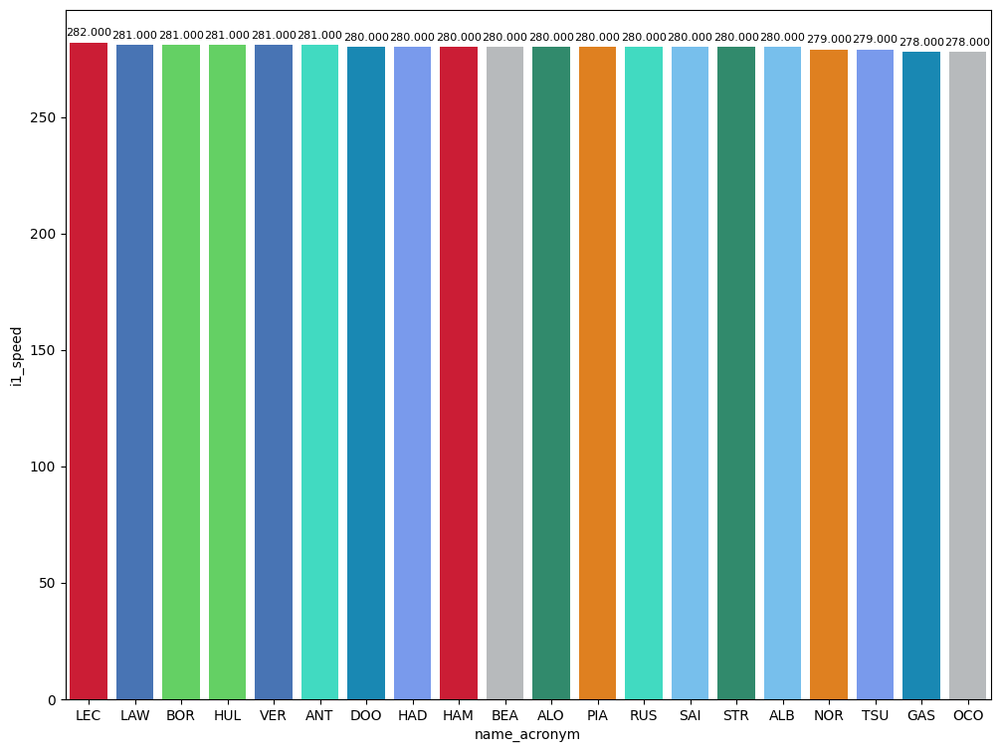

In [43]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

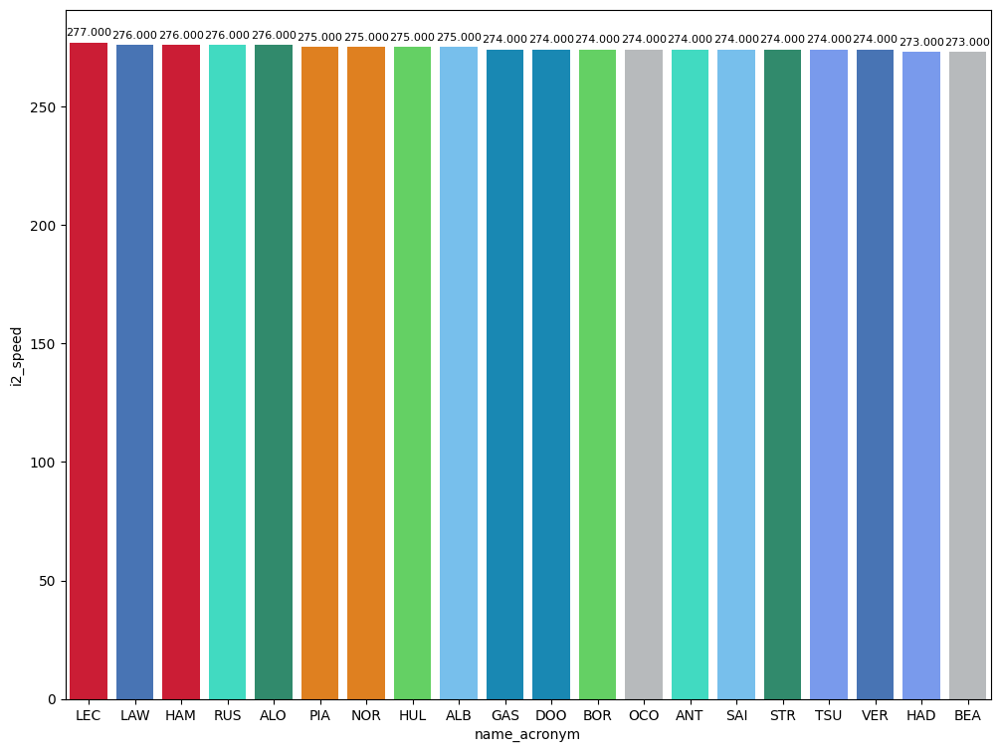

In [44]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

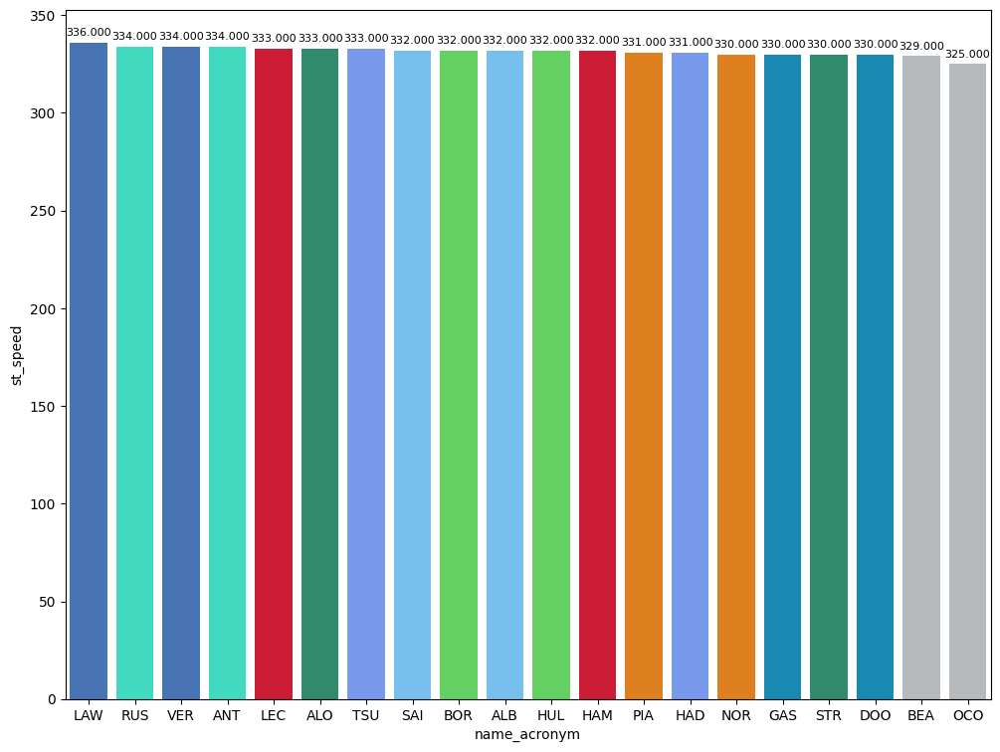

In [45]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

### Sprint Qualyfing 1

In [46]:
q1Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ1).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [47]:
#Reference
P15 = q1Data[14:15]

In [48]:
print(
"Driver:",P15.full_name.to_string(index=False),
"Sector 1: ",P15.duration_sector_1.to_string(index=False),
"Sector 2: ",P15.duration_sector_2.to_string(index=False),
"Sector 3: ",P15.duration_sector_3.to_string(index=False)
)

Driver: Gabriel BORTOLETO Sector 1:  24.608 Sector 2:  27.854 Sector 3:  40.077


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.

In [49]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[15::].iterrows():
    newdataset2 =  libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,7,0.036,0.001,0.091,-0.056,DOO
1,10,0.101,0.310,-0.026,-0.183,GAS
2,31,0.112,0.094,-0.056,0.074,OCO
3,27,0.136,-0.002,0.052,0.086,HUL
4,30,0.190,0.172,-0.185,0.203,LAW


In [50]:
#libraryDataF1.draw_gap(P15,15,20,q1Data,drivers,session)

##### Analysis with the drivers that finished better than the driver at risk


In [51]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[0:14].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,44,-1.327,-0.193,-0.426,-0.708,HAM
1,4,-1.143,-0.401,-0.299,-0.443,NOR
2,16,-1.021,-0.097,-0.253,-0.671,LEC
3,81,-0.816,-0.099,-0.376,-0.341,PIA
4,1,-0.623,-0.075,-0.220,-0.328,VER
5,63,-0.587,-0.003,-0.232,-0.352,RUS
6,12,-0.540,-0.131,-0.004,-0.405,ANT
7,14,-0.418,-0.159,-0.094,-0.165,ALO
8,6,-0.368,0.049,-0.177,-0.240,HAD
9,87,-0.270,0.160,-0.209,-0.221,BEA


#### Best sector per driver

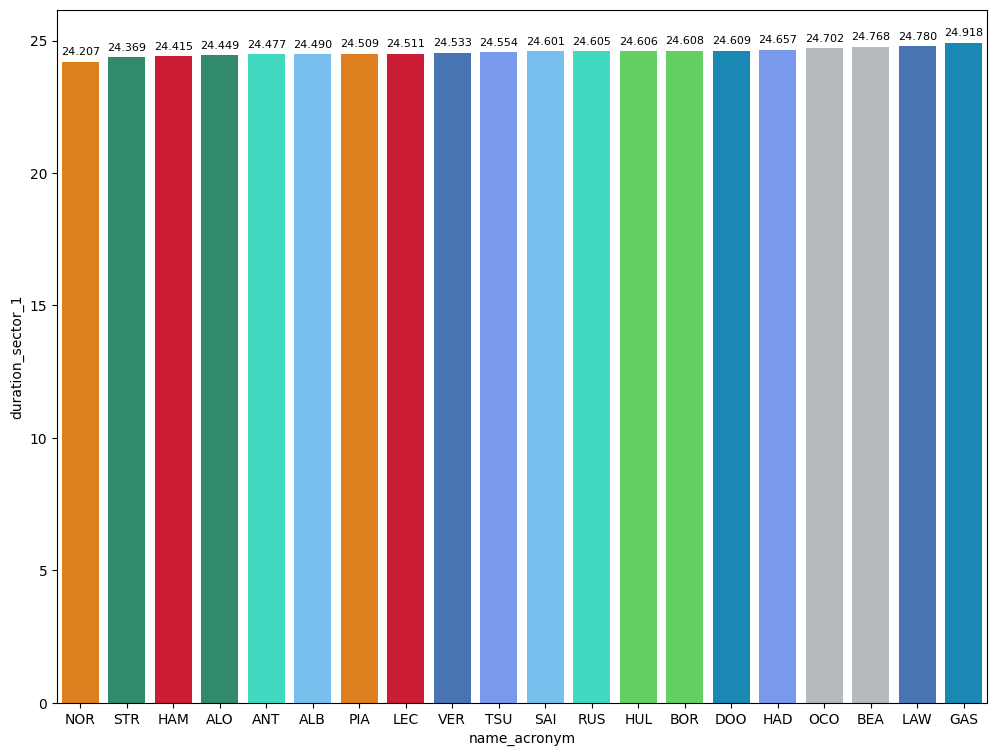

In [55]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q1Data.sort_values(by=['duration_sector_1'],ascending=True))

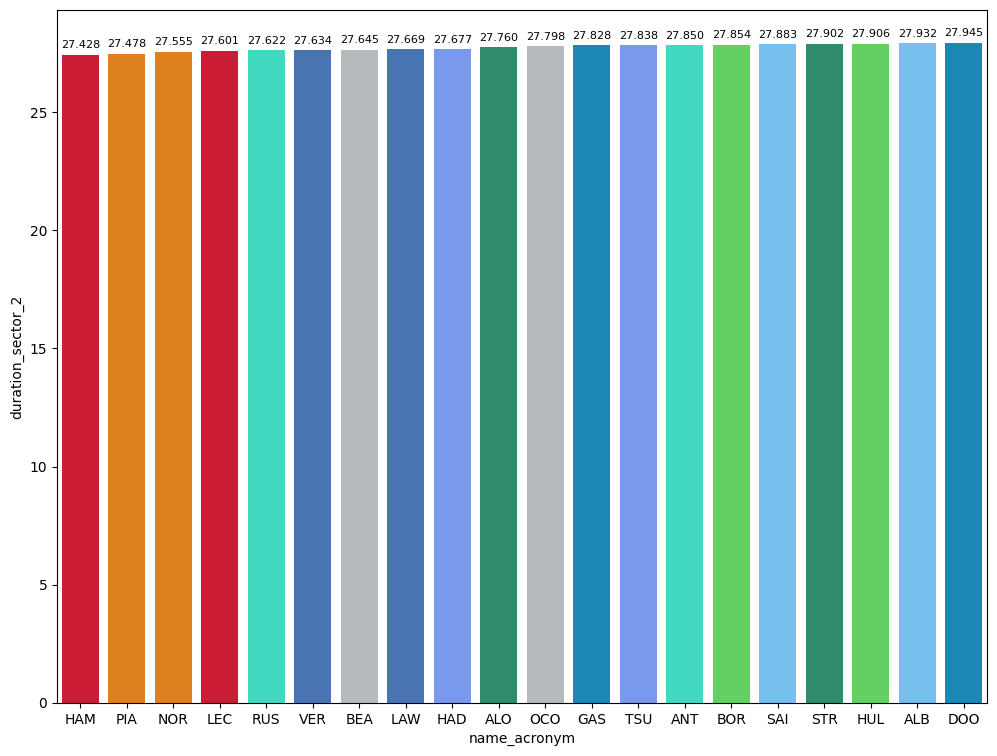

In [56]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q1Data.sort_values(by=['duration_sector_2'],ascending=True))

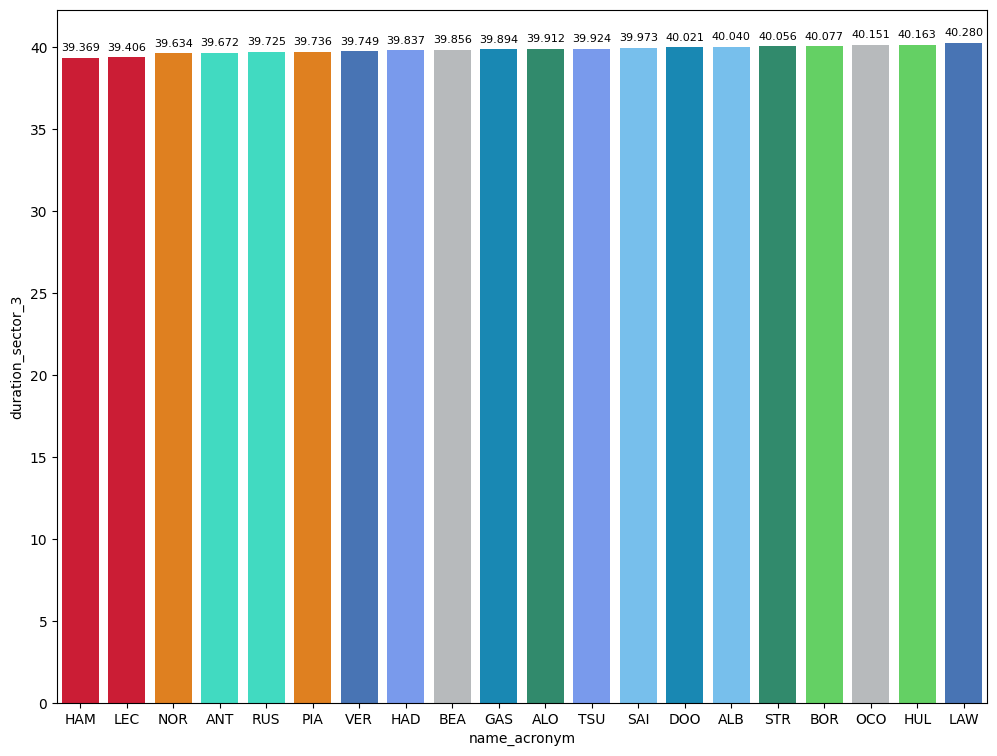

In [57]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q1Data.sort_values(by=['duration_sector_3'],ascending=True))

### Sprint Qualyfing 2

In [58]:
q2Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ2).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [59]:
#Reference
P10 = q2Data[9:10]
print(
"Driver:",P10.full_name.to_string(index=False),
"Sector 1: ",P10.duration_sector_1.to_string(index=False),
"Sector 2: ",P10.duration_sector_2.to_string(index=False),
"Sector 3: ",P10.duration_sector_3.to_string(index=False)
)

Driver: Yuki TSUNODA Sector 1:  24.425 Sector 2:  27.512 Sector 3:  39.857


In [60]:
#libraryDataF1.draw_gap(P10,10,15,q2Data,drivers,session)

In [61]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[10::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,14,0.021,-0.033,0.100,-0.046,ALO
1,87,0.184,0.113,0.010,0.061,BEA
2,55,0.531,0.190,0.156,0.185,SAI
3,5,0.770,0.427,0.171,0.172,BOR


#### Best sector per driver

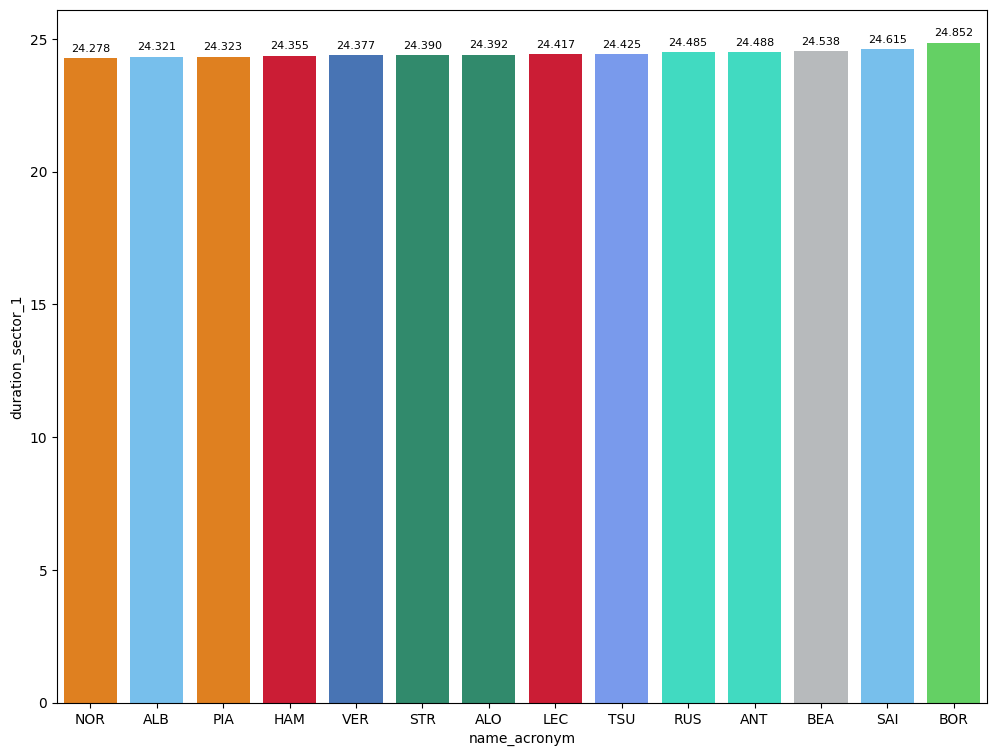

In [62]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q2Data.sort_values(by=['duration_sector_1'],ascending=True))

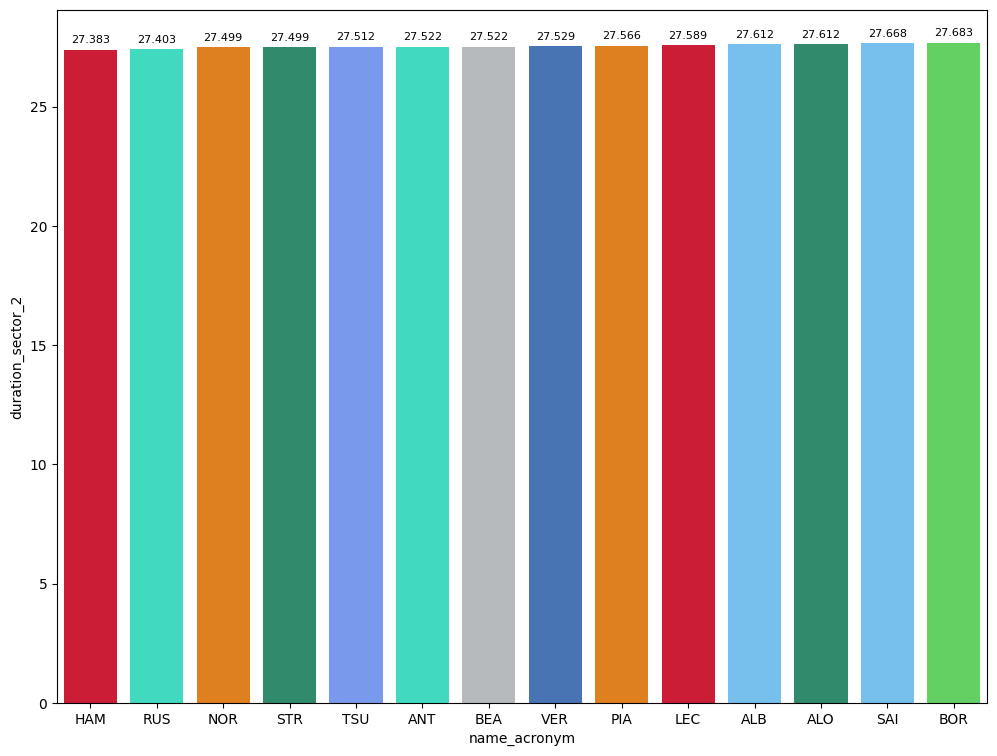

In [63]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q2Data.sort_values(by=['duration_sector_2'],ascending=True))

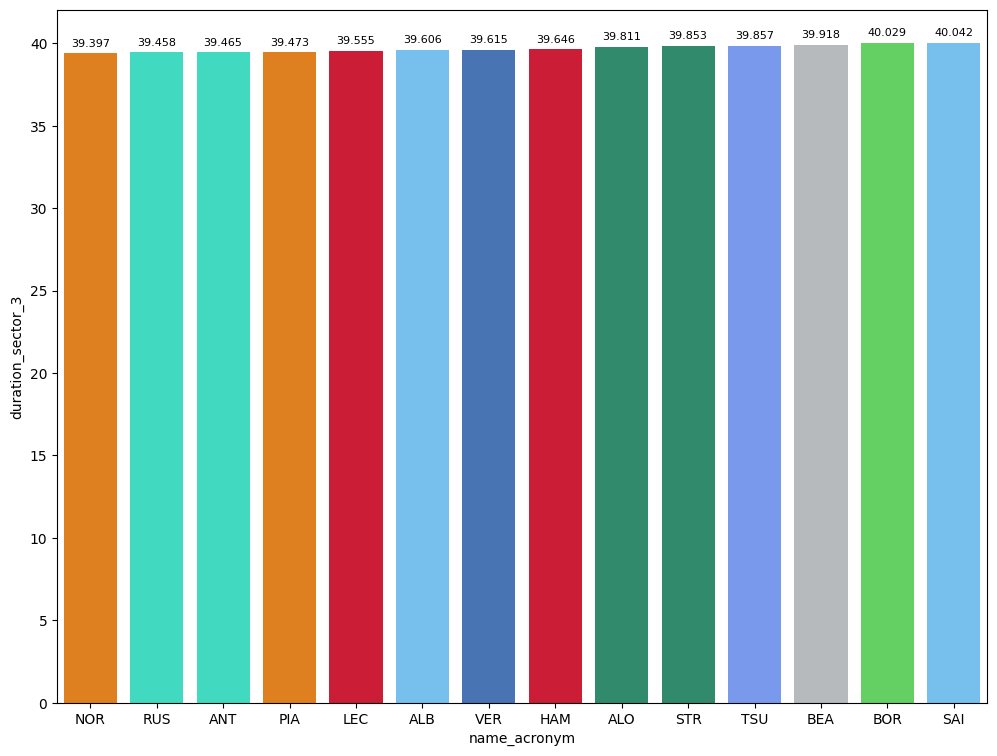

In [64]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q2Data.sort_values(by=['duration_sector_3'],ascending=True))

### Sprint Qualyfing 3

In [65]:
q3Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ3).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

In [66]:
#Reference
P1 = q3Data[:1]
print(
"Driver:",P1.full_name.to_string(index=False),
"Sector 1: ",P1.duration_sector_1.to_string(index=False),
"Sector 2: ",P1.duration_sector_2.to_string(index=False),
"Sector 3: ",P1.duration_sector_3.to_string(index=False)
)

Driver: Lewis HAMILTON Sector 1:  24.261 Sector 2:  27.249 Sector 3:  39.339


##### Comparaison with poleman
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [67]:
newdataset2 = pd.DataFrame()
for index,row in q3Data[1::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P1,newdataset2)
newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,1,0.018,0.008,0.112,-0.102,VER
1,81,0.080,0.036,0.068,-0.024,PIA
2,16,0.208,0.061,0.135,0.012,LEC
3,63,0.320,0.041,0.176,0.103,RUS
4,4,0.544,0.032,0.191,0.321,NOR
5,12,0.889,0.321,0.403,0.165,ANT
6,22,0.924,0.089,0.378,0.457,TSU
7,23,1.003,0.154,0.453,0.396,ALB
8,18,1.133,-0.030,0.522,0.641,STR


#### Best sector per driver

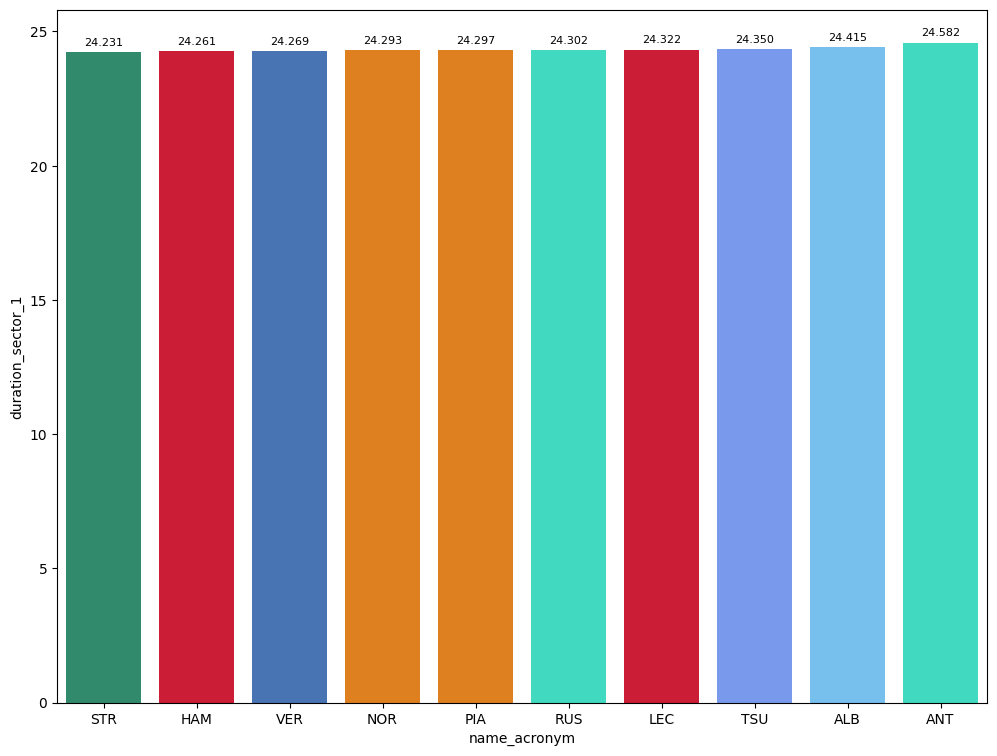

In [68]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q3Data.sort_values(by=['duration_sector_1'],ascending=True))

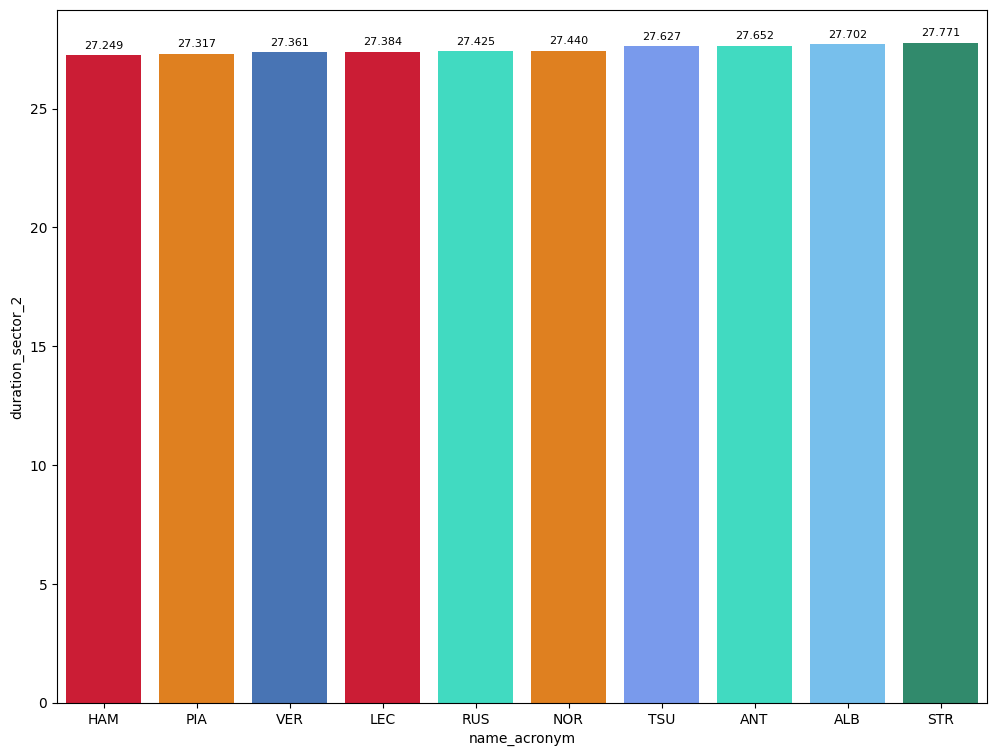

In [69]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q3Data.sort_values(by=['duration_sector_2'],ascending=True))

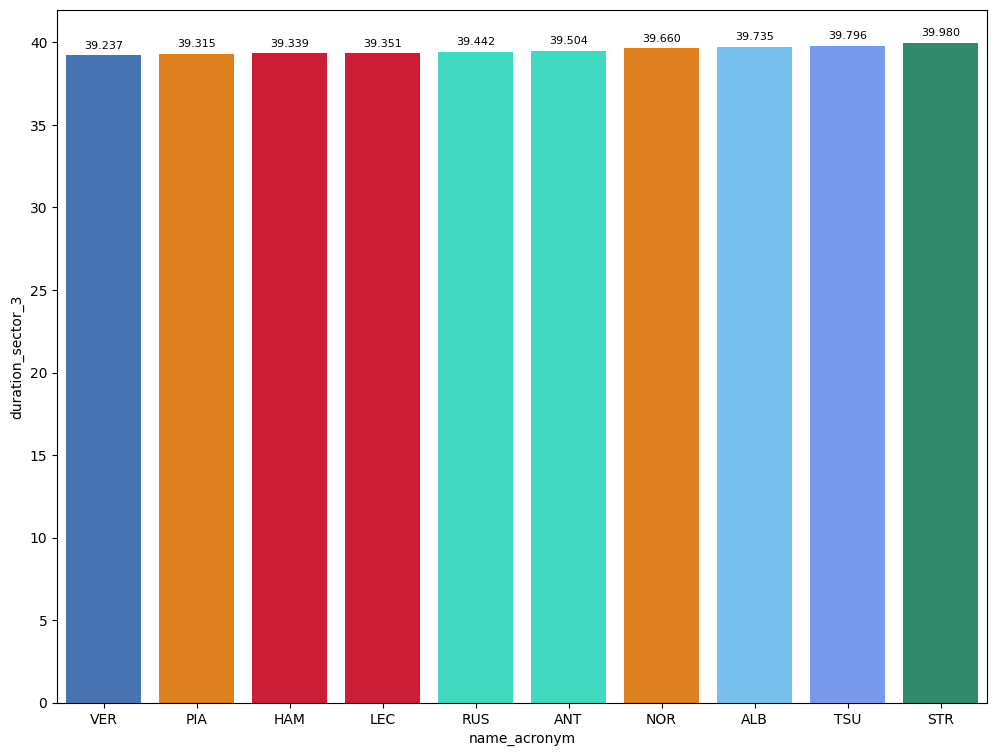

In [70]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q3Data.sort_values(by=['duration_sector_3'],ascending=True))

### Best sector in the session

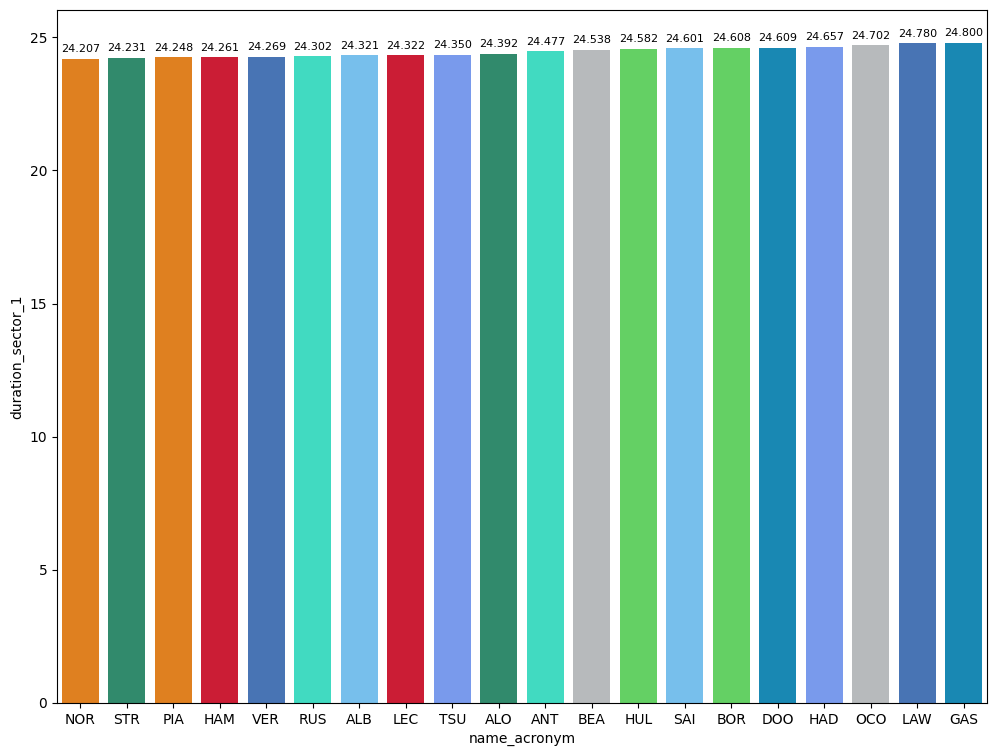

In [71]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_1'].min().sort_values(ascending=True)).reset_index())

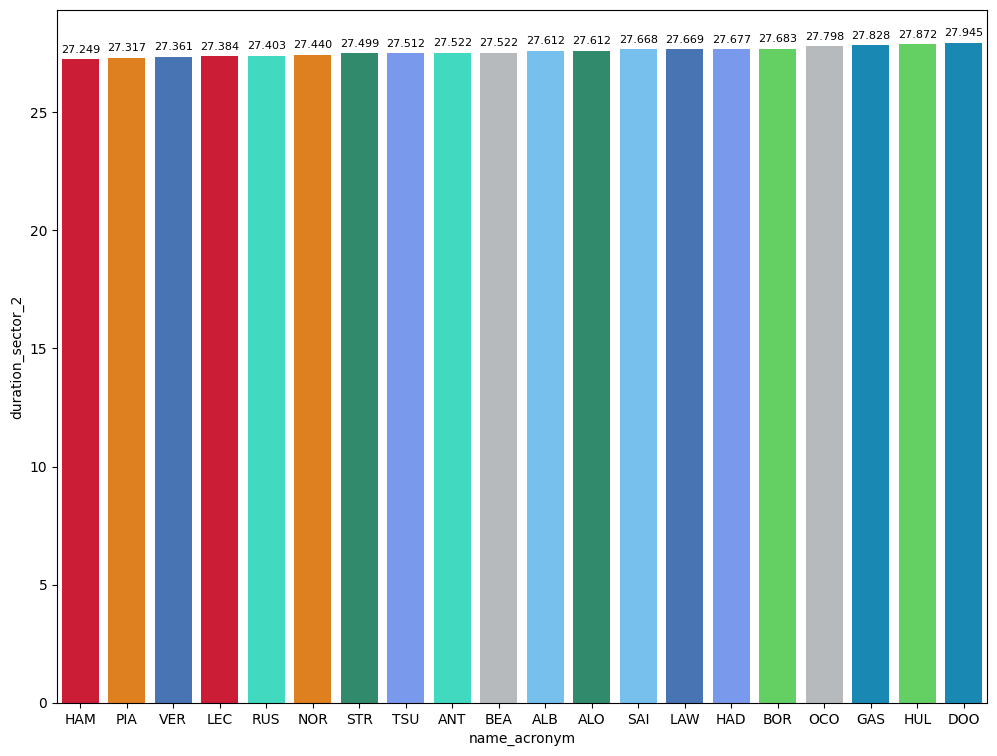

In [72]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_2'].min().sort_values(ascending=True)).reset_index())

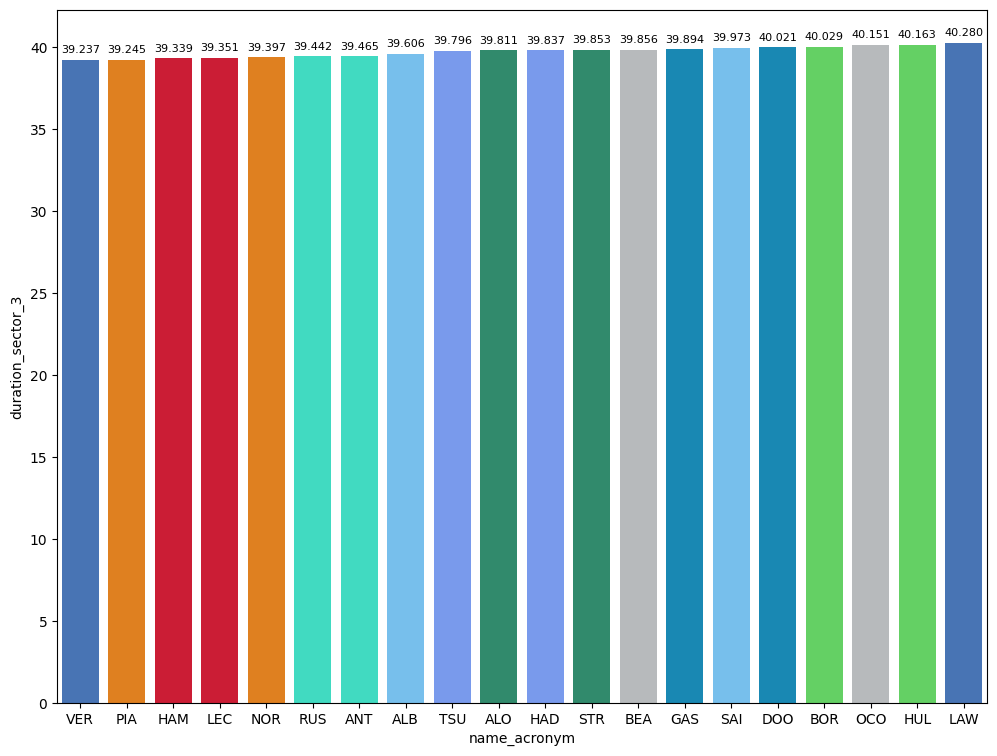

In [73]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_3'].min().sort_values(ascending=True)).reset_index())

### Comparaison between the poleman and the second

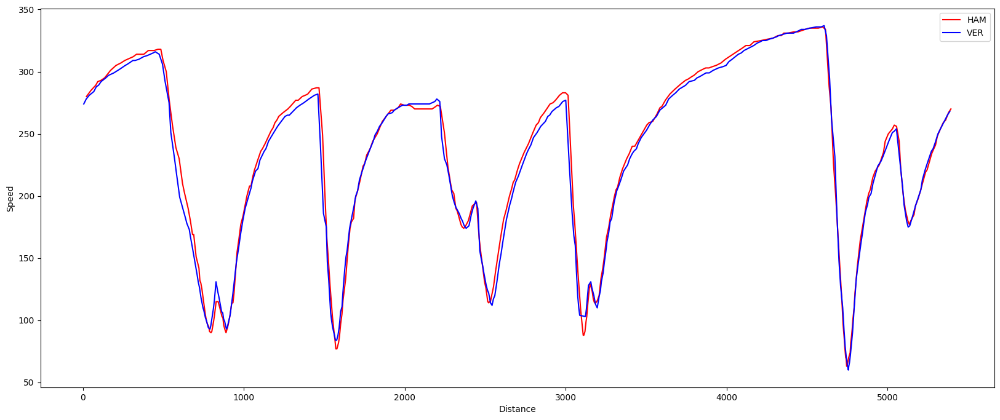

In [90]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

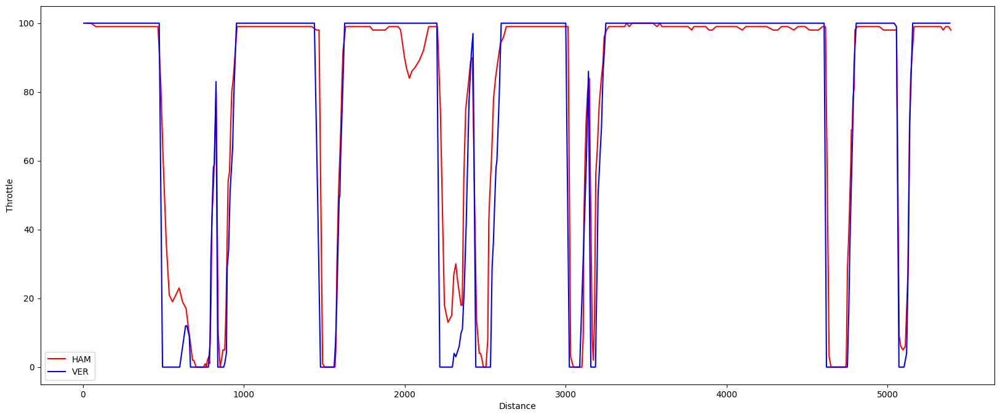

In [91]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

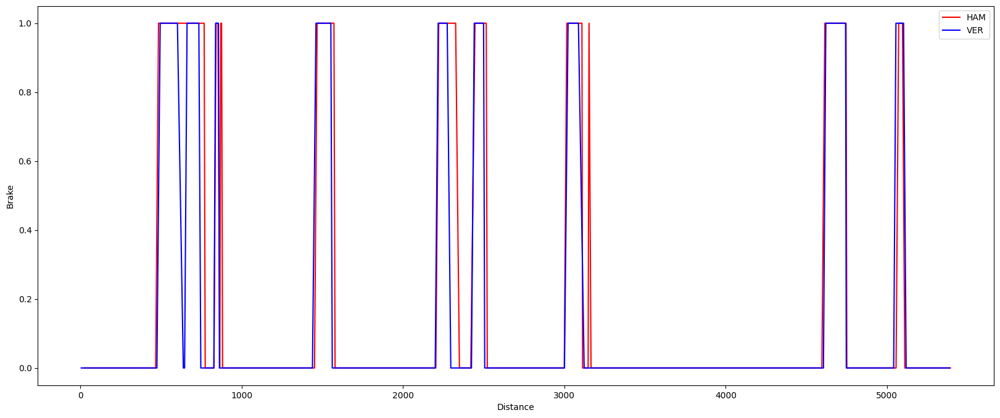

In [92]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

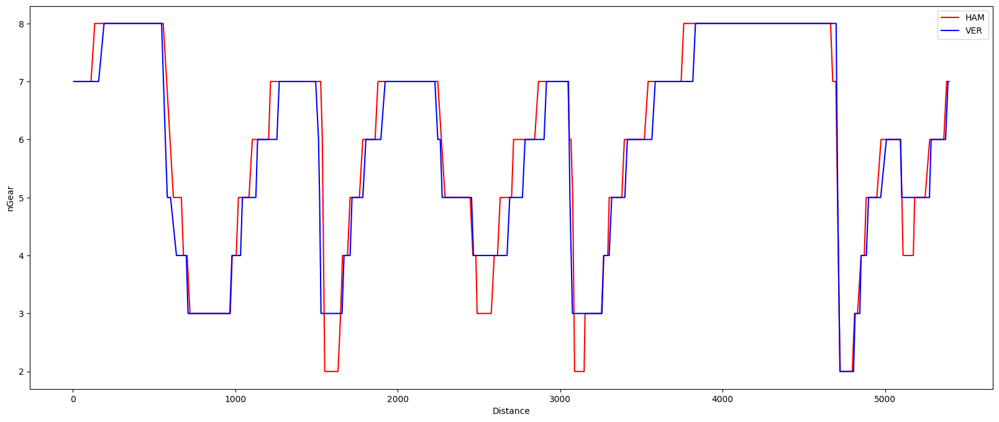

In [93]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Sprint

In [94]:
race = libraryDataF1.obtain_information('laps',session_key=9993)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9993)
drivers = libraryDataF1.obtain_information('drivers',session_key=9993)
libraryDataF1.obtain_drivers_colours(drivers)

In [95]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables = pd.merge(race,stintsDataFrame,on=['lap_number','driver_number'])

### Top speed captured in the speed trap

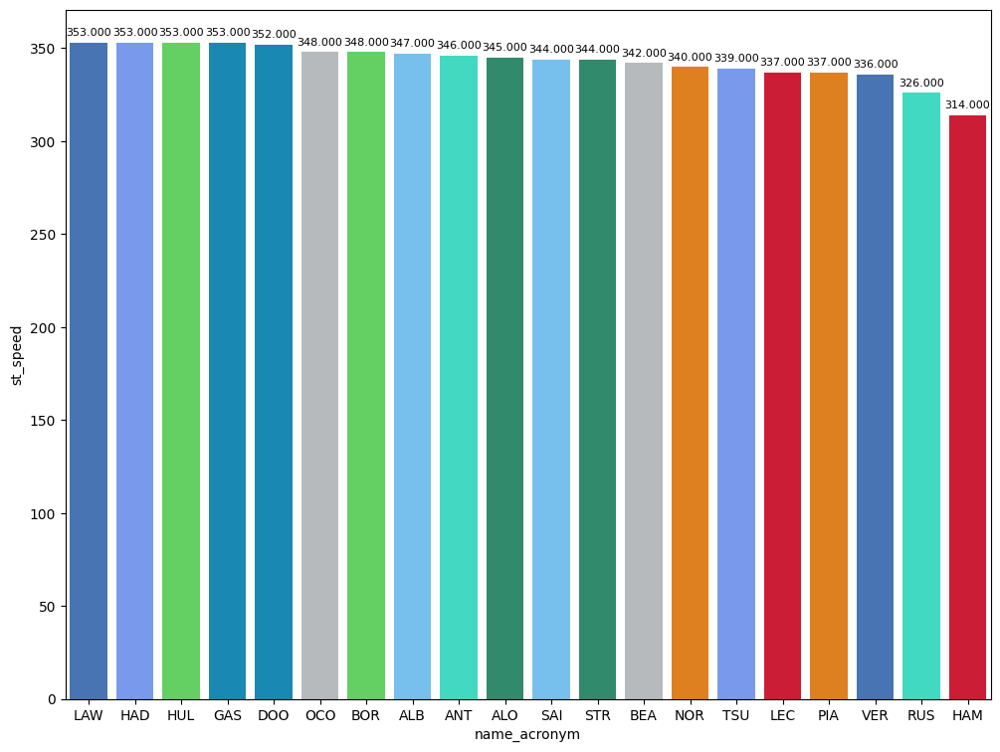

In [96]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

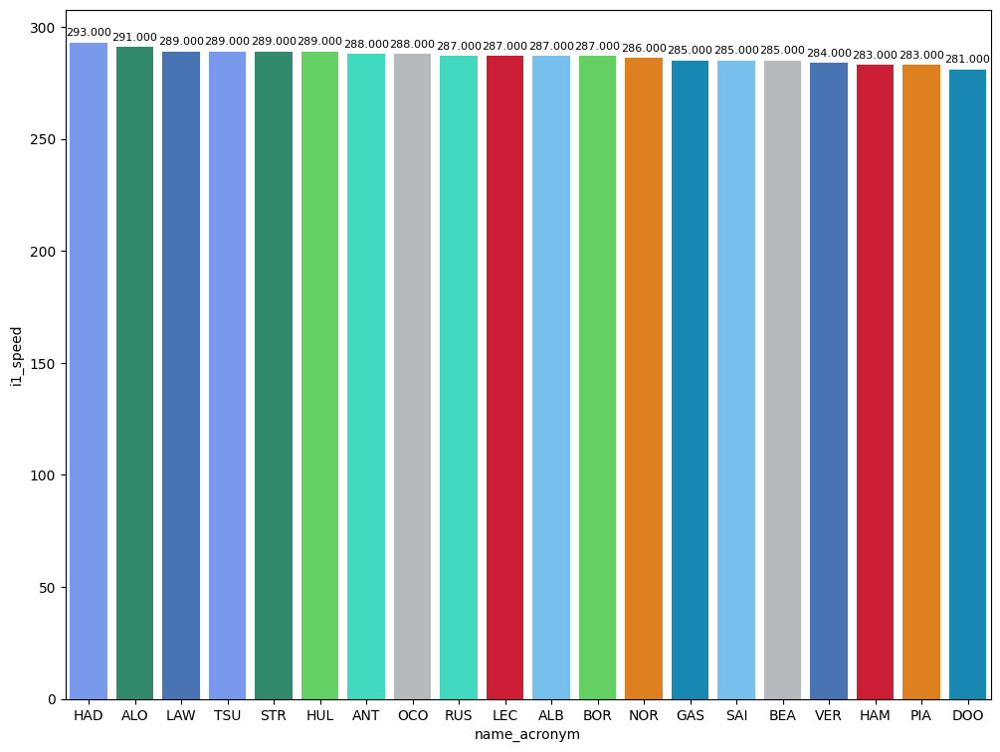

In [97]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

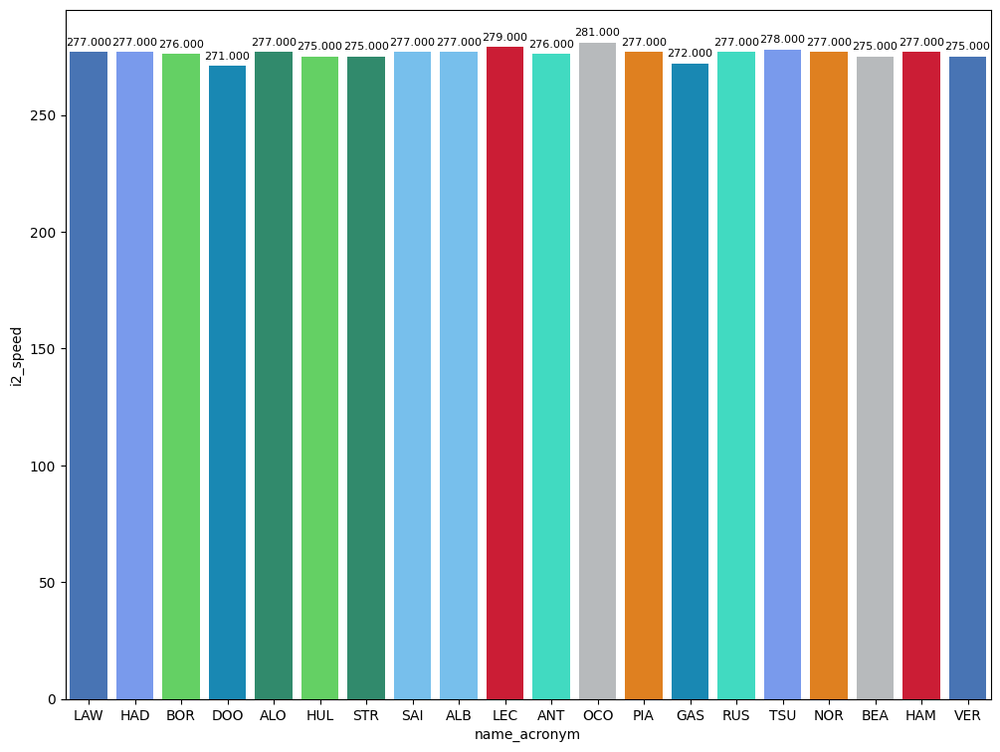

In [98]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

In [100]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <=101").dropna().groupby("team_name")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
team_name,
Ferrari,96.747529
McLaren,96.924368
Mercedes,97.052300
Red Bull Racing,97.564412
Aston Martin,97.604526
Racing Bulls,97.894545
Williams,98.035353
Haas F1 Team,98.371600
Alpine,98.489524


### Race pace per teams

In [104]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <=101").dropna().groupby("team_name")['duration_sector_1'].mean().sort_values(ascending=True))
race_pace

,duration_sector_1
team_name,
McLaren,25.860895
Aston Martin,25.952421
Ferrari,25.982176
Red Bull Racing,25.989765
Mercedes,26.030950
Racing Bulls,26.050591
Williams,26.191412
Alpine,26.245429
Kick Sauber,26.246286


In [105]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <=101").dropna().groupby("team_name")['duration_sector_2'].mean().sort_values(ascending=True))
race_pace

,duration_sector_2
team_name,
Ferrari,29.235706
Mercedes,29.483600
McLaren,29.502842
Aston Martin,29.719000
Red Bull Racing,29.725647
Williams,29.798235
Racing Bulls,29.812545
Haas F1 Team,29.953600
Alpine,29.977333


In [106]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <=101").dropna().groupby("team_name")['duration_sector_3'].mean().sort_values(ascending=True))
race_pace

,duration_sector_3
team_name,
Ferrari,41.529647
Mercedes,41.537750
McLaren,41.560632
Red Bull Racing,41.849000
Aston Martin,41.933105
Racing Bulls,42.031409
Williams,42.045706
Haas F1 Team,42.165900
Kick Sauber,42.264000


### Race pace
General explanation
Explanation per teams

In [111]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 101").dropna().groupby("team_name")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
team_name,
Ferrari,96.747529
McLaren,96.924368
Mercedes,97.052300
Red Bull Racing,97.564412
Aston Martin,97.604526
Racing Bulls,97.894545
Williams,98.035353
Haas F1 Team,98.371600
Alpine,98.489524


#### Mean race pace per sector
In this section, we can see the pace shown per each team in each sector sorted ascending.

#### Sector 1
General explanation

In [112]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 101").dropna().groupby("team_name")['duration_sector_1'].mean().sort_values(ascending=True))
race_pace

,duration_sector_1
team_name,
McLaren,25.860895
Aston Martin,25.952421
Ferrari,25.982176
Red Bull Racing,25.989765
Mercedes,26.030950
Racing Bulls,26.050591
Williams,26.191412
Alpine,26.245429
Kick Sauber,26.246286


#### Sector 2
General explanation

In [113]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 101").dropna().groupby("team_name")['duration_sector_2'].mean().sort_values(ascending=True))
race_pace

,duration_sector_2
team_name,
Ferrari,29.235706
Mercedes,29.483600
McLaren,29.502842
Aston Martin,29.719000
Red Bull Racing,29.725647
Williams,29.798235
Racing Bulls,29.812545
Haas F1 Team,29.953600
Alpine,29.977333


#### Sector 3
General explanation

In [114]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 101").dropna().groupby("team_name")['duration_sector_3'].mean().sort_values(ascending=True))
race_pace

,duration_sector_3
team_name,
Ferrari,41.529647
Mercedes,41.537750
McLaren,41.560632
Red Bull Racing,41.849000
Aston Martin,41.933105
Racing Bulls,42.031409
Williams,42.045706
Haas F1 Team,42.165900
Kick Sauber,42.264000


### Long runs

In [257]:
MINIMUN_SECONDS = 95
MAXIMUM_SECONDS = 101

#### Red Bull Racing

In [258]:
stintInformation.query('driver_number == 1 or driver_number == 30')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1255,9993,1,1,1,14,MEDIUM,3
17,1255,9993,1,30,1,15,MEDIUM,5


In [259]:
data = libraryDataF1.getinfolongruns(jointables,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
20,Max VERSTAPPEN,MEDIUM,2025-03-22T03:05:22.401000+00:00,2,25.654,28.886,41.205,95.745
40,Max VERSTAPPEN,MEDIUM,2025-03-22T03:06:58.219000+00:00,3,25.819,28.967,41.211,95.997
60,Max VERSTAPPEN,MEDIUM,2025-03-22T03:08:34.257000+00:00,4,25.853,29.087,41.143,96.083
80,Max VERSTAPPEN,MEDIUM,2025-03-22T03:10:10.371000+00:00,5,25.970,29.374,41.384,96.728
100,Max VERSTAPPEN,MEDIUM,2025-03-22T03:11:47.045000+00:00,6,26.162,29.143,41.358,96.663
120,Max VERSTAPPEN,MEDIUM,2025-03-22T03:13:23.720000+00:00,7,25.955,29.076,40.912,95.943
140,Max VERSTAPPEN,MEDIUM,2025-03-22T03:14:59.617000+00:00,8,25.639,29.125,41.191,95.955
160,Max VERSTAPPEN,MEDIUM,2025-03-22T03:16:35.546000+00:00,9,26.180,29.469,41.795,97.444
180,Max VERSTAPPEN,MEDIUM,2025-03-22T03:18:13.029000+00:00,10,26.147,29.417,41.486,97.050
200,Max VERSTAPPEN,MEDIUM,2025-03-22T03:19:50.177000+00:00,11,25.895,29.388,41.576,96.859


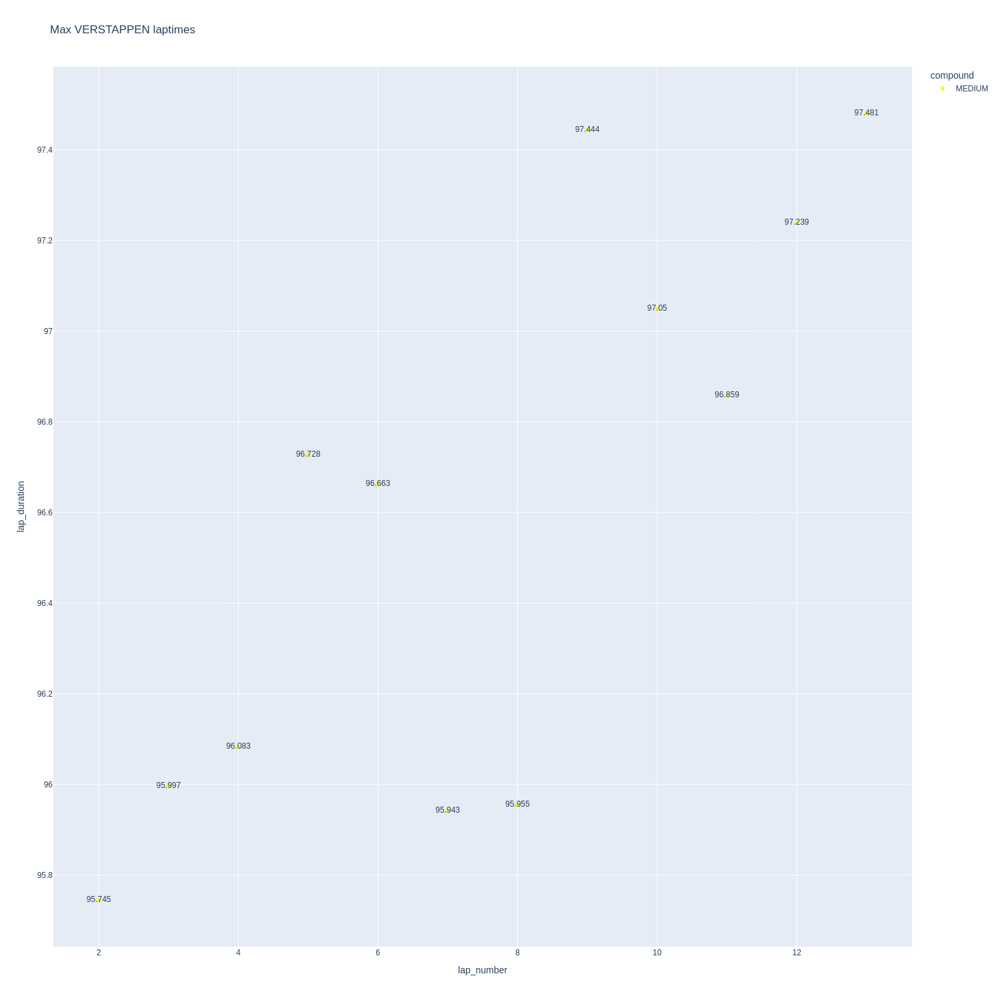

In [260]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

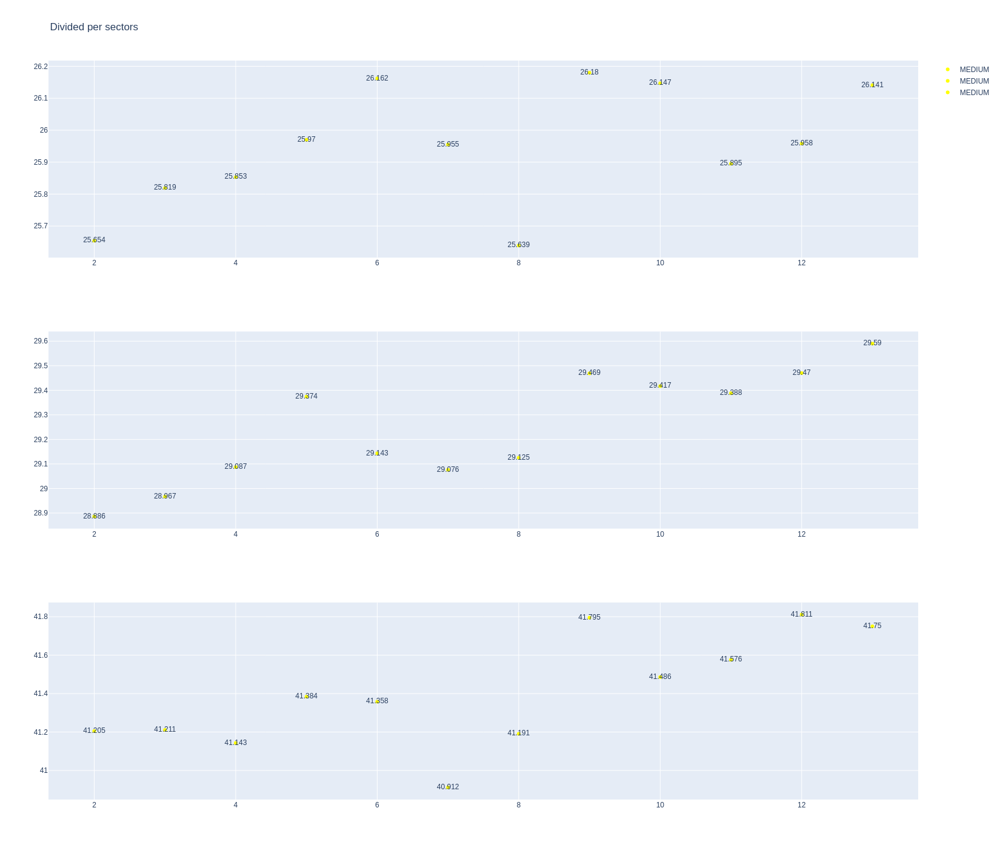

In [261]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [262]:
data = libraryDataF1.getinfolongruns(jointables,30,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
33,Liam LAWSON,MEDIUM,2025-03-22T03:05:32.597000+00:00,2,26.355,29.996,41.996,98.347
53,Liam LAWSON,MEDIUM,2025-03-22T03:07:10.997000+00:00,3,25.630,29.919,42.175,97.724
73,Liam LAWSON,MEDIUM,2025-03-22T03:08:48.622000+00:00,4,25.552,29.645,41.966,97.163
93,Liam LAWSON,MEDIUM,2025-03-22T03:10:25.727000+00:00,5,25.746,29.687,42.196,97.629
113,Liam LAWSON,MEDIUM,2025-03-22T03:12:03.404000+00:00,6,25.841,29.926,41.742,97.509
133,Liam LAWSON,MEDIUM,2025-03-22T03:13:40.855000+00:00,7,25.842,30.205,42.026,98.073
153,Liam LAWSON,MEDIUM,2025-03-22T03:15:19.026000+00:00,8,26.123,30.092,41.898,98.113
173,Liam LAWSON,MEDIUM,2025-03-22T03:16:57.147000+00:00,9,26.216,30.190,42.238,98.644
193,Liam LAWSON,MEDIUM,2025-03-22T03:18:35.659000+00:00,10,26.206,30.357,42.525,99.088
213,Liam LAWSON,MEDIUM,2025-03-22T03:20:14.729000+00:00,11,26.496,30.692,42.555,99.743


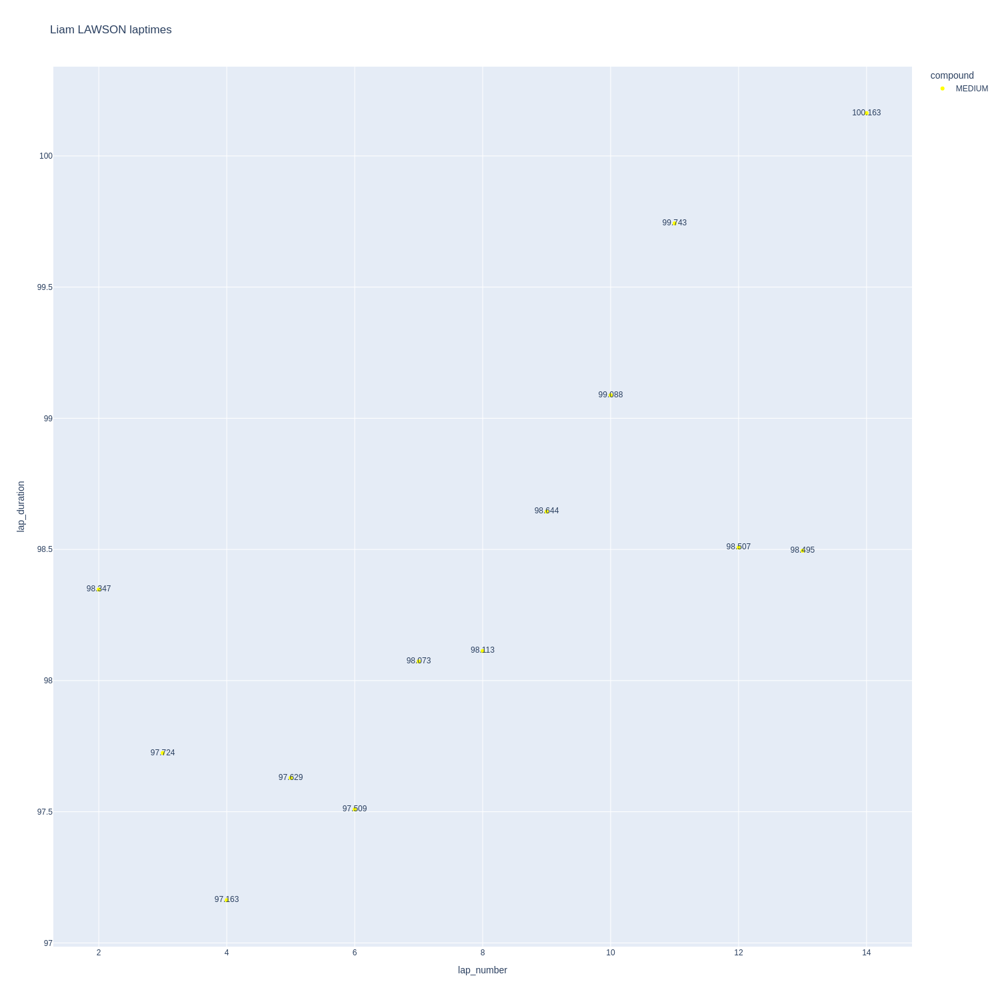

In [263]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

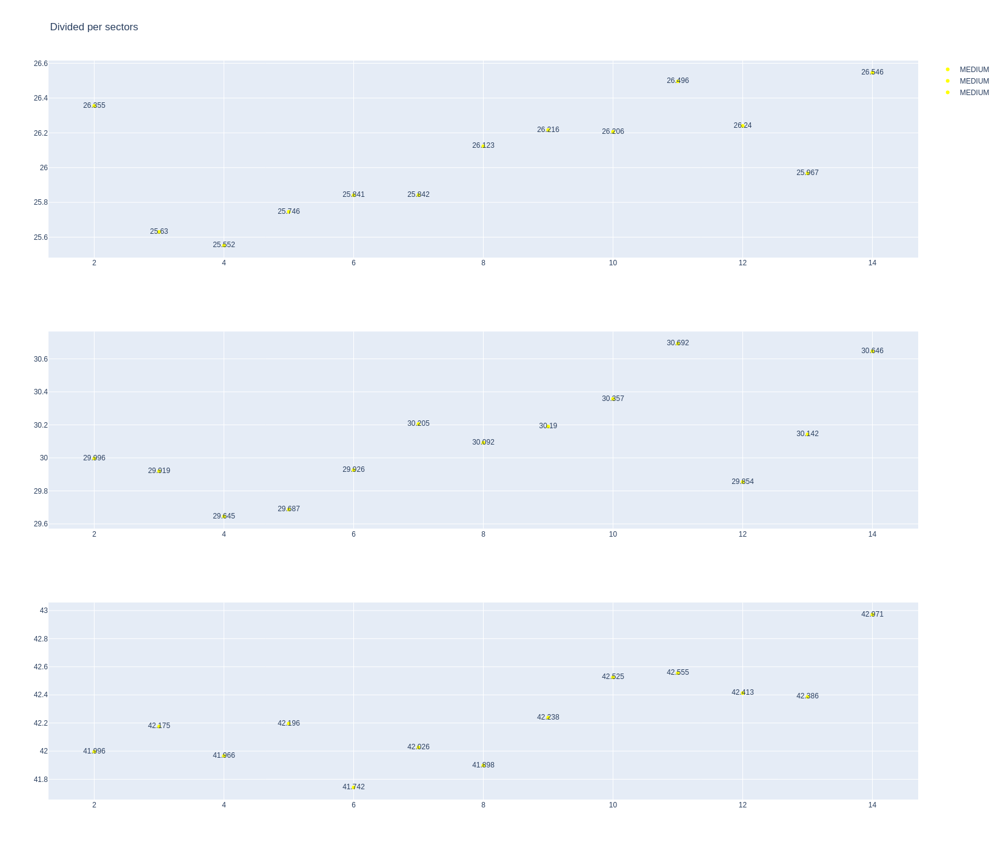

In [264]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [265]:
stintInformation.query('driver_number == 44 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
4,1255,9993,1,16,1,14,MEDIUM,6
7,1255,9993,1,44,1,14,MEDIUM,6


In [266]:
data = libraryDataF1.getinfolongruns(jointables,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
28,Charles LECLERC,MEDIUM,2025-03-22T03:05:25.297000+00:00,2,26.226,29.410,41.259,96.895
48,Charles LECLERC,MEDIUM,2025-03-22T03:07:02.285000+00:00,3,26.050,29.090,41.152,96.292
68,Charles LECLERC,MEDIUM,2025-03-22T03:08:38.563000+00:00,4,25.893,29.026,41.336,96.255
88,Charles LECLERC,MEDIUM,2025-03-22T03:10:14.825000+00:00,5,26.080,29.141,41.303,96.524
108,Charles LECLERC,MEDIUM,2025-03-22T03:11:51.375000+00:00,6,25.970,29.079,41.295,96.344
128,Charles LECLERC,MEDIUM,2025-03-22T03:13:27.673000+00:00,7,25.982,29.268,41.393,96.643
148,Charles LECLERC,MEDIUM,2025-03-22T03:15:04.329000+00:00,8,26.018,29.339,41.657,97.014
168,Charles LECLERC,MEDIUM,2025-03-22T03:16:41.354000+00:00,9,25.940,29.517,41.831,97.288
188,Charles LECLERC,MEDIUM,2025-03-22T03:18:18.677000+00:00,10,25.974,29.599,42.057,97.630
208,Charles LECLERC,MEDIUM,2025-03-22T03:19:56.295000+00:00,11,26.100,29.814,42.107,98.021


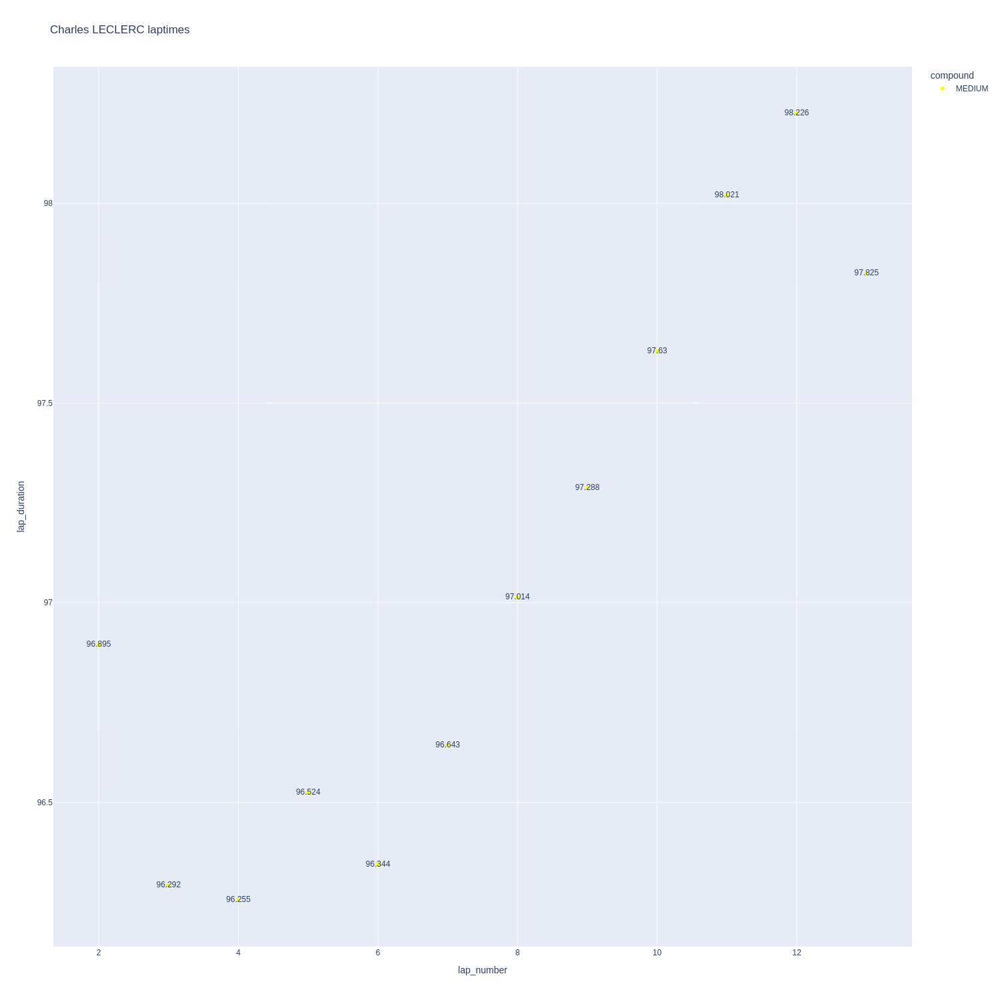

In [267]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

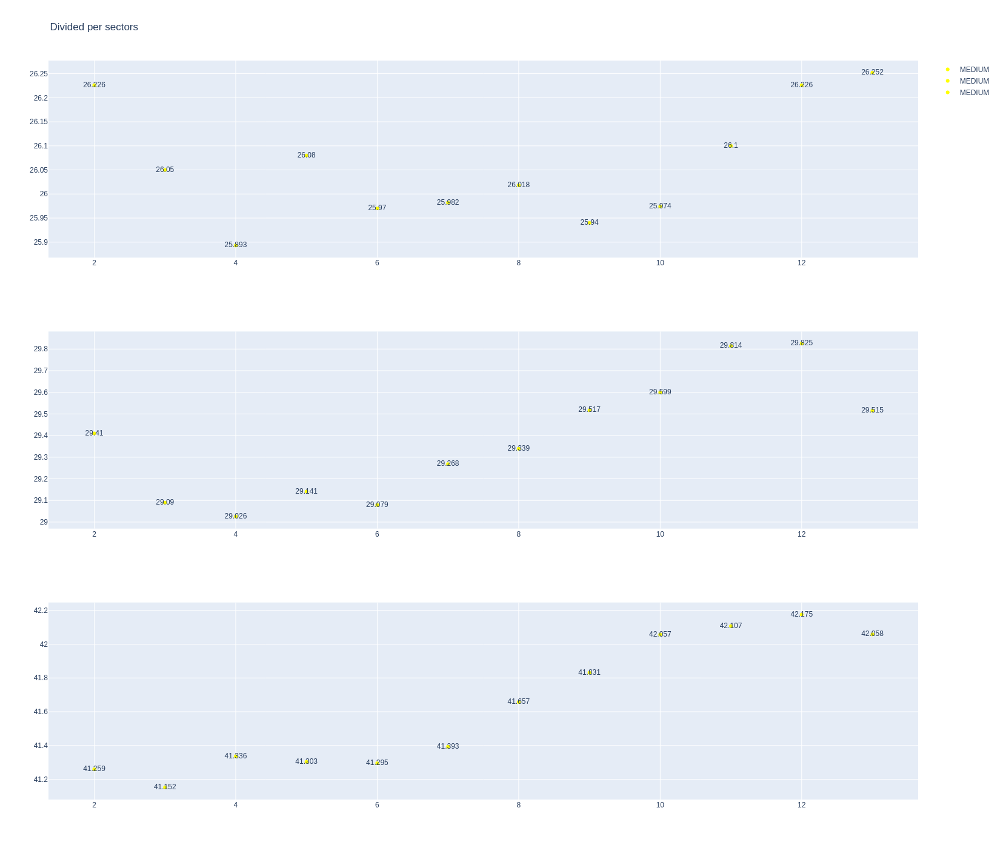

In [268]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [269]:
data = libraryDataF1.getinfolongruns(jointables,44,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
35,Lewis HAMILTON,MEDIUM,2025-03-22T03:05:21.721000+00:00,2,25.591,28.731,41.077,95.399
55,Lewis HAMILTON,MEDIUM,2025-03-22T03:06:57.119000+00:00,3,25.832,29.044,41.275,96.151
75,Lewis HAMILTON,MEDIUM,2025-03-22T03:08:33.225000+00:00,4,25.776,29.077,41.211,96.064
95,Lewis HAMILTON,MEDIUM,2025-03-22T03:10:09.302000+00:00,5,25.952,29.259,41.473,96.684
115,Lewis HAMILTON,MEDIUM,2025-03-22T03:11:46.090000+00:00,6,25.900,28.936,41.513,96.349
135,Lewis HAMILTON,MEDIUM,2025-03-22T03:13:22.322000+00:00,7,25.957,29.346,41.314,96.617
155,Lewis HAMILTON,MEDIUM,2025-03-22T03:14:59.030000+00:00,8,25.656,29.046,41.301,96.003
175,Lewis HAMILTON,MEDIUM,2025-03-22T03:16:35.006000+00:00,9,26.129,29.158,41.654,96.941
195,Lewis HAMILTON,MEDIUM,2025-03-22T03:18:11.857000+00:00,10,25.914,29.190,41.768,96.872
215,Lewis HAMILTON,MEDIUM,2025-03-22T03:19:48.768000+00:00,11,25.995,29.070,41.637,96.702


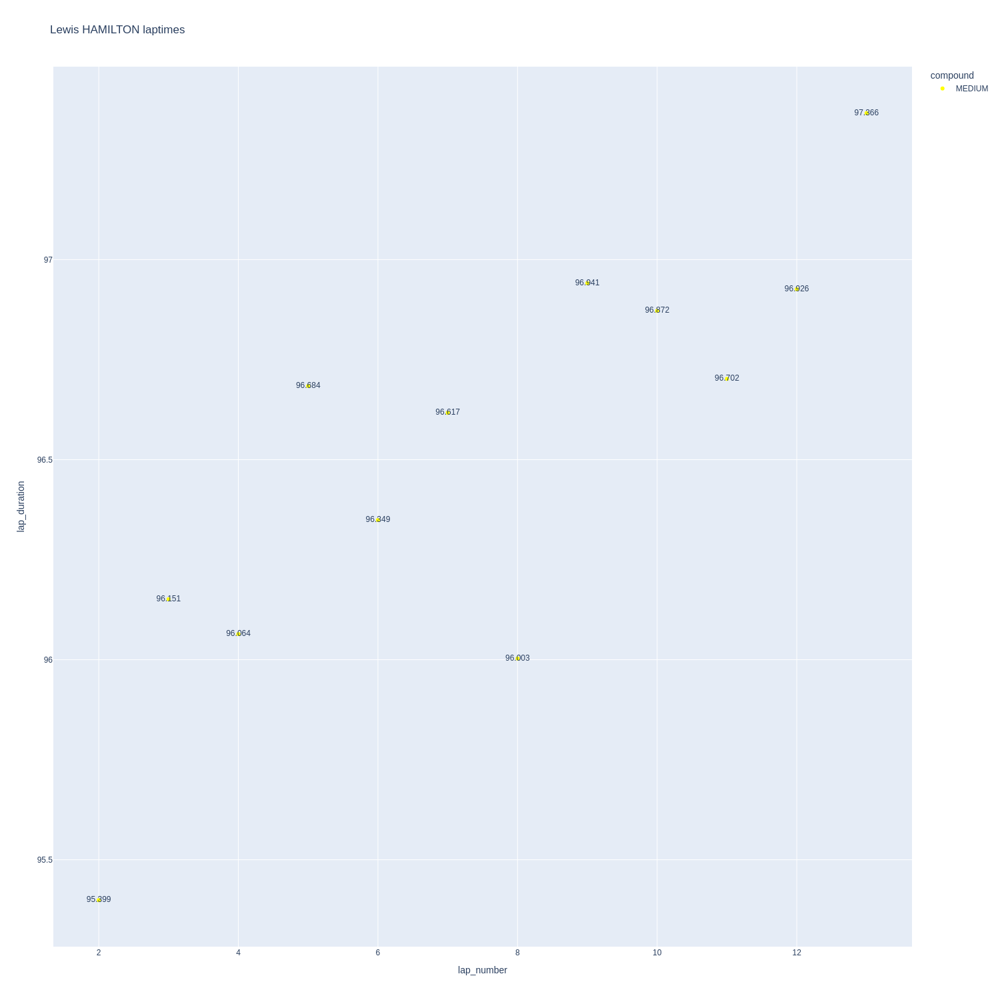

In [270]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

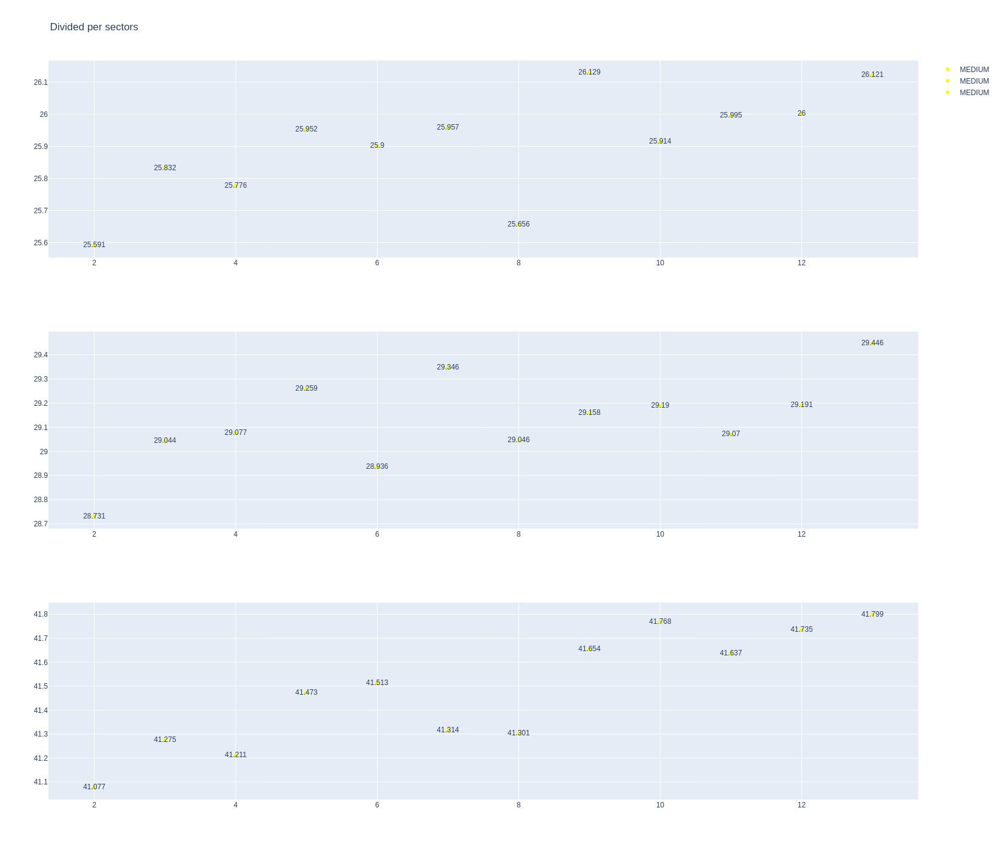

In [271]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [272]:
stintInformation.query('driver_number == 63 or driver_number == 12')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
3,1255,9993,1,12,1,14,MEDIUM,7
8,1255,9993,1,63,1,14,MEDIUM,8


In [273]:
data = libraryDataF1.getinfolongruns(jointables,12,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
26,Andrea Kimi ANTONELLI,MEDIUM,2025-03-22T03:05:26.428000+00:00,2,25.921,29.632,41.301,96.854
46,Andrea Kimi ANTONELLI,MEDIUM,2025-03-22T03:07:03.391000+00:00,3,25.716,29.662,41.281,96.659
66,Andrea Kimi ANTONELLI,MEDIUM,2025-03-22T03:08:40.055000+00:00,4,25.772,29.410,41.336,96.518
86,Andrea Kimi ANTONELLI,MEDIUM,2025-03-22T03:10:16.549000+00:00,5,25.654,29.407,41.250,96.311
106,Andrea Kimi ANTONELLI,MEDIUM,2025-03-22T03:11:52.894000+00:00,6,25.863,29.584,41.412,96.859
126,Andrea Kimi ANTONELLI,MEDIUM,2025-03-22T03:13:29.743000+00:00,7,25.909,29.442,41.360,96.711
146,Andrea Kimi ANTONELLI,MEDIUM,2025-03-22T03:15:06.447000+00:00,8,26.090,29.611,41.558,97.259
166,Andrea Kimi ANTONELLI,MEDIUM,2025-03-22T03:16:43.678000+00:00,9,25.925,29.594,41.799,97.318
186,Andrea Kimi ANTONELLI,MEDIUM,2025-03-22T03:18:20.955000+00:00,10,26.156,29.764,41.825,97.745
206,Andrea Kimi ANTONELLI,MEDIUM,2025-03-22T03:19:58.851000+00:00,11,26.251,29.989,42.026,98.266


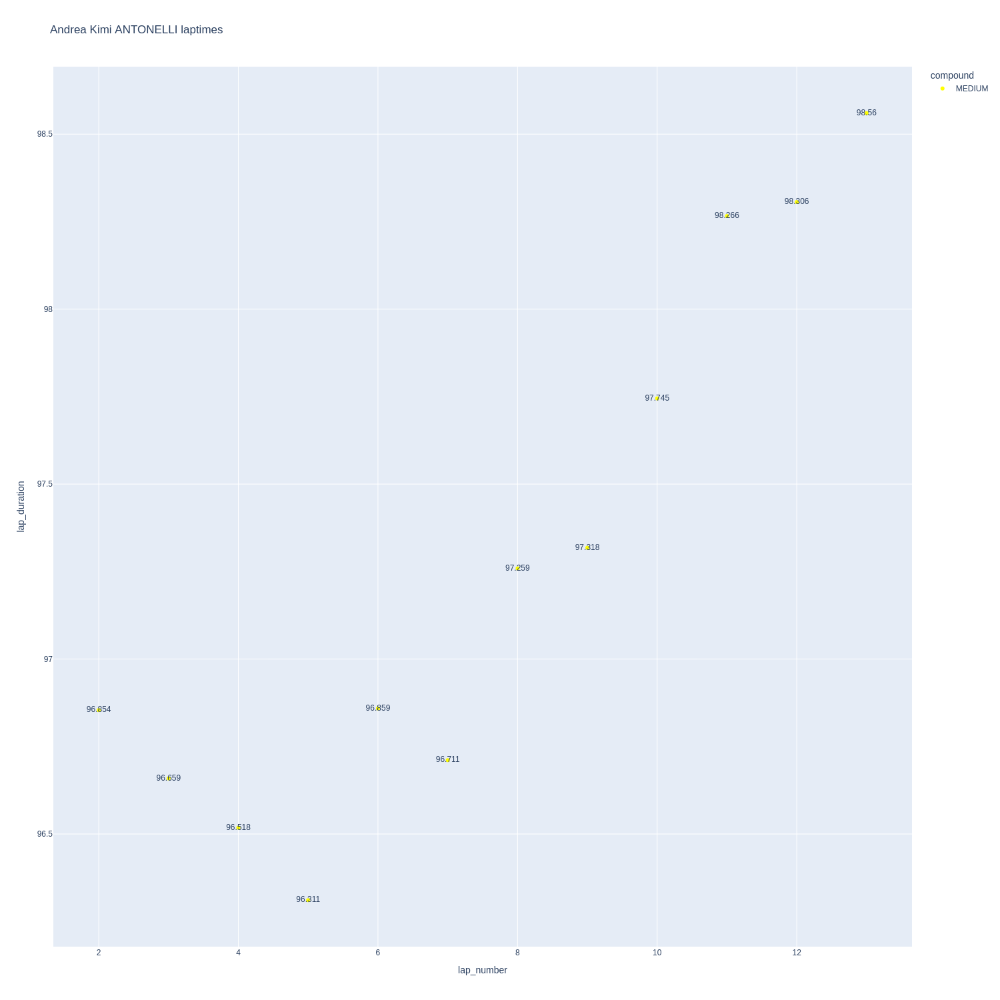

In [274]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

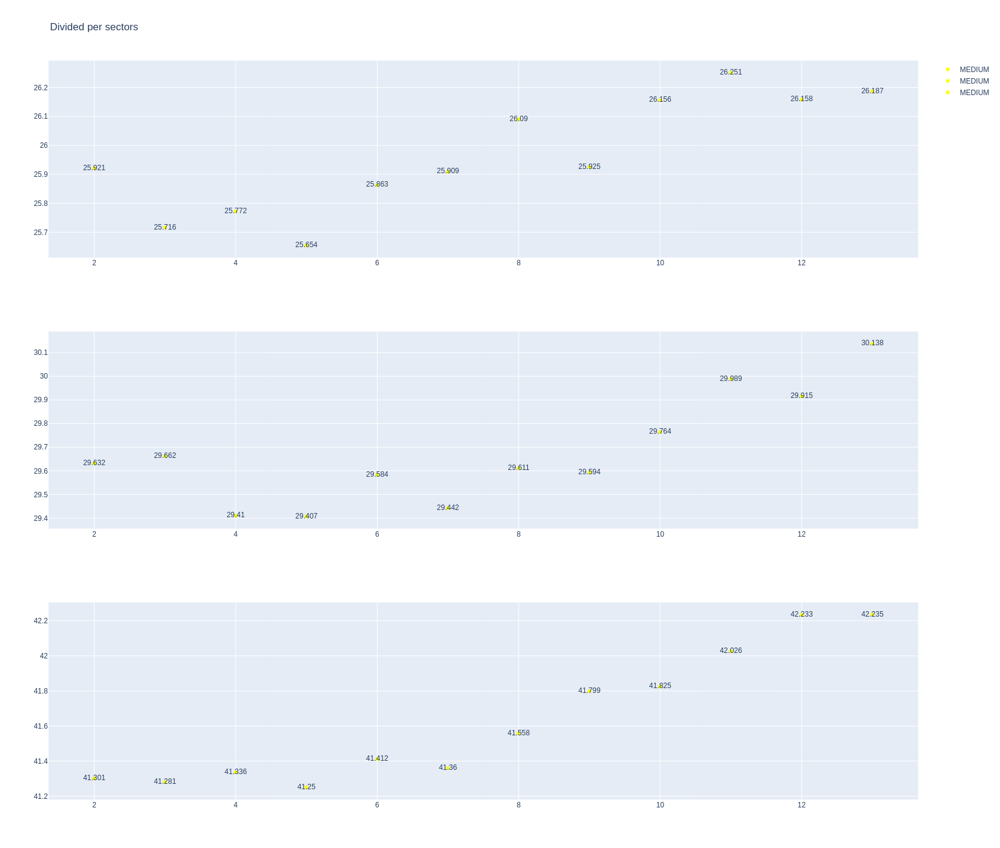

In [275]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [276]:
data = libraryDataF1.getinfolongruns(jointables,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
37,George RUSSELL,MEDIUM,2025-03-22T03:05:24.825000+00:00,2,26.032,29.221,41.179,96.432
57,George RUSSELL,MEDIUM,2025-03-22T03:07:01.432000+00:00,3,25.980,28.756,41.309,96.045
77,George RUSSELL,MEDIUM,2025-03-22T03:08:37.540000+00:00,4,25.807,28.981,41.103,95.891
97,George RUSSELL,MEDIUM,2025-03-22T03:10:13.425000+00:00,5,25.857,29.251,41.286,96.394
117,George RUSSELL,MEDIUM,2025-03-22T03:11:49.839000+00:00,6,26.026,29.227,41.108,96.361
137,George RUSSELL,MEDIUM,2025-03-22T03:13:26.117000+00:00,7,26.216,29.187,41.250,96.653
157,George RUSSELL,MEDIUM,2025-03-22T03:15:02.774000+00:00,8,25.933,29.318,41.468,96.719
177,George RUSSELL,MEDIUM,2025-03-22T03:16:39.594000+00:00,9,26.090,29.321,41.538,96.949
197,George RUSSELL,MEDIUM,2025-03-22T03:18:16.424000+00:00,10,26.317,29.309,41.697,97.323
217,George RUSSELL,MEDIUM,2025-03-22T03:19:53.830000+00:00,11,26.297,29.582,41.874,97.753


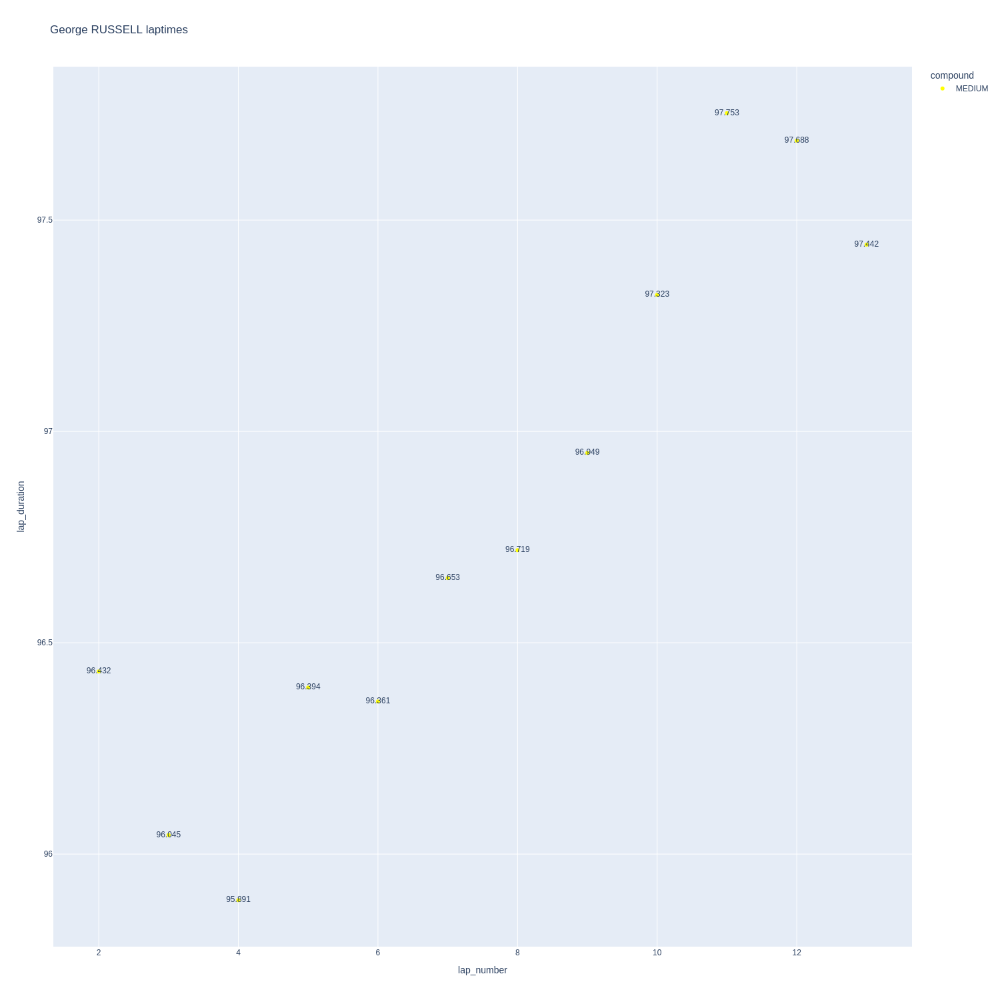

In [277]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

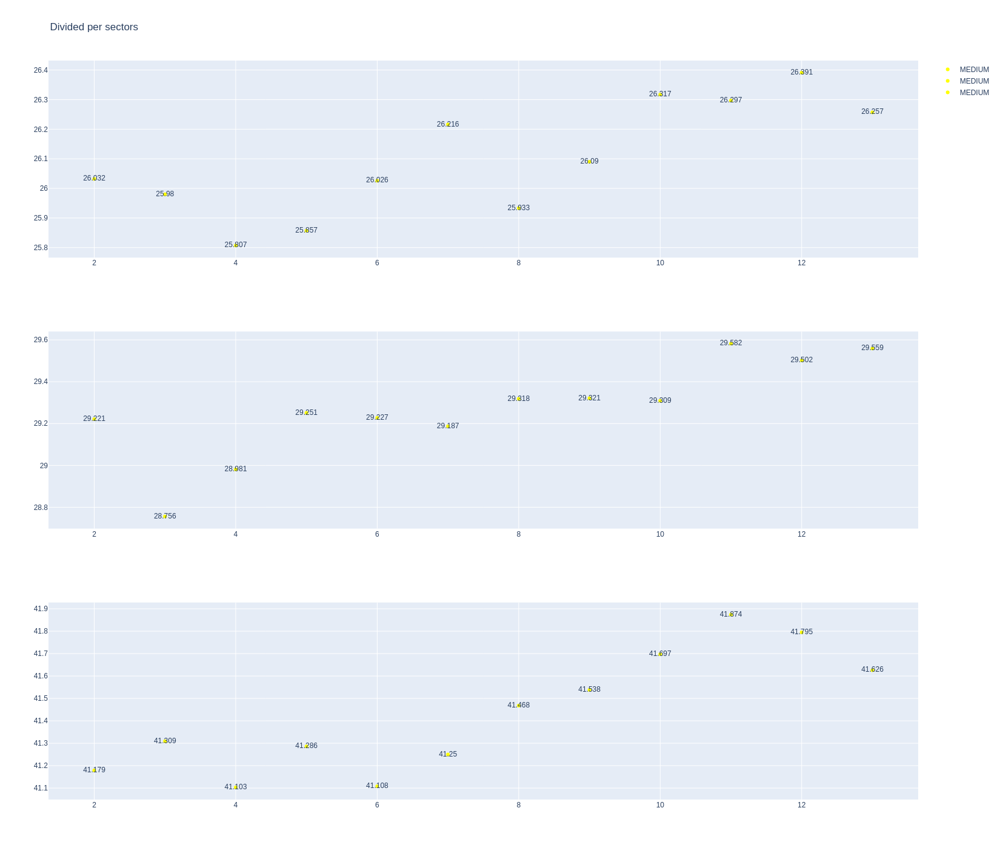

In [278]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [279]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
2,1255,9993,1,4,1,14,MEDIUM,3
9,1255,9993,1,81,1,14,MEDIUM,4


In [280]:
data = libraryDataF1.getinfolongruns(jointables,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
21,Lando NORRIS,MEDIUM,2025-03-22T03:05:27.765000+00:00,2,25.679,29.558,41.641,96.878
41,Lando NORRIS,MEDIUM,2025-03-22T03:07:04.728000+00:00,3,25.657,29.717,41.727,97.101
61,Lando NORRIS,MEDIUM,2025-03-22T03:08:41.909000+00:00,4,25.642,29.724,41.342,96.708
81,Lando NORRIS,MEDIUM,2025-03-22T03:10:18.564000+00:00,5,25.925,29.645,41.967,97.537
101,Lando NORRIS,MEDIUM,2025-03-22T03:11:56.089000+00:00,6,25.912,29.444,41.723,97.079
121,Lando NORRIS,MEDIUM,2025-03-22T03:13:33.220000+00:00,7,25.995,29.466,41.637,97.098
141,Lando NORRIS,MEDIUM,2025-03-22T03:15:10.223000+00:00,8,26.023,29.454,41.785,97.262
161,Lando NORRIS,MEDIUM,2025-03-22T03:16:47.497000+00:00,9,25.958,29.561,42.363,97.882
181,Lando NORRIS,MEDIUM,2025-03-22T03:18:25.329000+00:00,10,26.181,29.677,42.011,97.869
201,Lando NORRIS,MEDIUM,2025-03-22T03:20:03.269000+00:00,11,26.262,29.819,42.146,98.227


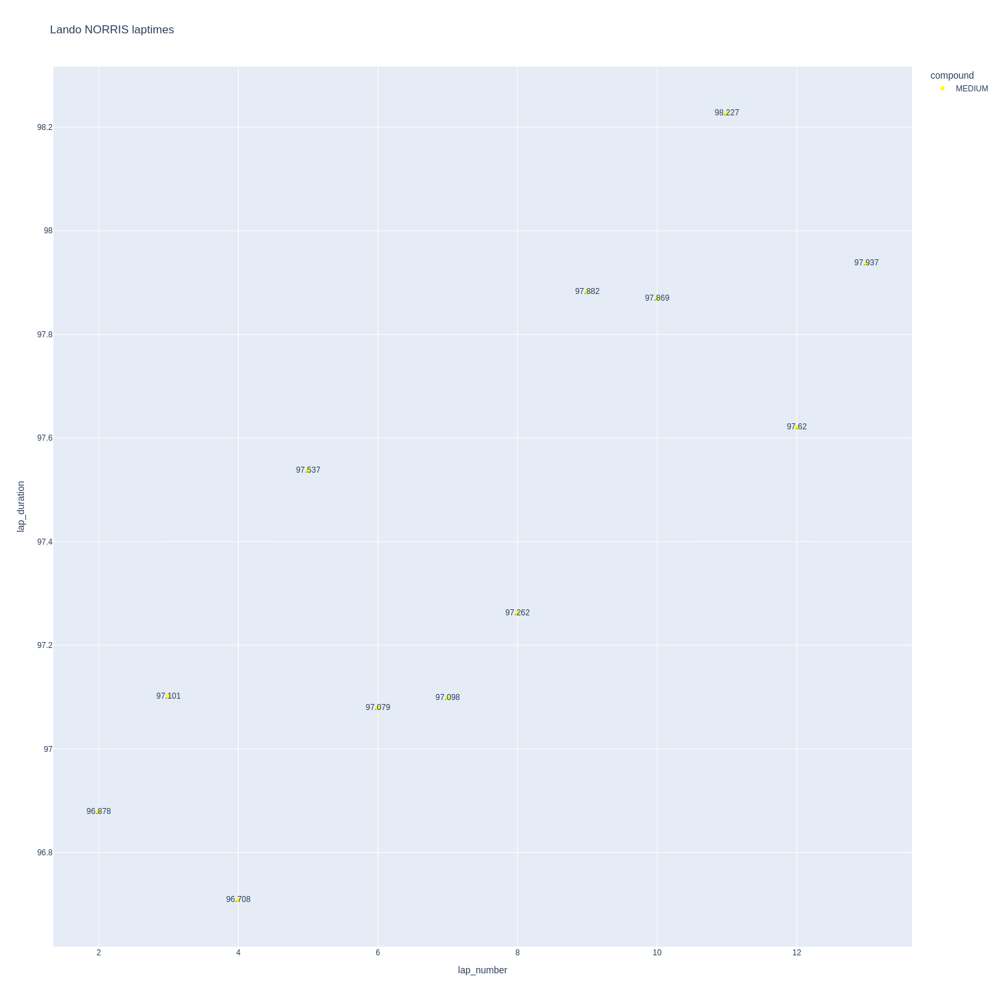

In [281]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

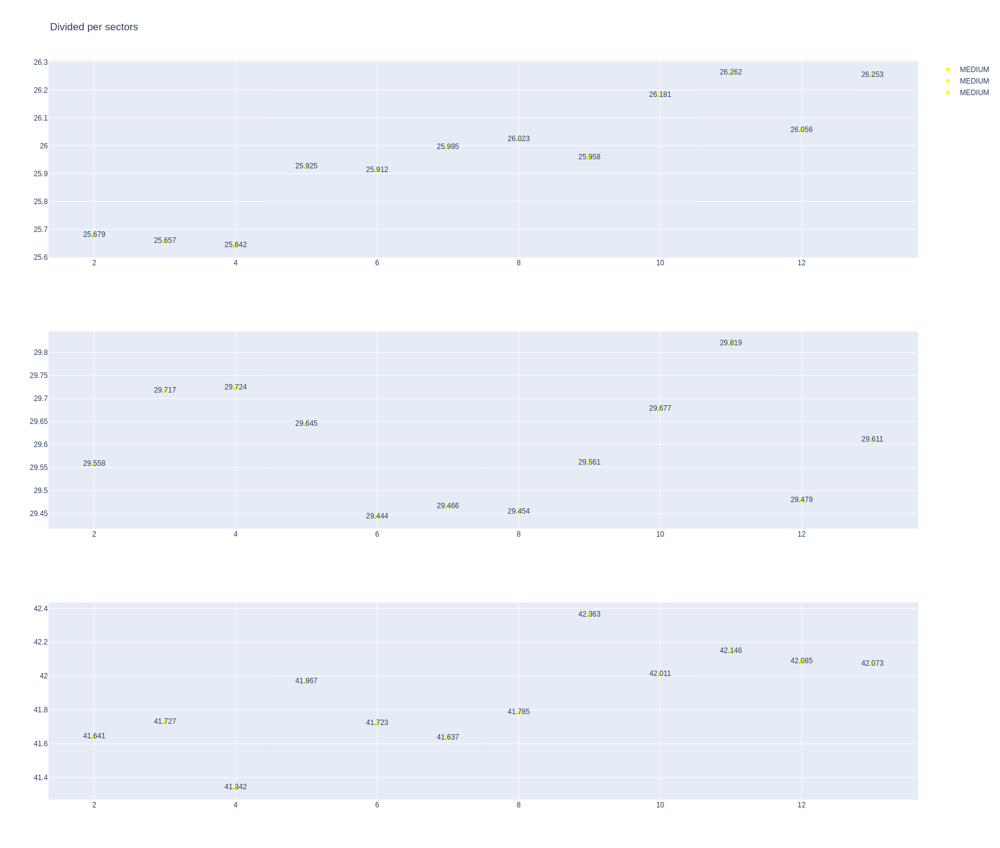

In [282]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [283]:
data = libraryDataF1.getinfolongruns(jointables,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
38,Oscar PIASTRI,MEDIUM,2025-03-22T03:05:23.779000+00:00,2,25.510,29.217,41.359,96.086
58,Oscar PIASTRI,MEDIUM,2025-03-22T03:06:59.824000+00:00,3,25.692,29.207,41.217,96.116
78,Oscar PIASTRI,MEDIUM,2025-03-22T03:08:35.952000+00:00,4,25.540,29.178,41.175,95.893
98,Oscar PIASTRI,MEDIUM,2025-03-22T03:10:11.853000+00:00,5,25.680,29.397,41.272,96.349
118,Oscar PIASTRI,MEDIUM,2025-03-22T03:11:48.292000+00:00,6,25.935,29.218,41.163,96.316
138,Oscar PIASTRI,MEDIUM,2025-03-22T03:13:24.579000+00:00,7,25.772,29.186,40.896,95.854
158,Oscar PIASTRI,MEDIUM,2025-03-22T03:15:00.428000+00:00,8,25.668,29.562,41.436,96.666
178,Oscar PIASTRI,MEDIUM,2025-03-22T03:16:37.102000+00:00,9,25.990,29.655,41.512,97.157
198,Oscar PIASTRI,MEDIUM,2025-03-22T03:18:14.270000+00:00,10,25.994,29.160,41.245,96.399
218,Oscar PIASTRI,MEDIUM,2025-03-22T03:19:50.672000+00:00,11,26.002,29.427,41.422,96.851


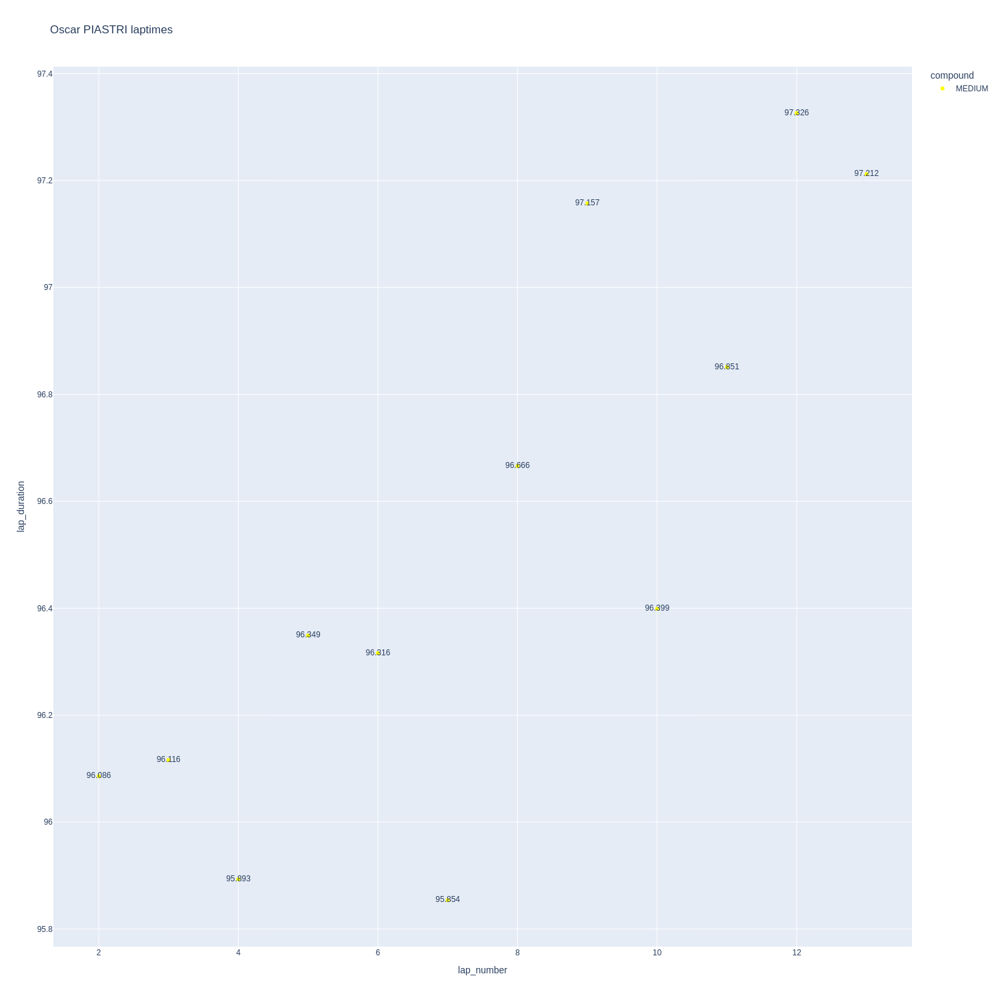

In [284]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

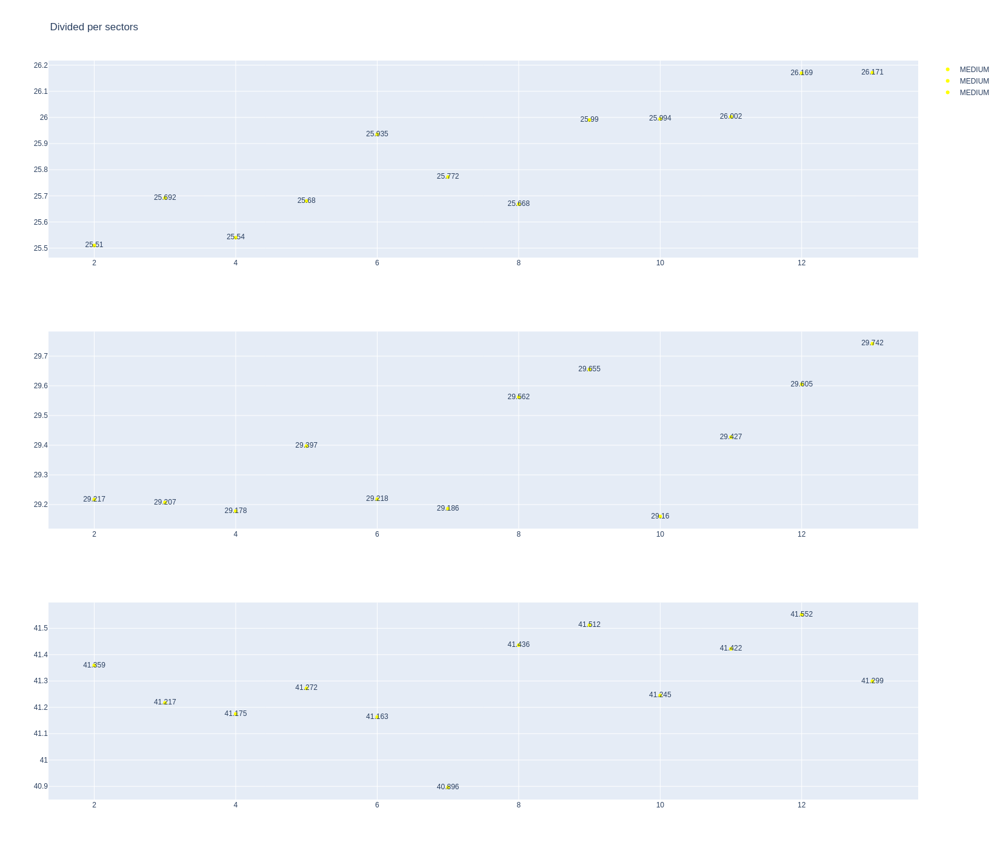

In [285]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [286]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
5,1255,9993,1,18,1,14,MEDIUM,3
14,1255,9993,1,14,1,15,MEDIUM,3


In [287]:
data = libraryDataF1.getinfolongruns(jointables,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
27,Fernando ALONSO,MEDIUM,2025-03-22T03:05:28.223000+00:00,2,26.052,29.474,41.770,97.296
47,Fernando ALONSO,MEDIUM,2025-03-22T03:07:05.701000+00:00,3,25.647,29.678,42.180,97.505
67,Fernando ALONSO,MEDIUM,2025-03-22T03:08:43.092000+00:00,4,25.779,29.766,41.928,97.473
87,Fernando ALONSO,MEDIUM,2025-03-22T03:10:20.611000+00:00,5,25.863,29.790,41.950,97.603
107,Fernando ALONSO,MEDIUM,2025-03-22T03:11:58.254000+00:00,6,26.088,29.781,41.754,97.623
127,Fernando ALONSO,MEDIUM,2025-03-22T03:13:35.853000+00:00,7,25.658,29.631,41.980,97.269
147,Fernando ALONSO,MEDIUM,2025-03-22T03:15:13.085000+00:00,8,25.753,29.382,41.923,97.058
167,Fernando ALONSO,MEDIUM,2025-03-22T03:16:50.228000+00:00,9,25.879,29.582,42.185,97.646
187,Fernando ALONSO,MEDIUM,2025-03-22T03:18:27.866000+00:00,10,25.908,29.671,42.462,98.041
207,Fernando ALONSO,MEDIUM,2025-03-22T03:20:05.818000+00:00,11,25.981,29.786,42.617,98.384


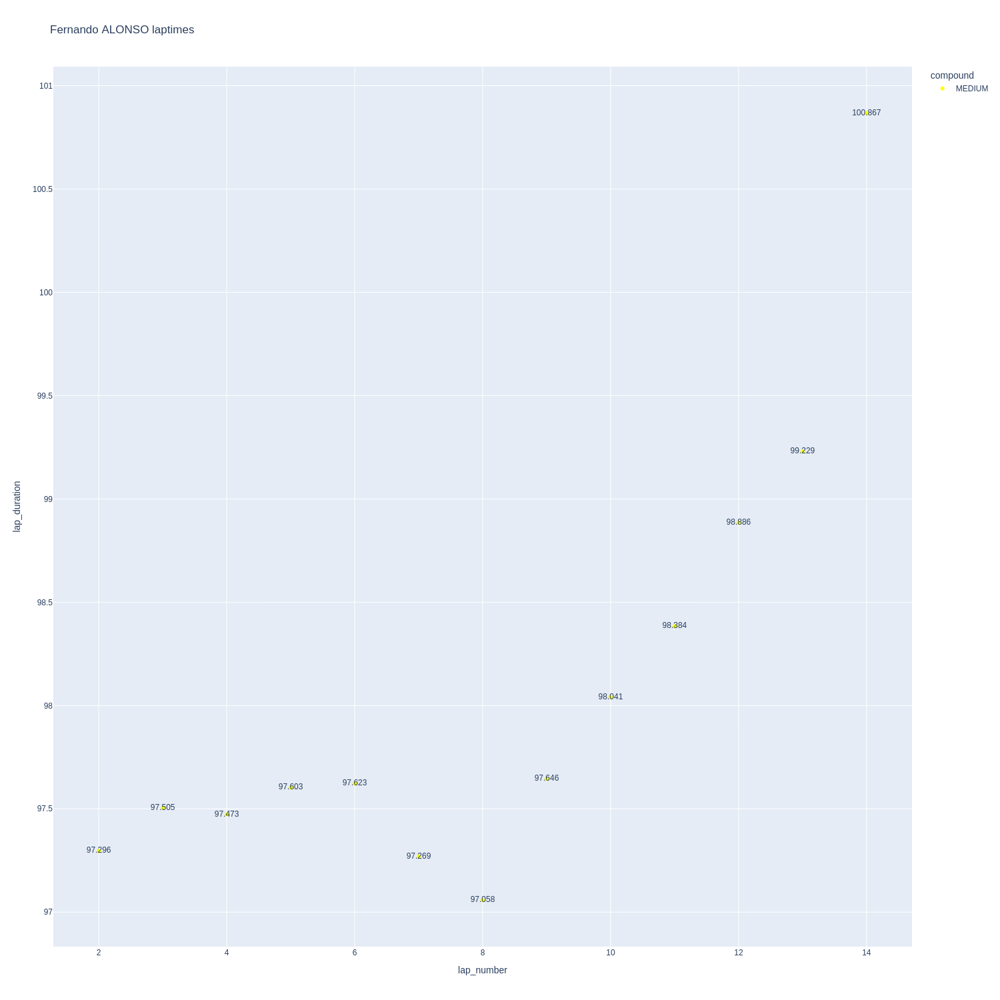

In [288]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

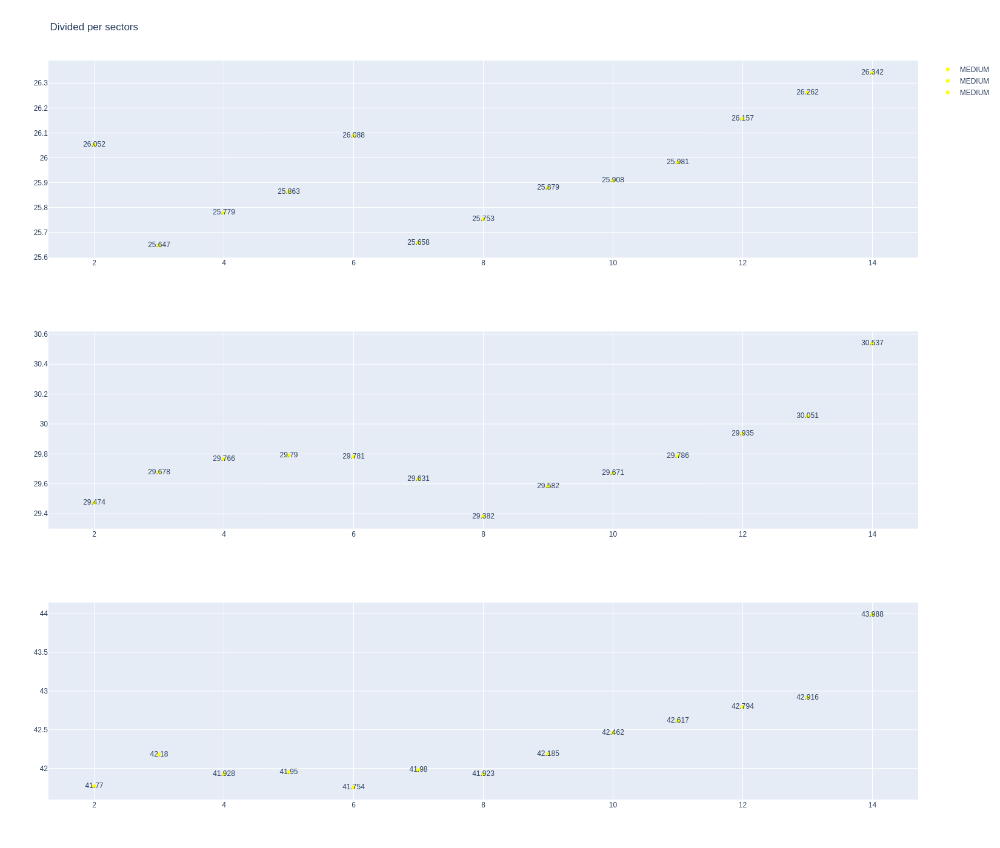

In [289]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [290]:
data = libraryDataF1.getinfolongruns(jointables,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
29,Lance STROLL,MEDIUM,2025-03-22T03:05:27.013000+00:00,2,25.939,29.700,41.335,96.974
49,Lance STROLL,MEDIUM,2025-03-22T03:07:04.224000+00:00,3,25.733,29.865,41.316,96.914
69,Lance STROLL,MEDIUM,2025-03-22T03:08:41.033000+00:00,4,25.678,29.529,41.228,96.435
89,Lance STROLL,MEDIUM,2025-03-22T03:10:17.525000+00:00,5,25.679,29.550,41.674,96.903
109,Lance STROLL,MEDIUM,2025-03-22T03:11:54.452000+00:00,6,26.001,29.519,41.555,97.075
129,Lance STROLL,MEDIUM,2025-03-22T03:13:31.558000+00:00,7,26.087,29.342,41.466,96.895
149,Lance STROLL,MEDIUM,2025-03-22T03:15:08.354000+00:00,8,25.948,29.528,41.660,97.136
169,Lance STROLL,MEDIUM,2025-03-22T03:16:45.577000+00:00,9,25.995,29.500,41.825,97.320
189,Lance STROLL,MEDIUM,2025-03-22T03:18:22.819000+00:00,10,25.916,29.438,41.876,97.230
209,Lance STROLL,MEDIUM,2025-03-22T03:19:59.990000+00:00,11,25.965,30.080,42.017,98.062


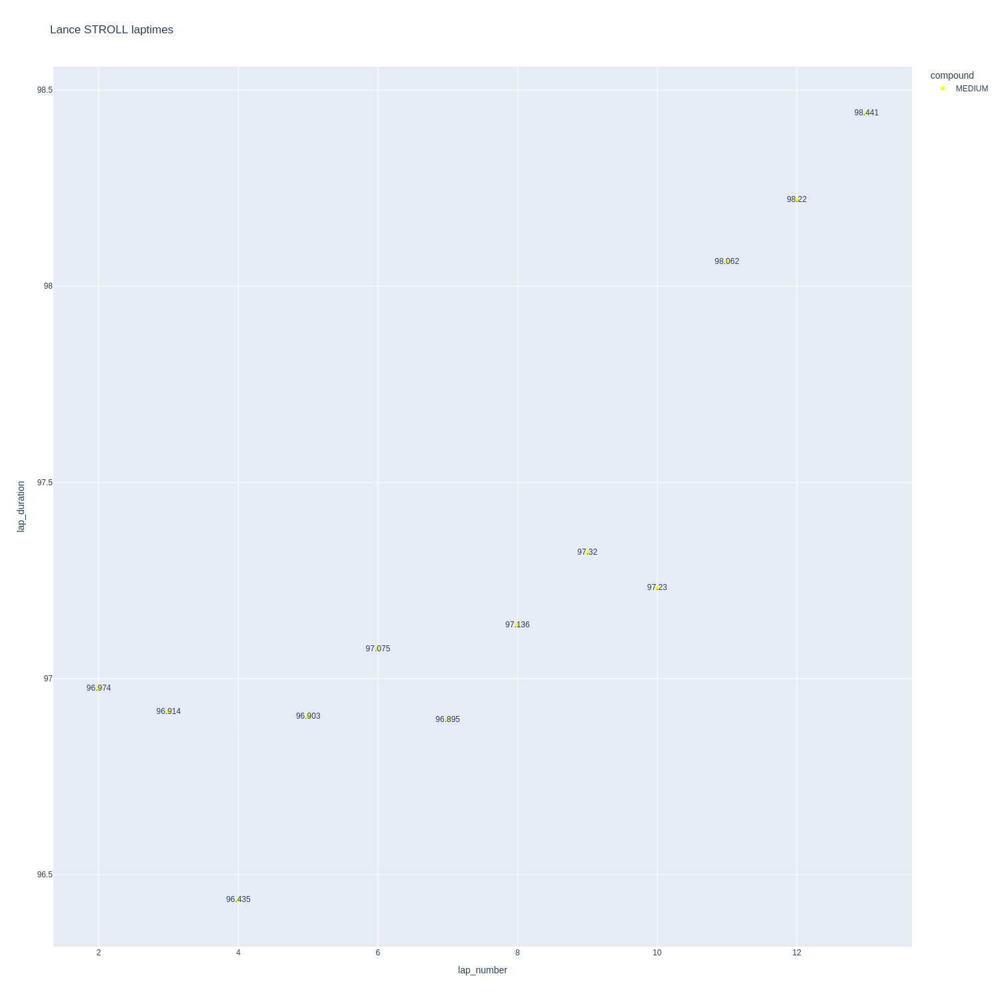

In [291]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

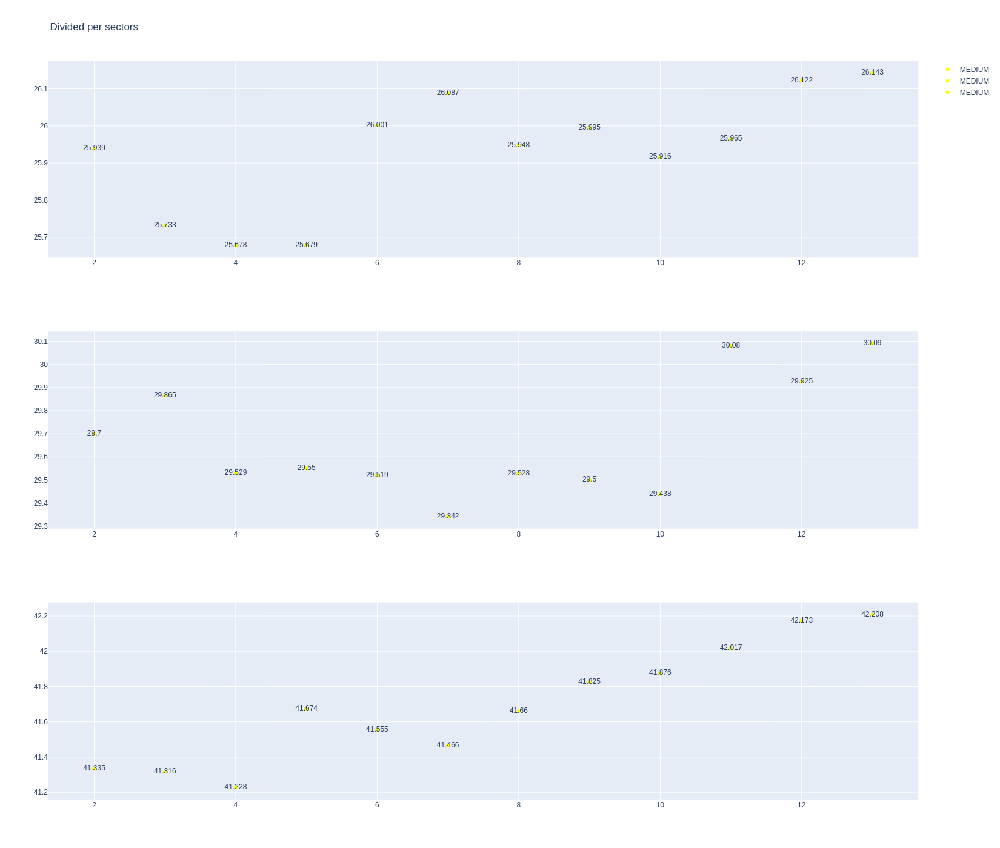

In [292]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [293]:
stintInformation.query('driver_number == 6 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
6,1255,9993,1,22,1,14,MEDIUM,3
11,1255,9993,1,6,1,15,MEDIUM,2


In [294]:
data = libraryDataF1.getinfolongruns(jointables,6,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
23,Isack HADJAR,MEDIUM,2025-03-22T03:05:31.097000+00:00,2,26.489,30.020,41.630,98.139
43,Isack HADJAR,MEDIUM,2025-03-22T03:07:09.257000+00:00,3,25.944,30.071,41.534,97.549
63,Isack HADJAR,MEDIUM,2025-03-22T03:08:46.705000+00:00,4,25.848,29.847,41.890,97.585
83,Isack HADJAR,MEDIUM,2025-03-22T03:10:24.272000+00:00,5,25.767,30.030,42.118,97.915
103,Isack HADJAR,MEDIUM,2025-03-22T03:12:02.187000+00:00,6,26.049,29.964,41.902,97.915
123,Isack HADJAR,MEDIUM,2025-03-22T03:13:40.104000+00:00,7,25.728,30.274,41.729,97.731
143,Isack HADJAR,MEDIUM,2025-03-22T03:15:17.817000+00:00,8,26.044,29.768,42.335,98.147
163,Isack HADJAR,MEDIUM,2025-03-22T03:16:56.004000+00:00,9,25.956,30.256,42.642,98.854
183,Isack HADJAR,MEDIUM,2025-03-22T03:18:34.748000+00:00,10,26.576,30.136,42.533,99.245
203,Isack HADJAR,MEDIUM,2025-03-22T03:20:14.061000+00:00,11,26.933,30.371,42.495,99.799


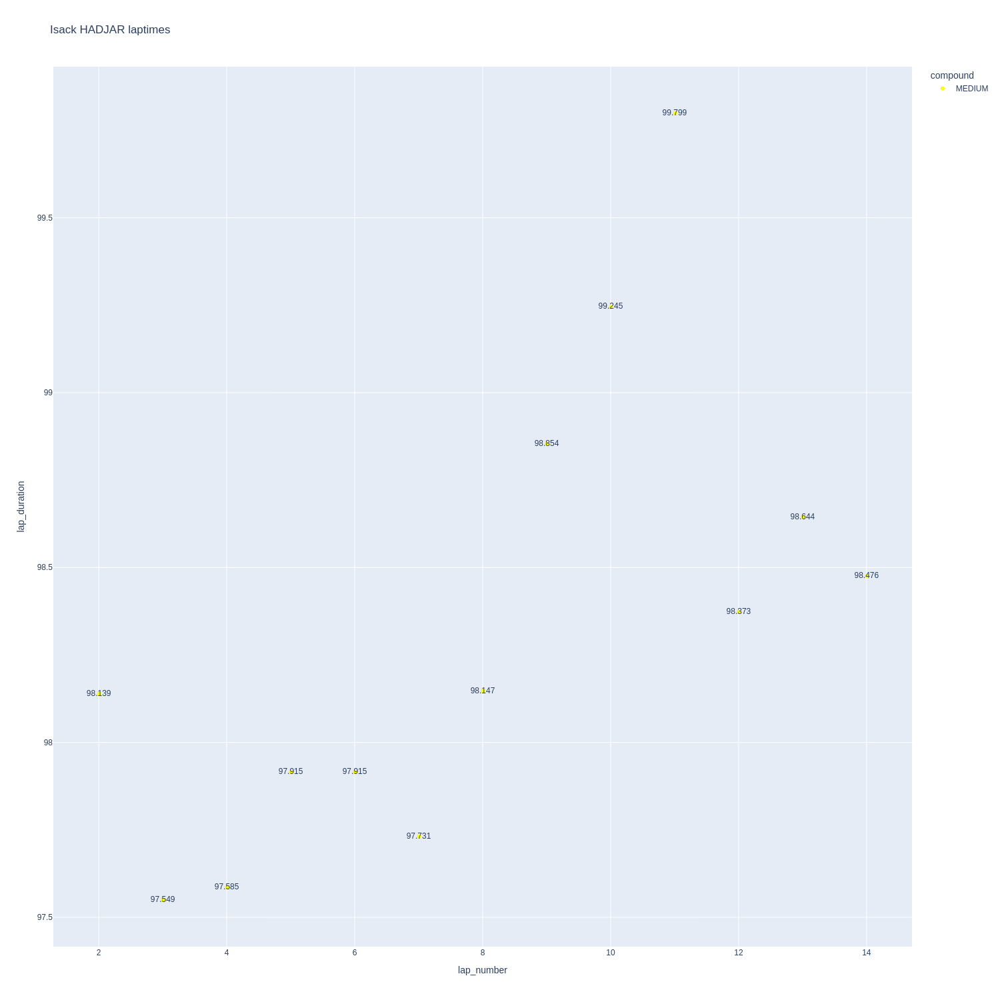

In [295]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

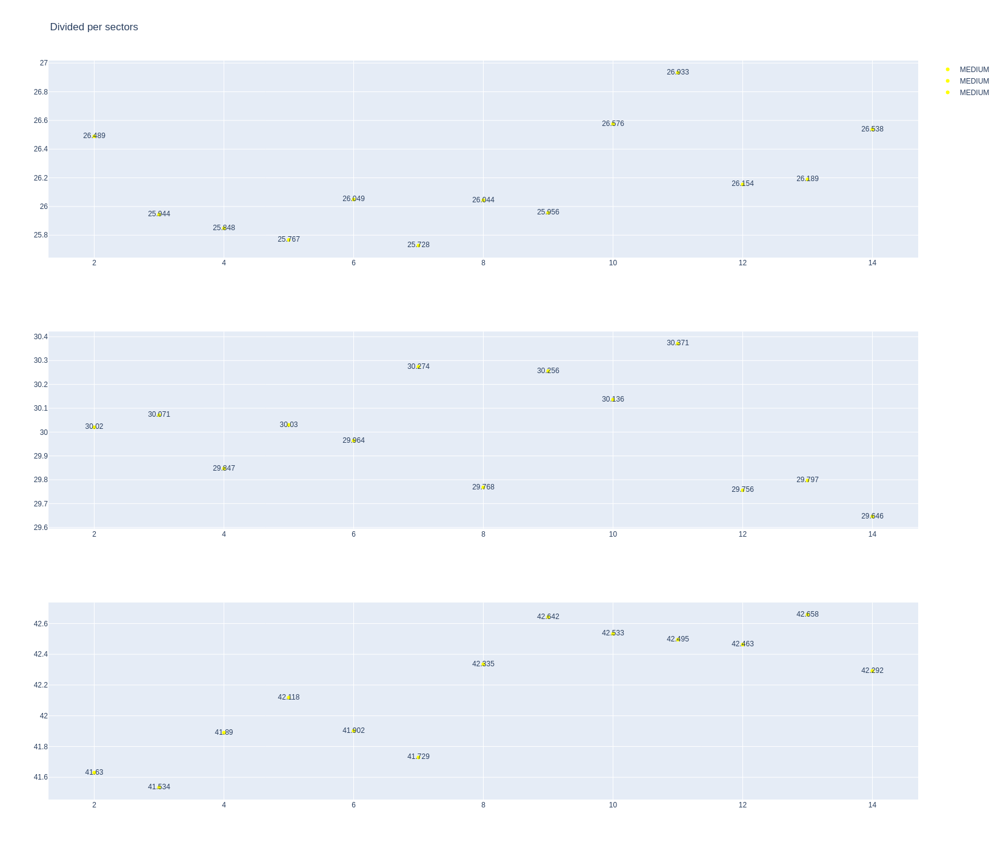

In [296]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [297]:
data = libraryDataF1.getinfolongruns(jointables,22,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
30,Yuki TSUNODA,MEDIUM,2025-03-22T03:05:26.069000+00:00,2,25.976,29.403,41.411,96.790
50,Yuki TSUNODA,MEDIUM,2025-03-22T03:07:03.045000+00:00,3,25.777,29.348,41.363,96.488
70,Yuki TSUNODA,MEDIUM,2025-03-22T03:08:39.651000+00:00,4,25.634,29.183,41.571,96.388
90,Yuki TSUNODA,MEDIUM,2025-03-22T03:10:15.929000+00:00,5,25.798,29.272,41.457,96.527
110,Yuki TSUNODA,MEDIUM,2025-03-22T03:11:52.347000+00:00,6,25.806,29.359,41.685,96.850
130,Yuki TSUNODA,MEDIUM,2025-03-22T03:13:29.258000+00:00,7,25.911,29.279,41.610,96.800
150,Yuki TSUNODA,MEDIUM,2025-03-22T03:15:06.128000+00:00,8,25.979,29.419,41.778,97.176
170,Yuki TSUNODA,MEDIUM,2025-03-22T03:16:43.152000+00:00,9,25.901,29.525,42.018,97.444
190,Yuki TSUNODA,MEDIUM,2025-03-22T03:18:20.660000+00:00,10,25.932,29.672,42.038,97.642
210,Yuki TSUNODA,MEDIUM,2025-03-22T03:19:58.331000+00:00,11,26.175,29.822,42.188,98.185


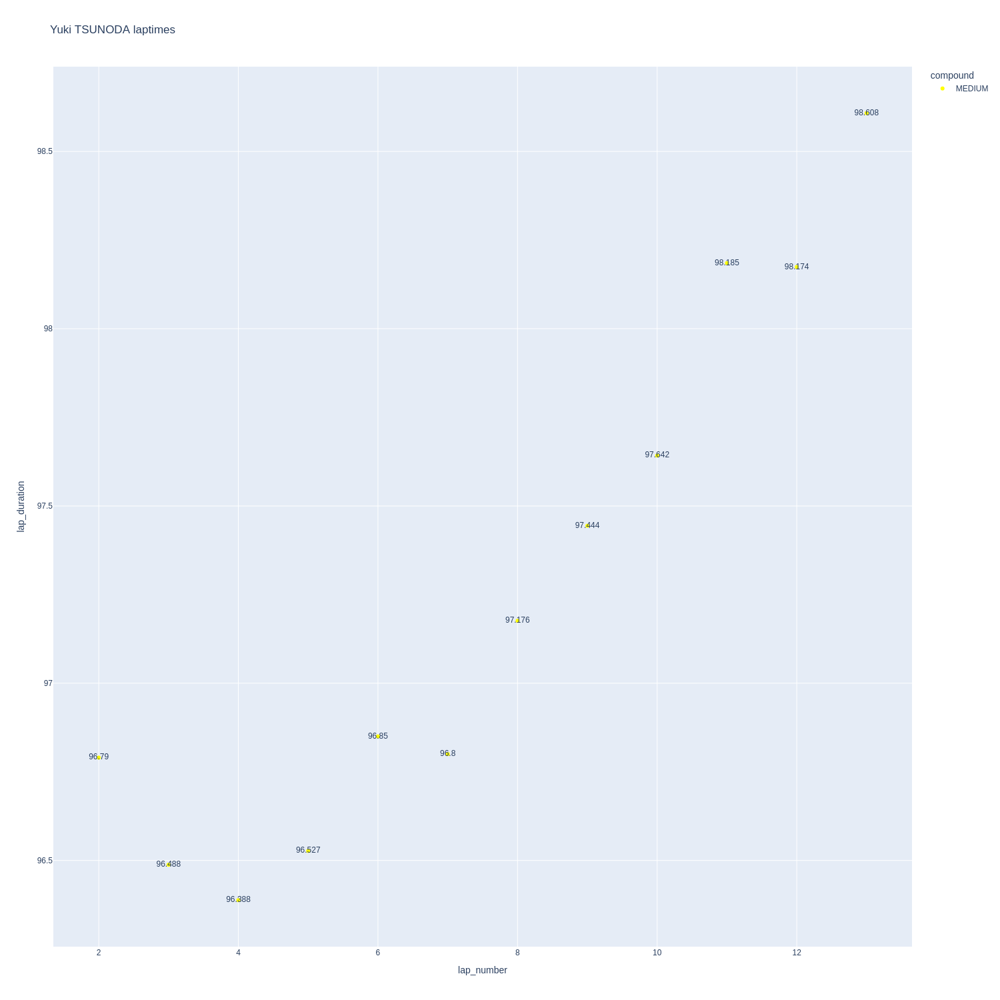

In [298]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

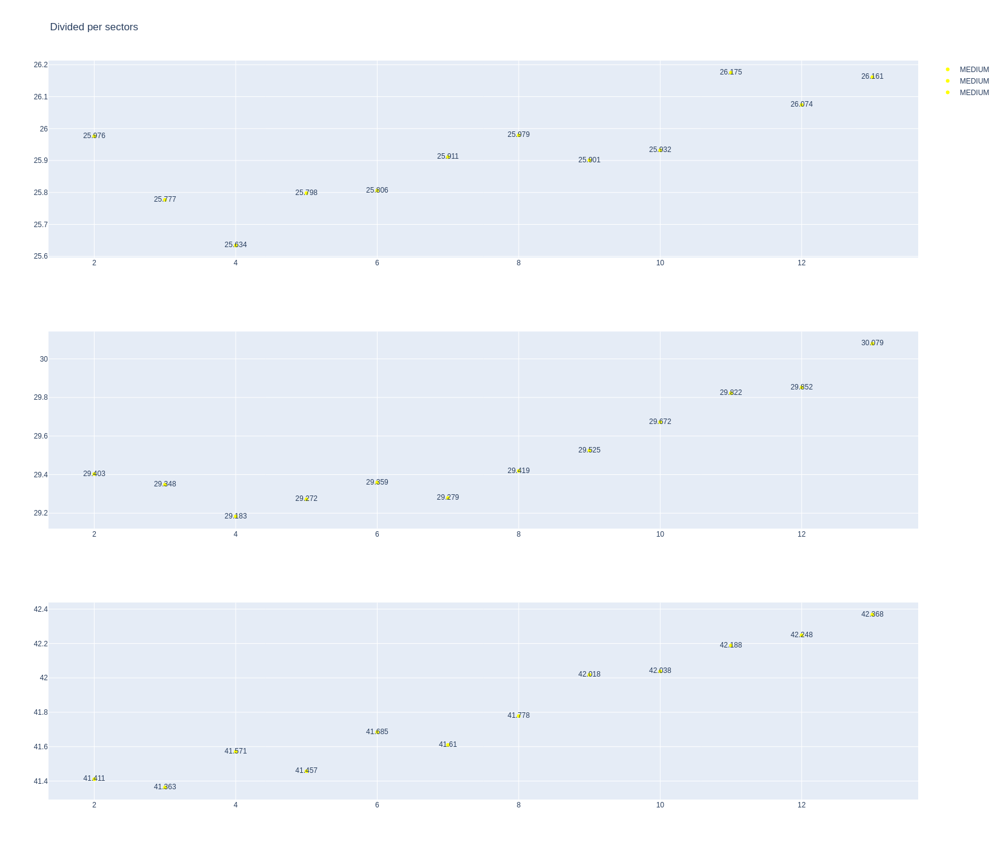

In [299]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [300]:
stintInformation.query('driver_number == 87 or driver_number == 31')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
18,1255,9993,1,31,1,15,MEDIUM,6
19,1255,9993,1,87,1,15,MEDIUM,3


In [301]:
data = libraryDataF1.getinfolongruns(jointables,31,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
34,Esteban OCON,MEDIUM,2025-03-22T03:05:31.550000+00:00,2,26.382,29.981,41.927,98.290
54,Esteban OCON,MEDIUM,2025-03-22T03:07:09.749000+00:00,3,25.880,30.017,41.657,97.554
74,Esteban OCON,MEDIUM,2025-03-22T03:08:47.314000+00:00,4,25.733,30.009,41.890,97.632
94,Esteban OCON,MEDIUM,2025-03-22T03:10:24.849000+00:00,5,25.926,29.851,41.977,97.754
114,Esteban OCON,MEDIUM,2025-03-22T03:12:02.577000+00:00,6,26.206,29.959,42.414,98.579
134,Esteban OCON,MEDIUM,2025-03-22T03:13:41.318000+00:00,7,26.181,29.965,42.123,98.269
154,Esteban OCON,MEDIUM,2025-03-22T03:15:19.428000+00:00,8,26.201,29.990,42.252,98.443
174,Esteban OCON,MEDIUM,2025-03-22T03:16:57.996000+00:00,9,26.088,30.010,42.416,98.514
194,Esteban OCON,MEDIUM,2025-03-22T03:18:36.408000+00:00,10,26.305,30.421,42.667,99.393
214,Esteban OCON,MEDIUM,2025-03-22T03:20:15.820000+00:00,11,26.433,30.817,42.887,100.137


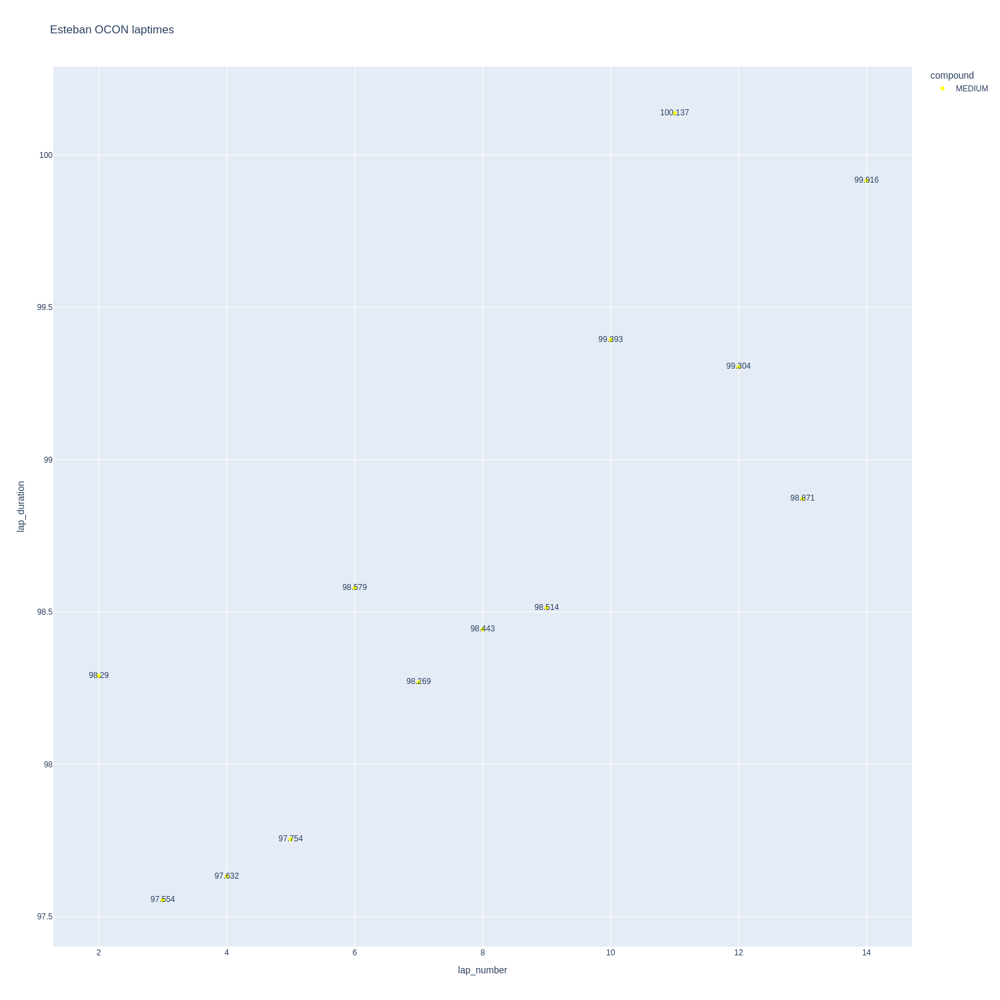

In [302]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

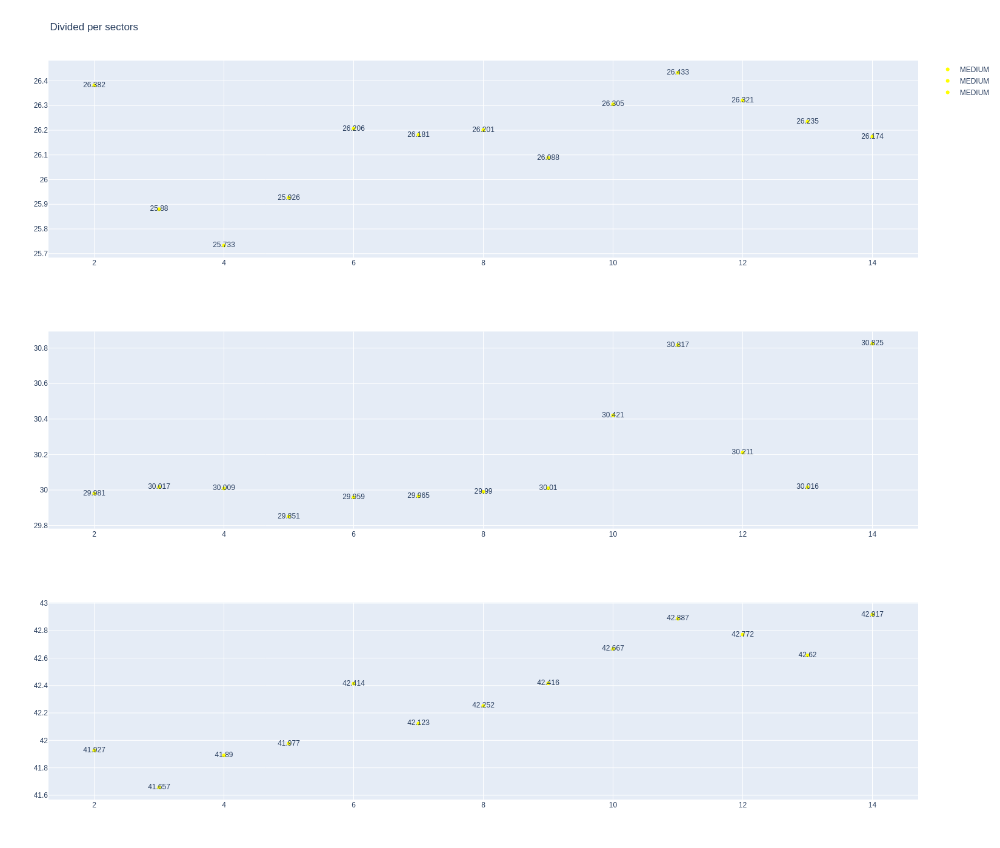

In [303]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [304]:
data = libraryDataF1.getinfolongruns(jointables,87,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
39,Oliver BEARMAN,MEDIUM,2025-03-22T03:05:29.078000+00:00,2,26.264,29.996,41.576,97.836
59,Oliver BEARMAN,MEDIUM,2025-03-22T03:07:07.042000+00:00,3,25.900,29.767,41.468,97.135
79,Oliver BEARMAN,MEDIUM,2025-03-22T03:08:44.195000+00:00,4,26.104,30.012,41.843,97.959
99,Oliver BEARMAN,MEDIUM,2025-03-22T03:10:22.082000+00:00,5,26.048,29.925,41.721,97.694
119,Oliver BEARMAN,MEDIUM,2025-03-22T03:11:59.726000+00:00,6,26.255,29.758,41.880,97.893
139,Oliver BEARMAN,MEDIUM,2025-03-22T03:13:37.677000+00:00,7,26.242,29.693,41.804,97.739
159,Oliver BEARMAN,MEDIUM,2025-03-22T03:15:15.401000+00:00,8,26.543,29.602,42.092,98.237
179,Oliver BEARMAN,MEDIUM,2025-03-22T03:16:53.621000+00:00,9,26.476,29.787,42.107,98.370
199,Oliver BEARMAN,MEDIUM,2025-03-22T03:18:31.997000+00:00,10,26.544,29.659,42.110,98.313
219,Oliver BEARMAN,MEDIUM,2025-03-22T03:20:10.304000+00:00,11,26.676,29.564,42.120,98.360


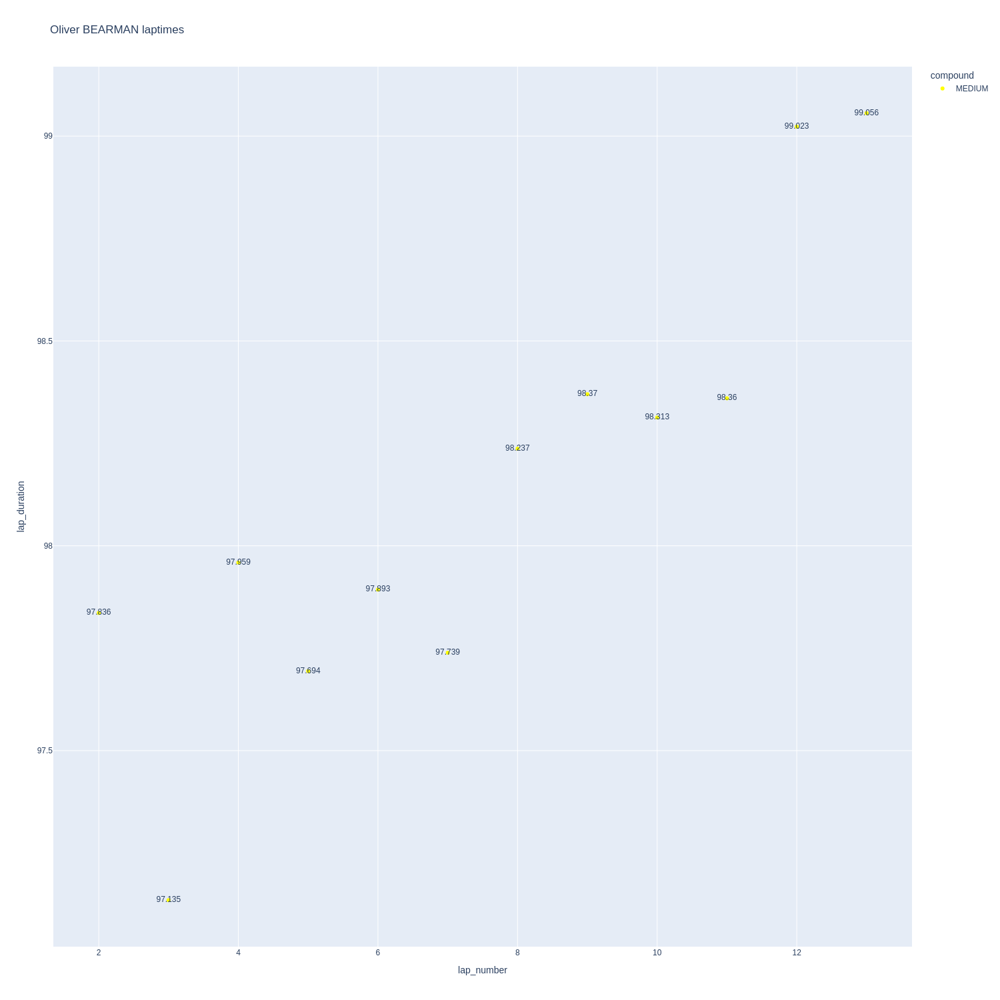

In [305]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

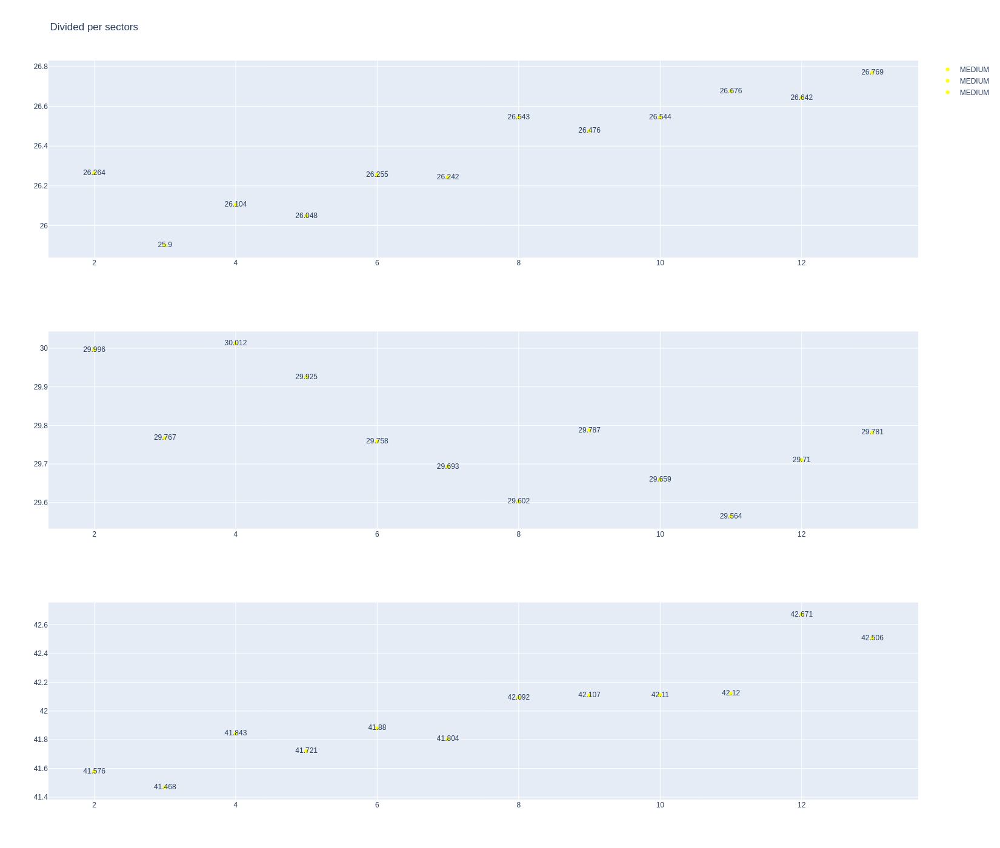

In [306]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [307]:
stintInformation.query('driver_number == 10 or driver_number == 7')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
12,1255,9993,1,7,1,15,MEDIUM,6
13,1255,9993,1,10,1,15,MEDIUM,6


In [308]:
data =libraryDataF1.getinfolongruns(jointables,7,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
24,Jack DOOHAN,MEDIUM,2025-03-22T03:05:31.963000+00:00,2,26.463,29.984,41.889,98.336
44,Jack DOOHAN,MEDIUM,2025-03-22T03:07:10.245000+00:00,3,25.807,29.968,41.911,97.686
64,Jack DOOHAN,MEDIUM,2025-03-22T03:08:47.898000+00:00,4,25.615,29.892,42.594,98.101
84,Jack DOOHAN,MEDIUM,2025-03-22T03:10:26.019000+00:00,5,26.023,29.757,42.100,97.880
104,Jack DOOHAN,MEDIUM,2025-03-22T03:12:03.903000+00:00,6,25.957,29.882,41.964,97.803
124,Jack DOOHAN,MEDIUM,2025-03-22T03:13:41.786000+00:00,7,26.218,29.897,42.121,98.236
144,Jack DOOHAN,MEDIUM,2025-03-22T03:15:20.001000+00:00,8,26.120,30.220,42.079,98.419
164,Jack DOOHAN,MEDIUM,2025-03-22T03:16:58.390000+00:00,9,26.159,30.050,42.240,98.449
184,Jack DOOHAN,MEDIUM,2025-03-22T03:18:36.834000+00:00,10,26.433,30.438,42.470,99.341
204,Jack DOOHAN,MEDIUM,2025-03-22T03:20:16.246000+00:00,11,26.710,30.665,42.729,100.104


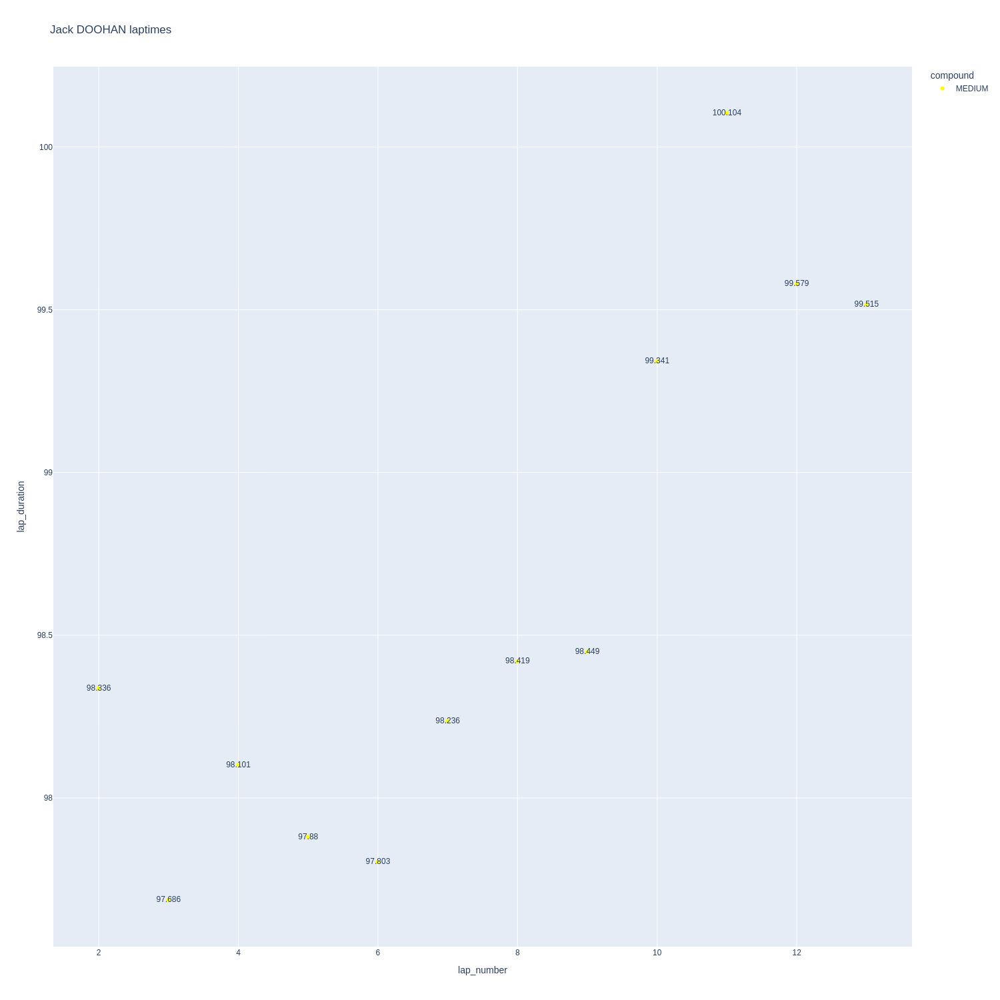

In [309]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

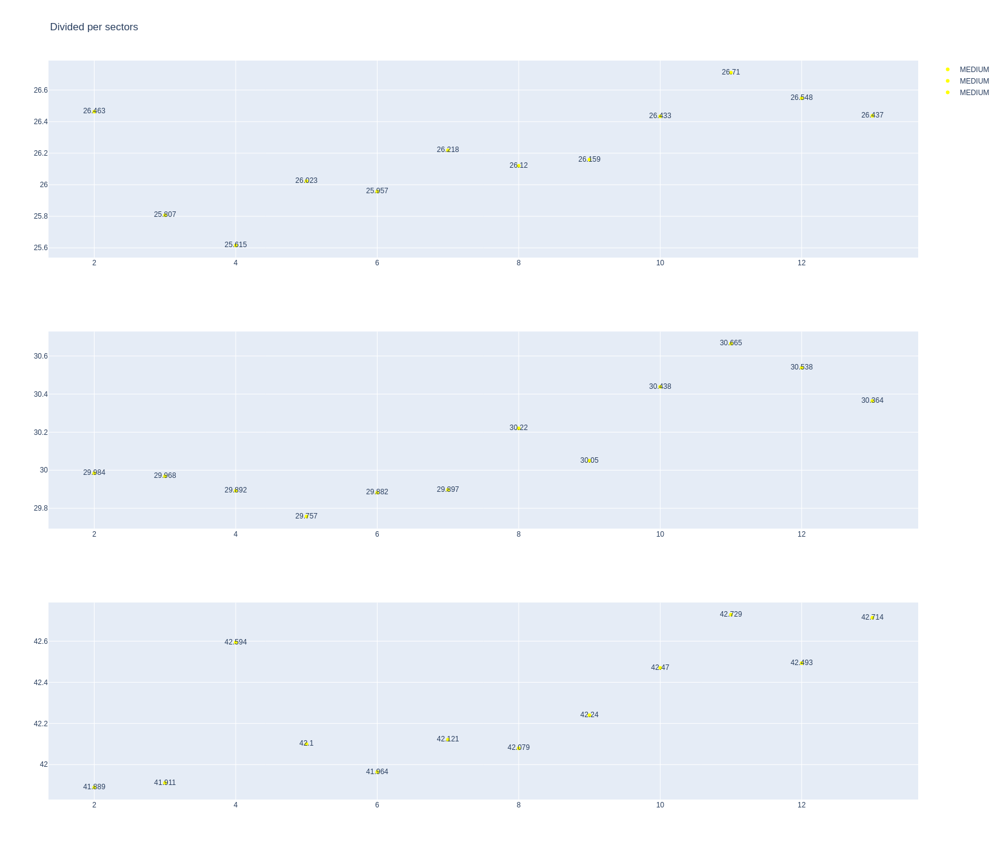

In [310]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [311]:
data = libraryDataF1.getinfolongruns(jointables,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
25,Pierre GASLY,MEDIUM,2025-03-22T03:05:29.966000+00:00,2,26.719,29.724,41.576,98.019
45,Pierre GASLY,MEDIUM,2025-03-22T03:07:08.159000+00:00,3,25.933,29.615,41.933,97.481
65,Pierre GASLY,MEDIUM,2025-03-22T03:08:45.620000+00:00,4,25.871,29.801,42.025,97.697
85,Pierre GASLY,MEDIUM,2025-03-22T03:10:23.299000+00:00,5,26.102,29.799,41.937,97.838
105,Pierre GASLY,MEDIUM,2025-03-22T03:12:01.152000+00:00,6,26.261,29.750,41.894,97.905
125,Pierre GASLY,MEDIUM,2025-03-22T03:13:39.057000+00:00,7,26.239,29.842,41.816,97.897
145,Pierre GASLY,MEDIUM,2025-03-22T03:15:16.968000+00:00,8,26.159,30.093,42.417,98.669
165,Pierre GASLY,MEDIUM,2025-03-22T03:16:55.655000+00:00,9,26.242,30.062,43.165,99.469
185,Pierre GASLY,MEDIUM,2025-03-22T03:18:35.071000+00:00,10,26.138,30.058,42.020,98.216
205,Pierre GASLY,MEDIUM,2025-03-22T03:20:13.256000+00:00,11,26.443,29.914,42.504,98.861


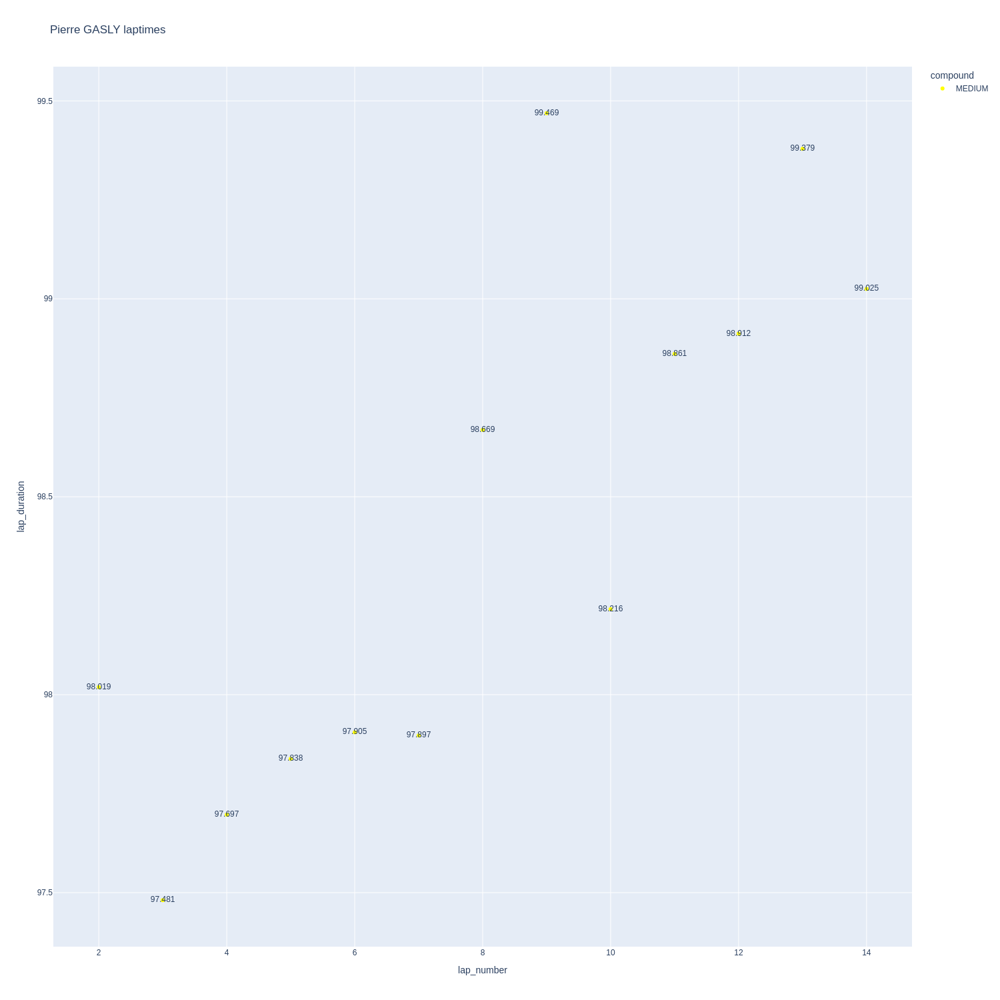

In [312]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

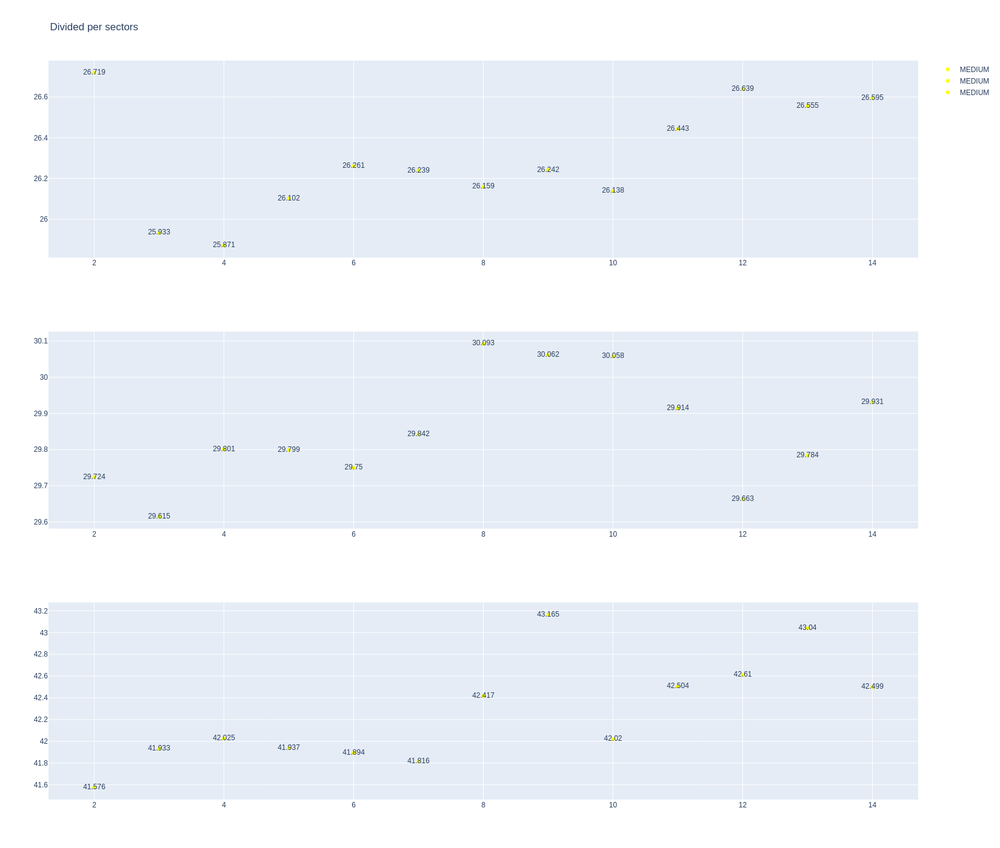

In [313]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [314]:
stintInformation.query('driver_number == 55 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1255,9993,1,55,1,11,MEDIUM,4
15,1255,9993,1,23,1,15,MEDIUM,4
20,1255,9993,2,55,12,15,MEDIUM,0


In [315]:
data = libraryDataF1.getinfolongruns(jointables,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
31,Alexander ALBON,MEDIUM,2025-03-22T03:05:28.623000+00:00,2,26.252,29.729,41.562,97.543
51,Alexander ALBON,MEDIUM,2025-03-22T03:07:06.111000+00:00,3,25.910,29.868,41.569,97.347
71,Alexander ALBON,MEDIUM,2025-03-22T03:08:43.599000+00:00,4,26.096,29.921,41.678,97.695
91,Alexander ALBON,MEDIUM,2025-03-22T03:10:21.172000+00:00,5,26.060,29.824,41.686,97.570
111,Alexander ALBON,MEDIUM,2025-03-22T03:11:58.881000+00:00,6,26.095,29.875,41.630,97.600
131,Alexander ALBON,MEDIUM,2025-03-22T03:13:36.378000+00:00,7,25.992,29.677,41.675,97.344
151,Alexander ALBON,MEDIUM,2025-03-22T03:15:13.705000+00:00,8,26.025,29.772,42.090,97.887
171,Alexander ALBON,MEDIUM,2025-03-22T03:16:51.628000+00:00,9,26.429,29.924,42.159,98.512
191,Alexander ALBON,MEDIUM,2025-03-22T03:18:30.179000+00:00,10,26.411,29.706,42.175,98.292
211,Alexander ALBON,MEDIUM,2025-03-22T03:20:08.368000+00:00,11,26.312,29.824,42.128,98.264


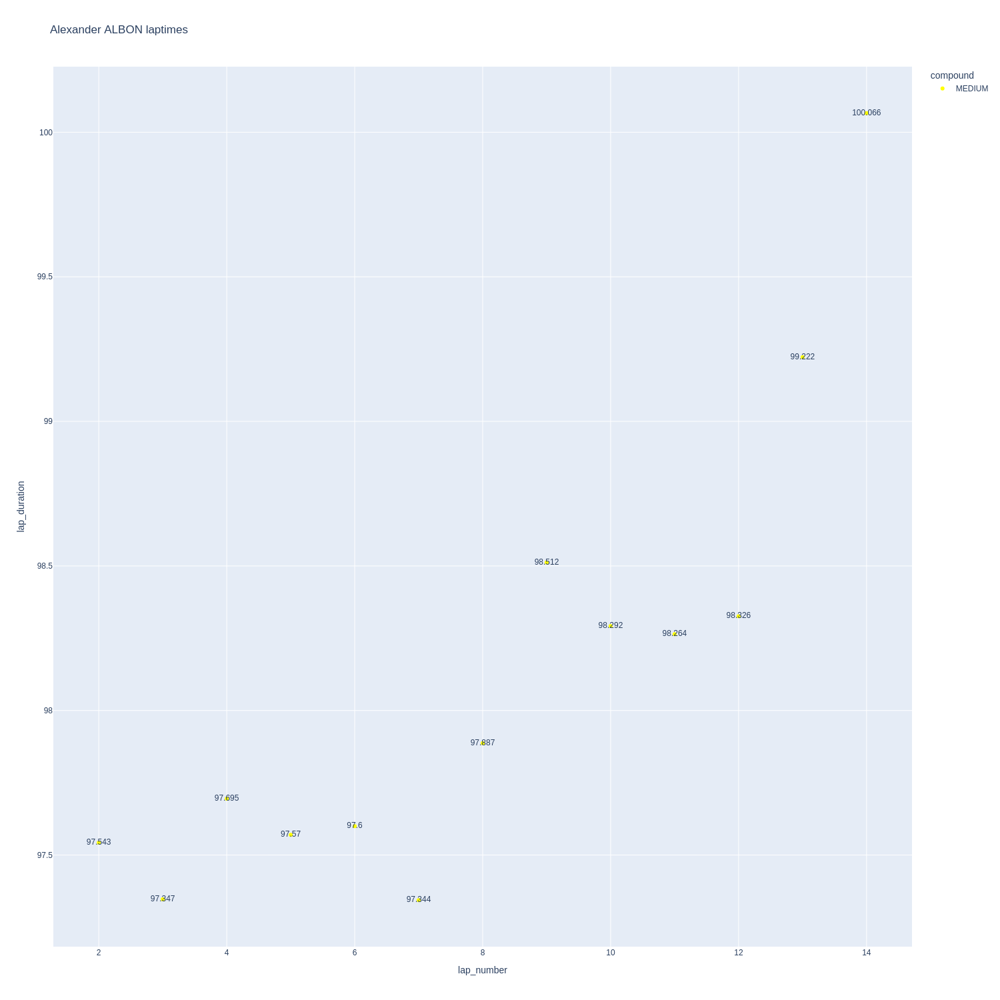

In [316]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

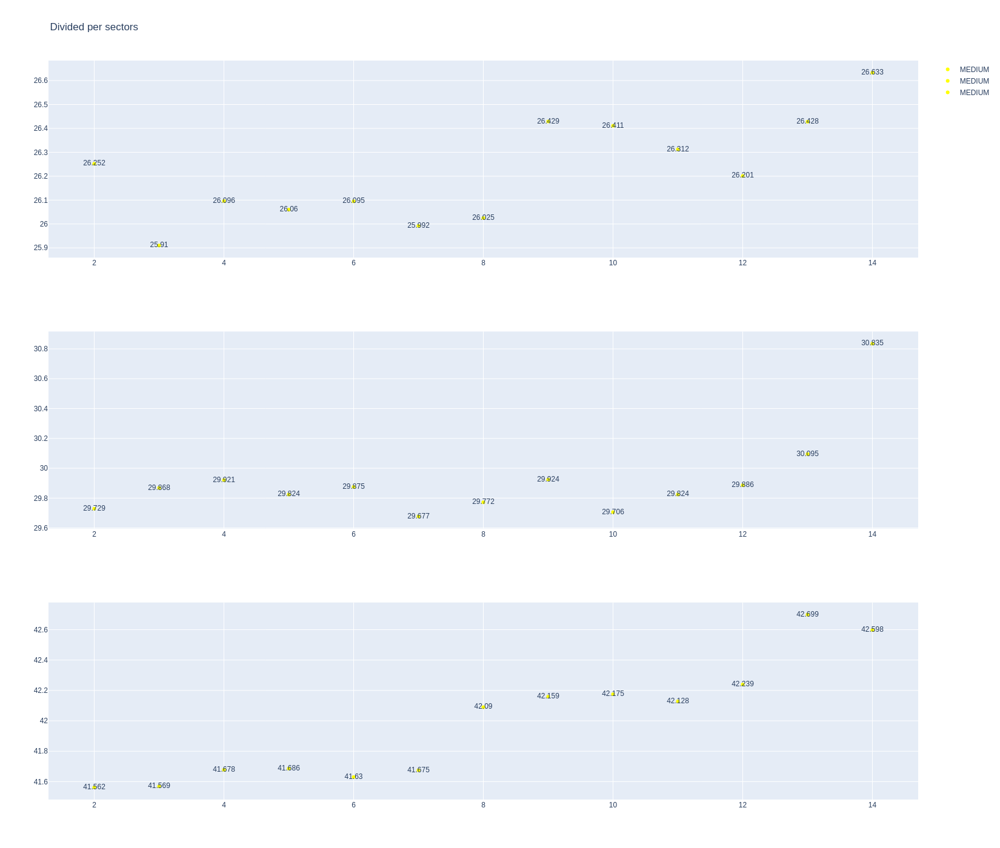

In [317]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [318]:
data= libraryDataF1.getinfolongruns(jointables,55,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
36,Carlos SAINZ,MEDIUM,2025-03-22T03:05:29.752000+00:00,2,26.591,29.753,41.678,98.022
56,Carlos SAINZ,MEDIUM,2025-03-22T03:07:07.656000+00:00,3,25.837,29.627,41.838,97.302
76,Carlos SAINZ,MEDIUM,2025-03-22T03:08:44.949000+00:00,4,25.918,29.758,42.029,97.705
96,Carlos SAINZ,MEDIUM,2025-03-22T03:10:22.699000+00:00,5,26.067,29.813,41.923,97.803
116,Carlos SAINZ,MEDIUM,2025-03-22T03:12:00.500000+00:00,6,26.079,29.909,41.897,97.885
136,Carlos SAINZ,MEDIUM,2025-03-22T03:13:38.414000+00:00,7,26.191,29.845,41.907,97.943
156,Carlos SAINZ,MEDIUM,2025-03-22T03:15:16.453000+00:00,8,26.247,29.954,42.189,98.390
176,Carlos SAINZ,MEDIUM,2025-03-22T03:16:54.657000+00:00,9,26.566,30.098,42.685,99.349
196,Carlos SAINZ,MEDIUM,2025-03-22T03:18:34.037000+00:00,10,26.560,30.067,43.124,99.751
256,Carlos SAINZ,MEDIUM,2025-03-22T03:23:54.360000+00:00,13,25.538,28.621,41.660,95.819


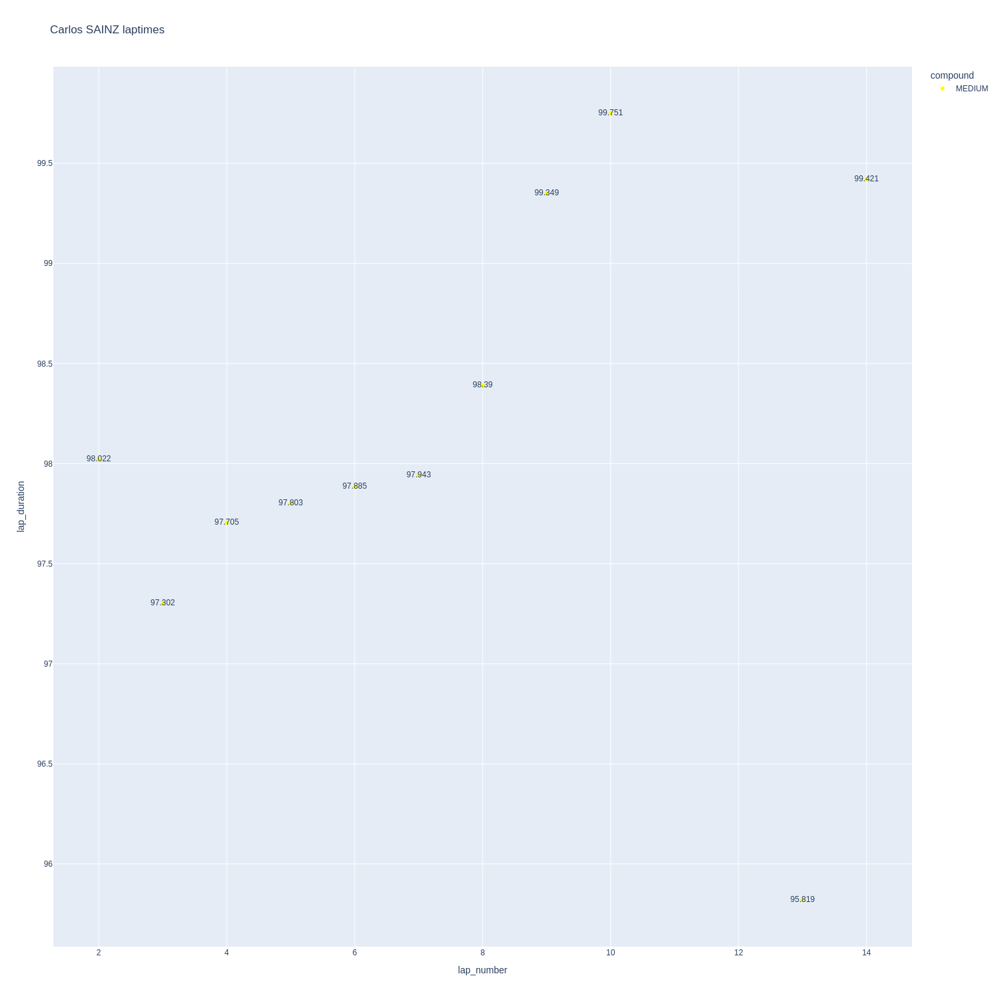

In [319]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

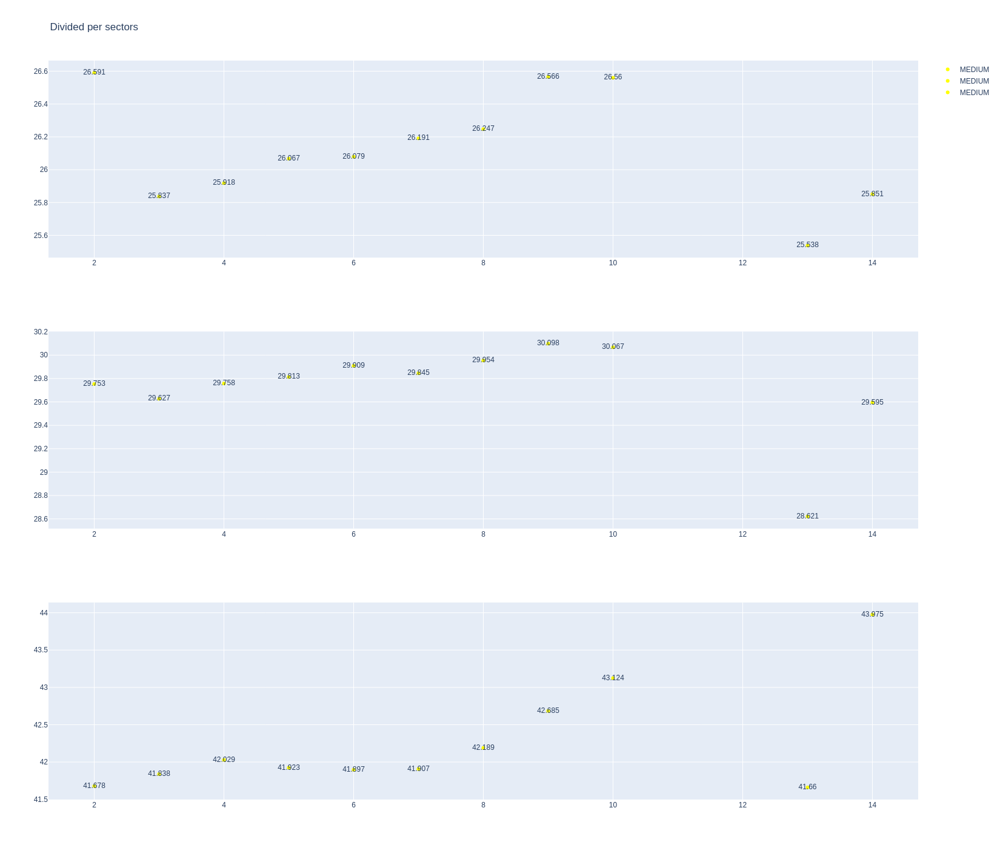

In [320]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [321]:
stintInformation.query('driver_number == 5 or driver_number == 27')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
10,1255,9993,1,5,1,15,MEDIUM,6
16,1255,9993,1,27,1,15,MEDIUM,6


In [322]:
data = libraryDataF1.getinfolongruns(jointables,5,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
22,Gabriel BORTOLETO,MEDIUM,2025-03-22T03:05:30.665000+00:00,2,26.679,29.770,41.681,98.130
42,Gabriel BORTOLETO,MEDIUM,2025-03-22T03:07:08.667000+00:00,3,26.059,29.534,41.882,97.475
62,Gabriel BORTOLETO,MEDIUM,2025-03-22T03:08:46.125000+00:00,4,25.978,29.664,41.966,97.608
82,Gabriel BORTOLETO,MEDIUM,2025-03-22T03:10:23.762000+00:00,5,26.046,29.981,41.936,97.963
102,Gabriel BORTOLETO,MEDIUM,2025-03-22T03:12:01.700000+00:00,6,26.191,29.787,41.923,97.901
122,Gabriel BORTOLETO,MEDIUM,2025-03-22T03:13:39.614000+00:00,7,26.199,29.938,42.485,98.622
142,Gabriel BORTOLETO,MEDIUM,2025-03-22T03:15:18.256000+00:00,8,26.391,29.827,42.135,98.353
162,Gabriel BORTOLETO,MEDIUM,2025-03-22T03:16:56.589000+00:00,9,26.285,30.038,42.626,98.949
182,Gabriel BORTOLETO,MEDIUM,2025-03-22T03:18:35.502000+00:00,10,26.538,30.799,42.580,99.917
202,Gabriel BORTOLETO,MEDIUM,2025-03-22T03:20:15.481000+00:00,11,26.601,30.530,42.752,99.883


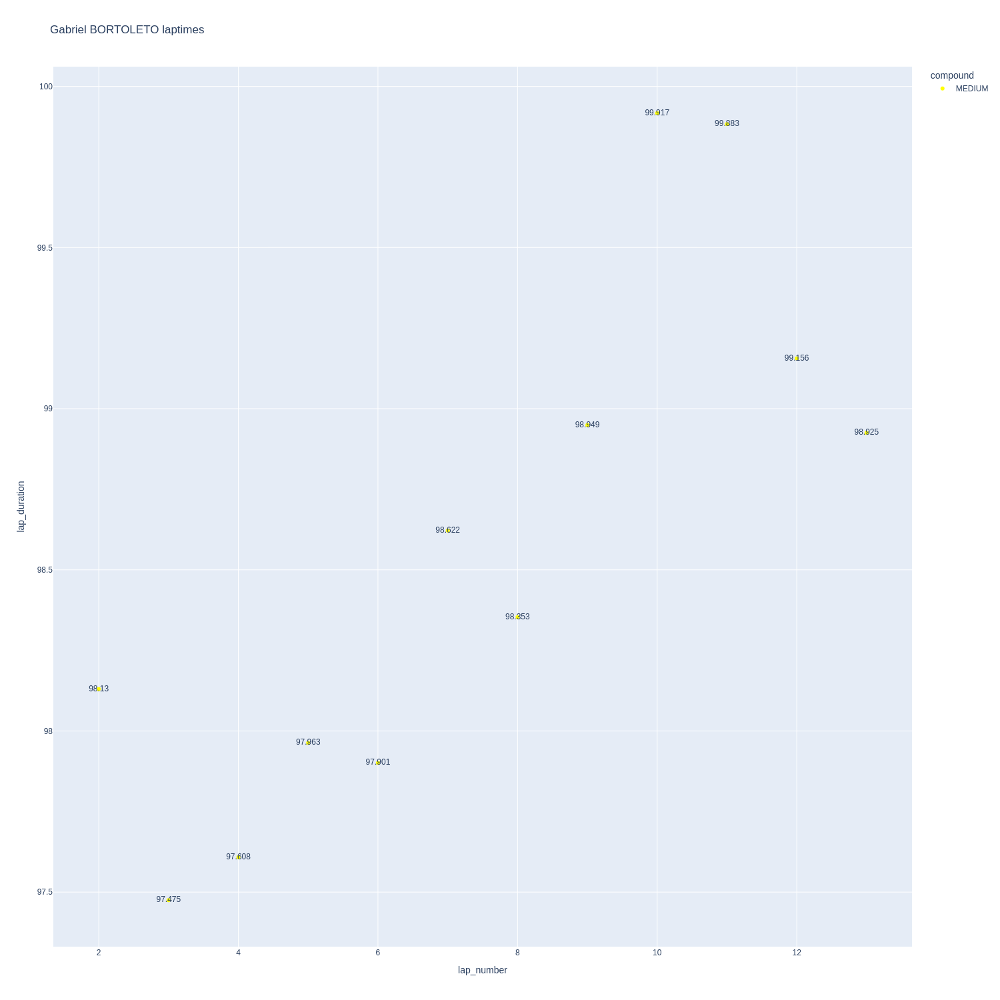

In [323]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

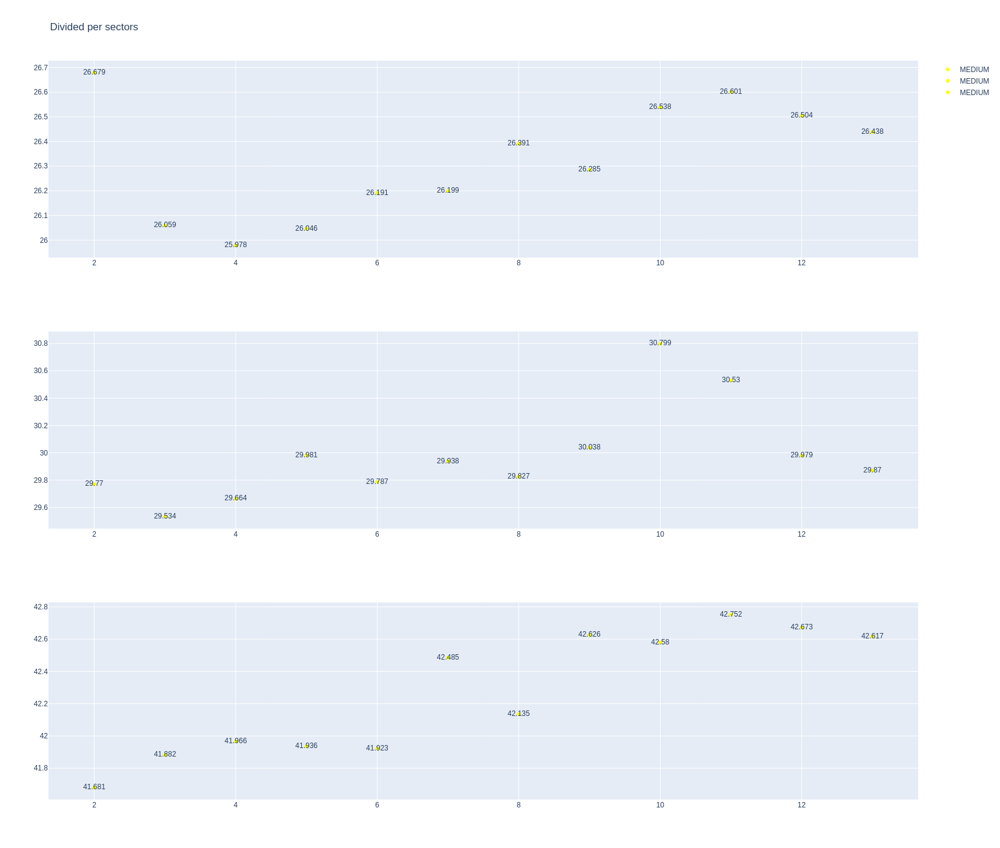

In [324]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [325]:
data = libraryDataF1.getinfolongruns(jointables,27,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
32,Nico HULKENBERG,MEDIUM,2025-03-22T03:05:33.839000+00:00,2,26.783,30.567,42.183,99.533
52,Nico HULKENBERG,MEDIUM,2025-03-22T03:07:13.398000+00:00,3,25.573,29.674,41.557,96.804
72,Nico HULKENBERG,MEDIUM,2025-03-22T03:08:50.160000+00:00,4,25.370,29.399,41.760,96.529
92,Nico HULKENBERG,MEDIUM,2025-03-22T03:10:26.674000+00:00,5,25.959,30.051,41.751,97.761
112,Nico HULKENBERG,MEDIUM,2025-03-22T03:12:04.575000+00:00,6,25.969,30.164,41.835,97.968
132,Nico HULKENBERG,MEDIUM,2025-03-22T03:13:42.518000+00:00,7,26.174,30.067,42.252,98.493
152,Nico HULKENBERG,MEDIUM,2025-03-22T03:15:20.875000+00:00,8,25.938,30.090,42.200,98.228
172,Nico HULKENBERG,MEDIUM,2025-03-22T03:16:59.163000+00:00,9,26.109,30.127,42.315,98.551
192,Nico HULKENBERG,MEDIUM,2025-03-22T03:18:37.745000+00:00,10,26.210,30.419,42.439,99.068
212,Nico HULKENBERG,MEDIUM,2025-03-22T03:20:16.757000+00:00,11,26.539,30.662,42.829,100.030


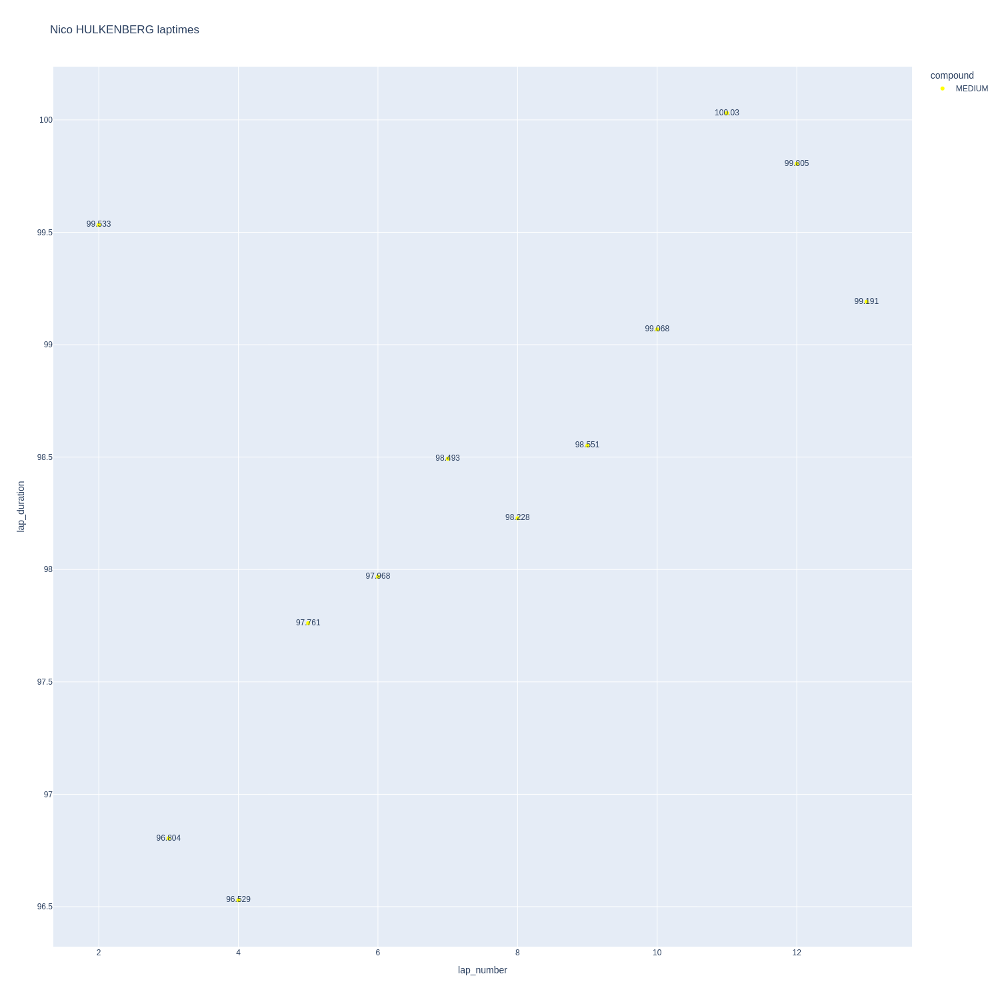

In [326]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

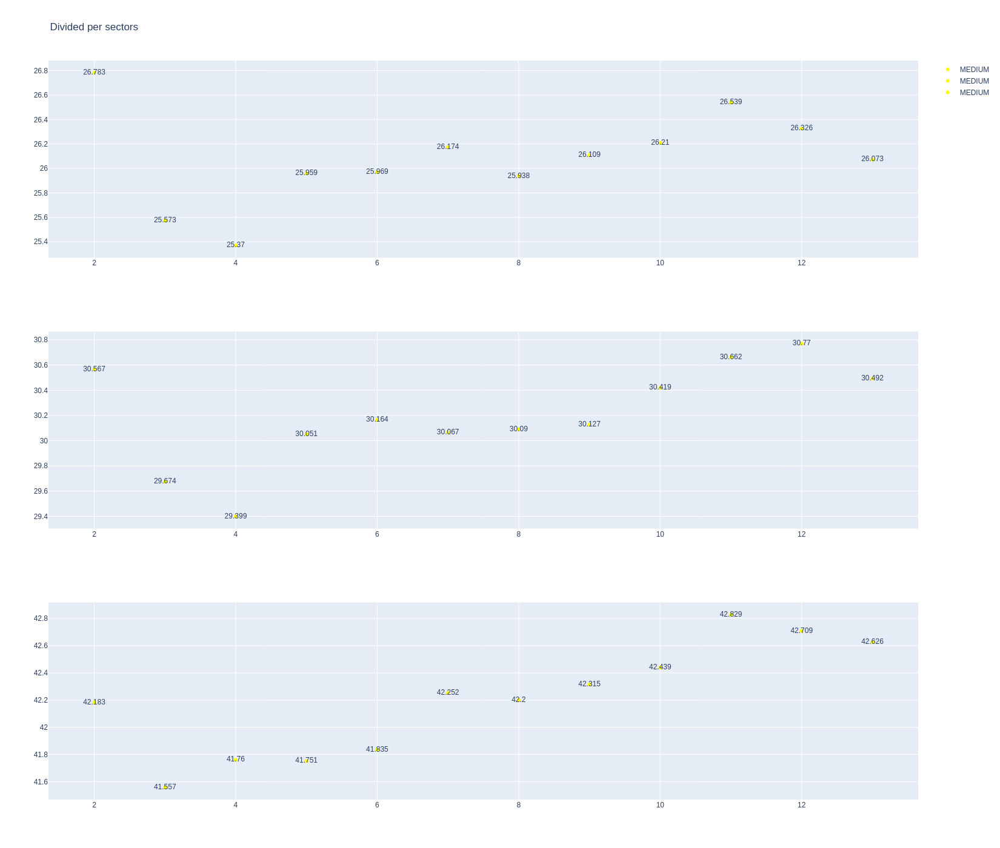

In [327]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

## Qualyfing
### Set up
First of all, it is neccesary to obtain the data about the qualyfing
#### Race control
This section has been added in order to know which laps has been deleted and knowing what happened on track during this session.

In [329]:
libraryDataF1.obtain_information('race_control',session_key=9994).query('message.str.contains("GREEN")')

,session_key,meeting_key,date,category,flag,lap_number,message,driver_number,scope,sector
0,9994,1255,2025-03-22T07:00:00+00:00,Flag,GREEN,None,GREEN LIGHT - PIT EXIT OPEN,None,Track,NaN
62,9994,1255,2025-03-22T07:25:00+00:00,Flag,GREEN,None,GREEN LIGHT - PIT EXIT OPEN,None,Track,NaN
109,9994,1255,2025-03-22T07:48:00+00:00,Flag,GREEN,None,GREEN LIGHT - PIT EXIT OPEN,None,Track,NaN


In [330]:
libraryDataF1.obtain_information('race_control',session_key=9994).query('message.str.contains("DELETED")')

,session_key,meeting_key,date,category,flag,lap_number,message,driver_number,scope,sector
7,9994,1255,2025-03-22T07:04:20+00:00,Other,None,None,CAR 22 (TSU) LAP DELETED - TRACK LIMITS AT TUR...,None,None,NaN
8,9994,1255,2025-03-22T07:05:11+00:00,Other,None,None,CAR 7 (DOO) LAP DELETED - TRACK LIMITS AT TURN...,None,None,NaN
9,9994,1255,2025-03-22T07:06:14+00:00,Other,None,None,CAR 4 (NOR) TIME 1:32.036 DELETED - TRACK LIMI...,None,None,NaN
110,9994,1255,2025-03-22T07:53:29+00:00,Other,None,None,CAR 12 (ANT) TIME 1:31.685 DELETED - TRACK LIM...,None,None,NaN


### Obtain setup

In [331]:
qualyfing = libraryDataF1.obtain_information('laps',session_key=9994)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9994)
drivers = libraryDataF1.obtain_information('drivers',session_key=9994)
libraryDataF1.obtain_drivers_colours(drivers)

In [333]:
session = ff1.get_session(2025, 2, 'Q')
session.load()
session.laps["LapTimeSeconds"] = session.laps["LapTime"].dt.total_seconds()

core           INFO 	Loading data for Chinese Grand Prix - Qualifying [v3.3.0]
req            INFO 	No cached data found for session_info. Loading data...
_api           INFO 	Fetching session info data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for driver_info. Loading data...
_api           INFO 	Fetching driver list...
req            INFO 	Data has been written to cache!
core        WARNING 	No result data for this session available on Ergast! (This is expected for recent sessions)
req            INFO 	No cached data found for session_status_data. Loading data...
_api           INFO 	Fetching session status data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for track_status_data. Loading data...
_api           INFO 	Fetching track status data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for _extended_timing_data. Loading data

To obtain a better analysis, those laptimes deleted will be removed from this analysis in order to obtain the data with valid values. So that,taking into account the race control table, it will be neccesary to consult the qualyfing data to obtain the ids. 

In [334]:
laptimes_deleted = [92.036,91.685]
driver_number_lap_deleted = [4,12]

for ltime_deleted, dn_time_deleted in zip(laptimes_deleted,driver_number_lap_deleted):
    try:
        id_deleted = qualyfing.query("driver_number == @dn_time_deleted and lap_duration == @ltime_deleted").index[0]
        qualyfing = qualyfing.drop(id_deleted)
    except:
        print("Laptime deleted associated with the selected driver does not exist. Please, check again the order of the arrays")

In [335]:
bestlap = qualyfing.loc[qualyfing.groupby(['driver_number'])['lap_duration'].idxmin()].sort_values(by=['lap_duration'],ascending=True)
bestlap[0:1]

,meeting_key,session_key,driver_number,i1_speed,i2_speed,st_speed,date_start,lap_duration,is_pit_out_lap,duration_sector_1,duration_sector_2,duration_sector_3,segments_sector_1,segments_sector_2,segments_sector_3,lap_number
302,1255,9994,81,284,278,329,2025-03-22T07:58:40.095000+00:00,90.641,False,23.996,27.227,39.418,"[2049, 2048, 2048, 2049, 2048, 2048, 2049]","[2048, 2048, 2049, 2049, 2051, 2048]","[2048, 2048, 2048, 2048, 2048, 2048, 2048, 204...",19


In this case, the fastest lap is 90.641 seconds (1.30.641= so that to obtain the competitve laps the fastest lap will be multiplied by 1.07 (96.985 seconds) due to, according to the rules all the drivers have to do unless one lap within this gap.

In [336]:
competitiveLaps = qualyfing.query("is_pit_out_lap == False and lap_duration < 96.985")

In [337]:
drivers_list = list(competitiveLaps['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_information_qualy(driver,competitiveLaps,newdataset)
jointables = pd.merge(newdataset,drivers,on=['driver_number'])
jointables.sort_values(by=['fastest_lap'],ascending=True)
print()

#### Best lap per driver compared with the best lap of the session
Sainz could have finished better than his final position due to his attemp in Q1 was better. Ferrari,Williams,Astion and Alpine maximize their opportunities with both drivers.

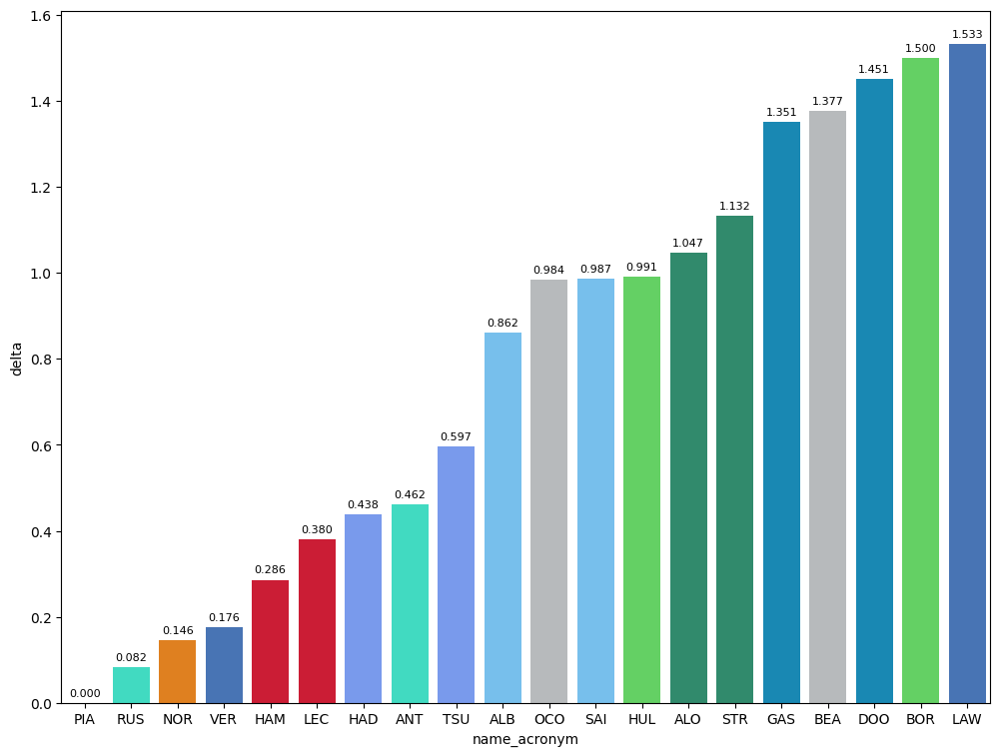

In [338]:
dt = jointables.sort_values(by=['fastest_lap'],ascending=True)
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Speed trap
Mercedes, Sauber and Red Bull were the fastest on the speed trap so it seems that it was set up for straights

#### Maximum speed per drivers

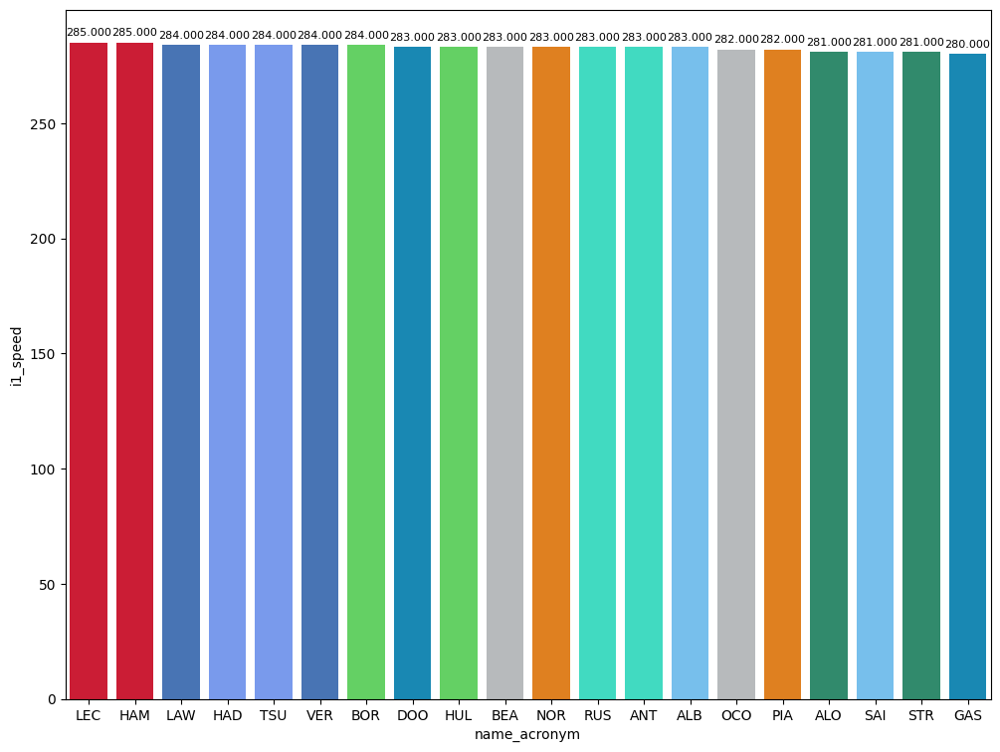

In [339]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

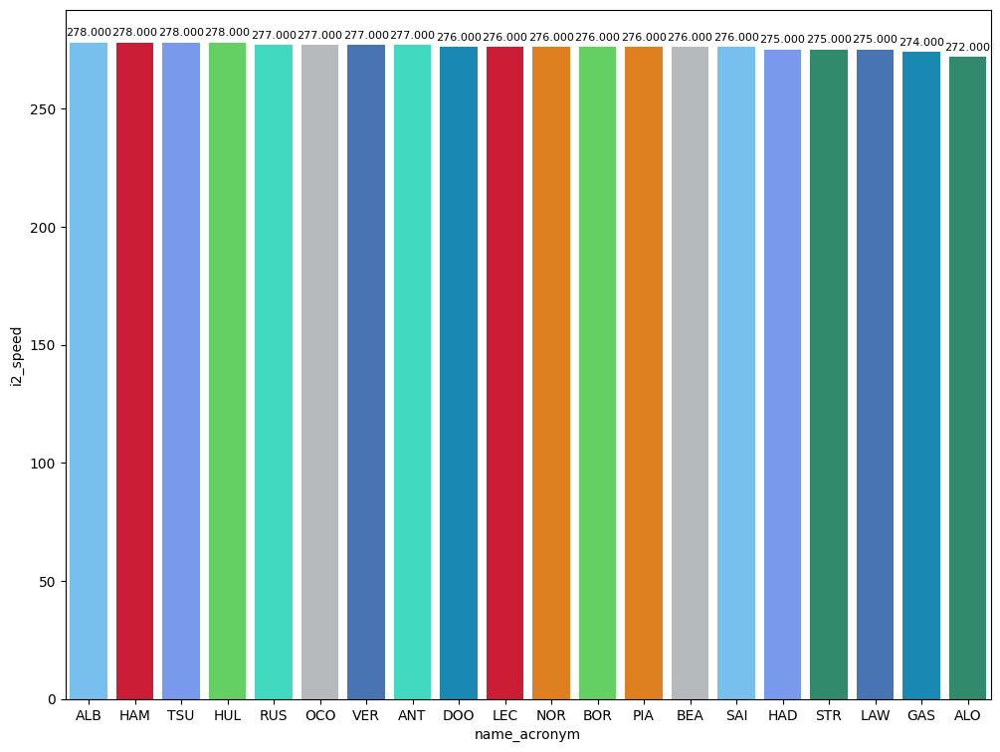

In [340]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

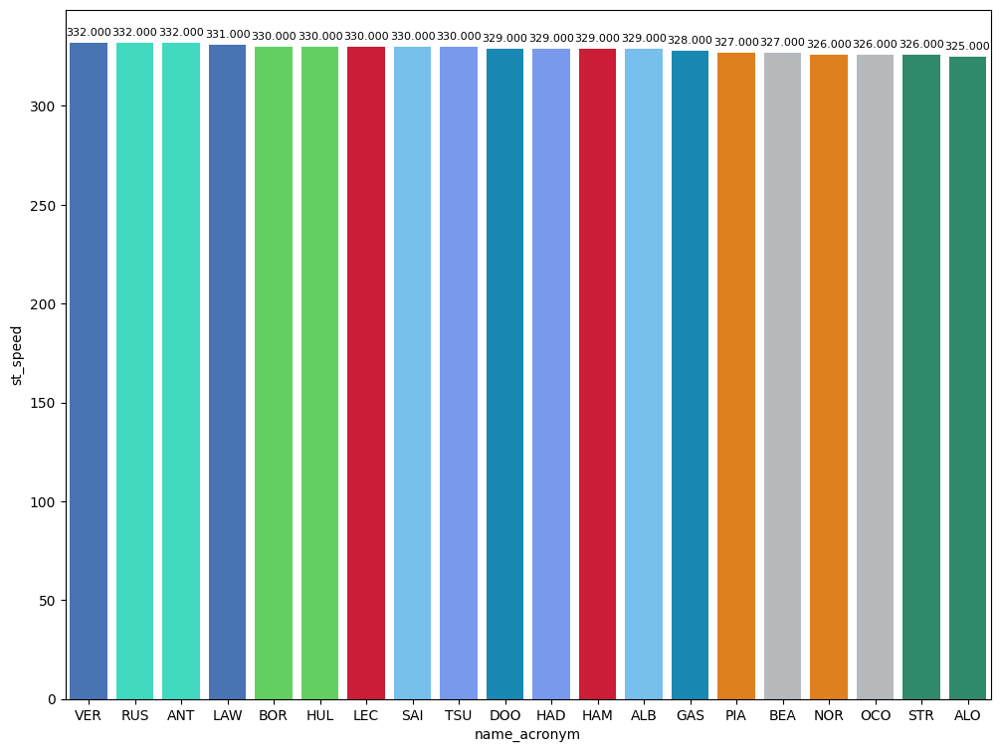

In [341]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

### Maximum speed per teams

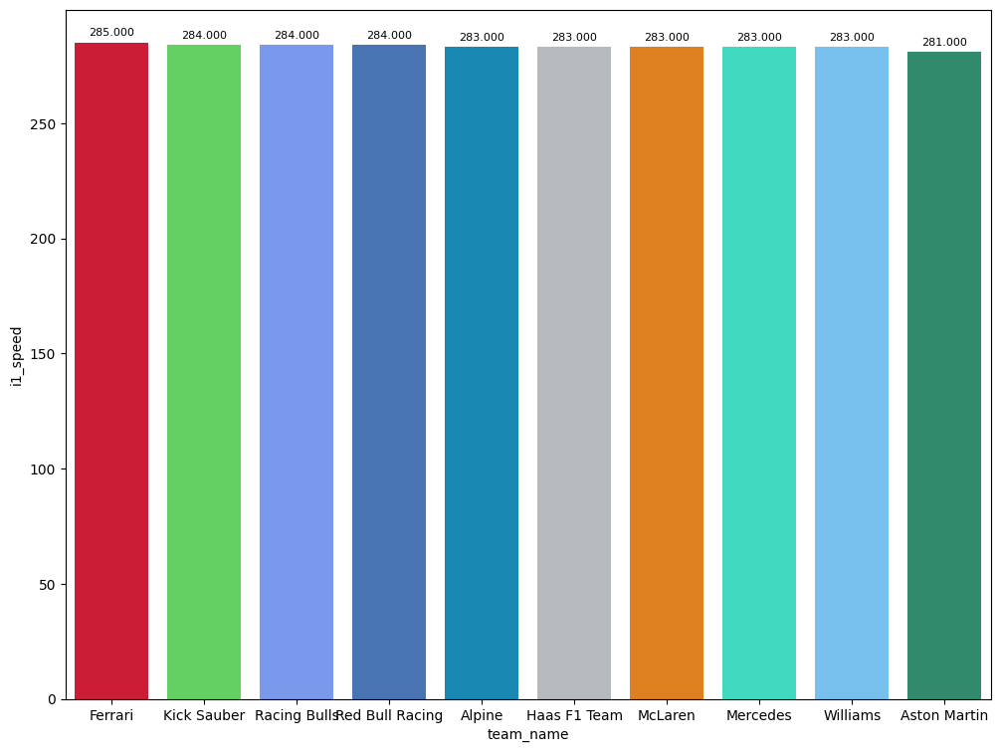

In [342]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i1_speed",top_speed)

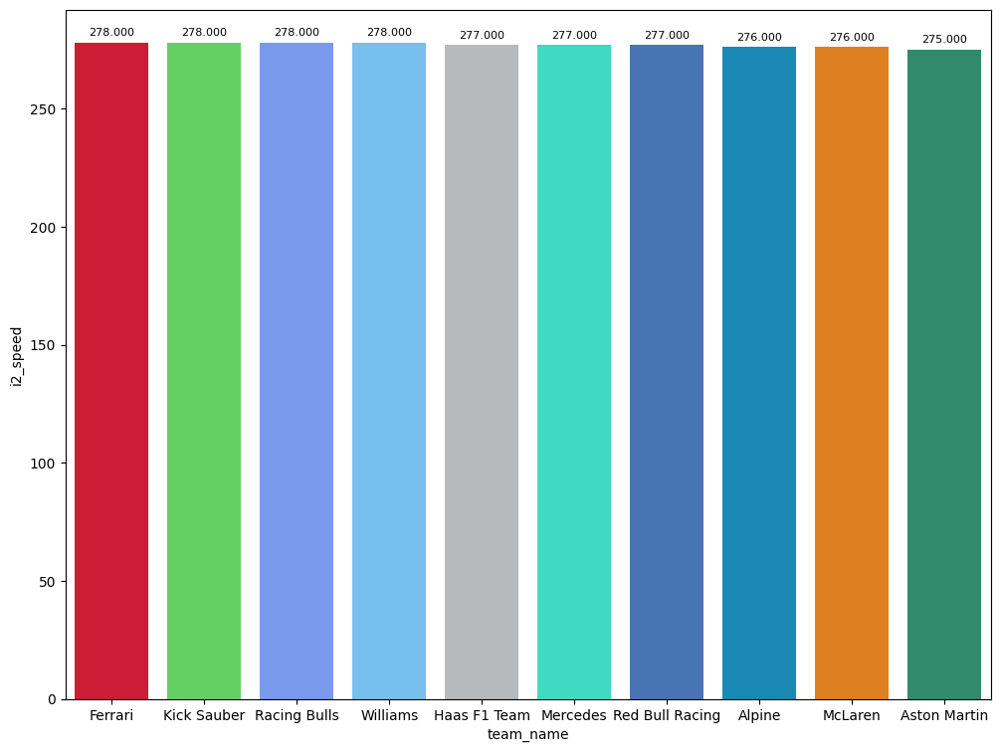

In [343]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i2_speed",top_speed)

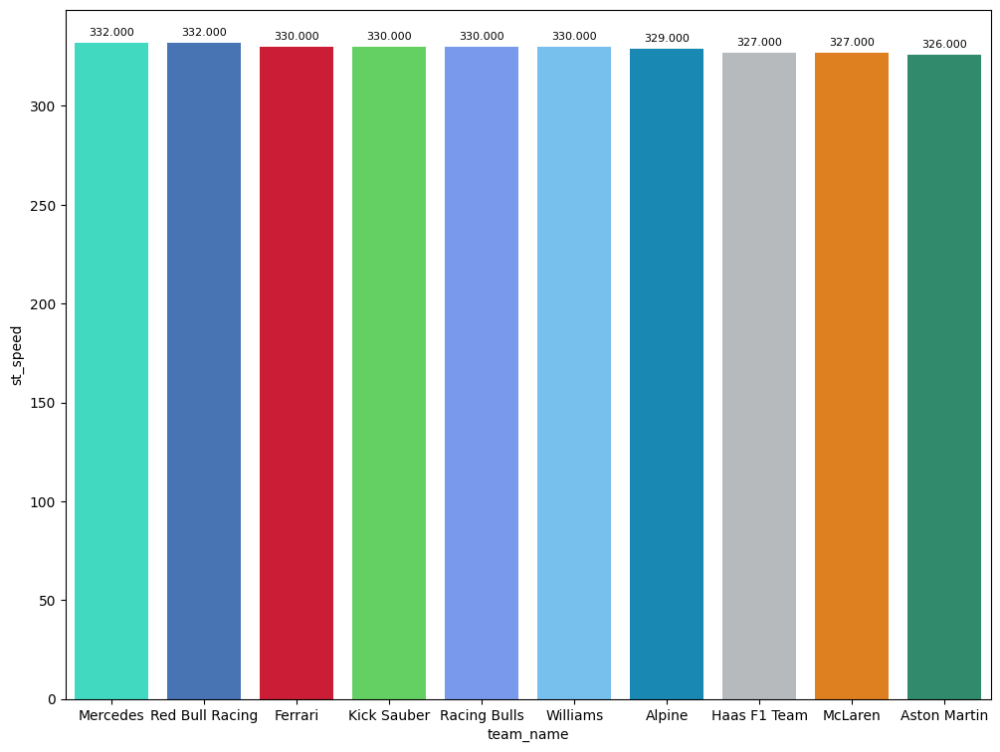

In [344]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","st_speed",top_speed)

In [347]:
mergequaly = pd.merge(competitiveLaps,drivers,on=['driver_number'])

In order to know when each session finished, race control dataset will be consulted.

In [348]:
maximumDateQ1 = "date_start <'2025-03-22T07:25:00+00:00'"
maximumDateQ2 = "date_start <'2025-03-22T07:48:00+00:00' and date_start >'2025-03-22T07:25:00+00:00'"
maximumDateQ3 = "date_start >'2025-03-22T07:48:00+00:00'"

### Qualyfing 1

In [389]:
q1Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ1).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will do a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [390]:
#Reference
P15 = q1Data[14:15]

In [391]:
print(
"Driver:",P15.full_name.to_string(index=False),
"Sector 1: ",P15.duration_sector_1.to_string(index=False),
"Sector 2: ",P15.duration_sector_2.to_string(index=False),
"Sector 3: ",P15.duration_sector_3.to_string(index=False)
)

Driver: Lance STROLL Sector 1:  24.267 Sector 2:  27.617 Sector 3:  40.039


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
Up to sector 3, Gasly was in Q2. If his third sector would have been as his first attemp he would have entered in Q2 finishing P13. Bearman lost 1 tenth in sector 1 that it coudl help hin to reach Q2.Hulkenberg was able to enter to Q2 thanks to the configurqation centered on the straights.

In [392]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[15::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,10,0.069,-0.139,-0.016,0.224,GAS
1,87,0.095,0.160,-0.018,-0.047,BEA
2,7,0.169,0.140,0.038,-0.009,DOO
3,5,0.218,0.249,-0.100,0.069,BOR
4,30,0.251,0.255,0.005,-0.009,LAW


/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: Futur

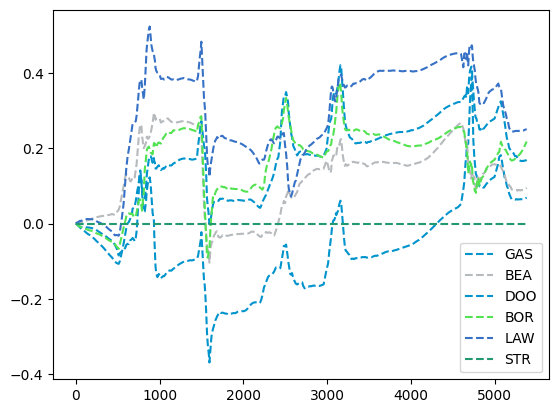

In [393]:
libraryDataF1.draw_gap(P15,15,20,q1Data,drivers,session)

##### Analysis with the drivers that finished better than the driver at risk


In [394]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[0:14].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,4,-0.940,-0.301,-0.269,-0.370,NOR
1,6,-0.761,-0.033,-0.349,-0.379,HAD
2,22,-0.685,0.009,-0.414,-0.280,TSU
3,63,-0.628,-0.080,-0.249,-0.299,RUS
4,1,-0.499,-0.011,-0.112,-0.376,VER
5,23,-0.420,-0.030,-0.140,-0.250,ALB
6,16,-0.344,0.072,-0.103,-0.313,LEC
7,81,-0.332,-0.091,-0.175,-0.066,PIA
8,55,-0.295,0.022,-0.137,-0.180,SAI
9,12,-0.247,-0.088,0.073,-0.232,ANT


#### Best sector per driver(fastest lap)
Sector 1: If Bortoleto had been as fast as his best first sector he could have passed to Q2.
Sector 2: Second sector was horrible for Aston, not improving their ideal sector in Q1.
Sector 3:Gasly would have passed to Q2 but his last sector was horrible.

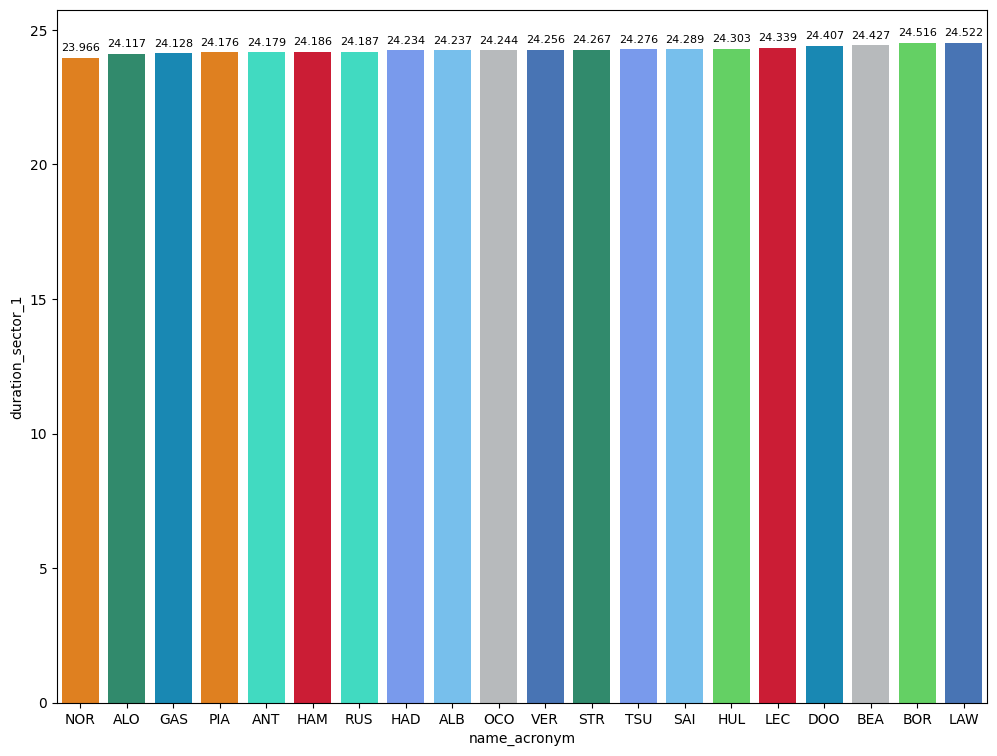

In [457]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q1Data.sort_values(by=['duration_sector_1'],ascending=True))

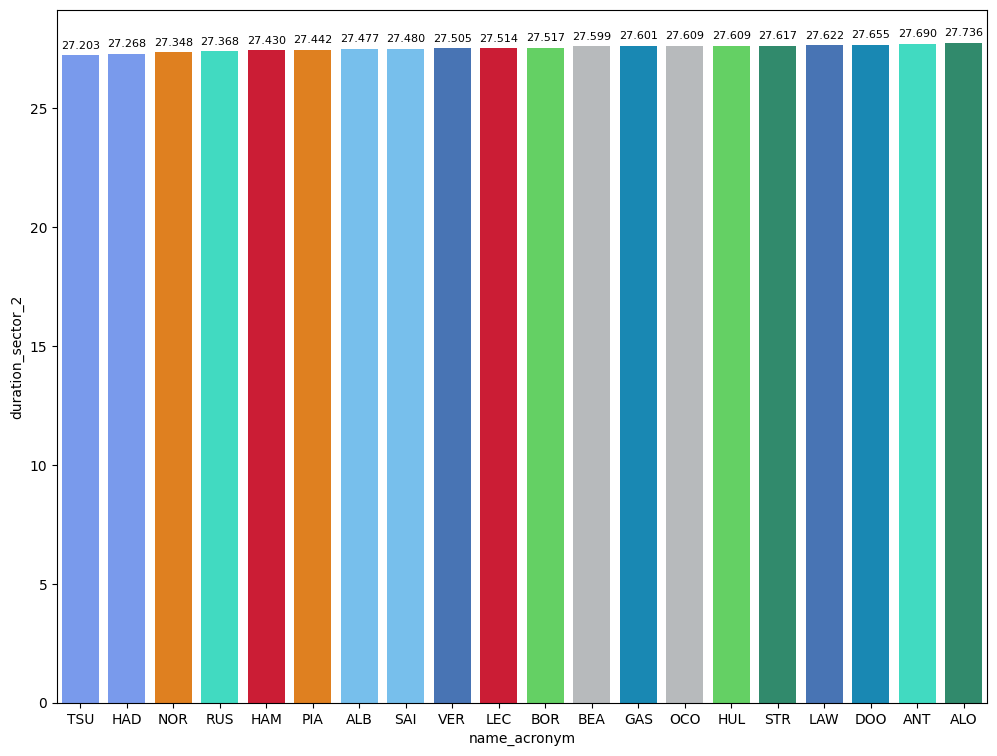

In [458]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q1Data.sort_values(by=['duration_sector_2'],ascending=True))

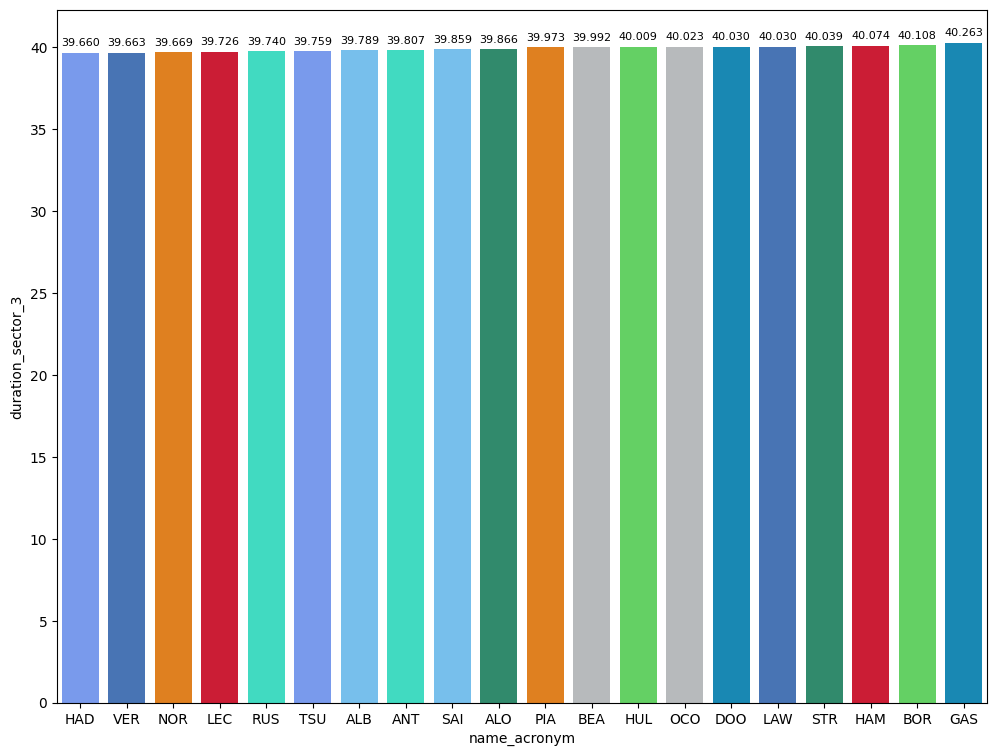

In [459]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q1Data.sort_values(by=['duration_sector_3'],ascending=True))

#### Sectors in their best laptime
Sector 1:Mercedes had a good pace and RB and Williams had a close battle in this sector.Verstappen did not do a second attemp and due to the track evolution, he is in the middle.
Sector 2:Aston had some troubles here being the slowest team in this sector.Also,Haas and Alpine were slow being the reason why BEA and both Alpine were knocked-out.
Sector 3: Gasly had a good pace in the first sector and second but the last was horrible due to traffic. He would have passed to Q2.

In [420]:
data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ1)
sector1_best = data.sort_values(by='duration_sector_1', ascending=True).drop_duplicates(subset=['name_acronym'],keep='first')
sector2_best = data.sort_values(by='duration_sector_2', ascending=True).drop_duplicates(subset=['name_acronym'],keep='first')
sector3_best = data.sort_values(by='duration_sector_3', ascending=True).drop_duplicates(subset=['name_acronym'],keep='first')

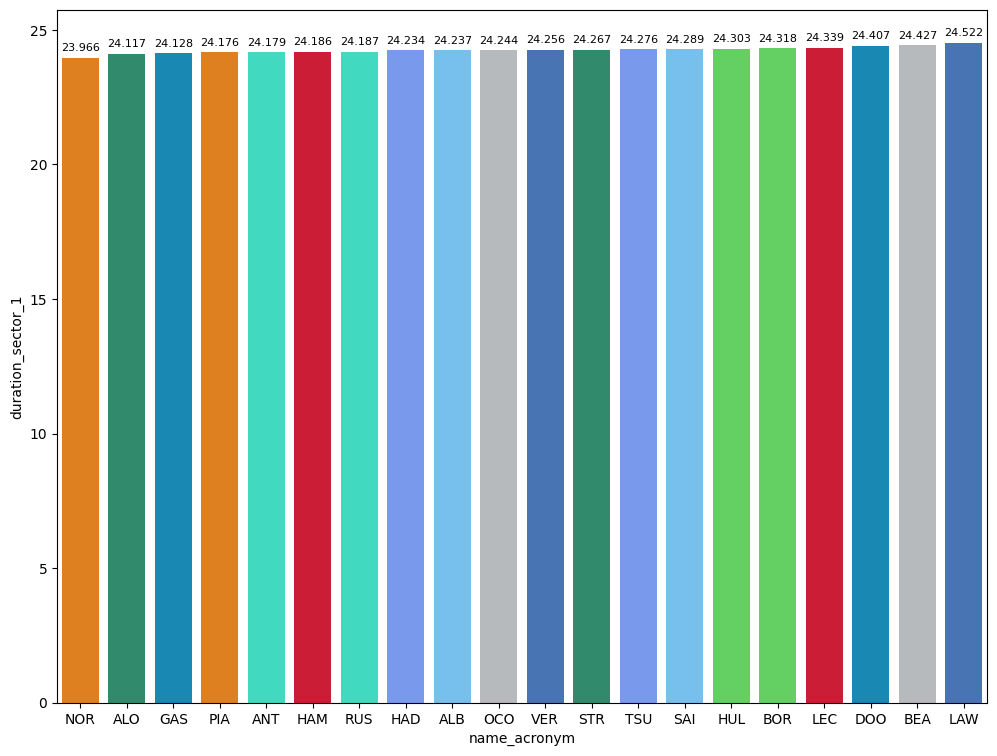

In [421]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sector1_best)

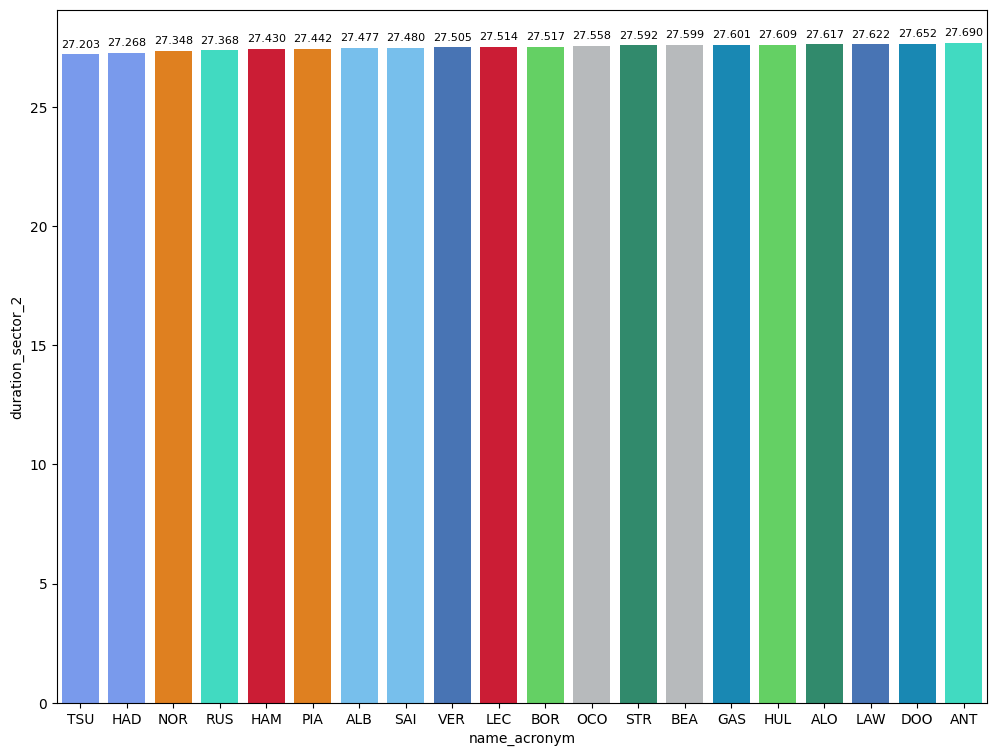

In [422]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sector2_best)

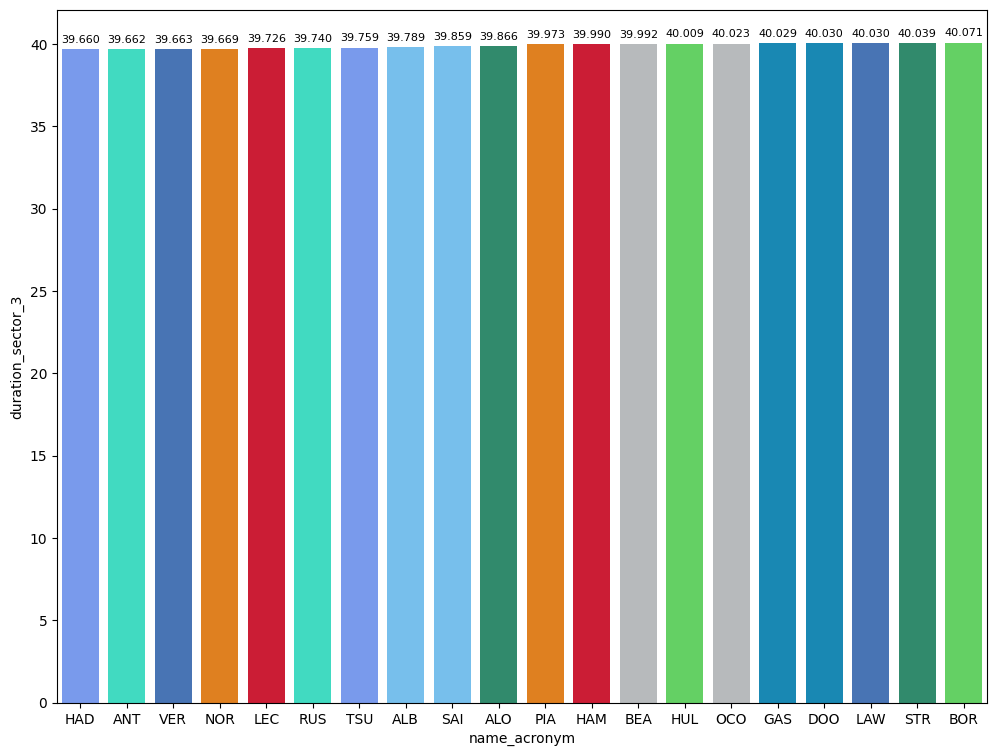

In [423]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sector3_best)

### Qualyfing 2

In [479]:
q2Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ2).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [480]:
#Reference
P10 = q2Data[9:10]
print(
"Driver:",P10.full_name.to_string(index=False),
"Sector 1: ",P10.duration_sector_1.to_string(index=False),
"Sector 2: ",P10.duration_sector_2.to_string(index=False),
"Sector 3: ",P10.duration_sector_3.to_string(index=False)
)

Driver: Alexander ALBON Sector 1:  24.174 Sector 2:  27.498 Sector 3:  39.923


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
Ocon and Hulkenberg were slower than Albon in the first sector who were crucial to pass. In S2 and S3 gain some advantage but it was not enough to pass.
On the other hand, Alonso were faster but the performance of Aston was poor in S2 and ,mainly,in S3.


In [481]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[10::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,31,0.030,0.072,-0.009,-0.033,OCO
1,27,0.037,0.082,-0.017,-0.028,HUL
2,14,0.093,-0.107,0.062,0.138,ALO
3,18,0.178,0.093,-0.107,0.192,STR
4,55,0.245,0.057,0.002,0.186,SAI


/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: Futur

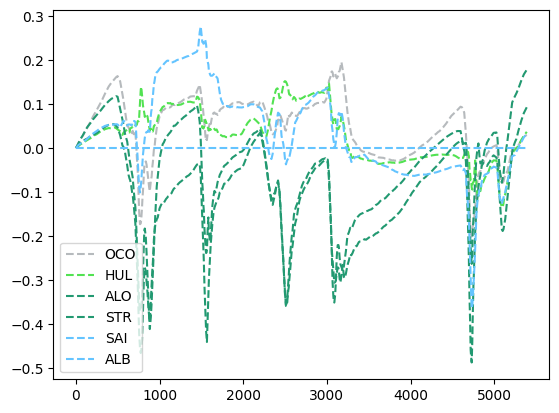

In [482]:
libraryDataF1.draw_gap(P10,10,15,q2Data,drivers,session)

##### Analysis with the drivers that finished better than the driver at risk
I bring this section in order to know where the driver at risk lost his chances to improve in the qualyfing.
Hamilton was in this to his second sector that fixed his bad first sector and Antonelli was in thanks to his last sector that fixed his second sector.


In [483]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[0:9].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,4,-0.808,-0.220,-0.241,-0.347,NOR
1,1,-0.453,-0.006,-0.180,-0.267,VER
2,81,-0.395,0.045,-0.157,-0.283,PIA
3,6,-0.342,-0.047,-0.244,-0.051,HAD
4,22,-0.335,-0.003,-0.229,-0.103,TSU
5,63,-0.288,0.090,-0.086,-0.292,RUS
6,16,-0.145,0.031,-0.083,-0.093,LEC
7,44,-0.094,0.130,-0.246,0.022,HAM
8,12,-0.005,0.097,0.132,-0.234,ANT


#### Best sector per driver
Sector 1:Aston was very competitive here with good sectors and Ferrari struggled a lot almost being costful for Hamilton.
Sector 2: Alonso lost the gained gap in the first sector and it could have been costful for Antonelli and Albon. Incredible RB in the second attemp.
Sector 3: This sector determined the drivers that were knocked out and being a horrible sector for Aston and saving Antonelli to pass to Q3.

In [484]:
data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ2)
sector1_best = data.sort_values(by='duration_sector_1', ascending=True).drop_duplicates(subset=['name_acronym'],keep='first')
sector2_best = data.sort_values(by='duration_sector_2', ascending=True).drop_duplicates(subset=['name_acronym'],keep='first')
sector3_best = data.sort_values(by='duration_sector_3', ascending=True).drop_duplicates(subset=['name_acronym'],keep='first')

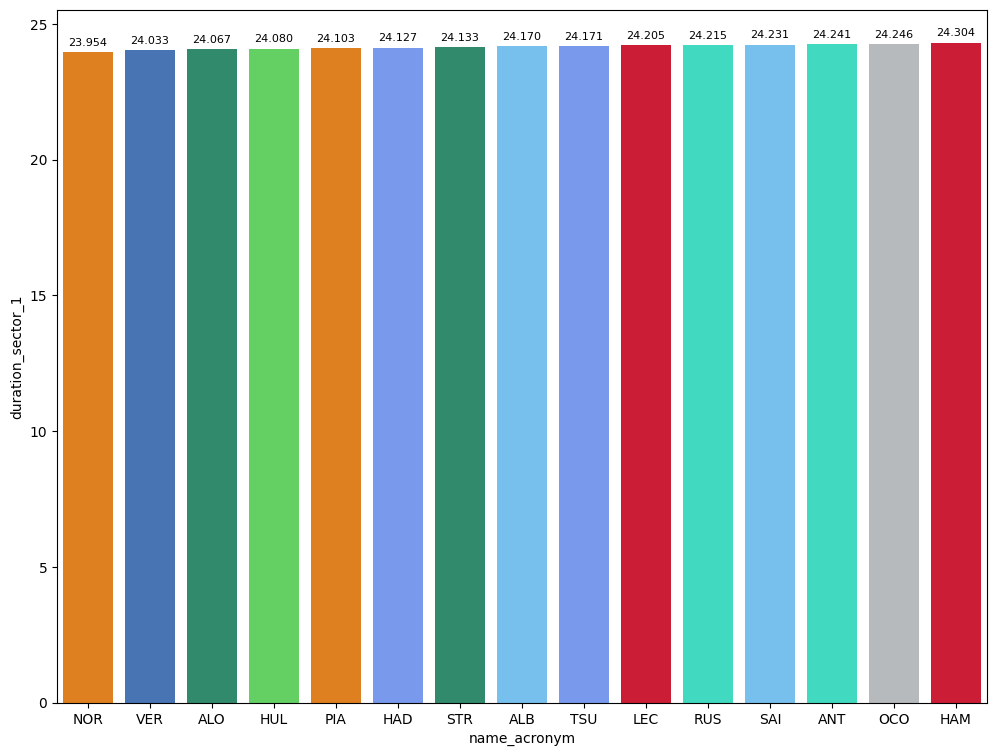

In [485]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sector1_best)

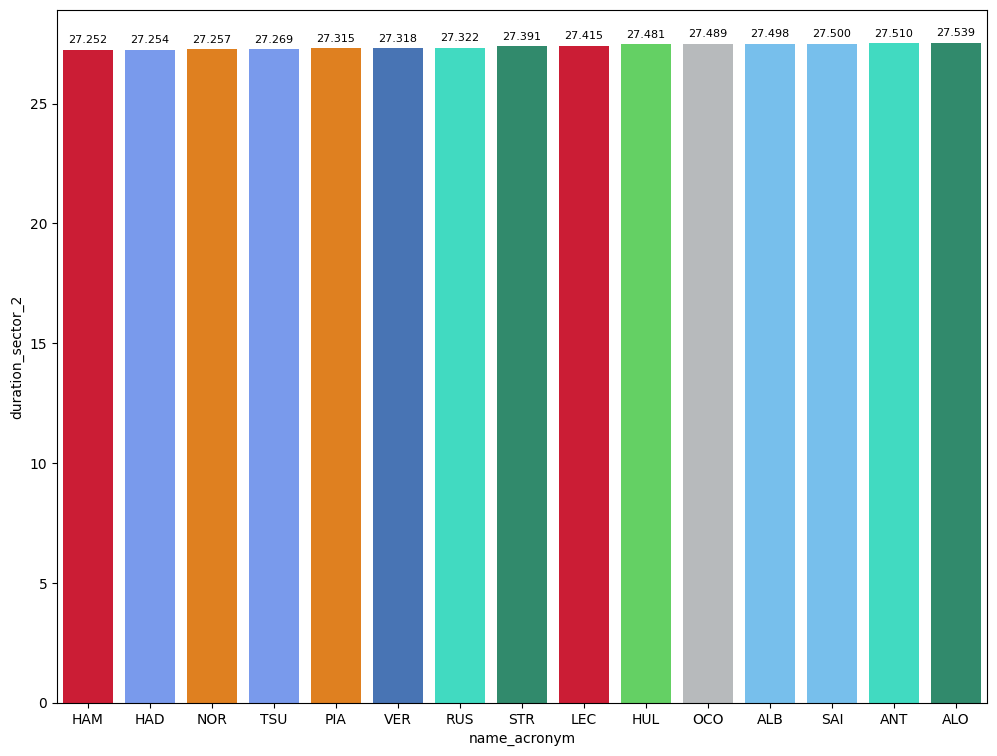

In [486]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sector2_best)

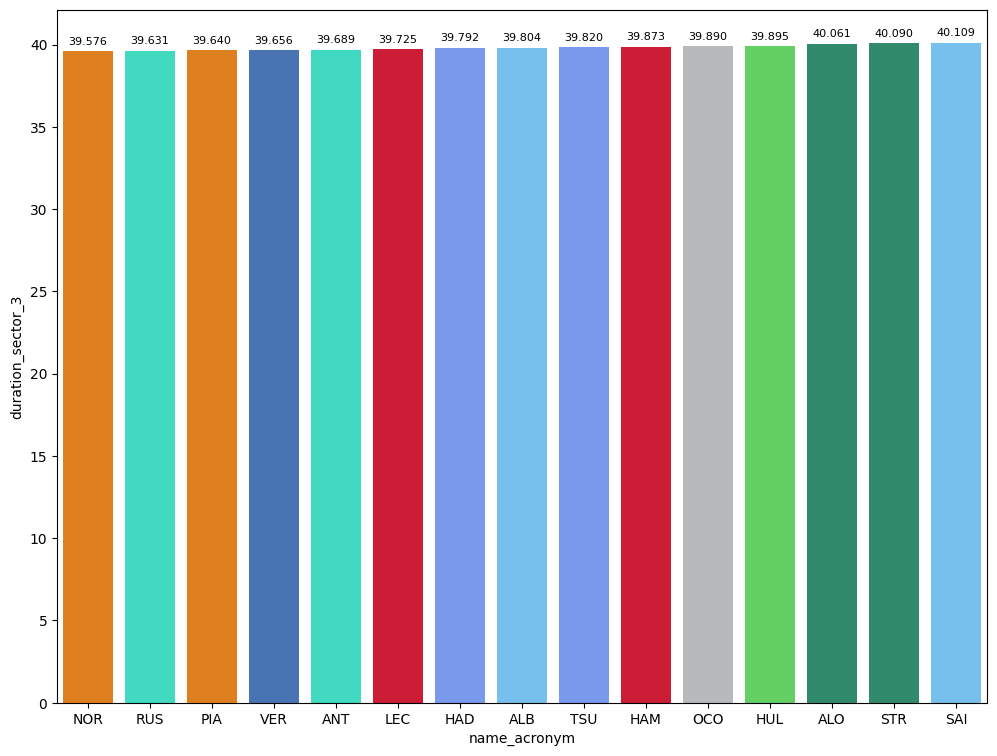

In [487]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sector3_best)

#### Best sector per driver(fastest lap)
Track evolution was not the expected and a lot of drivers were not improved.
Sector 1: If Hulkenberg had been as fast as his best first sector he could have passed to Q2.Alonso was very quick.
Sector 2: Second sector was horrible for Alonso but his best mark wouldn't have been enough to pass to Q2.
Sector 3: Aston suffered a lot in this sector being the slowest here.

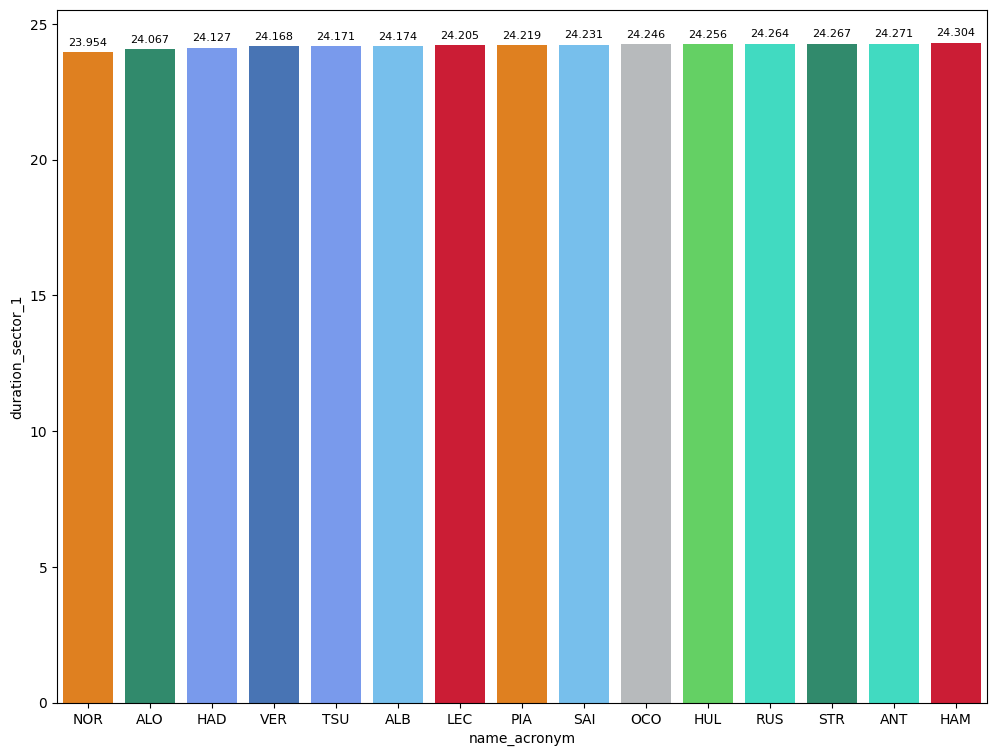

In [488]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q2Data.sort_values(by=['duration_sector_1'],ascending=True))

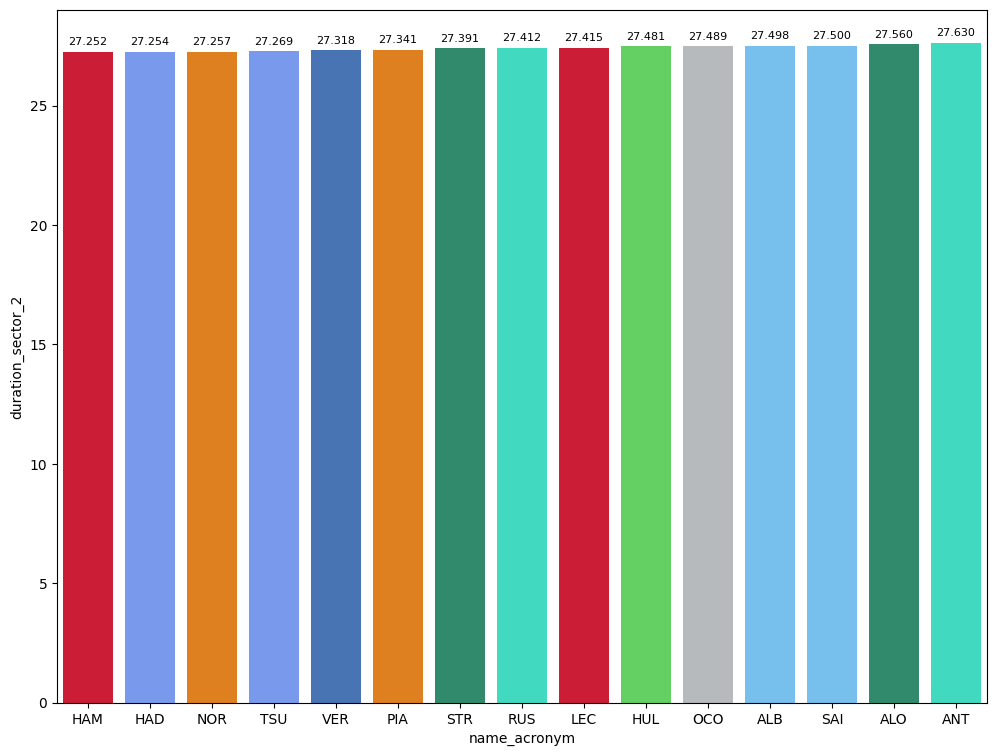

In [489]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q2Data.sort_values(by=['duration_sector_2'],ascending=True))

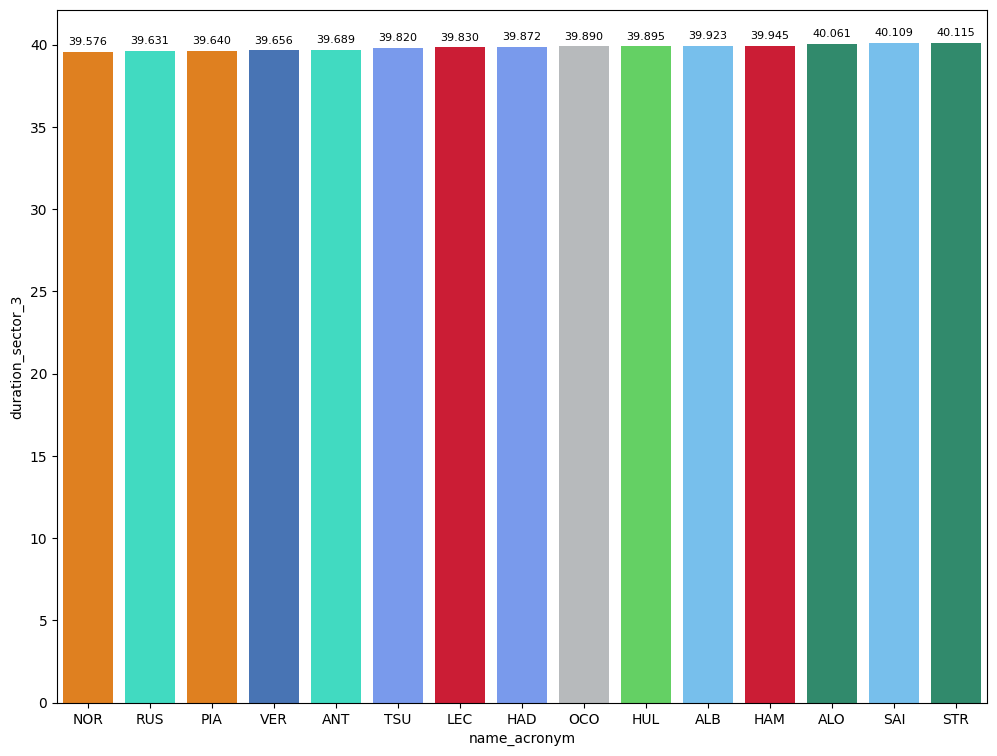

In [490]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q2Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 3

In [517]:
q3Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ3).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with poleman
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [518]:
#Reference
P1 = q3Data[:1]
print(
"Driver:",P1.full_name.to_string(index=False),
"Sector 1: ",P1.duration_sector_1.to_string(index=False),
"Sector 2: ",P1.duration_sector_2.to_string(index=False),
"Sector 3: ",P1.duration_sector_3.to_string(index=False)
)

Driver: Oscar PIASTRI Sector 1:  23.996 Sector 2:  27.227 Sector 3:  39.418


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
Red Bull was dominant in China as we can see in qualyfing.

In [519]:
newdataset2 = pd.DataFrame()
for index,row in q3Data[1::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P1,newdataset2)
newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,63,0.082,0.072,-0.006,0.016,RUS
1,4,0.152,0.034,0.101,0.017,NOR
2,1,0.176,-0.051,0.086,0.141,VER
3,44,0.286,0.152,-0.052,0.186,HAM
4,16,0.380,0.098,0.128,0.154,LEC
5,6,0.438,0.164,-0.014,0.288,HAD
6,12,0.462,0.180,0.074,0.208,ANT
7,22,0.997,0.284,0.300,0.413,TSU
8,23,1.065,0.250,0.427,0.388,ALB


#### Best sector per driver
In this section we can see the best sector of the session
Sector 1: Verstappen broke the McLaren dominance being the fastest in S1 with a close gap among Piastri,Russell and Hamilton
Sector 2: Norris made a mistake due to he should be in Piastri laptime and this helps Russell to take P2.
Sector 3:Russell was very close Piastri's laptime. If he had beaten Piastri, he would have taken the pole. So, the last lap of Piastri was crucial.

In [520]:
data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ3)
sector1_best = data.sort_values(by='duration_sector_1', ascending=True).drop_duplicates(subset=['name_acronym'],keep='first')
sector2_best = data.sort_values(by='duration_sector_2', ascending=True).drop_duplicates(subset=['name_acronym'],keep='first')
sector3_best = data.sort_values(by='duration_sector_3', ascending=True).drop_duplicates(subset=['name_acronym'],keep='first')

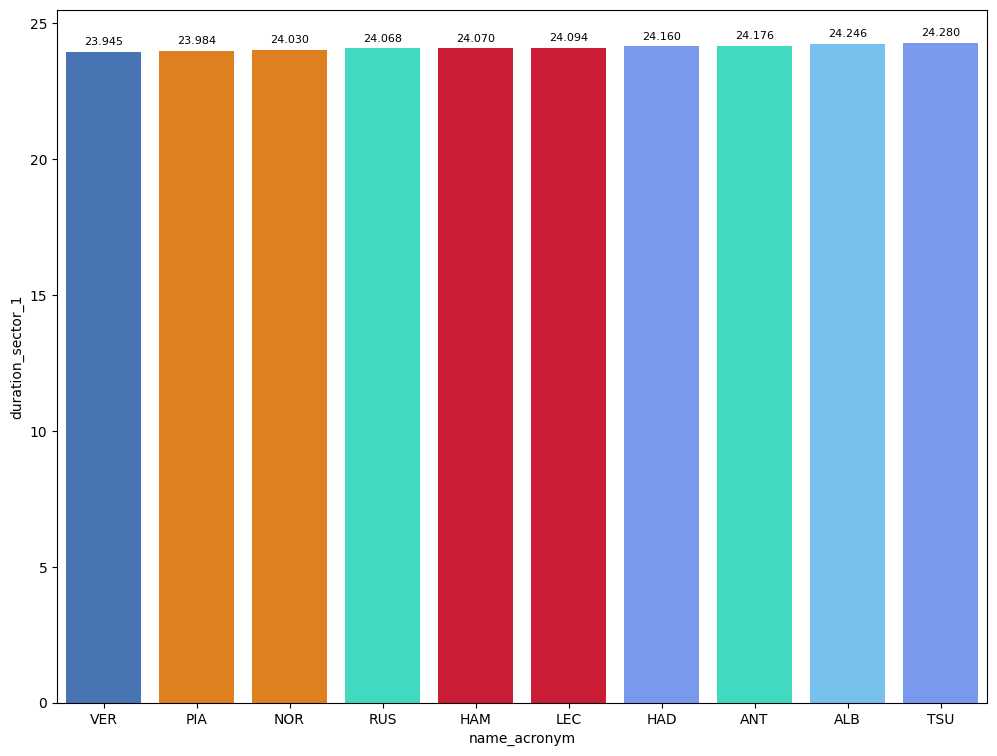

In [521]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sector1_best)

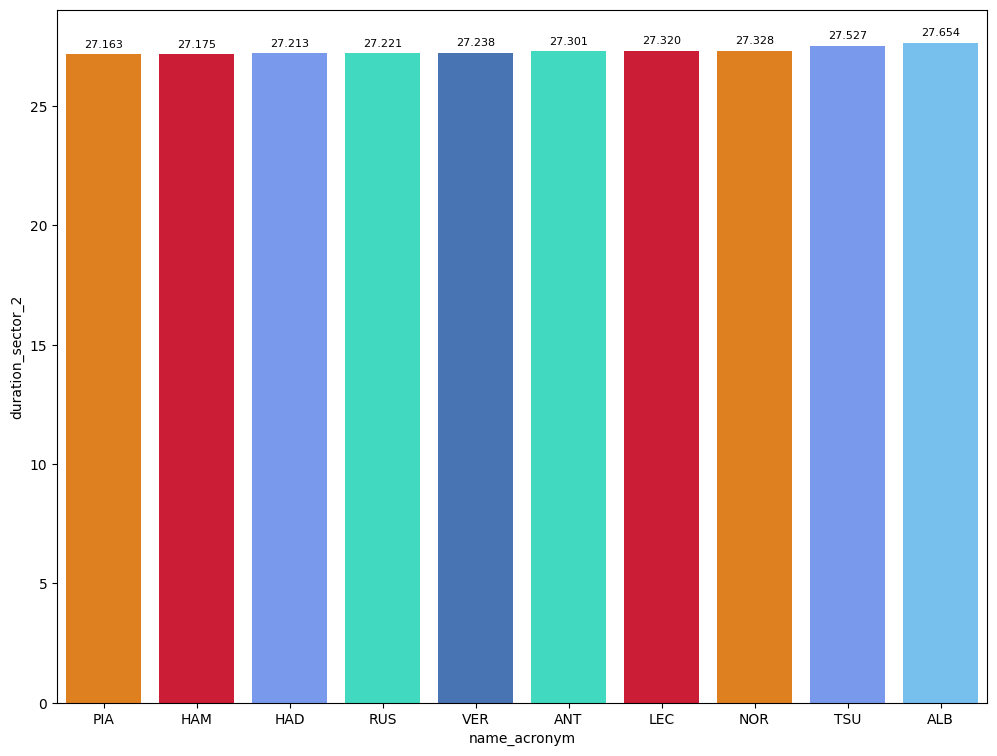

In [522]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sector2_best)

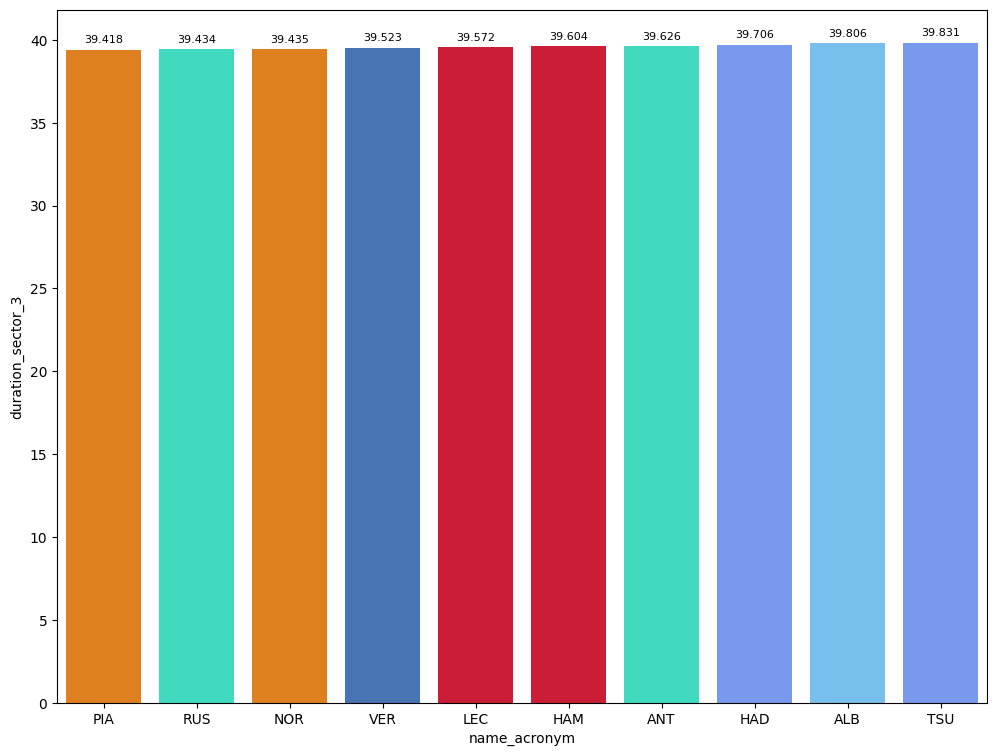

In [523]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sector3_best)

#### Best sector per driver(fastest lap)
Sector 1: There are no changes compared to the best sector 1 section.
Sector 2: Hamilton is the fastest but not the fastest of Q3 who were Piastri.
Sector 3:  There are no changes compared to the best sector 3 section.

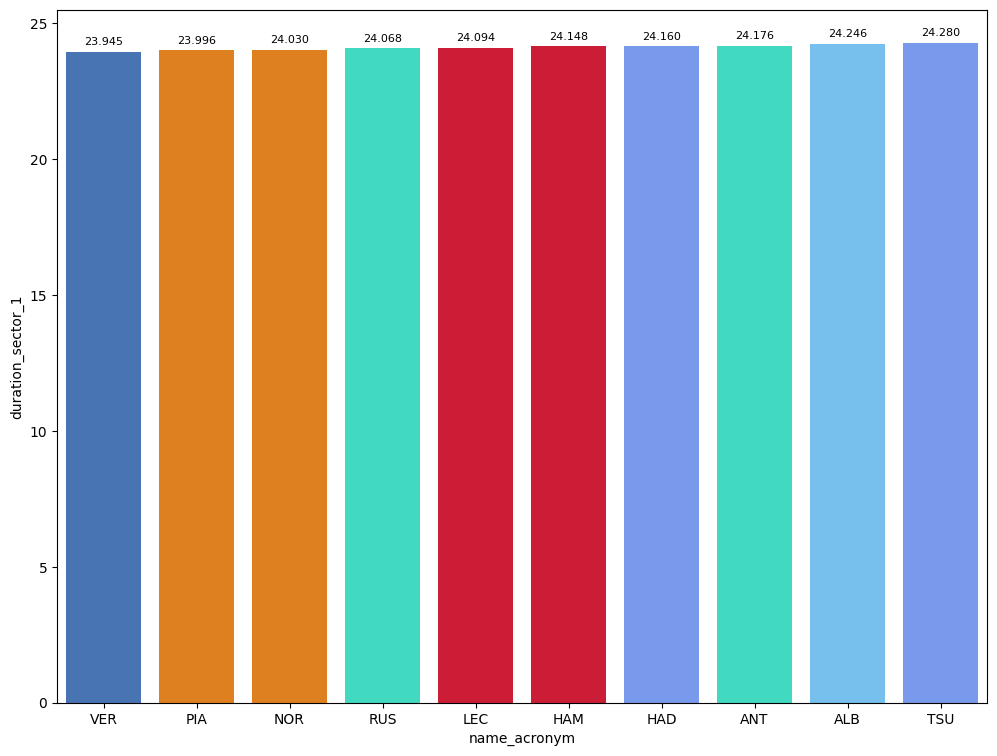

In [524]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q3Data.sort_values(by=['duration_sector_1'],ascending=True))

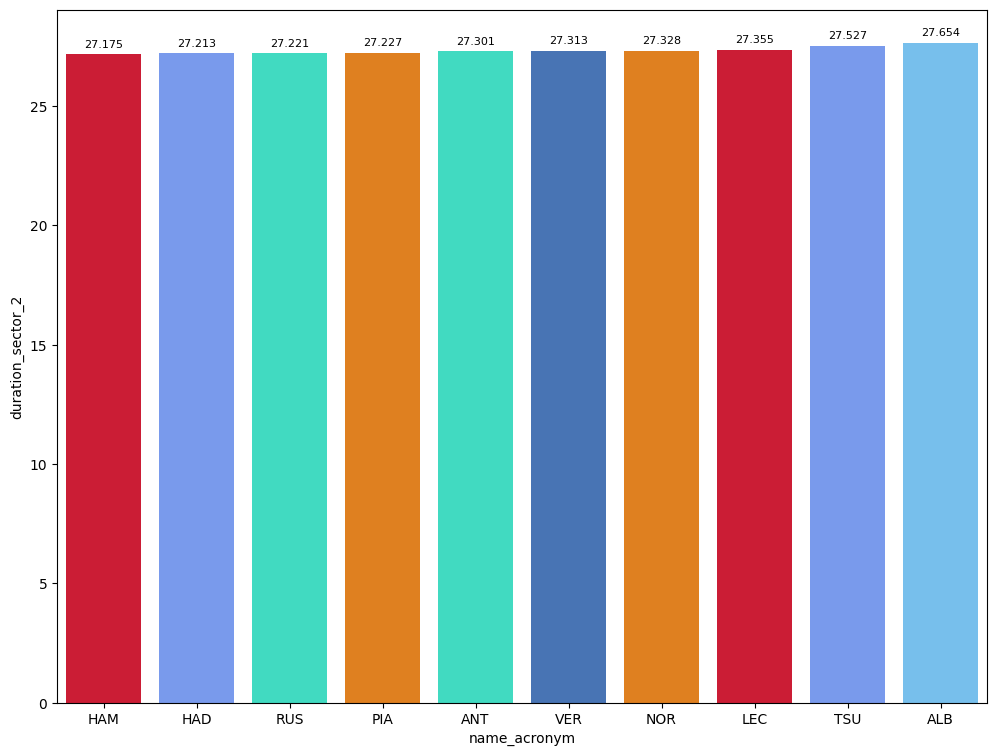

In [525]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q3Data.sort_values(by=['duration_sector_2'],ascending=True))

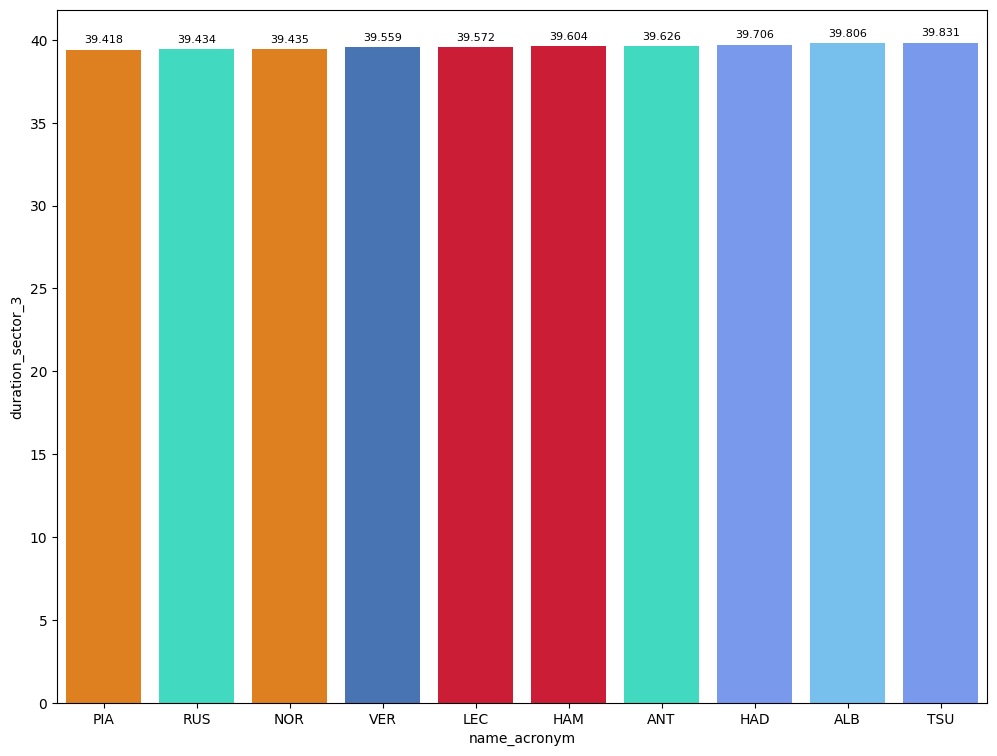

In [526]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q3Data.sort_values(by=['duration_sector_3'],ascending=True))

#### Best sector per driver of the session (in general)

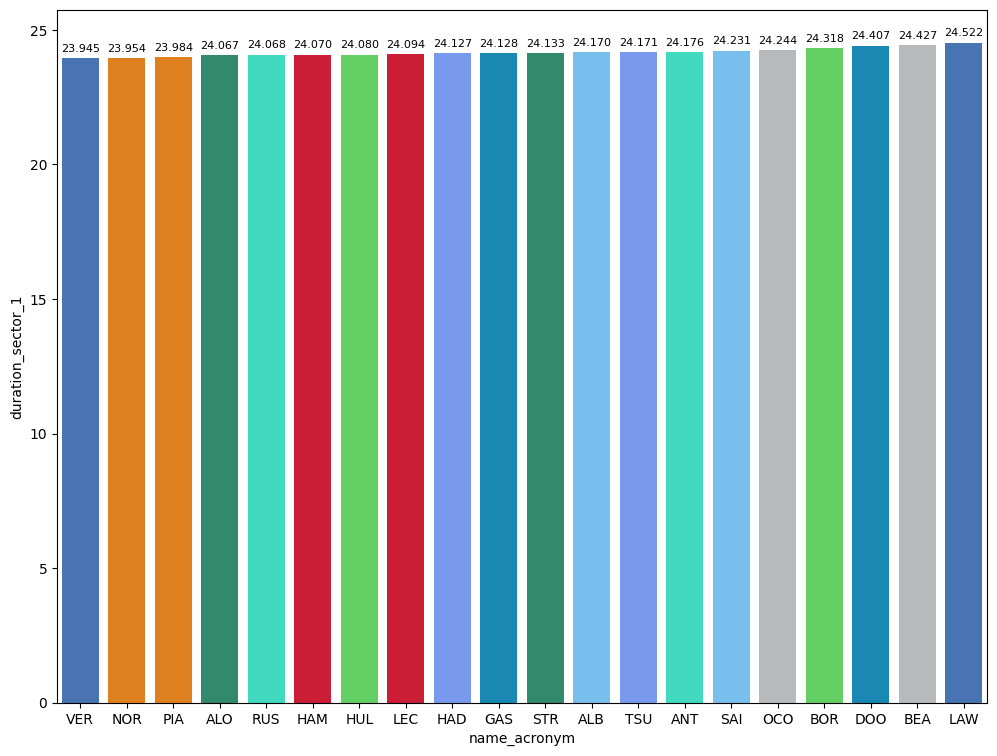

In [527]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_1'].min().sort_values(ascending=True)).reset_index())

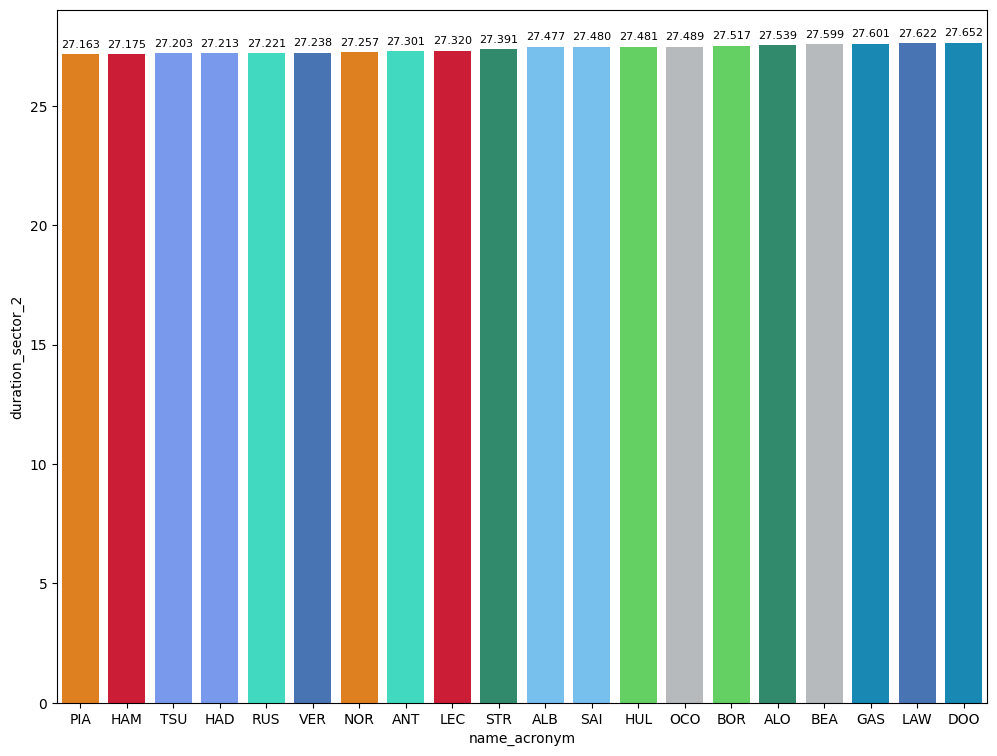

In [528]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_2'].min().sort_values(ascending=True)).reset_index())

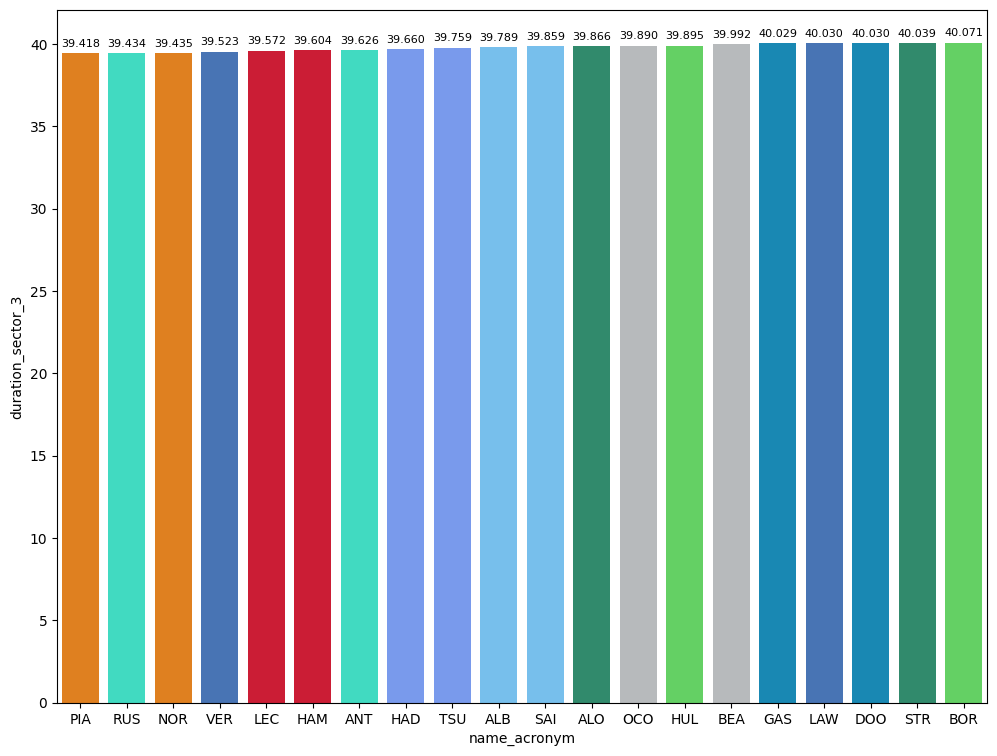

In [529]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_3'].min().sort_values(ascending=True)).reset_index())

### Comparaison between the poleman and the second

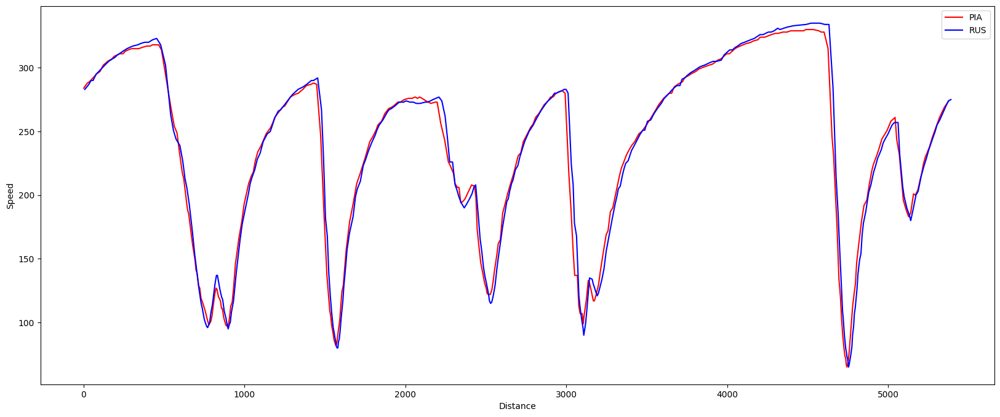

In [449]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

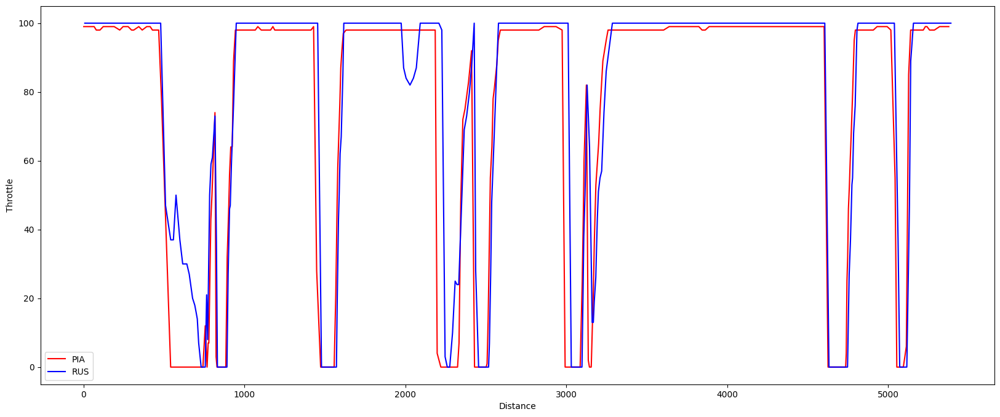

In [450]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

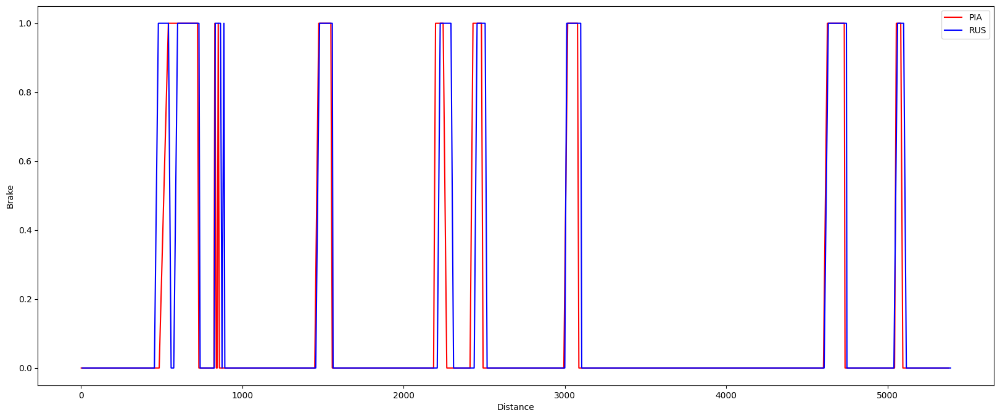

In [451]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

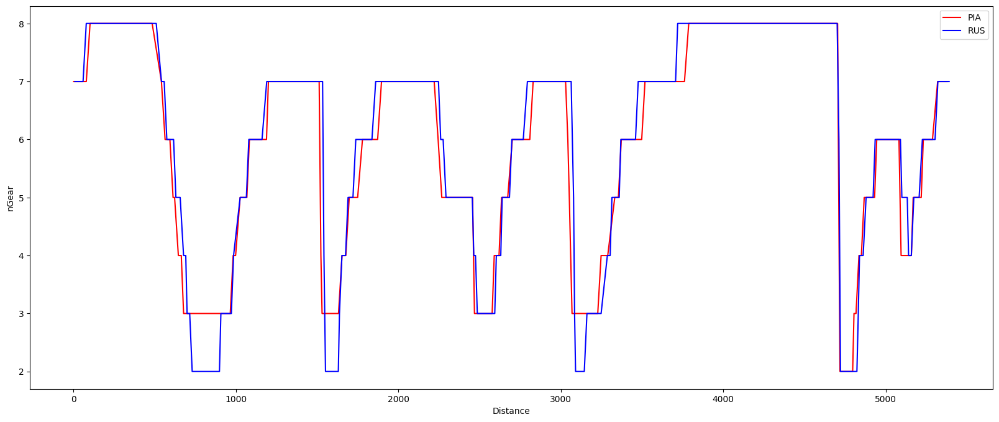

In [452]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Race
### Obtain setup

In [ ]:
race = libraryDataF1.obtain_information('laps',session_key=9673)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9673)
drivers = libraryDataF1.obtain_information('drivers',session_key=9673)

In [ ]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)

In [ ]:
raceLaps = race.query("is_pit_out_lap == False")
jointables = pd.merge(raceLaps,stintsDataFrame,on=['lap_number','driver_number'])

### Mean pace with the different compound used on the session

In [ ]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <=105").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

### Speed trap

In [ ]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

In [ ]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

In [ ]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Race pace
General explanation
Explanation per teams

In [ ]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <=105").dropna().groupby("team_name")['lap_duration'].mean().sort_values(ascending=True))
race_pace

#### Mean race pace per sector
In this section, we can see the pace shown per each team in each sector sorted ascending.

#### Sector 1
General explanation

In [ ]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <=105").dropna().groupby("team_name")['duration_sector_1'].mean().sort_values(ascending=True))
race_pace

#### Sector 2
General explanation

In [ ]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <=105").dropna().groupby("team_name")['duration_sector_2'].mean().sort_values(ascending=True))
race_pace

#### Sector 3
General explanation

In [ ]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <=105").dropna().groupby("team_name")['duration_sector_3'].mean().sort_values(ascending=True))
race_pace

### Long runs

In [ ]:
MINIMUN_SECONDS = 94
MAXIMUM_SECONDS = 105

#### Red Bull Racing

In [ ]:
stintInformation.query('driver_number == 1 or driver_number == 11')

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,11,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [ ]:
stintInformation.query('driver_number == 55 or driver_number == 16')

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,55,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [ ]:
stintInformation.query('driver_number == 63 or driver_number == 44')

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,44,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [ ]:
stintInformation.query('driver_number == 81 or driver_number == 4')

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [ ]:
stintInformation.query('driver_number == 18 or driver_number == 14')

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [ ]:
stintInformation.query('driver_number == 3 or driver_number == 22')

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,3,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,22,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [ ]:
stintInformation.query('driver_number == 20 or driver_number == 27')

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,20,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,27,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [ ]:
stintInformation.query('driver_number == 10 or driver_number == 31')

In [ ]:
data =libraryDataF1.getinfolongruns(jointables,31,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [ ]:
stintInformation.query('driver_number == 2 or driver_number == 23')

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data= libraryDataF1.getinfolongruns(jointables,2,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [ ]:
stintInformation.query('driver_number == 24 or driver_number == 77')

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,24,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables,77,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

### Pits
Before to finish the analysis, I added the Pits sections where it can see how much time teams spent in the box.

In [ ]:
pit = libraryDataF1.obtain_information('pit',session_key=9673)

In [ ]:
jointables = pd.merge(drivers,pit,on=['driver_number']).query("pit_duration<120")
jointables
pit_duration = pd.DataFrame(jointables.groupby('team_name')['pit_duration'].mean().sort_values(ascending=True))
pit_duration